# import libraries

In [45]:
import torch ,pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import  make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt


In [46]:
def show(tensor,ch=1,size=(28,28),n=16):

    data=tensor.detach().cpu().view(-1,ch,*size)

    grid=make_grid(data[:n],nrow=4).permute(1,2,0)
    plt.imshow(grid)
    plt.show()





In [61]:
device='cuda'

epochs=500
batch_size=128
lr=0.00001

mean_dis_loss=0
mean_gen_loss=0
cur_step=0
info_step=300
z_dim=64

loss_func= nn.BCEWithLogitsLoss()


dataset=MNIST(root='.', download=True, transform=transforms.ToTensor())

dataloader= DataLoader( dataset ,shuffle=True,batch_size=batch_size)


In [48]:

def genBlock(inp,op):
    return nn.Sequential(

          nn.Linear(inp,op),
          nn.BatchNorm1d(op)   ,
          nn.ReLU(inplace=True)
    )


class Generator(nn.Module):
    def __init__(self,z_dim=64,i_dim=784,h_dim=128):

        super().__init__()

        self.gen= nn.Sequential(

                genBlock(z_dim,h_dim),
                genBlock(h_dim,h_dim*2),
                genBlock(h_dim*2,h_dim*4),
                genBlock(h_dim*4,h_dim*8),
                nn.Linear(h_dim*8,i_dim),
                nn.Sigmoid()



        )


    def forward(self,noise):
        return self.gen(noise)

def gen_noise(n,z_dim):
    return torch.randn(n,z_dim).to(device)

In [49]:
def disBlock(inp,op):
    return nn.Sequential(

          nn.Linear(inp,op),
          nn.LeakyReLU(0.2)
    )



class Discriminator(nn.Module):
    def __init__(self,i_dim=784,h_dim=128):

        super().__init__()

        self.disc= nn.Sequential(

                disBlock(i_dim,h_dim*4),
                disBlock(h_dim*4,h_dim*2),
                disBlock(h_dim*2,h_dim),
                nn.Linear(h_dim,1)


        )


    def forward(self,img):
        return self.disc(img)

In [50]:
gen =Generator(z_dim).to(device)
gen_opt=torch.optim.Adam(gen.parameters(),lr=lr)

disc=Discriminator().to(device)
disc_opt=torch.optim.Adam(disc.parameters(),lr=lr)


In [51]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [52]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=128, out_features=1, bias=True)
  )
)

In [53]:
x,y=next(iter(dataloader))
print(x.shape,y.shape)


torch.Size([128, 1, 28, 28]) torch.Size([128])


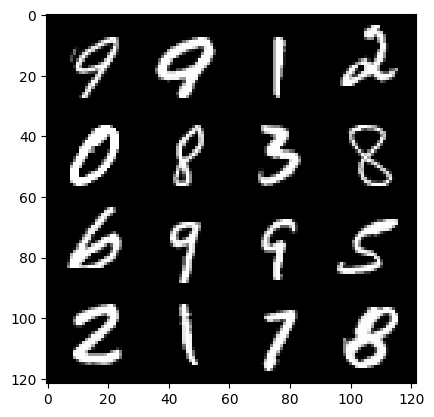

In [54]:
show(x)

In [55]:
noise=gen_noise(batch_size,z_dim)
noise.shape


torch.Size([128, 64])

In [56]:
fake=gen(noise)
fake.shape

torch.Size([128, 784])

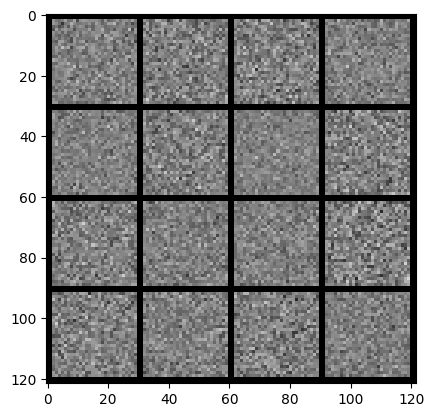

In [57]:
show(fake)

In [58]:
def cal_gen_loss (loss_func,gen,disc,n,z_dim):
    noise=gen_noise(n,z_dim)
    fake= gen(noise)
    pred= disc(fake)
    targets=torch.ones_like(pred)
    gen_loss= loss_func(pred,targets)

    return gen_loss


In [59]:
def cal_dis_loss (loss_func,gen,disc,n,real,z_dim):
    noise=gen_noise(n,z_dim)
    fake= gen(noise)

    pred= disc(fake.detach())
    targets=torch.zeros_like(pred)

    # print(pred.shape)
    # print(targets.shape)


    disc_fake_loss= loss_func(pred,targets)



    disc_real=disc(real)
    disc_real_targets=torch.ones_like(disc_real)

    # print(disc_real.shape)
    # print(disc_real_targets.shape)
    disc_real_loss= loss_func(disc_real,disc_real_targets)

    disc_loss=(disc_fake_loss +disc_real_loss)/2



    return disc_loss


  0%|          | 0/469 [00:00<?, ?it/s]

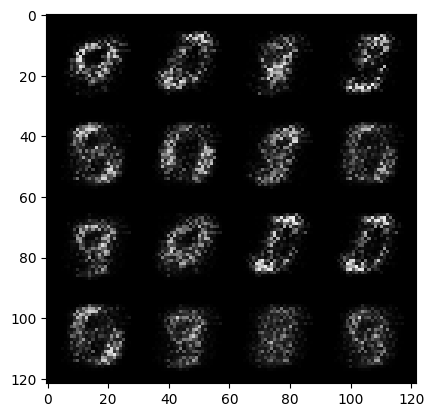

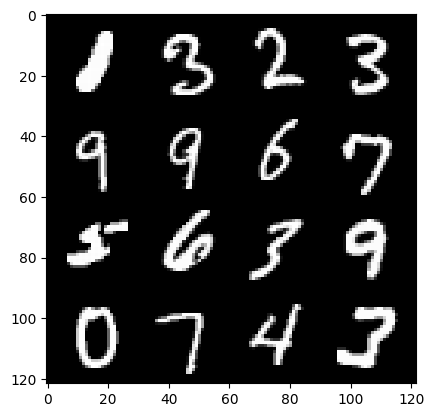

epoch : 0 , step :300 , mean-disc-loss:  0.18301820581158004 , mean-gen-loss 1.8500418821970626


  0%|          | 0/469 [00:00<?, ?it/s]

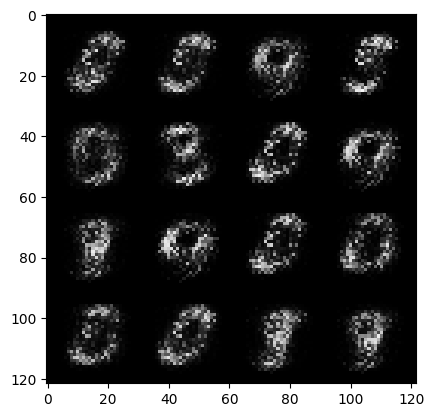

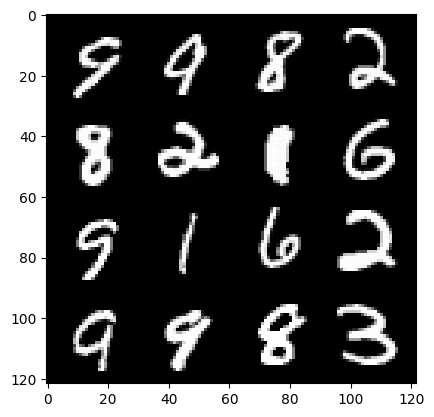

epoch : 1 , step :600 , mean-disc-loss:  0.1524992176145315 , mean-gen-loss 2.1426177012920364


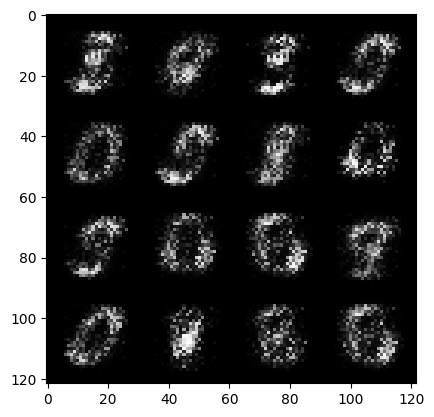

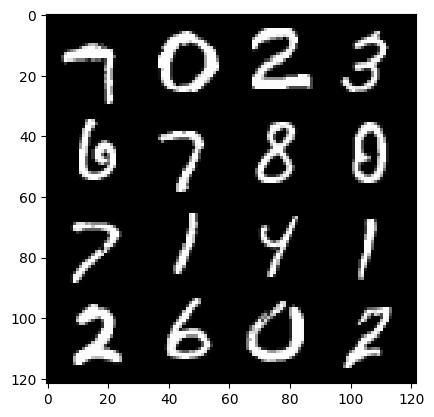

epoch : 1 , step :900 , mean-disc-loss:  0.13892833985388284 , mean-gen-loss 2.3444416336218517


  0%|          | 0/469 [00:00<?, ?it/s]

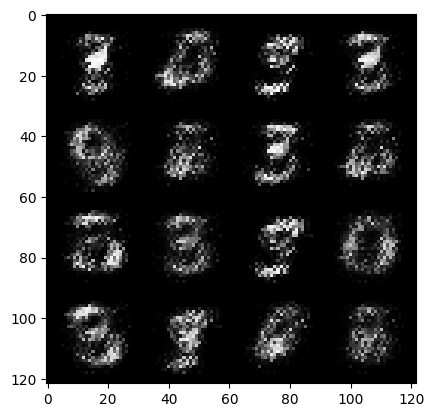

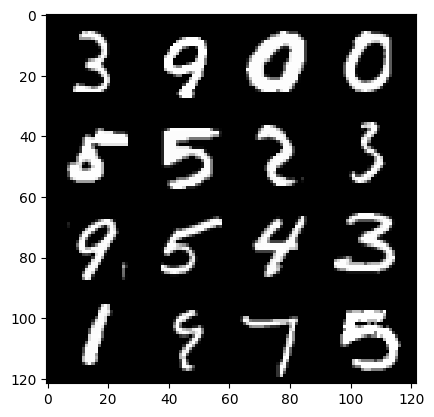

epoch : 2 , step :1200 , mean-disc-loss:  0.12423011749982839 , mean-gen-loss 2.6002250321706124


  0%|          | 0/469 [00:00<?, ?it/s]

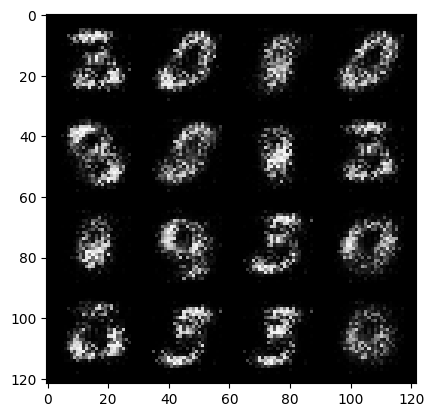

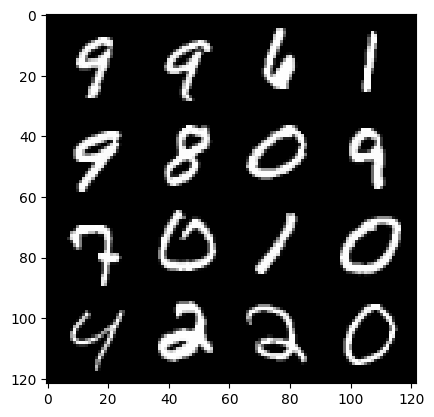

epoch : 3 , step :1500 , mean-disc-loss:  0.10947528911133593 , mean-gen-loss 2.7870449876785277


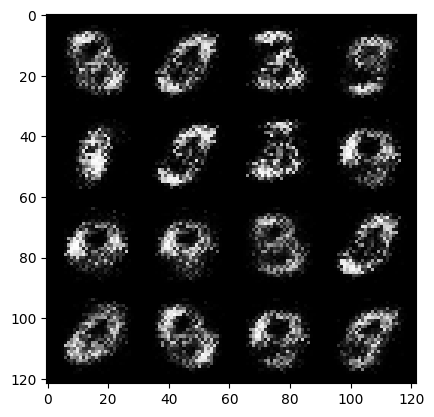

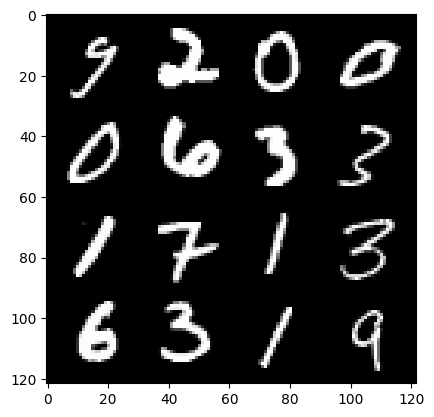

epoch : 3 , step :1800 , mean-disc-loss:  0.09613808766007424 , mean-gen-loss 3.0472651076316835


  0%|          | 0/469 [00:00<?, ?it/s]

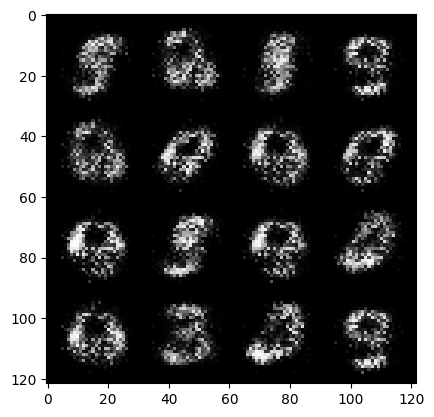

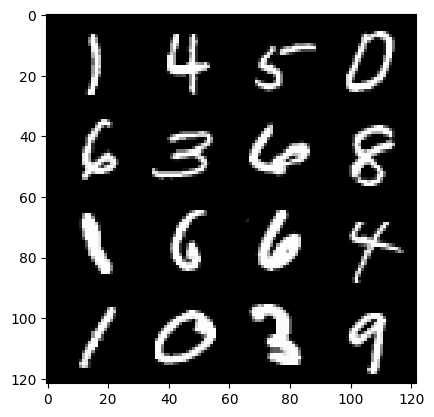

epoch : 4 , step :2100 , mean-disc-loss:  0.08339315138757232 , mean-gen-loss 3.1975250434875475


  0%|          | 0/469 [00:00<?, ?it/s]

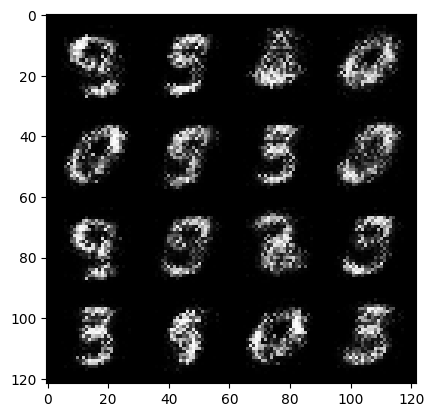

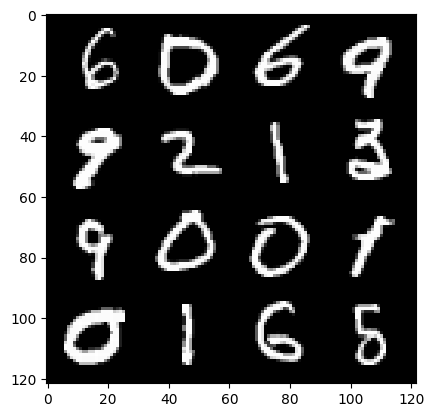

epoch : 5 , step :2400 , mean-disc-loss:  0.0802478411917885 , mean-gen-loss 3.2625762852032976


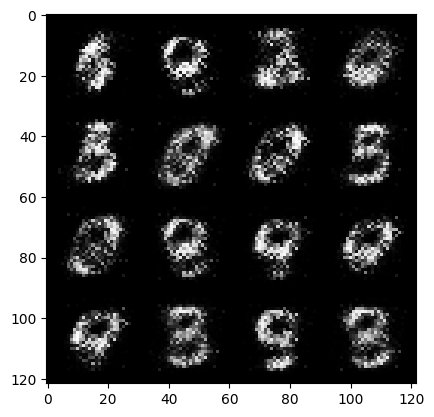

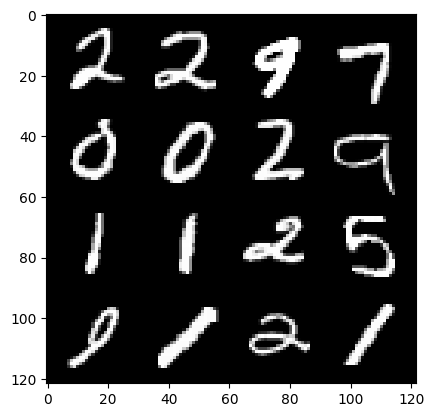

epoch : 5 , step :2700 , mean-disc-loss:  0.08204231491933264 , mean-gen-loss 3.420920054912564


  0%|          | 0/469 [00:00<?, ?it/s]

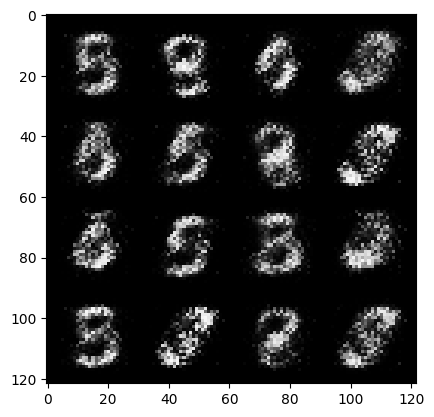

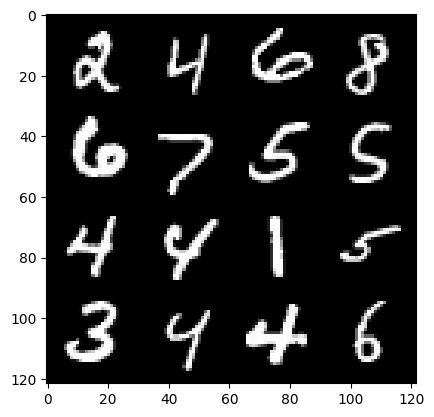

epoch : 6 , step :3000 , mean-disc-loss:  0.0910778505106767 , mean-gen-loss 3.5373474629720065


  0%|          | 0/469 [00:00<?, ?it/s]

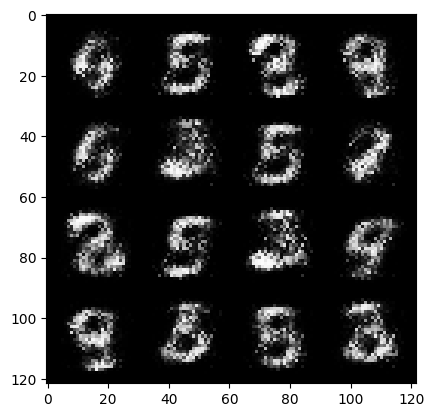

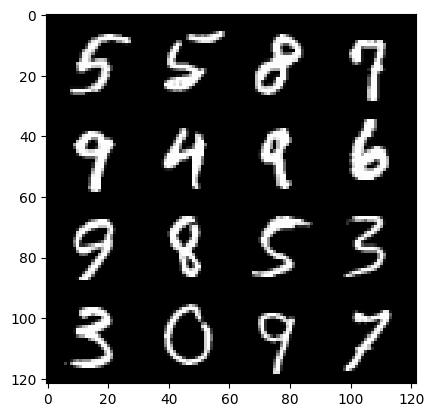

epoch : 7 , step :3300 , mean-disc-loss:  0.08564056756595774 , mean-gen-loss 3.5471459611256924


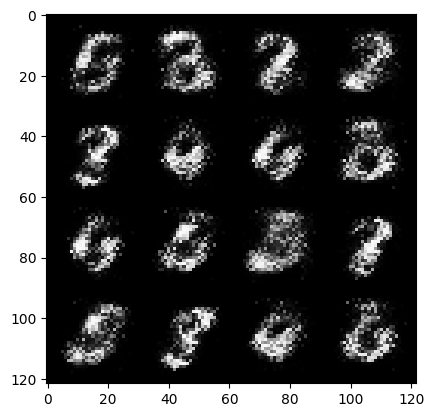

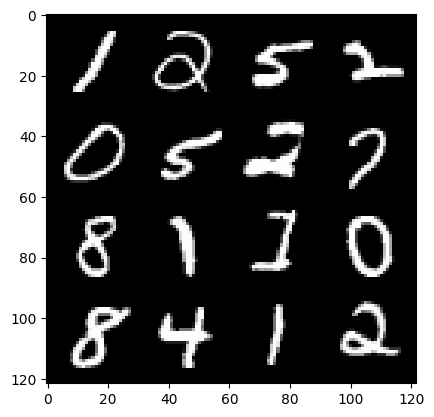

epoch : 7 , step :3600 , mean-disc-loss:  0.07022920591135816 , mean-gen-loss 3.600241649945577


  0%|          | 0/469 [00:00<?, ?it/s]

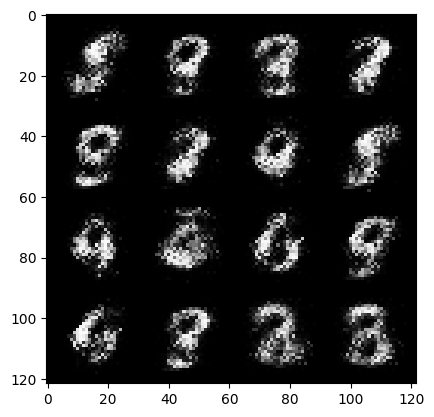

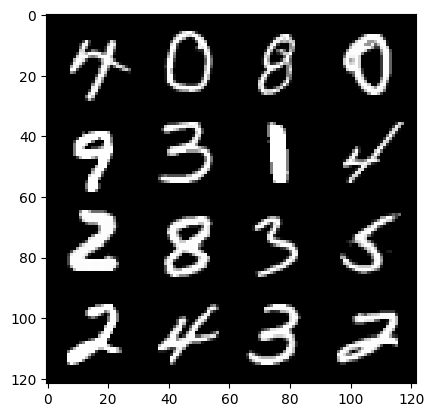

epoch : 8 , step :3900 , mean-disc-loss:  0.056809913367033026 , mean-gen-loss 3.8694510420163484


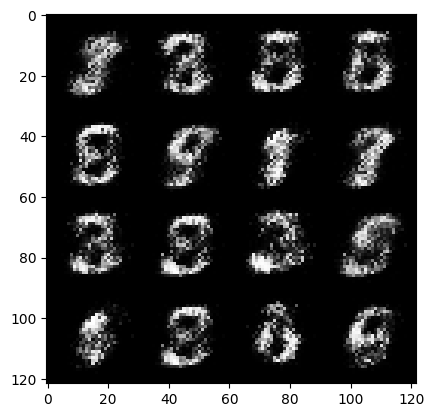

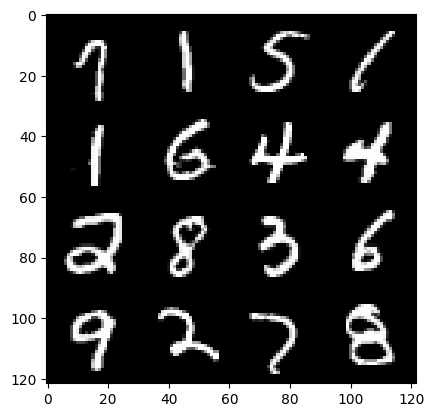

epoch : 8 , step :4200 , mean-disc-loss:  0.06086813027660053 , mean-gen-loss 3.9699157985051463


  0%|          | 0/469 [00:00<?, ?it/s]

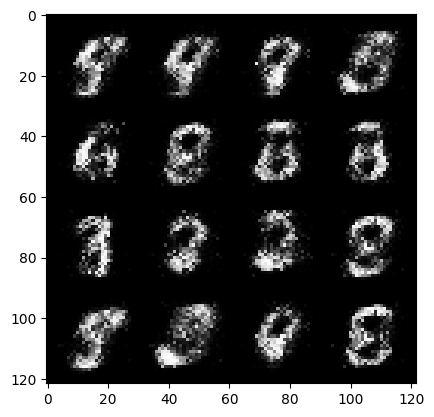

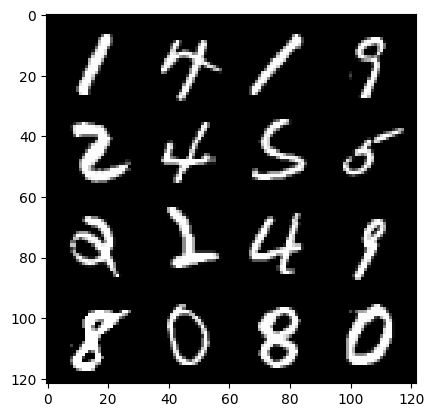

epoch : 9 , step :4500 , mean-disc-loss:  0.06894282730917135 , mean-gen-loss 3.7591740115483603


  0%|          | 0/469 [00:00<?, ?it/s]

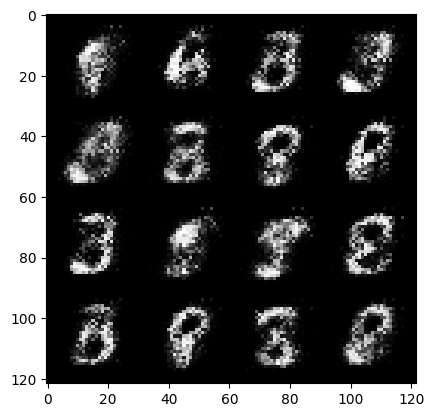

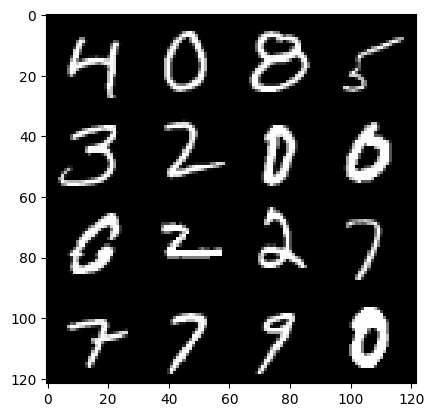

epoch : 10 , step :4800 , mean-disc-loss:  0.0830391696095467 , mean-gen-loss 3.764028960863749


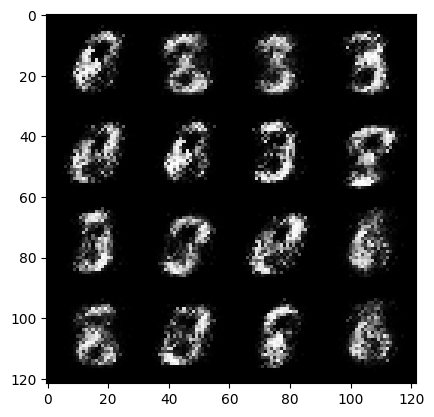

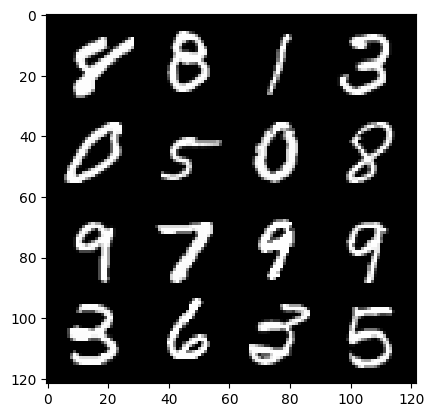

epoch : 10 , step :5100 , mean-disc-loss:  0.08229678122947613 , mean-gen-loss 3.8564299281438155


  0%|          | 0/469 [00:00<?, ?it/s]

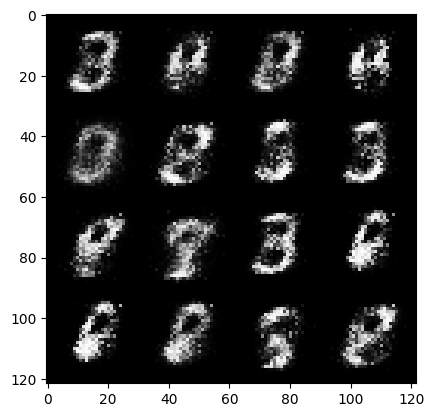

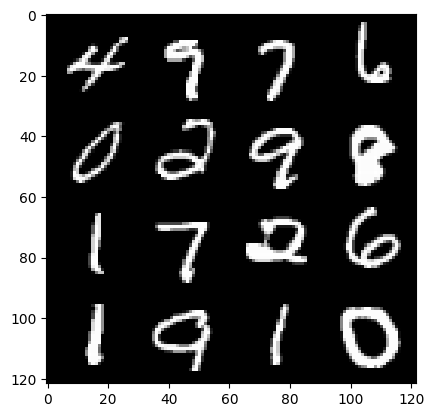

epoch : 11 , step :5400 , mean-disc-loss:  0.07275174524635072 , mean-gen-loss 3.830266711711883


  0%|          | 0/469 [00:00<?, ?it/s]

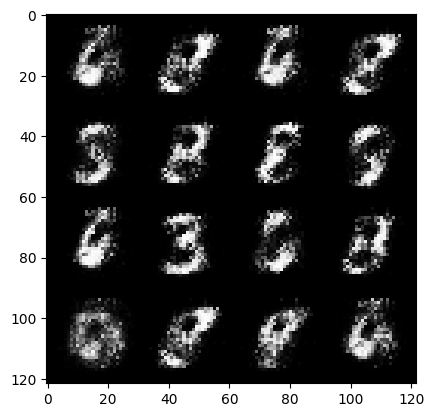

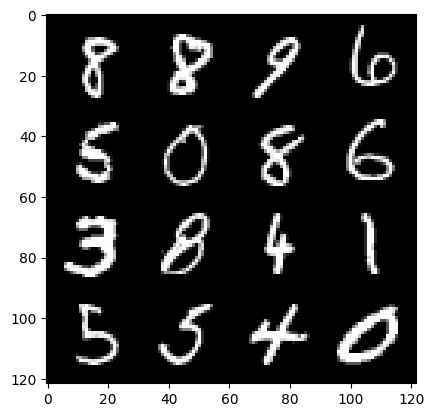

epoch : 12 , step :5700 , mean-disc-loss:  0.06952828377485275 , mean-gen-loss 3.833875286579131


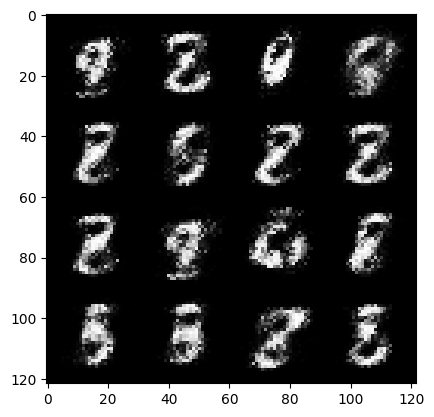

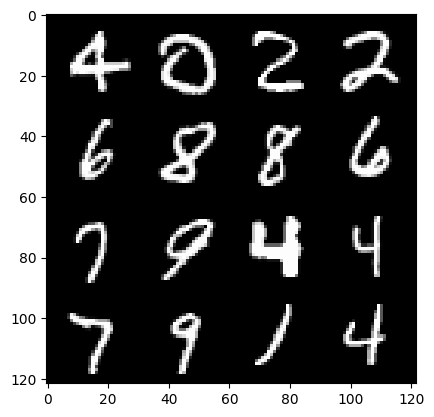

epoch : 12 , step :6000 , mean-disc-loss:  0.07689473065237204 , mean-gen-loss 3.940091565450032


  0%|          | 0/469 [00:00<?, ?it/s]

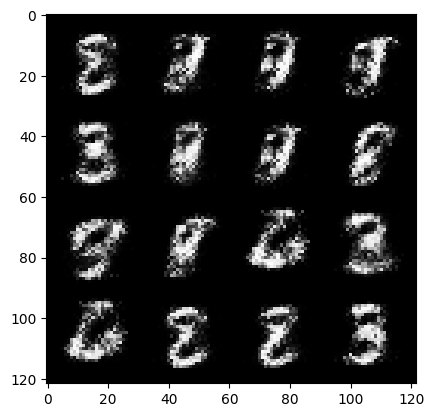

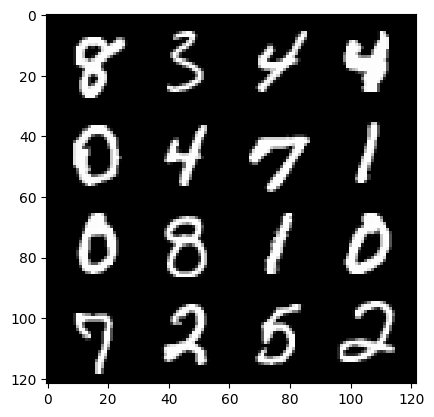

epoch : 13 , step :6300 , mean-disc-loss:  0.08698920942842958 , mean-gen-loss 3.718786009152728


  0%|          | 0/469 [00:00<?, ?it/s]

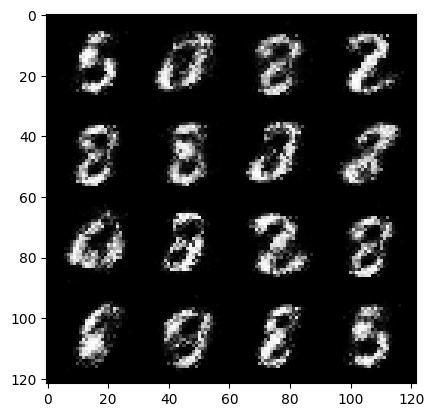

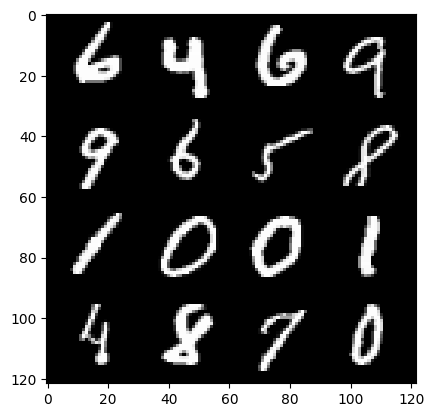

epoch : 14 , step :6600 , mean-disc-loss:  0.07235927776743968 , mean-gen-loss 3.8115575281778975


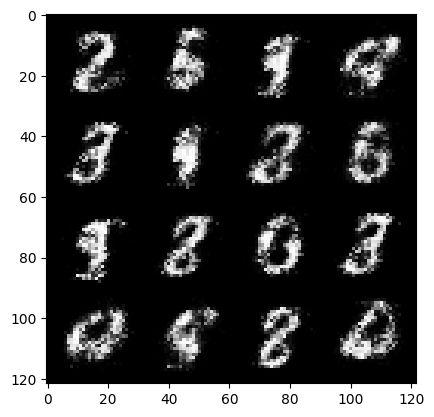

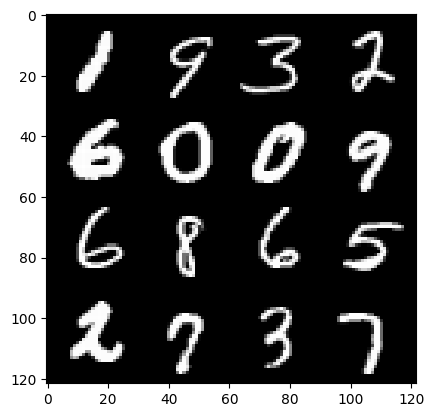

epoch : 14 , step :6900 , mean-disc-loss:  0.06516552794724699 , mean-gen-loss 3.84763023614883


  0%|          | 0/469 [00:00<?, ?it/s]

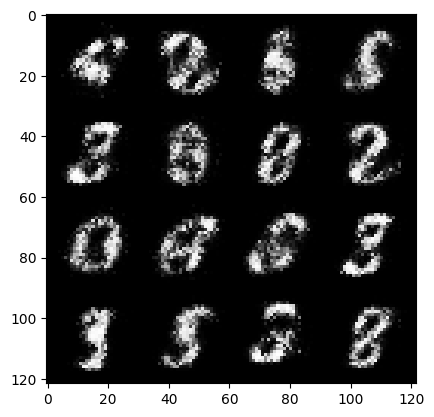

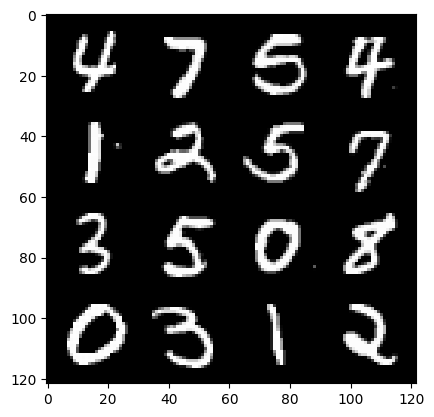

epoch : 15 , step :7200 , mean-disc-loss:  0.08546557149539392 , mean-gen-loss 3.829083413283027


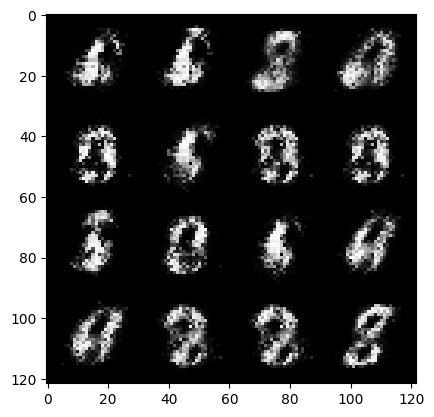

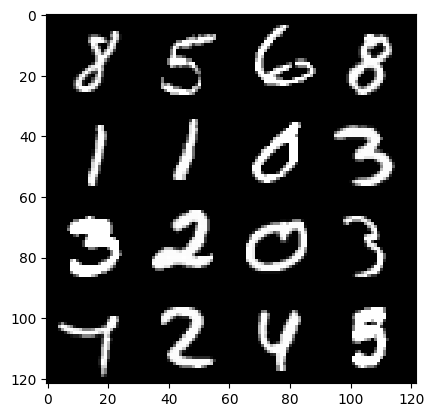

epoch : 15 , step :7500 , mean-disc-loss:  0.08116626967986425 , mean-gen-loss 3.823319070339205


  0%|          | 0/469 [00:00<?, ?it/s]

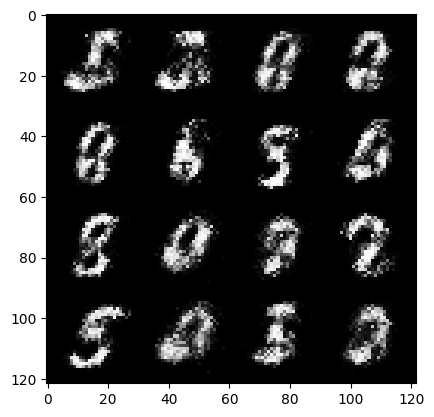

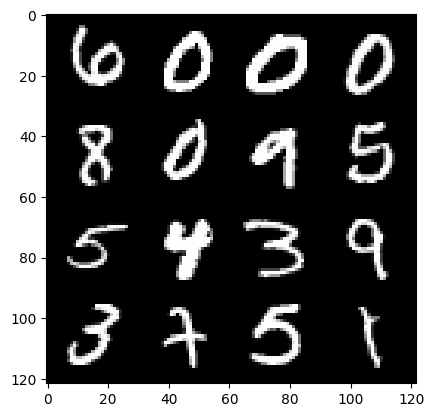

epoch : 16 , step :7800 , mean-disc-loss:  0.07254057992249735 , mean-gen-loss 3.9888822261492414


  0%|          | 0/469 [00:00<?, ?it/s]

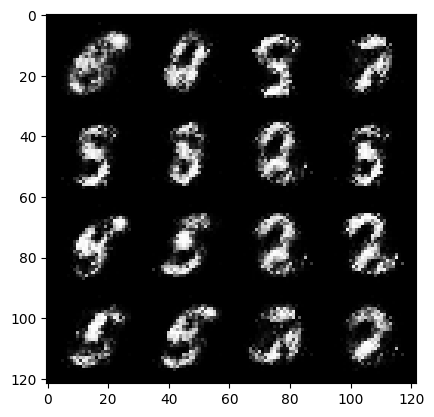

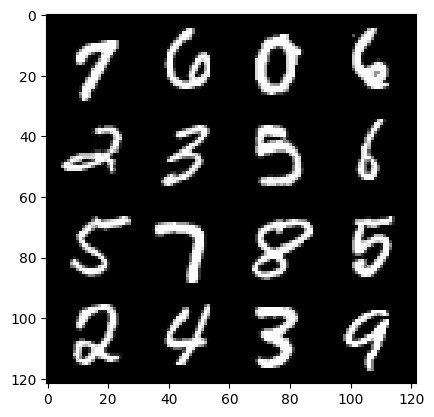

epoch : 17 , step :8100 , mean-disc-loss:  0.08137045107781887 , mean-gen-loss 3.9481822975476604


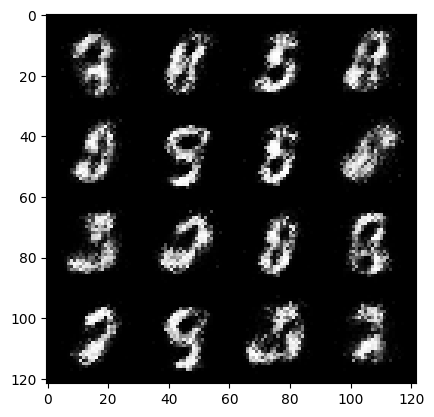

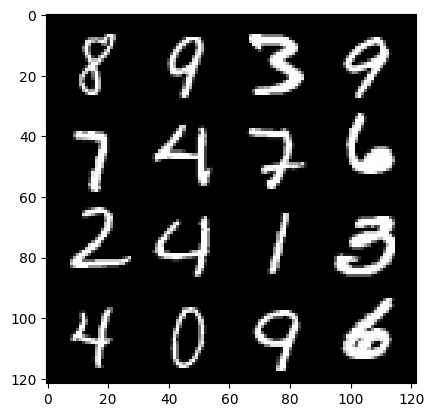

epoch : 17 , step :8400 , mean-disc-loss:  0.08003199548770985 , mean-gen-loss 3.9203527069091813


  0%|          | 0/469 [00:00<?, ?it/s]

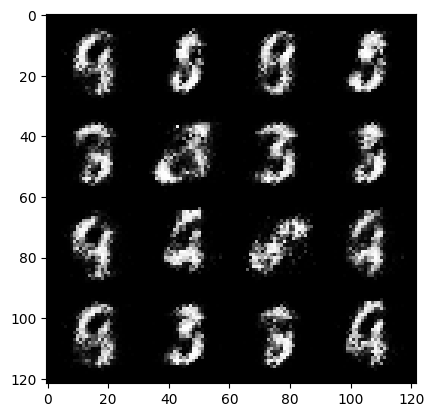

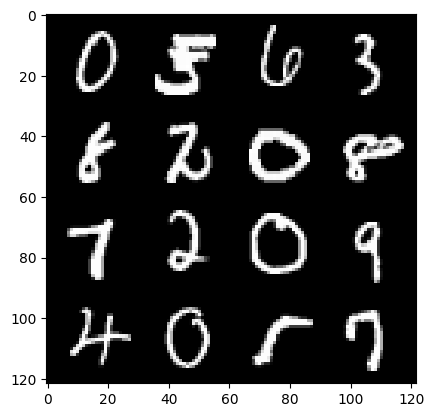

epoch : 18 , step :8700 , mean-disc-loss:  0.08277313681940235 , mean-gen-loss 3.844072489738466


  0%|          | 0/469 [00:00<?, ?it/s]

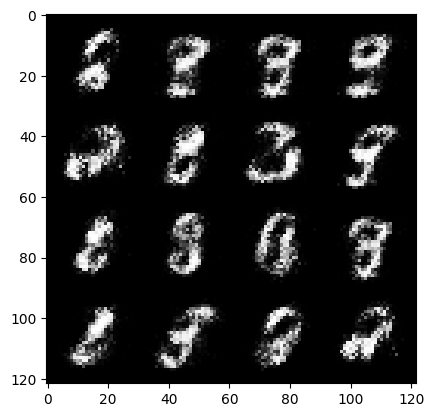

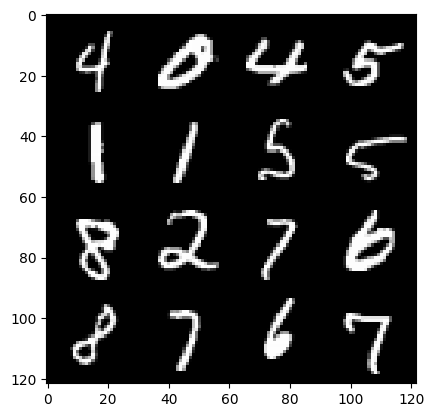

epoch : 19 , step :9000 , mean-disc-loss:  0.07859882805496456 , mean-gen-loss 3.9711085510253894


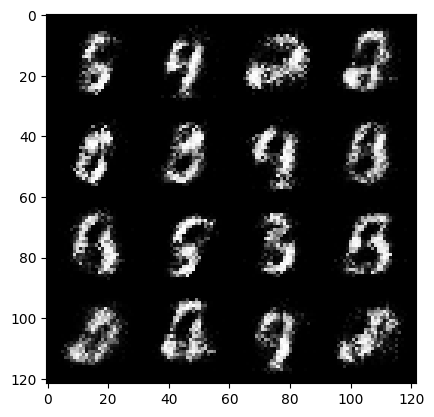

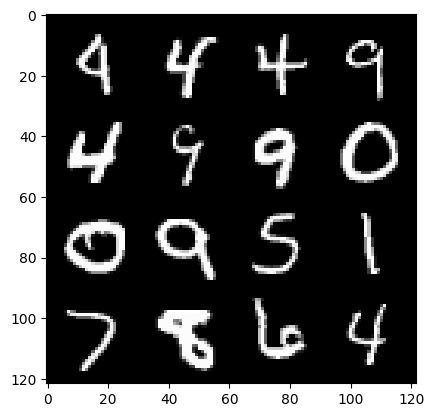

epoch : 19 , step :9300 , mean-disc-loss:  0.0808208844189842 , mean-gen-loss 4.081507909297939


  0%|          | 0/469 [00:00<?, ?it/s]

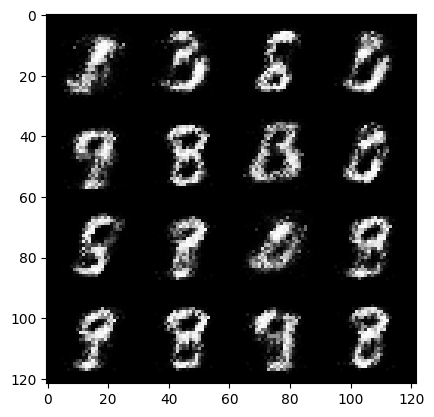

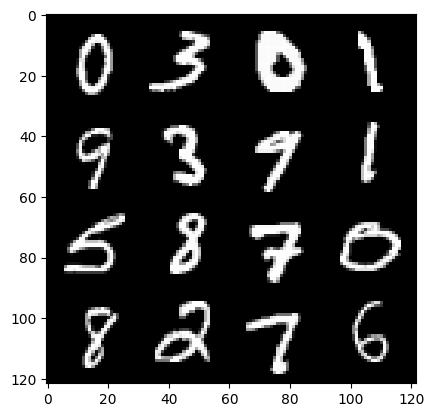

epoch : 20 , step :9600 , mean-disc-loss:  0.09569598945478598 , mean-gen-loss 3.9599437594413764


  0%|          | 0/469 [00:00<?, ?it/s]

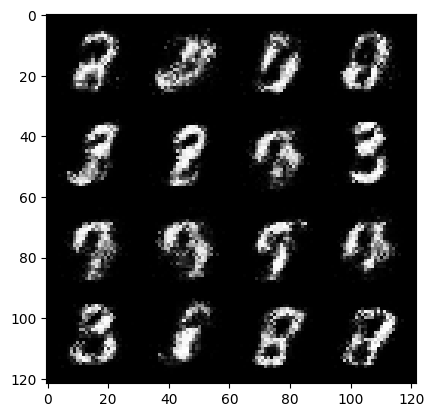

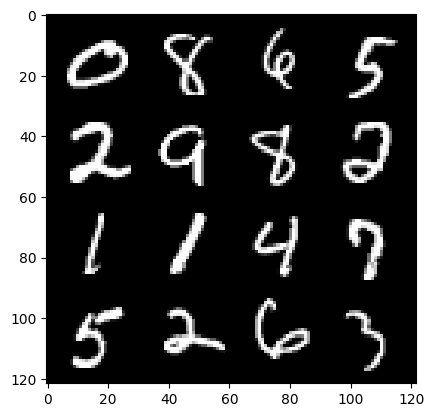

epoch : 21 , step :9900 , mean-disc-loss:  0.10251866279790807 , mean-gen-loss 3.8058151284853636


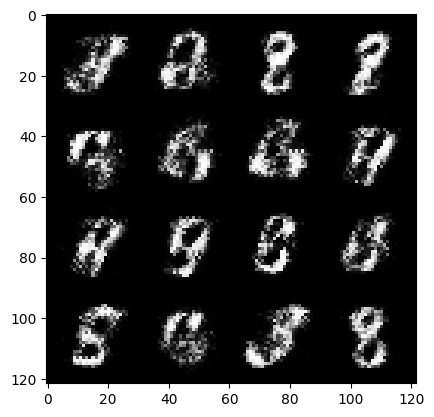

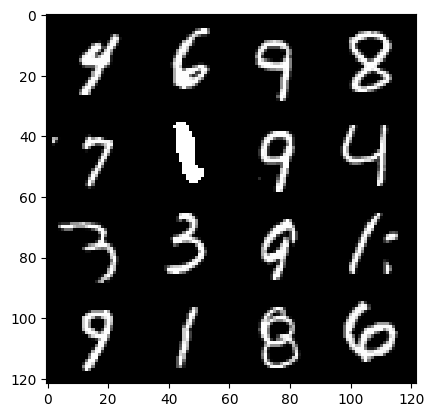

epoch : 21 , step :10200 , mean-disc-loss:  0.10856503352522862 , mean-gen-loss 3.7580334226290377


  0%|          | 0/469 [00:00<?, ?it/s]

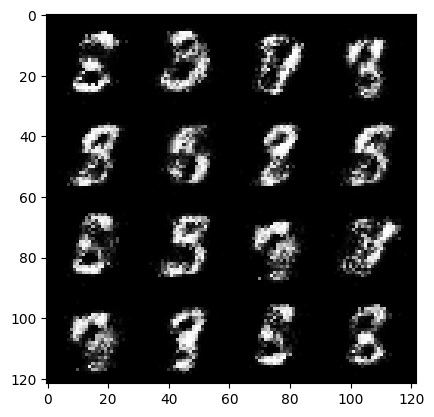

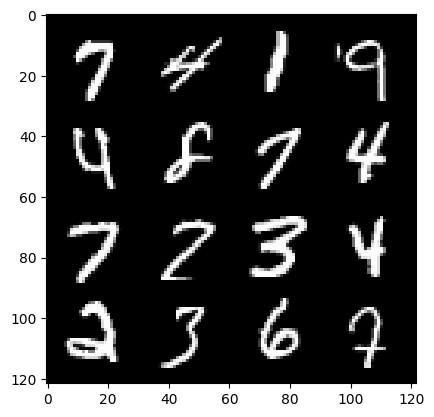

epoch : 22 , step :10500 , mean-disc-loss:  0.10074490421762071 , mean-gen-loss 3.7543328189849876


  0%|          | 0/469 [00:00<?, ?it/s]

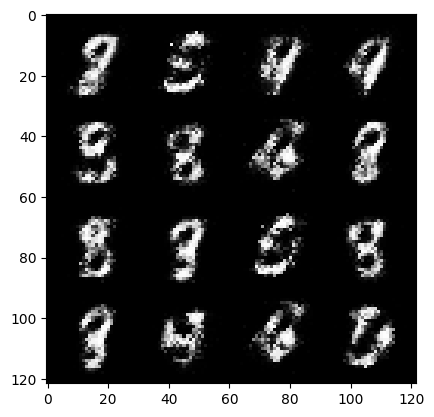

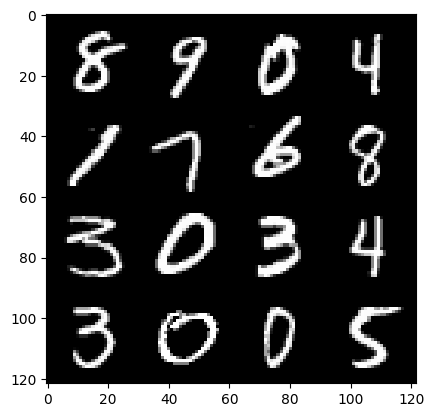

epoch : 23 , step :10800 , mean-disc-loss:  0.11158308332165076 , mean-gen-loss 3.7506986761093124


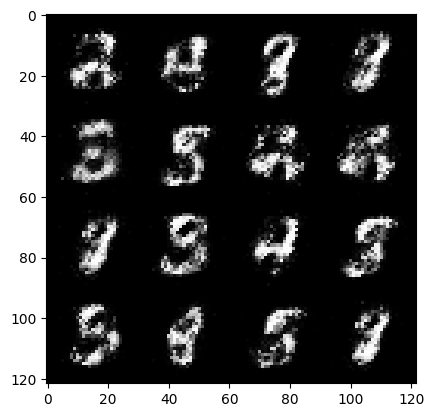

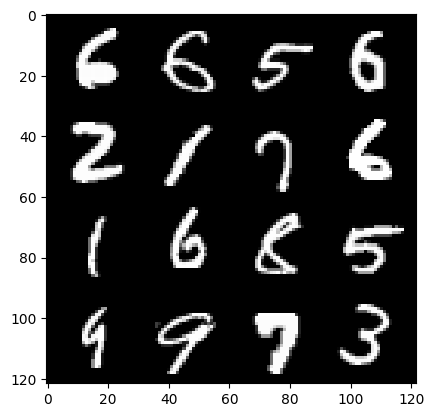

epoch : 23 , step :11100 , mean-disc-loss:  0.11146195364495112 , mean-gen-loss 3.7604814505577067


  0%|          | 0/469 [00:00<?, ?it/s]

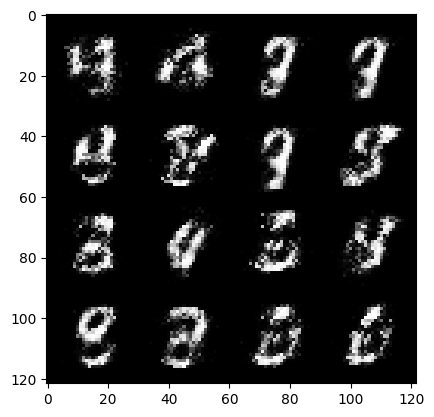

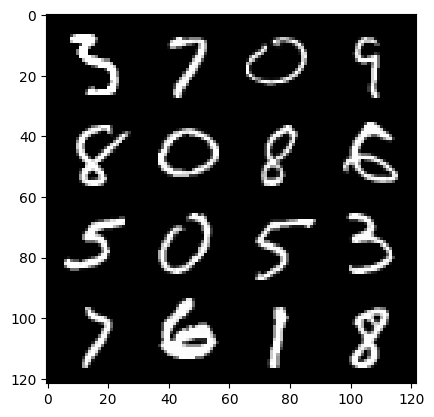

epoch : 24 , step :11400 , mean-disc-loss:  0.10798526771366601 , mean-gen-loss 3.8630612635612507


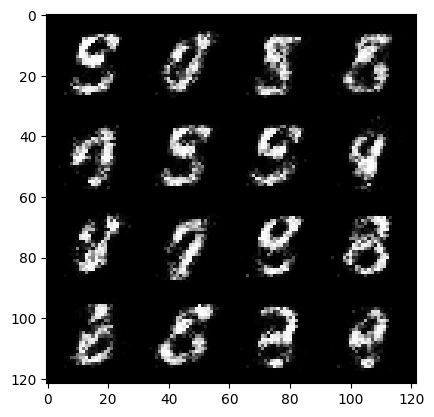

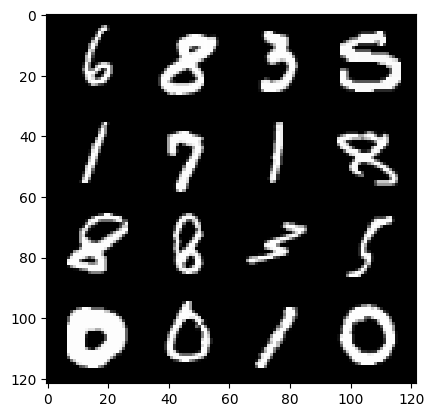

epoch : 24 , step :11700 , mean-disc-loss:  0.1220060986528795 , mean-gen-loss 3.691843261718751


  0%|          | 0/469 [00:00<?, ?it/s]

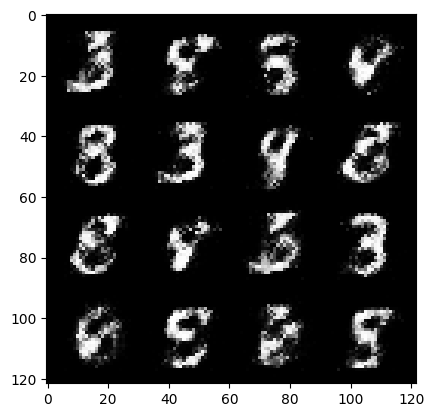

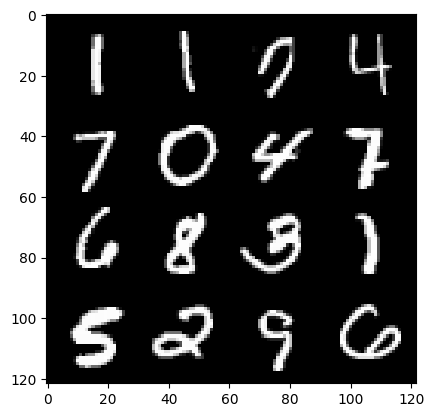

epoch : 25 , step :12000 , mean-disc-loss:  0.14679953324298073 , mean-gen-loss 3.481372329394023


  0%|          | 0/469 [00:00<?, ?it/s]

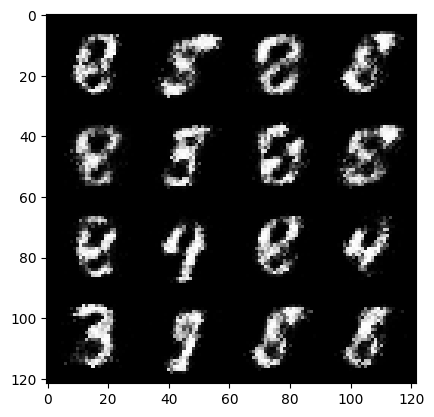

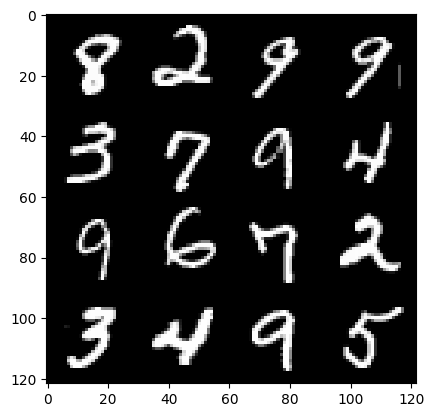

epoch : 26 , step :12300 , mean-disc-loss:  0.14254101539651556 , mean-gen-loss 3.4138801797231055


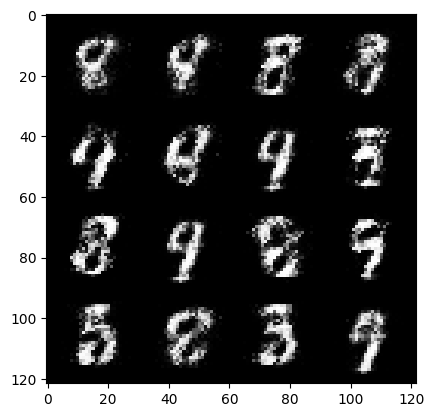

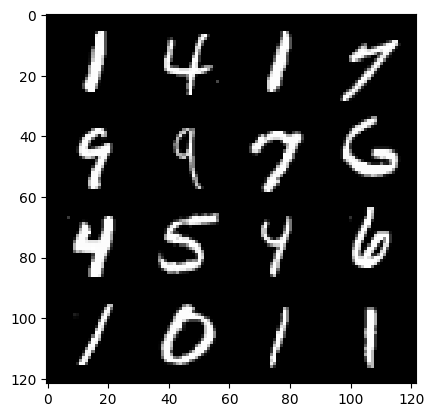

epoch : 26 , step :12600 , mean-disc-loss:  0.13124129923681419 , mean-gen-loss 3.4934102376302087


  0%|          | 0/469 [00:00<?, ?it/s]

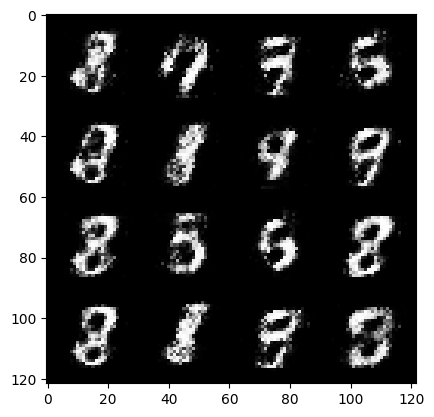

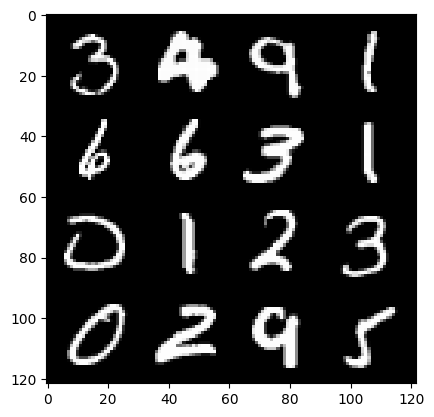

epoch : 27 , step :12900 , mean-disc-loss:  0.1359823324282964 , mean-gen-loss 3.514653550783792


  0%|          | 0/469 [00:00<?, ?it/s]

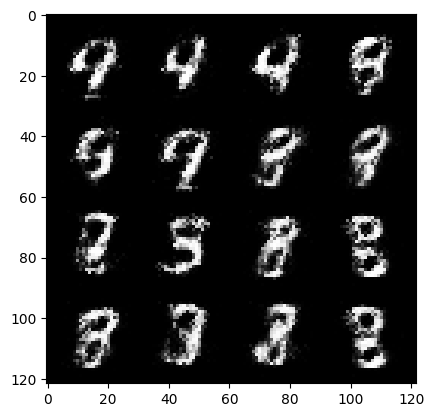

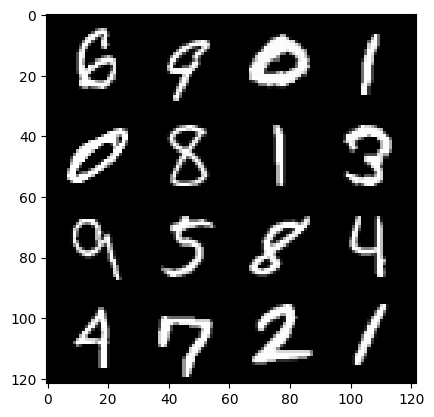

epoch : 28 , step :13200 , mean-disc-loss:  0.12709328865011524 , mean-gen-loss 3.5414387488365175


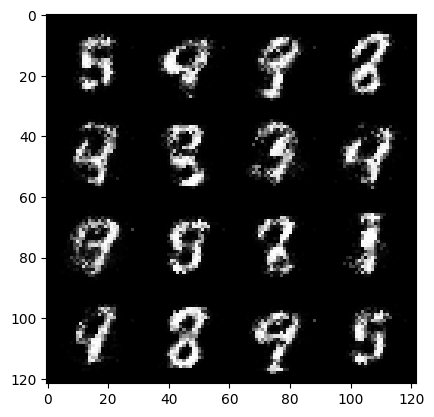

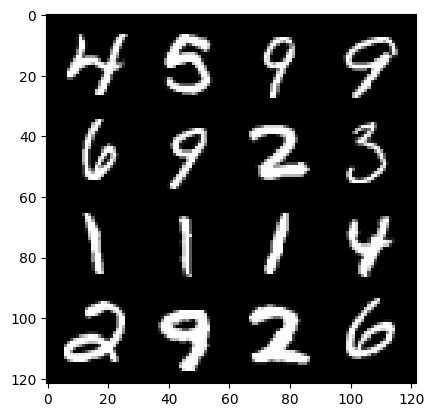

epoch : 28 , step :13500 , mean-disc-loss:  0.13550015079478425 , mean-gen-loss 3.3174242599805215


  0%|          | 0/469 [00:00<?, ?it/s]

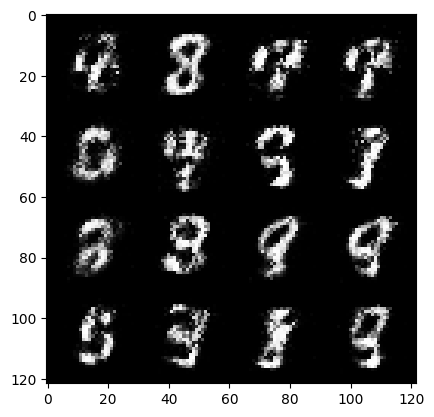

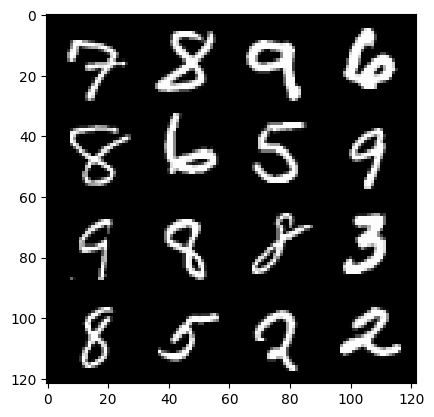

epoch : 29 , step :13800 , mean-disc-loss:  0.14032844675083953 , mean-gen-loss 3.3078441683451336


  0%|          | 0/469 [00:00<?, ?it/s]

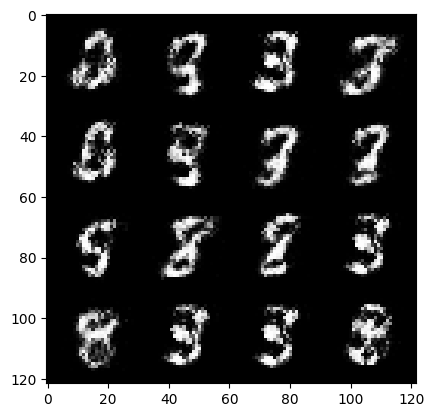

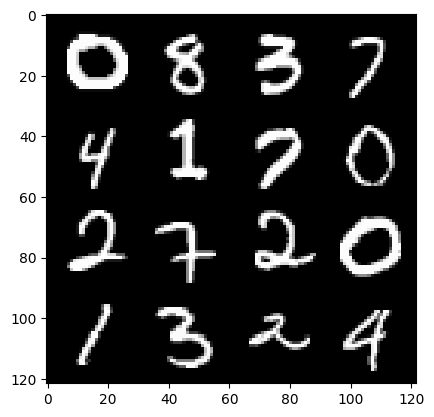

epoch : 30 , step :14100 , mean-disc-loss:  0.14272527863581982 , mean-gen-loss 3.4373427907625853


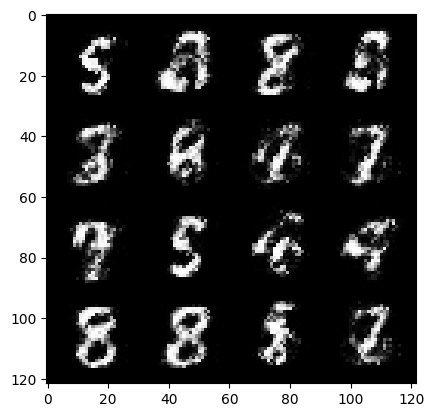

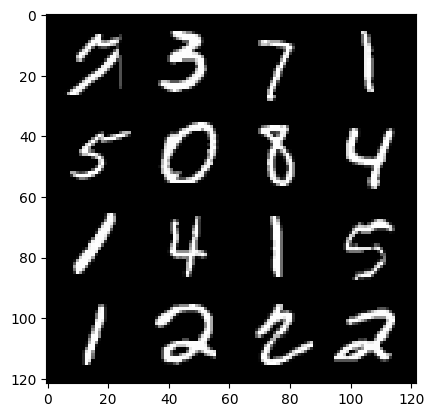

epoch : 30 , step :14400 , mean-disc-loss:  0.16134822083016234 , mean-gen-loss 3.3127391409873965


  0%|          | 0/469 [00:00<?, ?it/s]

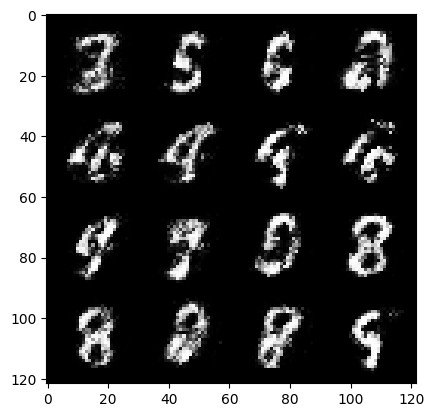

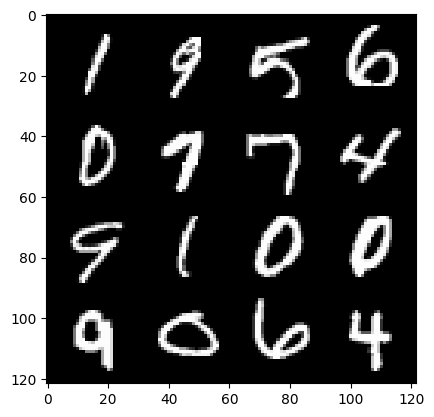

epoch : 31 , step :14700 , mean-disc-loss:  0.14999048933386797 , mean-gen-loss 3.2767968463897685


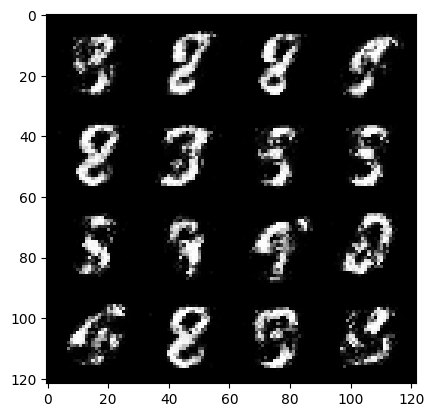

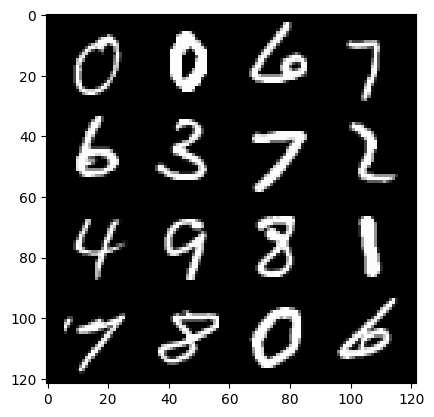

epoch : 31 , step :15000 , mean-disc-loss:  0.13191984012722963 , mean-gen-loss 3.3624703057607004


  0%|          | 0/469 [00:00<?, ?it/s]

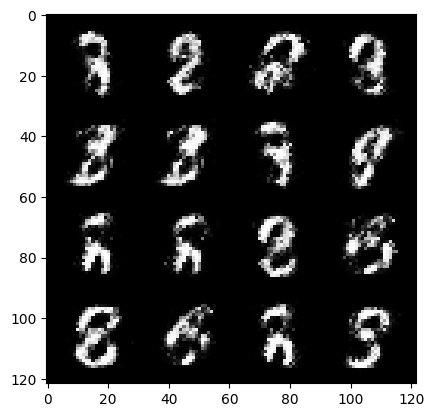

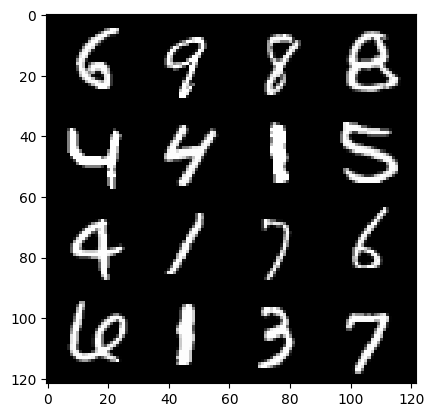

epoch : 32 , step :15300 , mean-disc-loss:  0.13941849765678258 , mean-gen-loss 3.38577667315801


  0%|          | 0/469 [00:00<?, ?it/s]

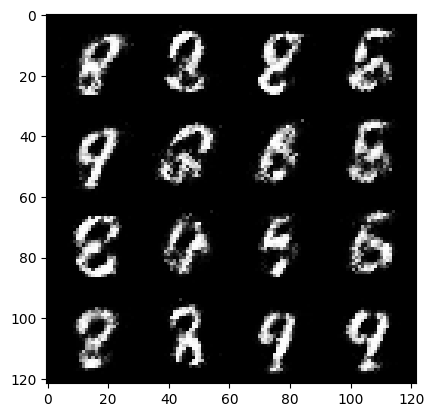

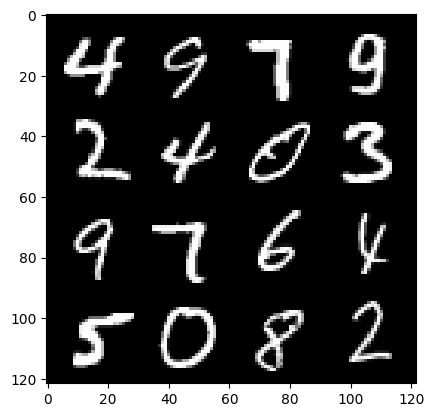

epoch : 33 , step :15600 , mean-disc-loss:  0.14784058190882207 , mean-gen-loss 3.33729002634684


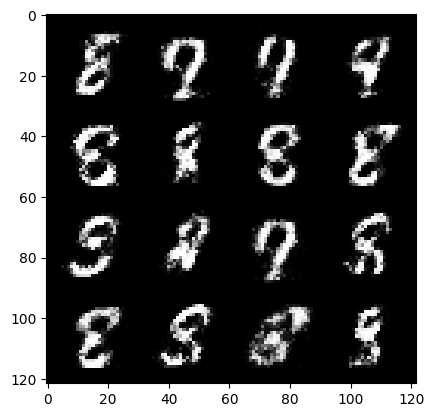

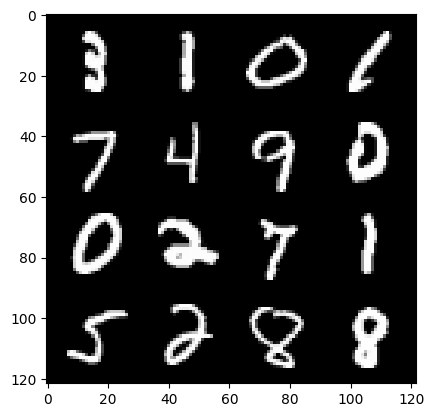

epoch : 33 , step :15900 , mean-disc-loss:  0.157416322156787 , mean-gen-loss 3.2373753555615736


  0%|          | 0/469 [00:00<?, ?it/s]

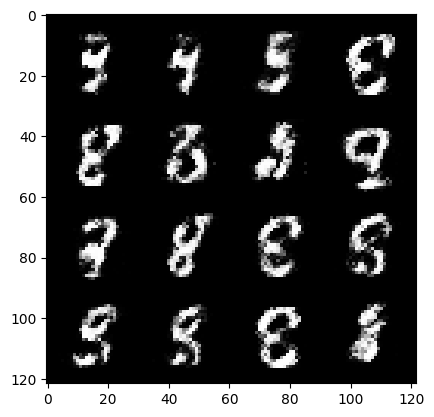

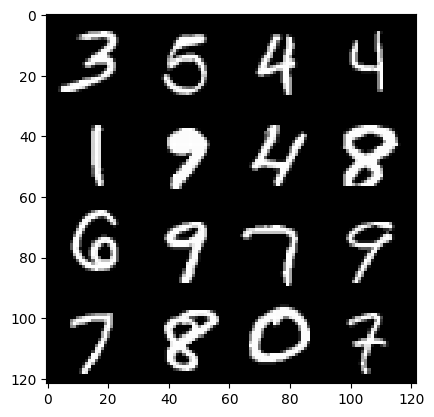

epoch : 34 , step :16200 , mean-disc-loss:  0.15330346109966436 , mean-gen-loss 3.2268964783350618


  0%|          | 0/469 [00:00<?, ?it/s]

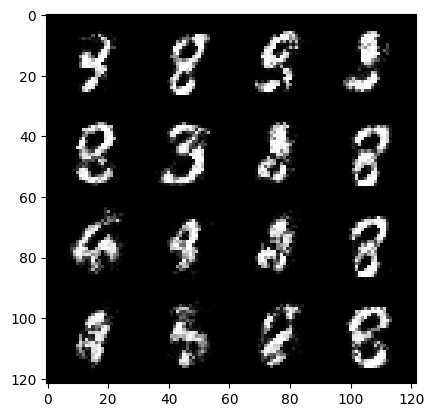

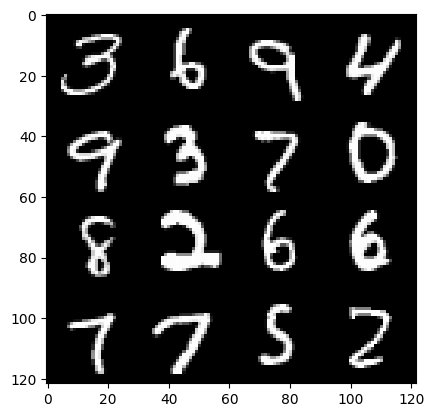

epoch : 35 , step :16500 , mean-disc-loss:  0.1435020691156388 , mean-gen-loss 3.293204703330994


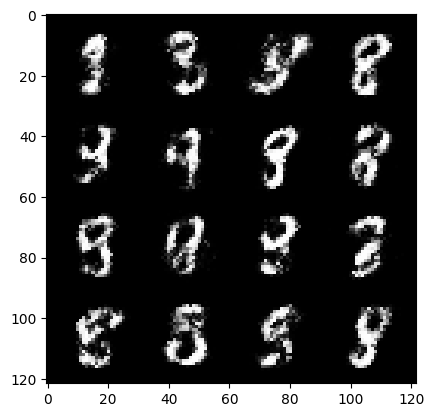

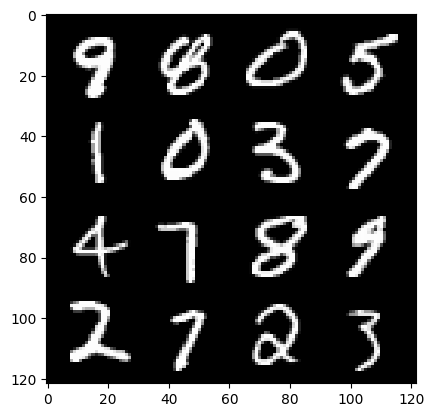

epoch : 35 , step :16800 , mean-disc-loss:  0.15707268012066686 , mean-gen-loss 3.3445631957054136


  0%|          | 0/469 [00:00<?, ?it/s]

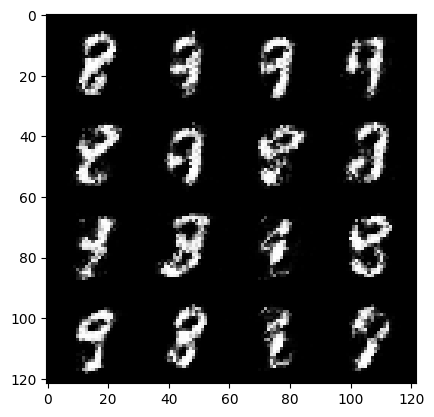

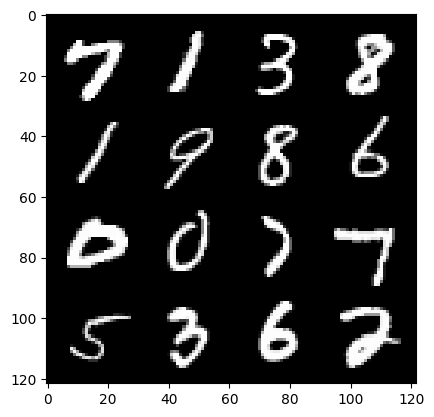

epoch : 36 , step :17100 , mean-disc-loss:  0.17422841231028235 , mean-gen-loss 3.2625655778249083


  0%|          | 0/469 [00:00<?, ?it/s]

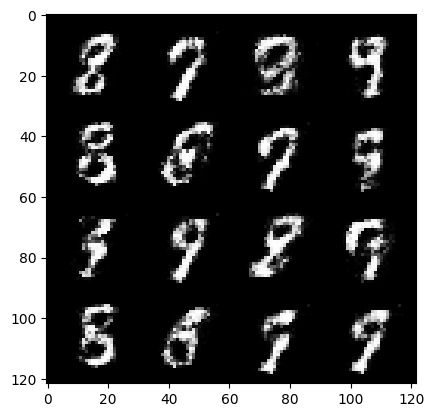

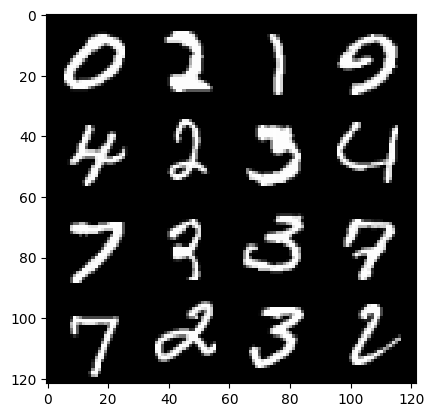

epoch : 37 , step :17400 , mean-disc-loss:  0.1960143366952737 , mean-gen-loss 3.022786779403688


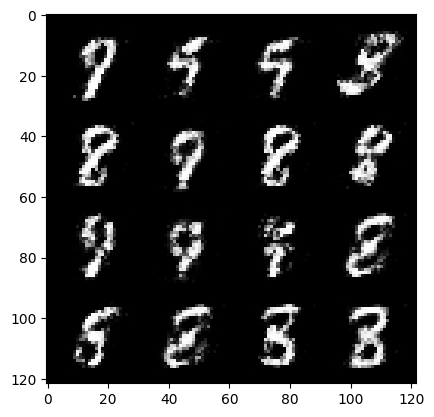

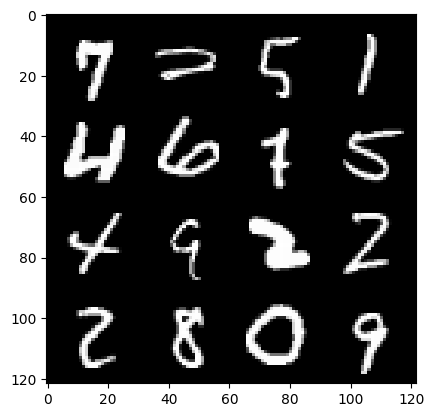

epoch : 37 , step :17700 , mean-disc-loss:  0.1843326860914626 , mean-gen-loss 2.913459649880728


  0%|          | 0/469 [00:00<?, ?it/s]

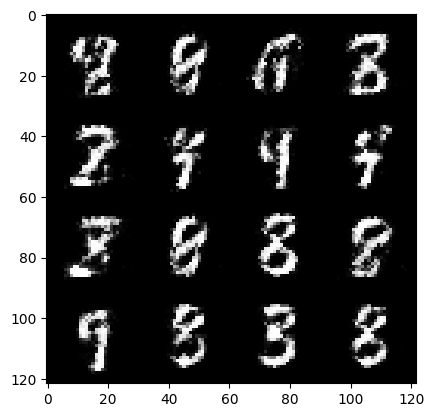

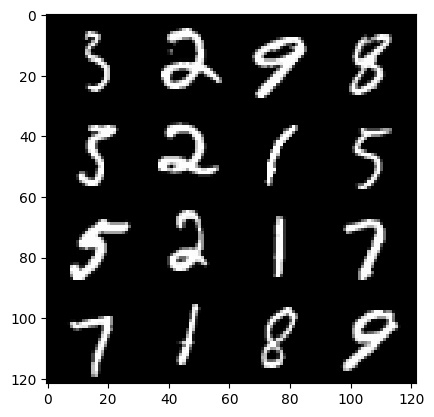

epoch : 38 , step :18000 , mean-disc-loss:  0.18074283371369051 , mean-gen-loss 2.9663626972834263


  0%|          | 0/469 [00:00<?, ?it/s]

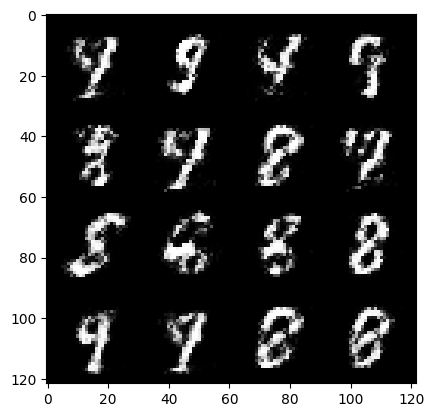

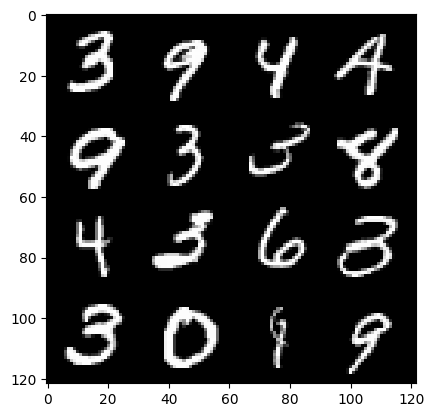

epoch : 39 , step :18300 , mean-disc-loss:  0.20570213700334225 , mean-gen-loss 2.9384785326321907


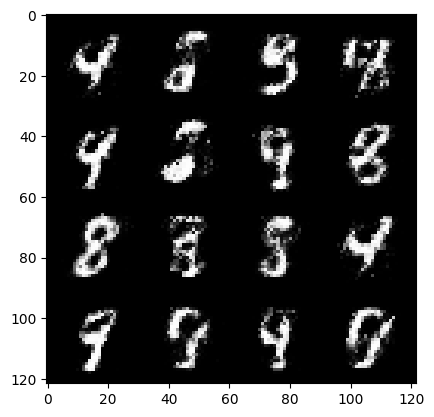

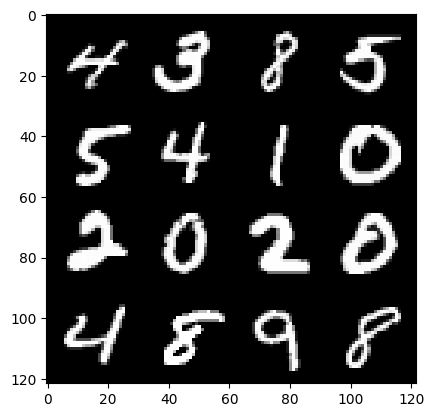

epoch : 39 , step :18600 , mean-disc-loss:  0.21153048073252048 , mean-gen-loss 2.821763555208845


  0%|          | 0/469 [00:00<?, ?it/s]

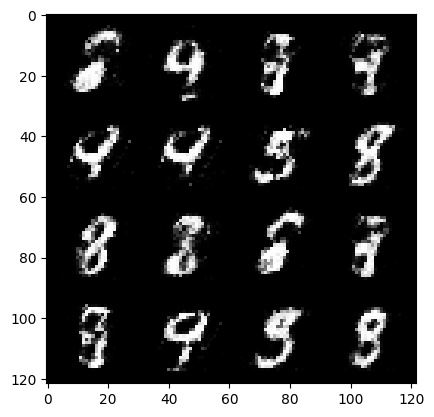

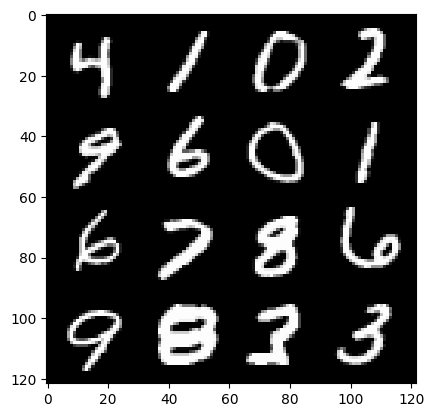

epoch : 40 , step :18900 , mean-disc-loss:  0.20371587780614692 , mean-gen-loss 2.898563562234243


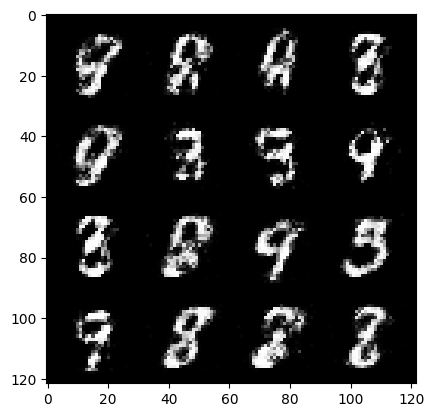

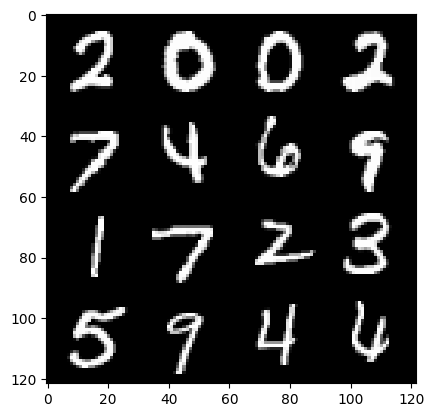

epoch : 40 , step :19200 , mean-disc-loss:  0.20158354332049694 , mean-gen-loss 2.856225560506182


  0%|          | 0/469 [00:00<?, ?it/s]

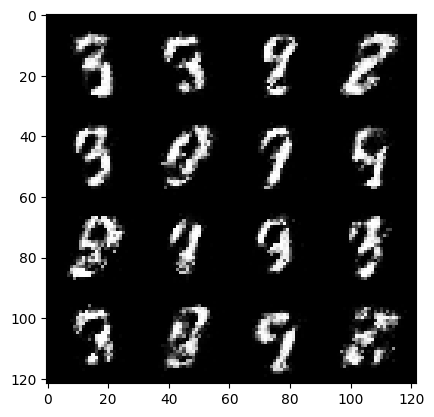

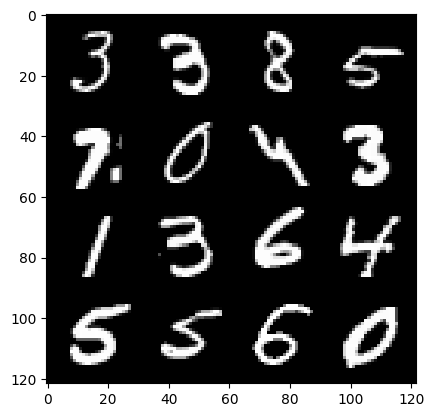

epoch : 41 , step :19500 , mean-disc-loss:  0.20858351424336422 , mean-gen-loss 2.760789625644682


  0%|          | 0/469 [00:00<?, ?it/s]

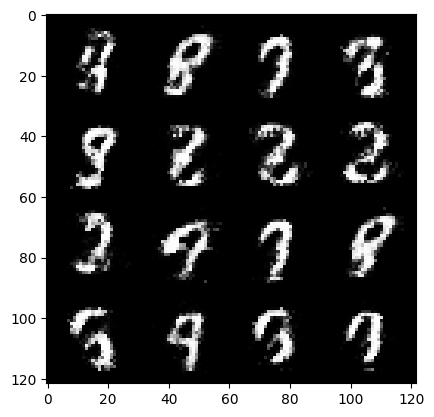

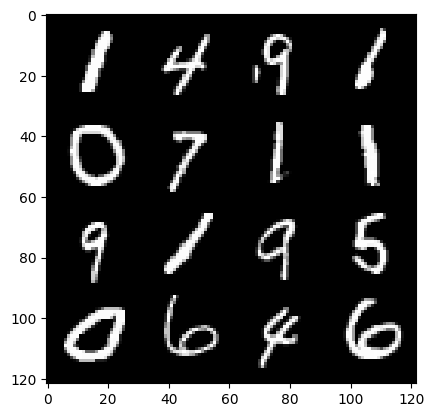

epoch : 42 , step :19800 , mean-disc-loss:  0.21090814361969634 , mean-gen-loss 2.710758930047354


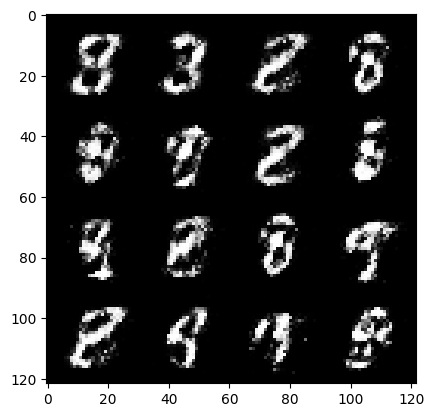

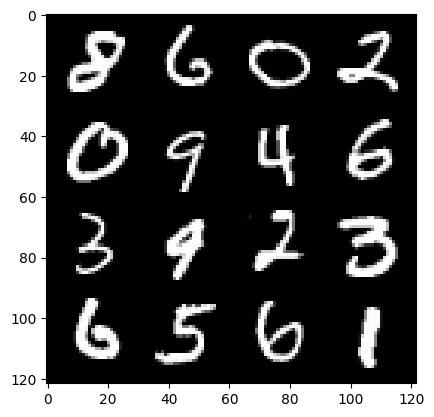

epoch : 42 , step :20100 , mean-disc-loss:  0.1972582004219293 , mean-gen-loss 2.7794228545824677


  0%|          | 0/469 [00:00<?, ?it/s]

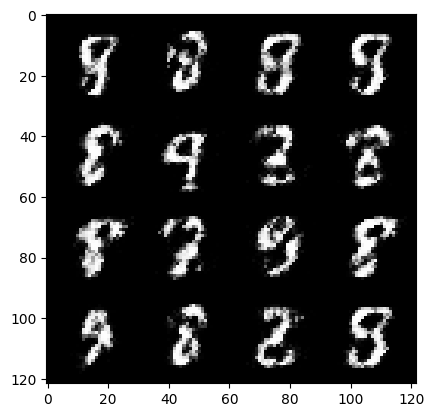

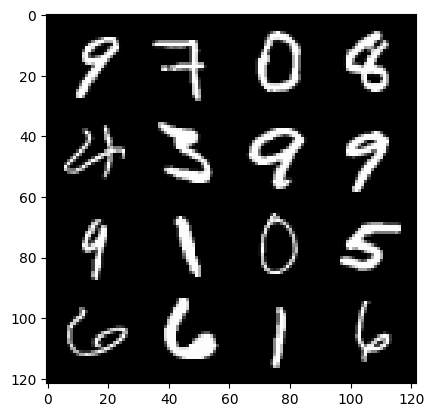

epoch : 43 , step :20400 , mean-disc-loss:  0.18976245443026218 , mean-gen-loss 2.89012706120809


  0%|          | 0/469 [00:00<?, ?it/s]

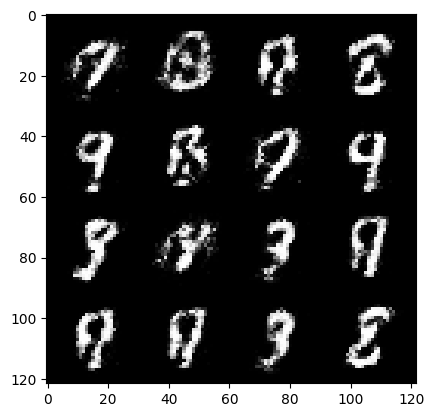

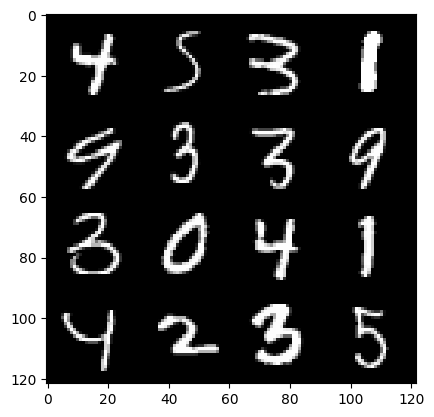

epoch : 44 , step :20700 , mean-disc-loss:  0.22603103299935642 , mean-gen-loss 2.72796711842219


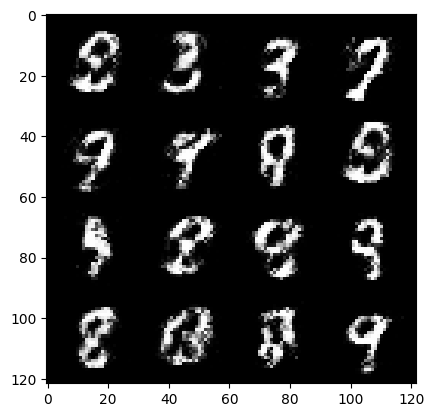

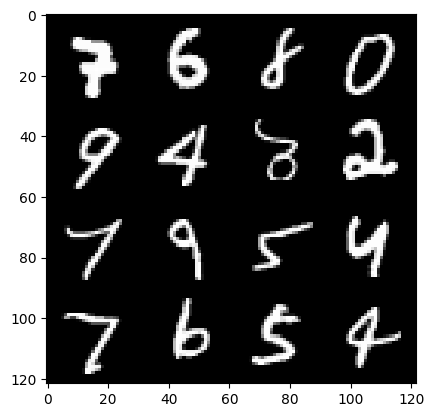

epoch : 44 , step :21000 , mean-disc-loss:  0.2100450425098341 , mean-gen-loss 2.7053250678380327


  0%|          | 0/469 [00:00<?, ?it/s]

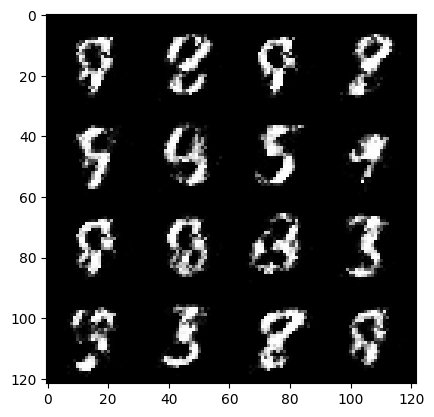

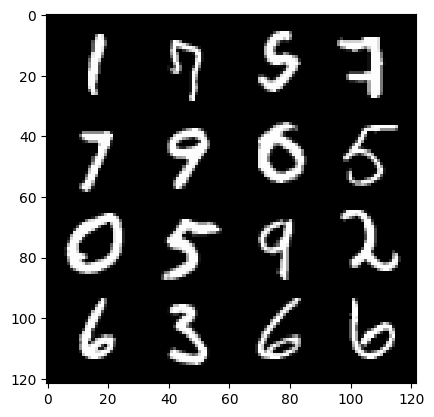

epoch : 45 , step :21300 , mean-disc-loss:  0.18443810830513643 , mean-gen-loss 2.859643297195435


  0%|          | 0/469 [00:00<?, ?it/s]

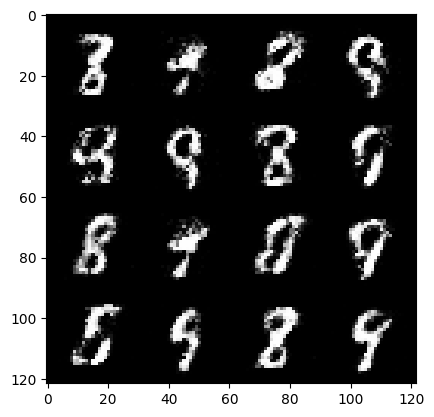

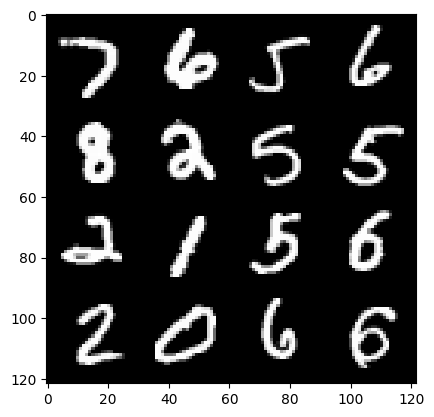

epoch : 46 , step :21600 , mean-disc-loss:  0.1970468034843603 , mean-gen-loss 2.800072432359061


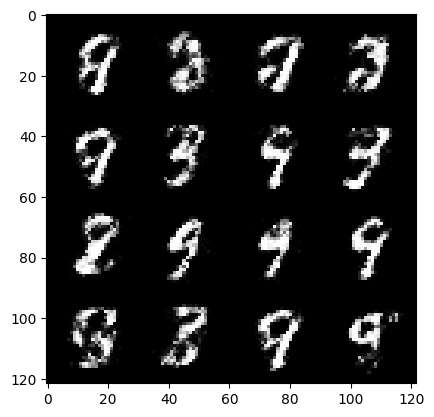

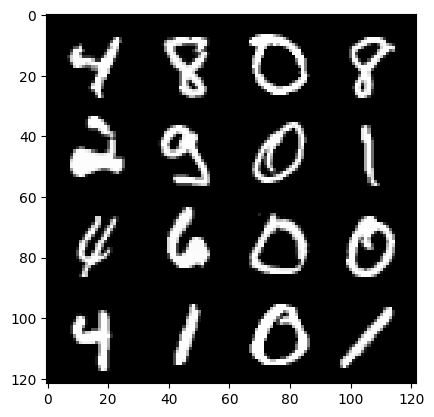

epoch : 46 , step :21900 , mean-disc-loss:  0.19981970883905878 , mean-gen-loss 2.740639983018241


  0%|          | 0/469 [00:00<?, ?it/s]

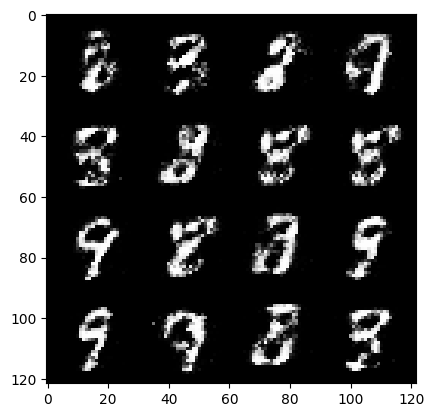

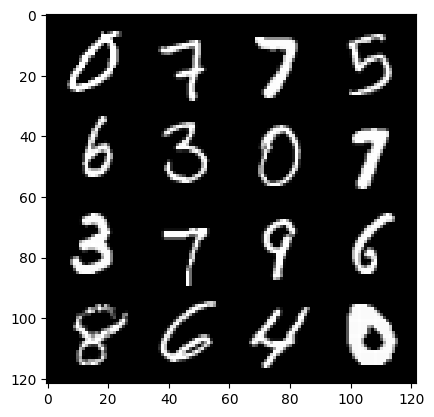

epoch : 47 , step :22200 , mean-disc-loss:  0.21356033186117804 , mean-gen-loss 2.6513511284192384


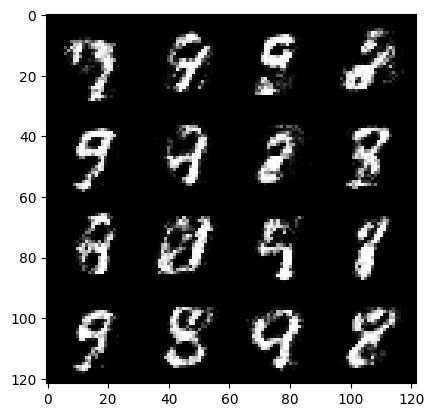

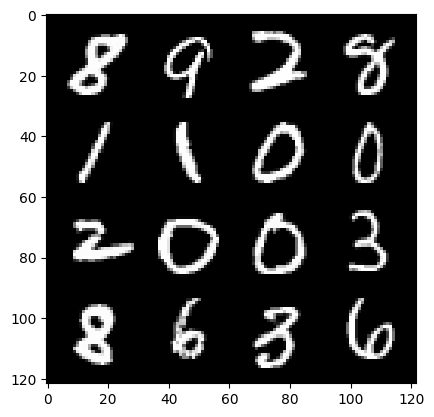

epoch : 47 , step :22500 , mean-disc-loss:  0.20799814010659856 , mean-gen-loss 2.757943515777589


  0%|          | 0/469 [00:00<?, ?it/s]

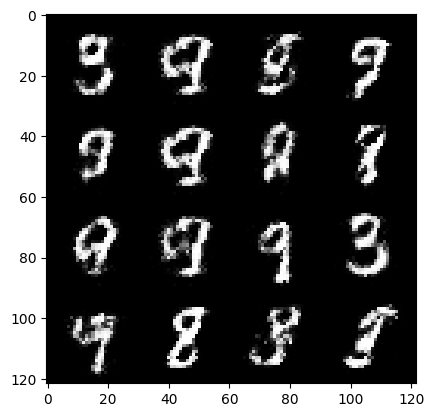

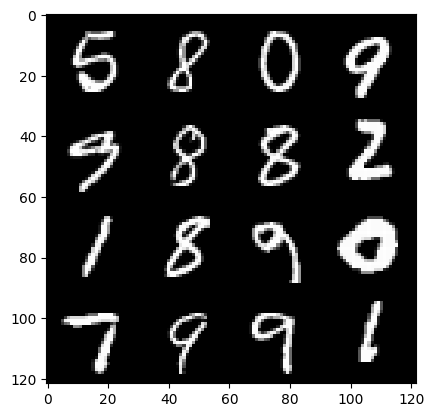

epoch : 48 , step :22800 , mean-disc-loss:  0.22746574322382596 , mean-gen-loss 2.689907920360566


  0%|          | 0/469 [00:00<?, ?it/s]

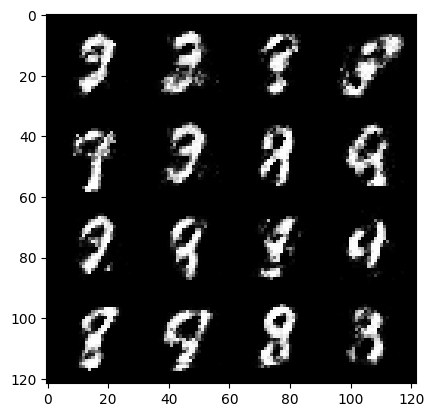

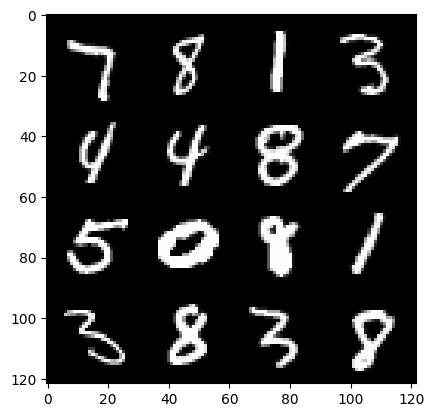

epoch : 49 , step :23100 , mean-disc-loss:  0.256934453099966 , mean-gen-loss 2.5367527254422515


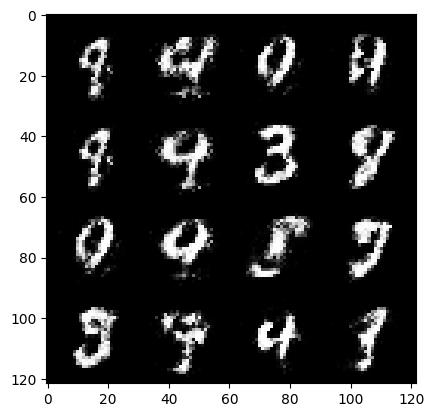

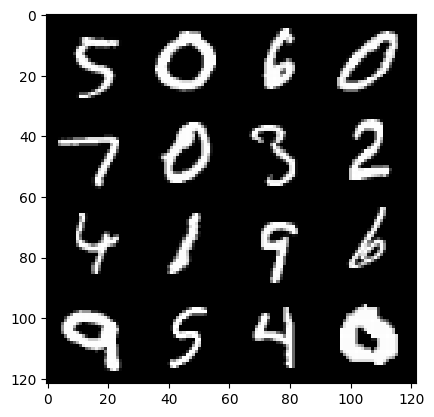

epoch : 49 , step :23400 , mean-disc-loss:  0.23584322412808728 , mean-gen-loss 2.5963979625701894


  0%|          | 0/469 [00:00<?, ?it/s]

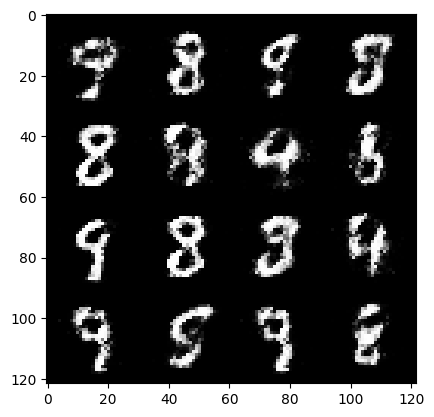

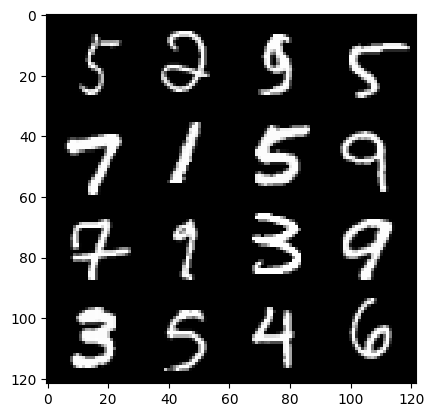

epoch : 50 , step :23700 , mean-disc-loss:  0.21073326925436647 , mean-gen-loss 2.7435047888755815


  0%|          | 0/469 [00:00<?, ?it/s]

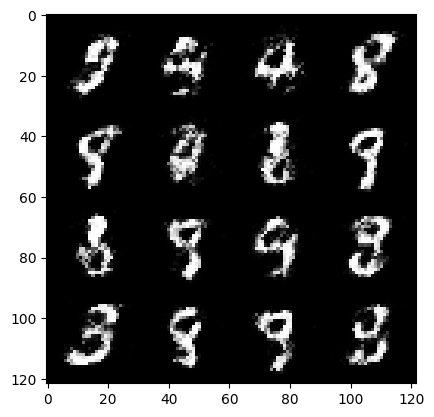

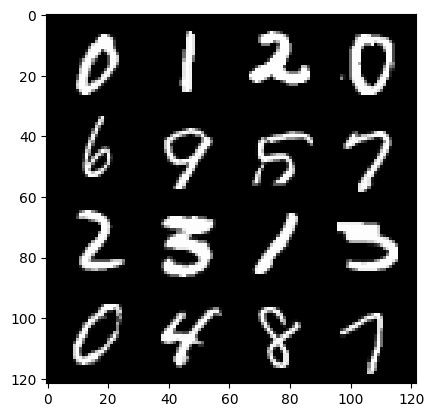

epoch : 51 , step :24000 , mean-disc-loss:  0.2138187789916993 , mean-gen-loss 2.6939346154530837


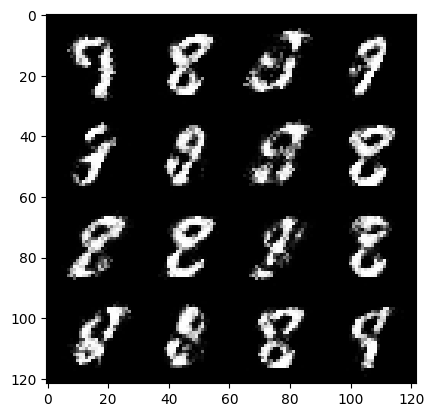

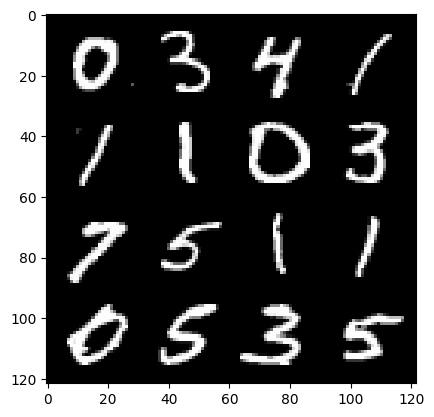

epoch : 51 , step :24300 , mean-disc-loss:  0.21969821294148761 , mean-gen-loss 2.6922641976674404


  0%|          | 0/469 [00:00<?, ?it/s]

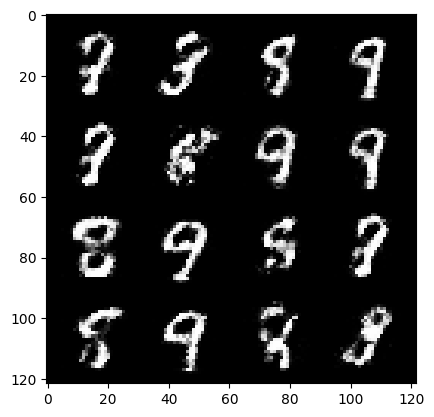

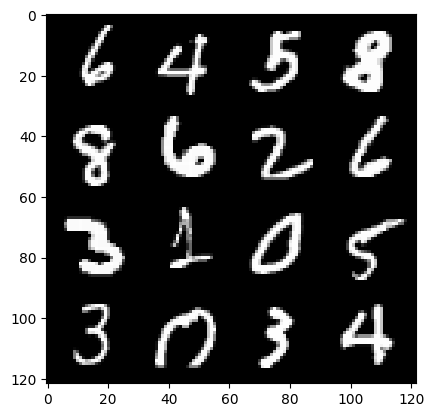

epoch : 52 , step :24600 , mean-disc-loss:  0.22194856703281418 , mean-gen-loss 2.7000055702527357


  0%|          | 0/469 [00:00<?, ?it/s]

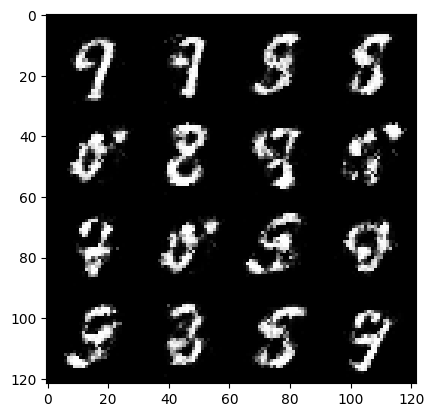

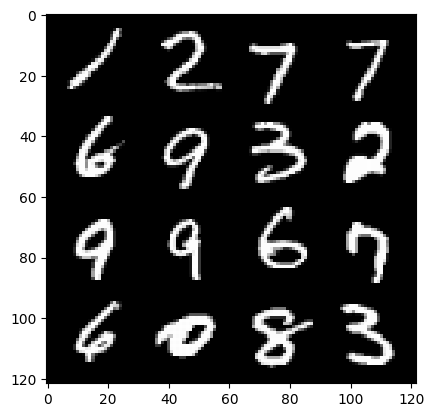

epoch : 53 , step :24900 , mean-disc-loss:  0.21860130861401555 , mean-gen-loss 2.6619461361567174


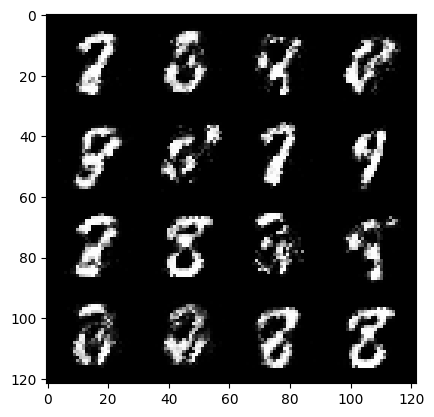

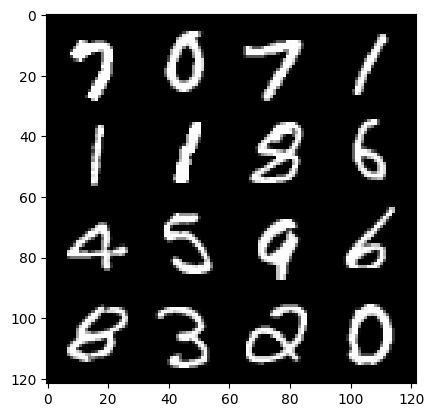

epoch : 53 , step :25200 , mean-disc-loss:  0.22224231099088979 , mean-gen-loss 2.6780904579162605


  0%|          | 0/469 [00:00<?, ?it/s]

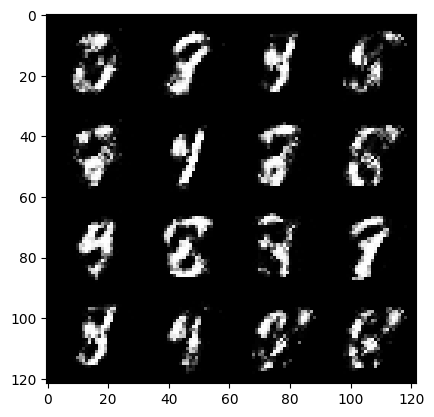

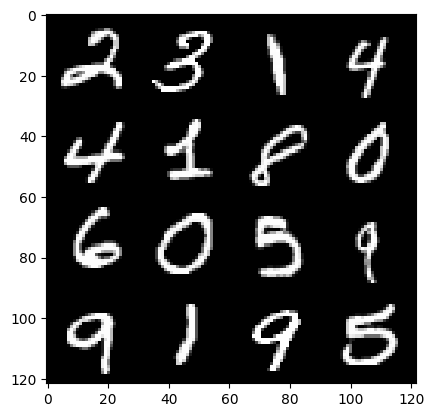

epoch : 54 , step :25500 , mean-disc-loss:  0.23579388062159226 , mean-gen-loss 2.625650129318236


  0%|          | 0/469 [00:00<?, ?it/s]

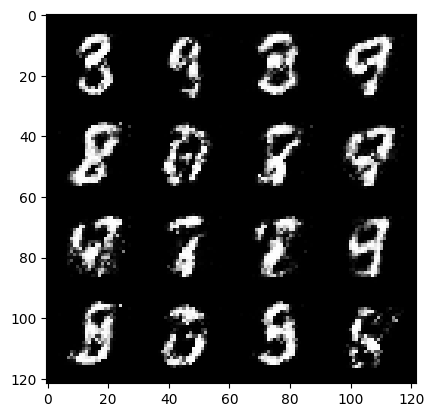

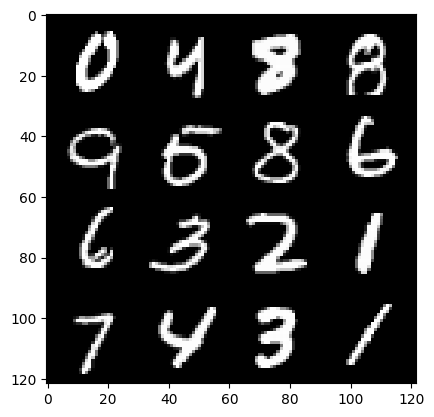

epoch : 55 , step :25800 , mean-disc-loss:  0.23695964102943734 , mean-gen-loss 2.5295336047808337


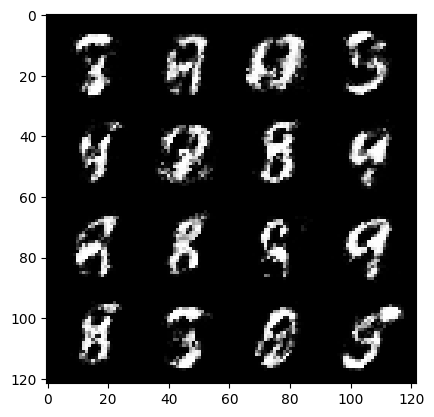

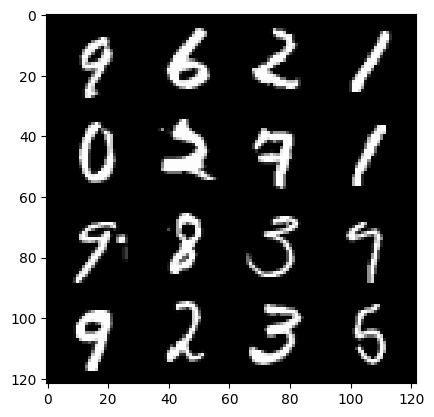

epoch : 55 , step :26100 , mean-disc-loss:  0.24212296098470684 , mean-gen-loss 2.5262209081649765


  0%|          | 0/469 [00:00<?, ?it/s]

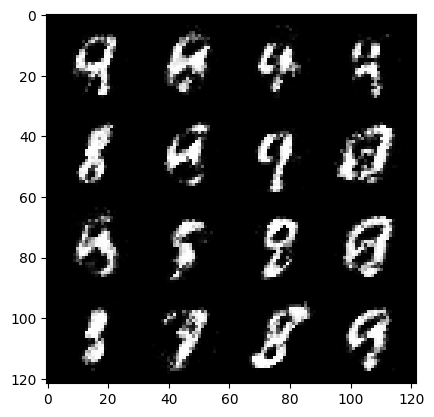

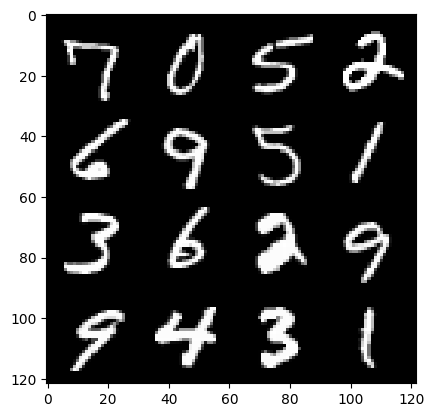

epoch : 56 , step :26400 , mean-disc-loss:  0.24879181121786442 , mean-gen-loss 2.445675471623739


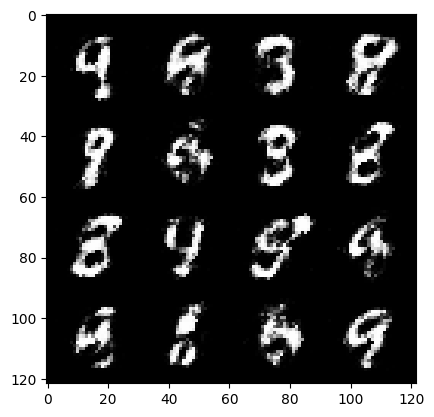

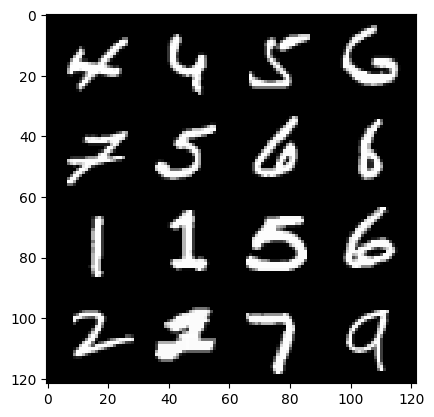

epoch : 56 , step :26700 , mean-disc-loss:  0.24742305303613332 , mean-gen-loss 2.4392872858047494


  0%|          | 0/469 [00:00<?, ?it/s]

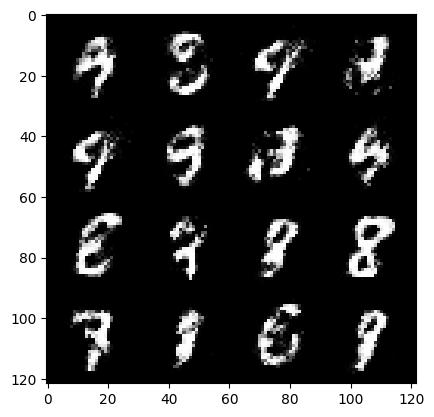

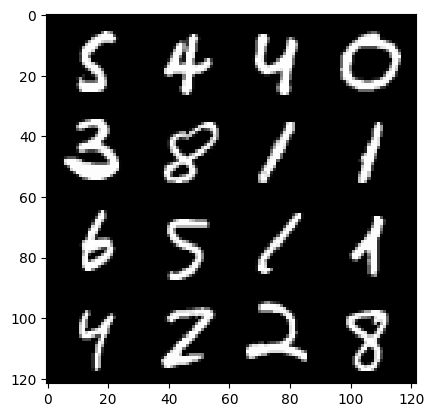

epoch : 57 , step :27000 , mean-disc-loss:  0.25132181445757545 , mean-gen-loss 2.4206527157624556


  0%|          | 0/469 [00:00<?, ?it/s]

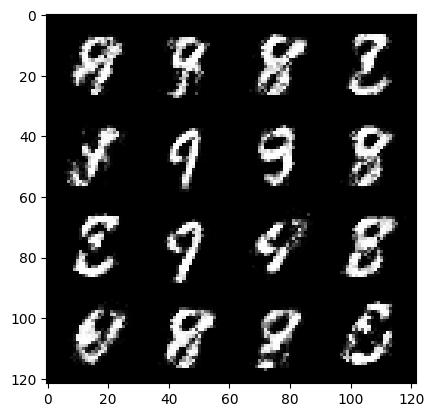

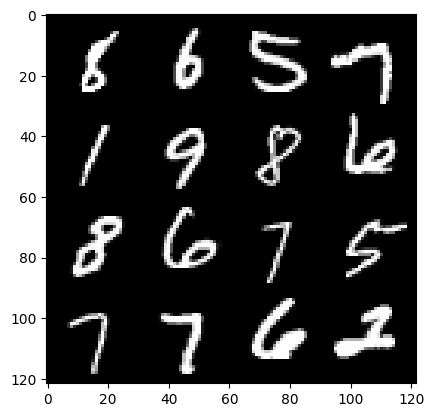

epoch : 58 , step :27300 , mean-disc-loss:  0.2511561863621076 , mean-gen-loss 2.3837996462980895


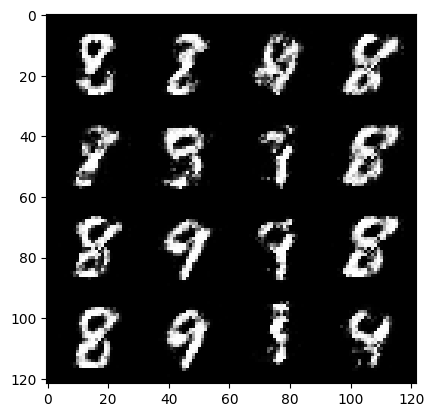

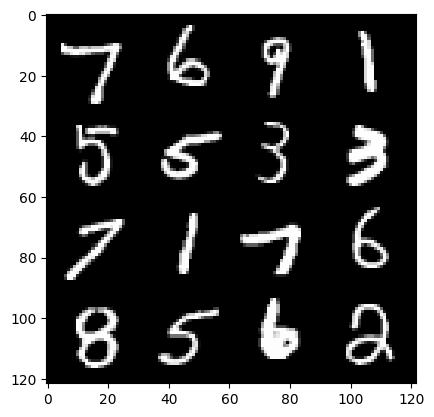

epoch : 58 , step :27600 , mean-disc-loss:  0.24571080679694796 , mean-gen-loss 2.4155474146207165


  0%|          | 0/469 [00:00<?, ?it/s]

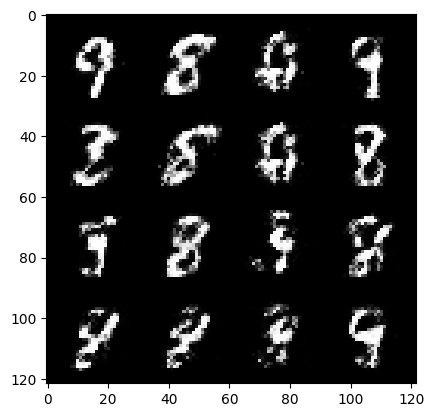

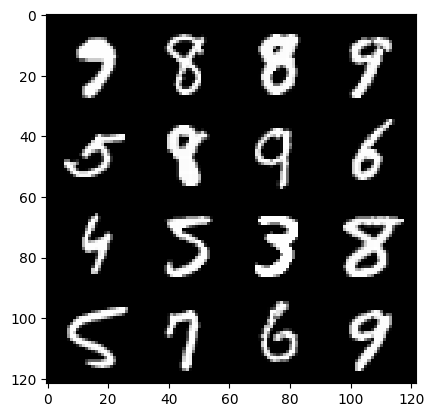

epoch : 59 , step :27900 , mean-disc-loss:  0.24190725574890753 , mean-gen-loss 2.508550746838251


  0%|          | 0/469 [00:00<?, ?it/s]

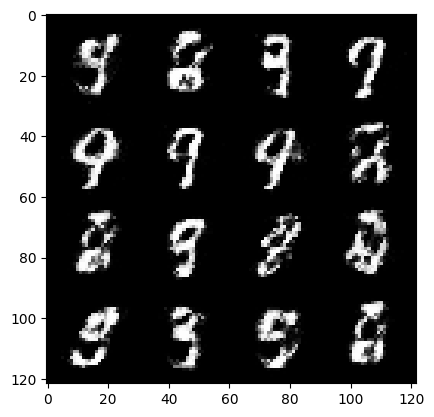

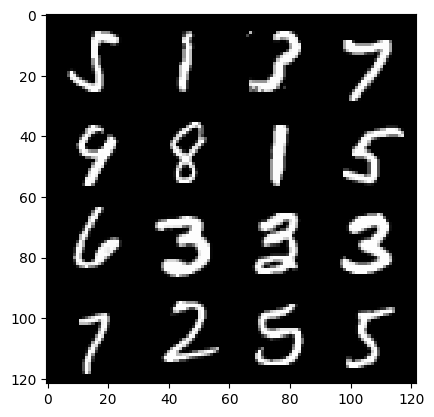

epoch : 60 , step :28200 , mean-disc-loss:  0.26920966108640015 , mean-gen-loss 2.40239833434423


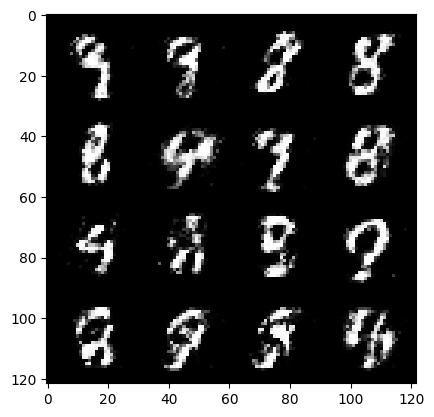

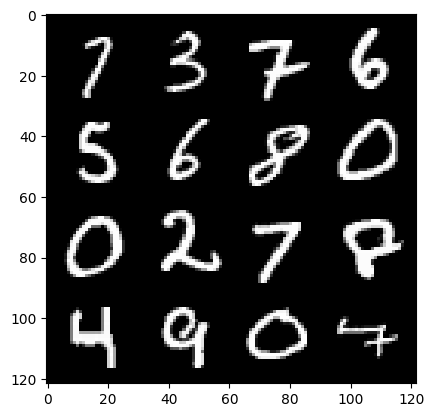

epoch : 60 , step :28500 , mean-disc-loss:  0.25728142927090325 , mean-gen-loss 2.3634669454892454


  0%|          | 0/469 [00:00<?, ?it/s]

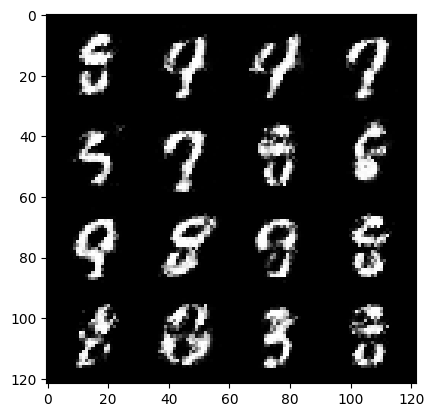

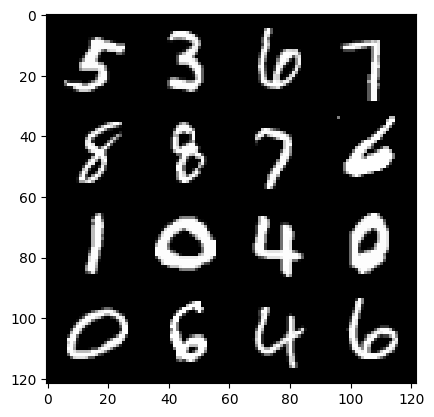

epoch : 61 , step :28800 , mean-disc-loss:  0.24244335462649683 , mean-gen-loss 2.4135568769772826


  0%|          | 0/469 [00:00<?, ?it/s]

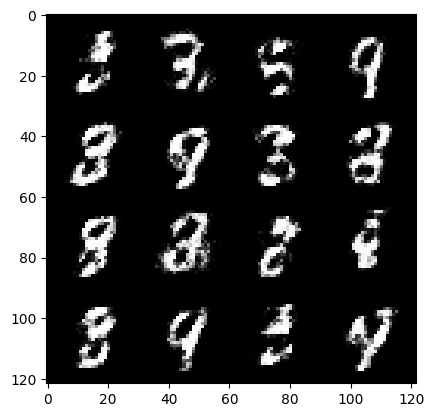

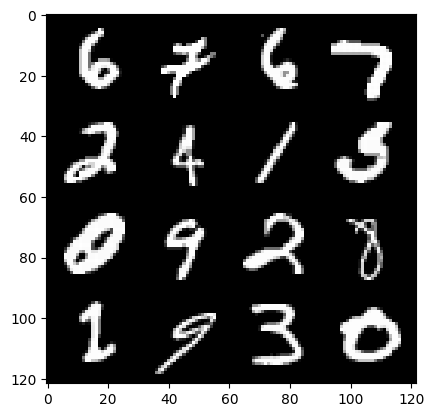

epoch : 62 , step :29100 , mean-disc-loss:  0.24320548559228597 , mean-gen-loss 2.370195279916128


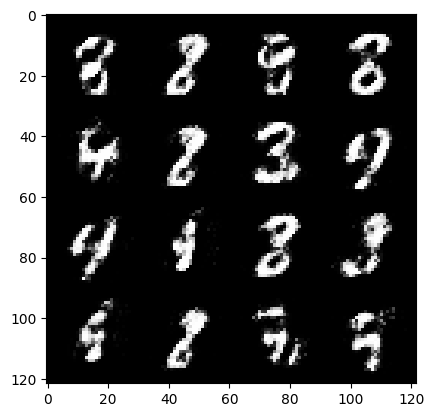

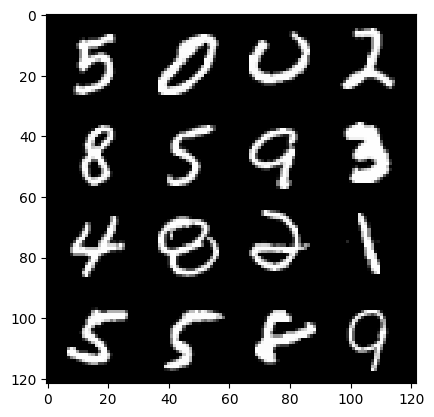

epoch : 62 , step :29400 , mean-disc-loss:  0.2726325606803103 , mean-gen-loss 2.2983816723028827


  0%|          | 0/469 [00:00<?, ?it/s]

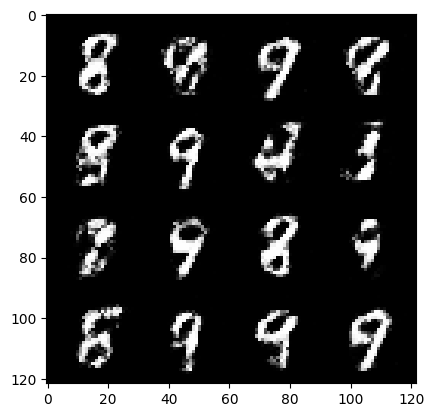

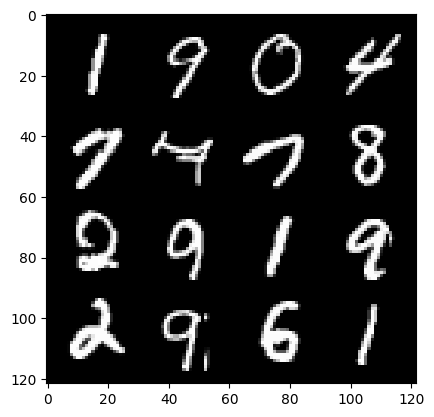

epoch : 63 , step :29700 , mean-disc-loss:  0.2644135914246242 , mean-gen-loss 2.33037494103114


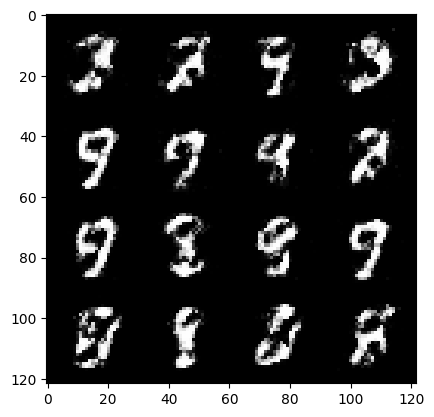

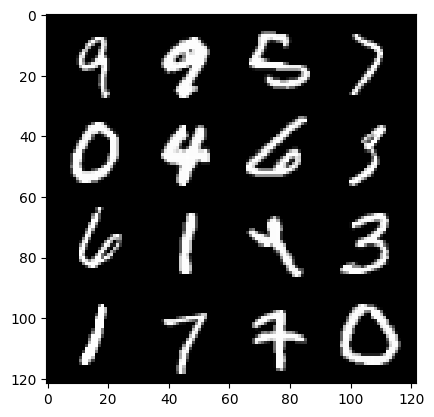

epoch : 63 , step :30000 , mean-disc-loss:  0.27116610864798224 , mean-gen-loss 2.3012677057584128


  0%|          | 0/469 [00:00<?, ?it/s]

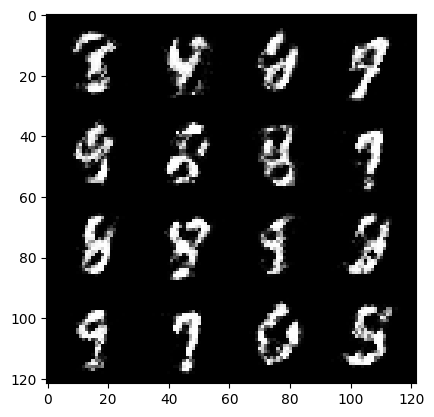

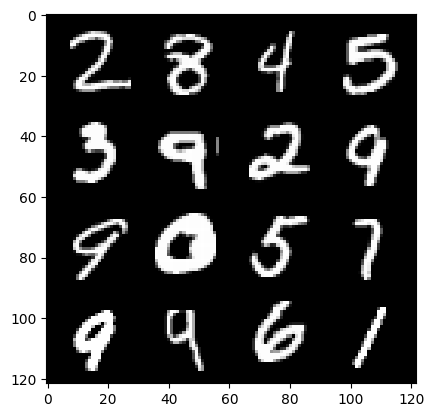

epoch : 64 , step :30300 , mean-disc-loss:  0.29286370923121763 , mean-gen-loss 2.1901207613945015


  0%|          | 0/469 [00:00<?, ?it/s]

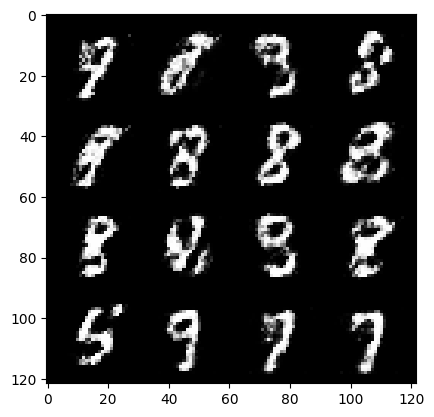

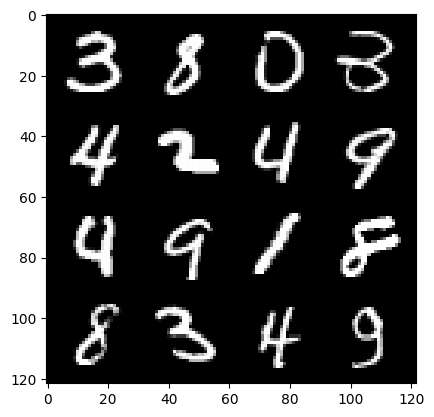

epoch : 65 , step :30600 , mean-disc-loss:  0.283452738672495 , mean-gen-loss 2.22125541448593


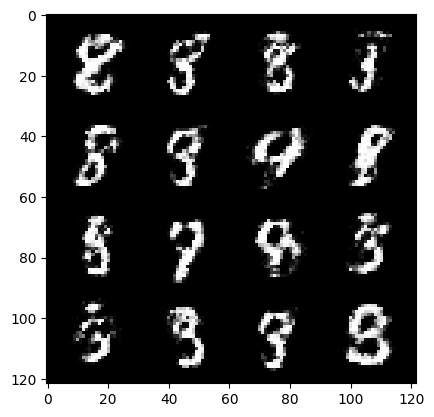

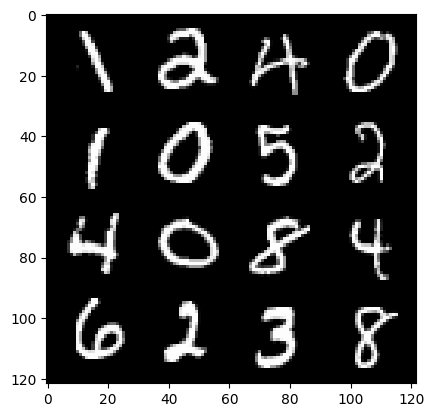

epoch : 65 , step :30900 , mean-disc-loss:  0.27248228420813864 , mean-gen-loss 2.2442473602294895


  0%|          | 0/469 [00:00<?, ?it/s]

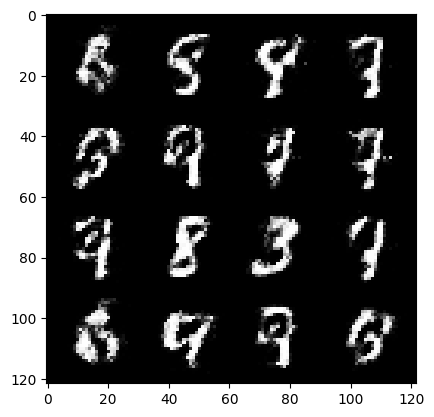

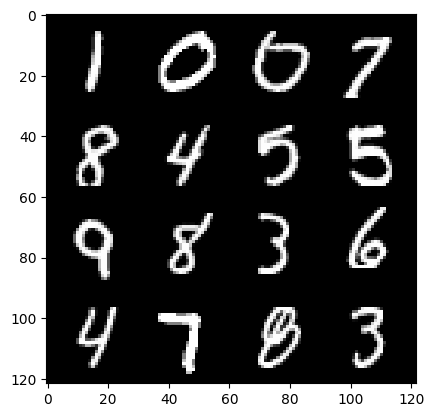

epoch : 66 , step :31200 , mean-disc-loss:  0.2802373170355957 , mean-gen-loss 2.231216146151225


  0%|          | 0/469 [00:00<?, ?it/s]

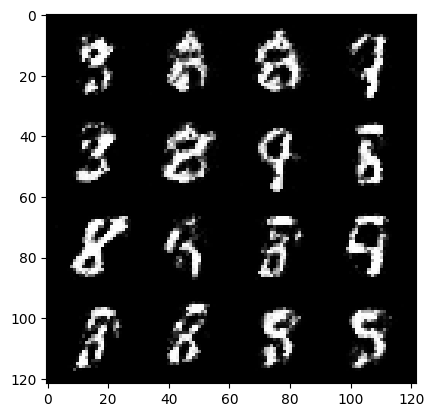

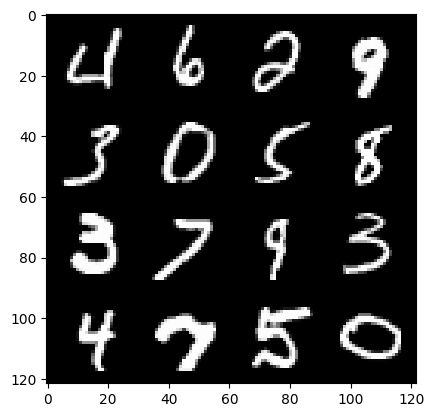

epoch : 67 , step :31500 , mean-disc-loss:  0.28299264291922216 , mean-gen-loss 2.2060470926761635


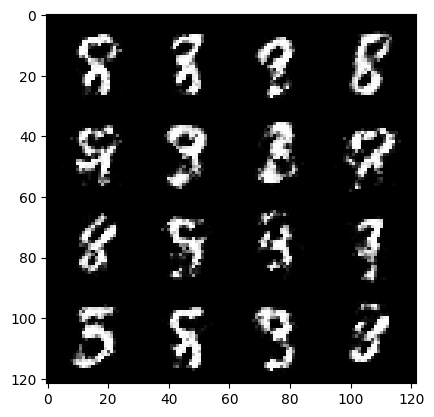

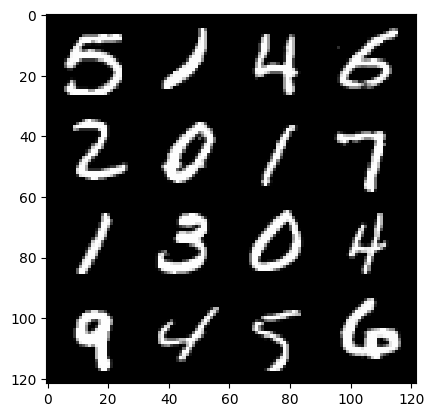

epoch : 67 , step :31800 , mean-disc-loss:  0.28536457190910963 , mean-gen-loss 2.205290698607763


  0%|          | 0/469 [00:00<?, ?it/s]

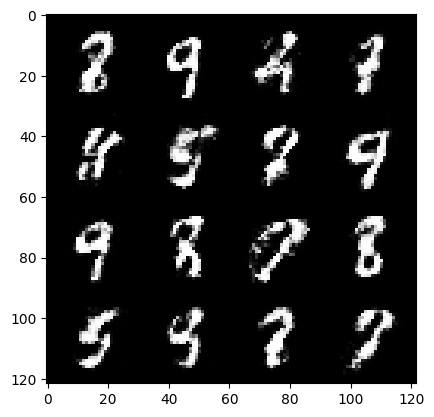

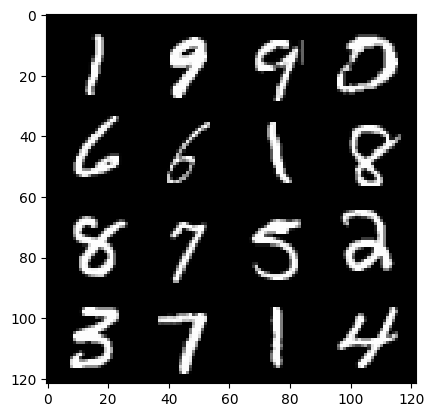

epoch : 68 , step :32100 , mean-disc-loss:  0.30730340361595154 , mean-gen-loss 2.1496144096056624


  0%|          | 0/469 [00:00<?, ?it/s]

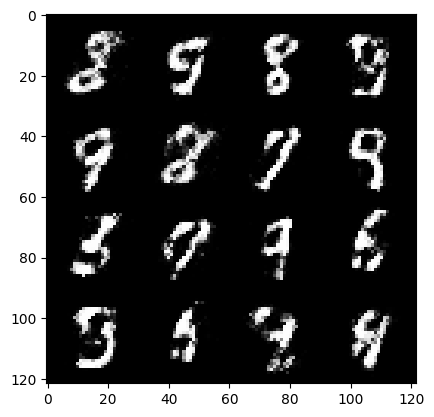

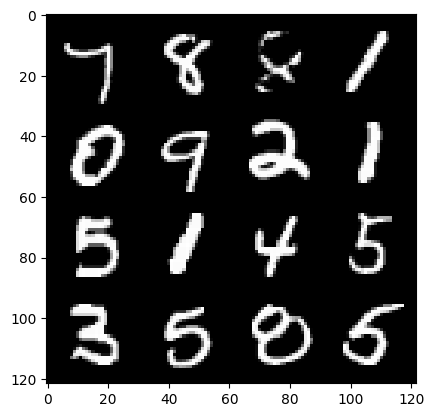

epoch : 69 , step :32400 , mean-disc-loss:  0.29969737251599626 , mean-gen-loss 2.097182268301647


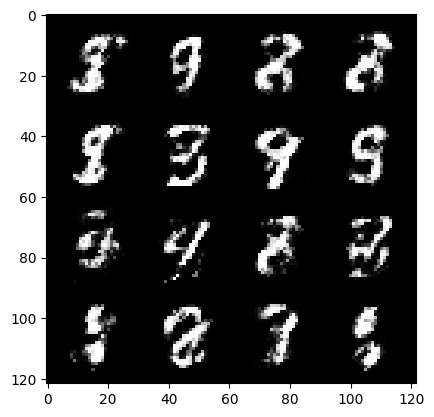

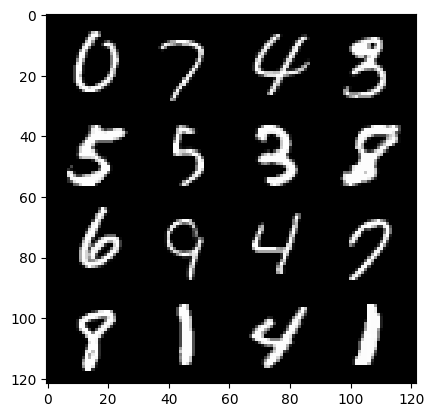

epoch : 69 , step :32700 , mean-disc-loss:  0.28046345805128414 , mean-gen-loss 2.239161008199056


  0%|          | 0/469 [00:00<?, ?it/s]

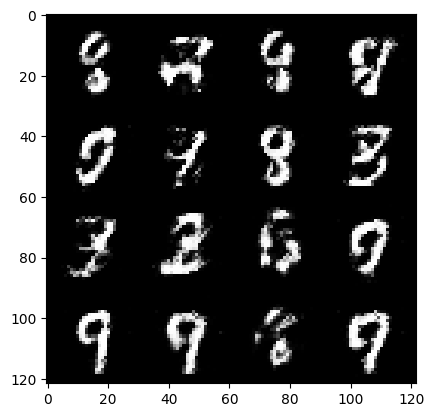

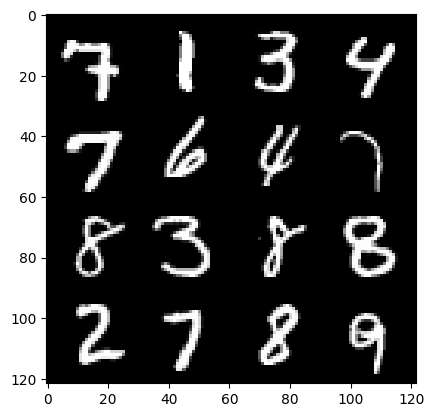

epoch : 70 , step :33000 , mean-disc-loss:  0.3028631744285425 , mean-gen-loss 2.1671776759624497


  0%|          | 0/469 [00:00<?, ?it/s]

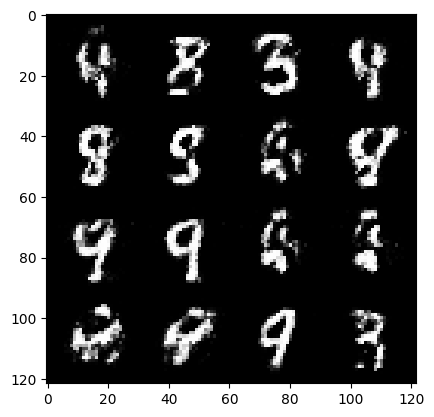

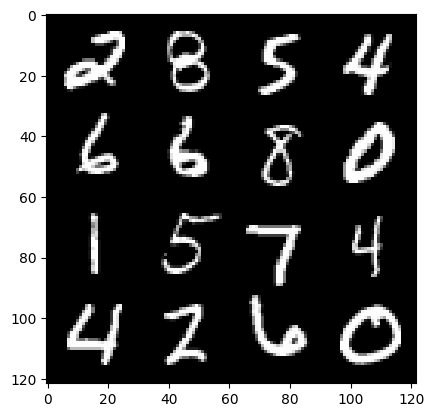

epoch : 71 , step :33300 , mean-disc-loss:  0.2989109617471696 , mean-gen-loss 2.099173103173575


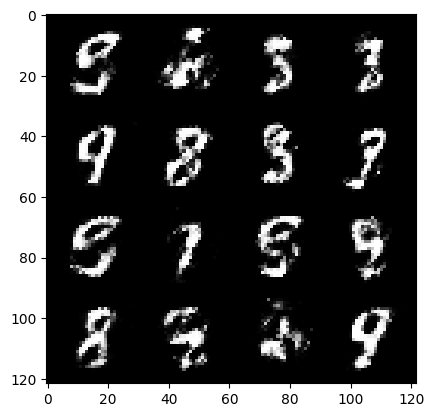

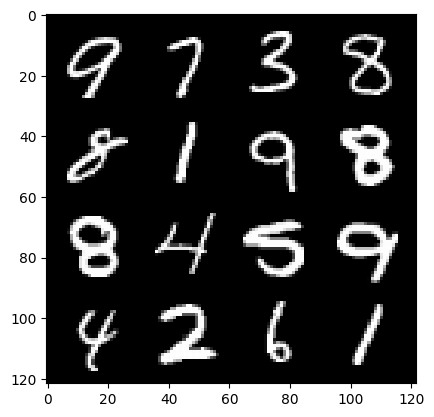

epoch : 71 , step :33600 , mean-disc-loss:  0.29219212174415604 , mean-gen-loss 2.116756590604782


  0%|          | 0/469 [00:00<?, ?it/s]

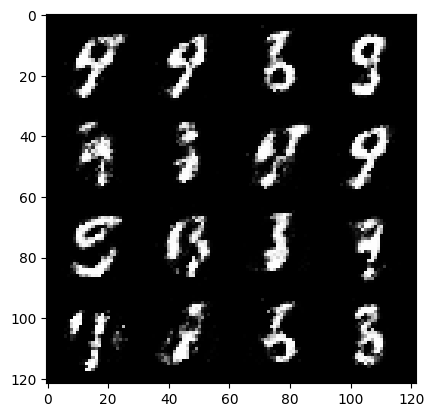

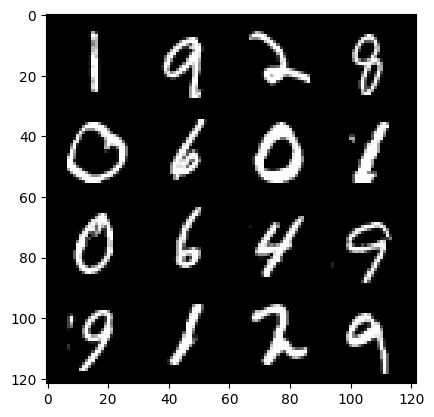

epoch : 72 , step :33900 , mean-disc-loss:  0.2657890847822028 , mean-gen-loss 2.2558274944623324


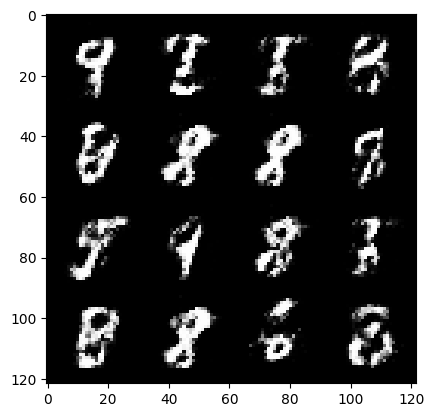

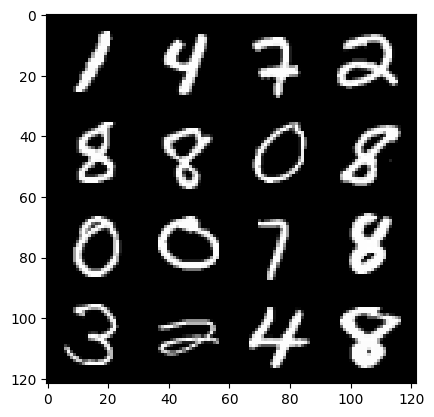

epoch : 72 , step :34200 , mean-disc-loss:  0.27778254052003204 , mean-gen-loss 2.2245145396391544


  0%|          | 0/469 [00:00<?, ?it/s]

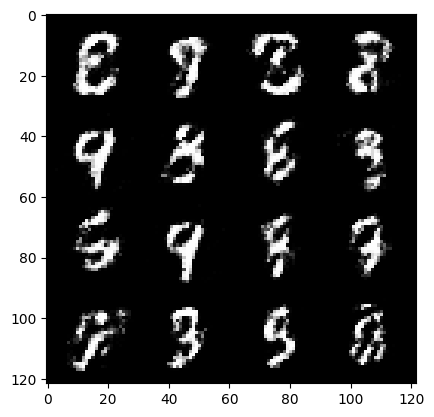

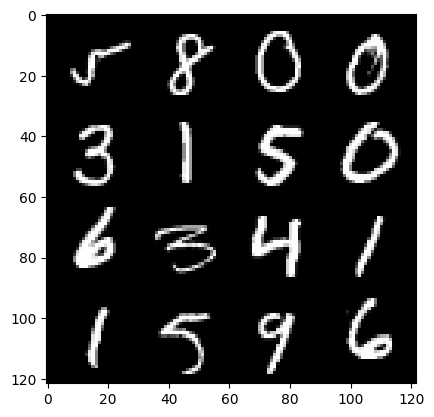

epoch : 73 , step :34500 , mean-disc-loss:  0.28762266427278504 , mean-gen-loss 2.190471330881121


  0%|          | 0/469 [00:00<?, ?it/s]

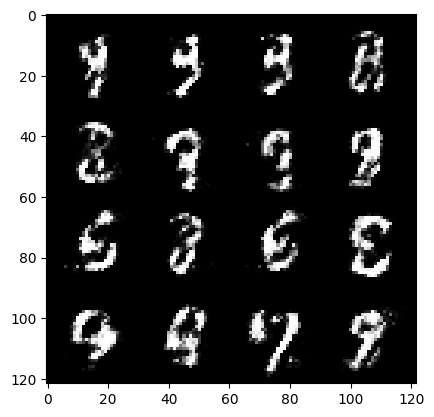

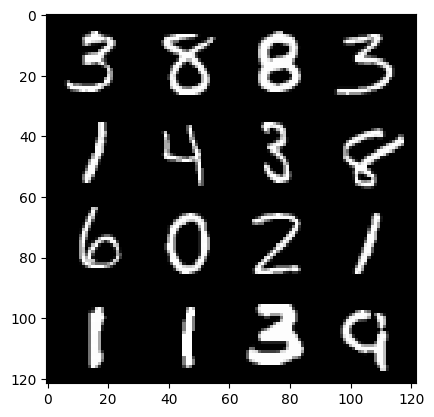

epoch : 74 , step :34800 , mean-disc-loss:  0.32542971163988116 , mean-gen-loss 2.082412059704462


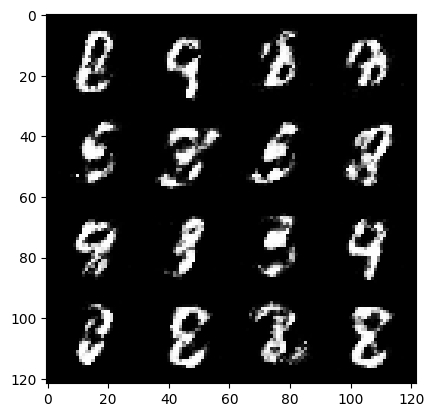

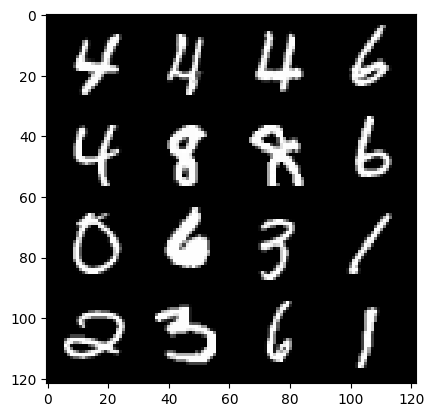

epoch : 74 , step :35100 , mean-disc-loss:  0.30439947962760944 , mean-gen-loss 2.071303224166234


  0%|          | 0/469 [00:00<?, ?it/s]

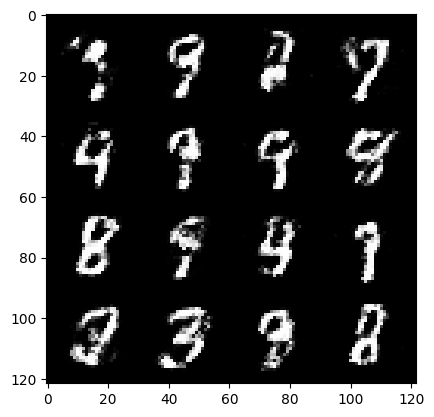

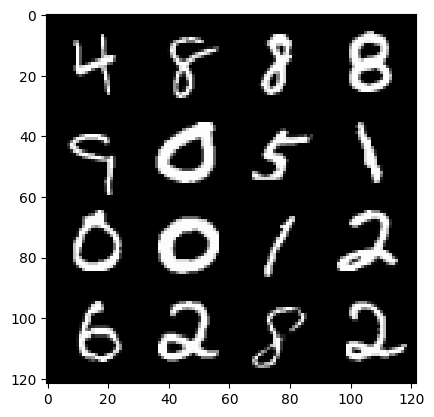

epoch : 75 , step :35400 , mean-disc-loss:  0.2994854798416296 , mean-gen-loss 2.1135064645608264


  0%|          | 0/469 [00:00<?, ?it/s]

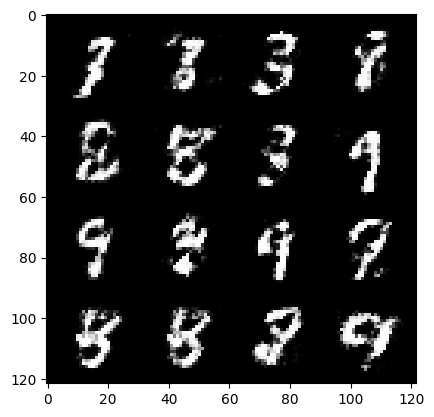

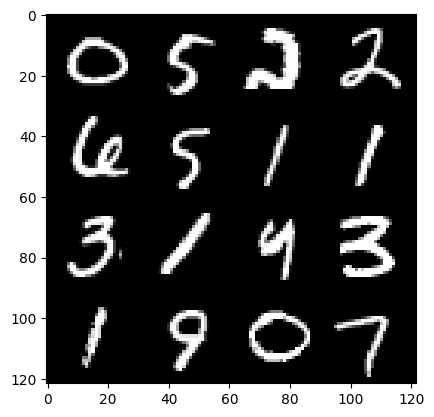

epoch : 76 , step :35700 , mean-disc-loss:  0.2974817698200544 , mean-gen-loss 2.100902922948201


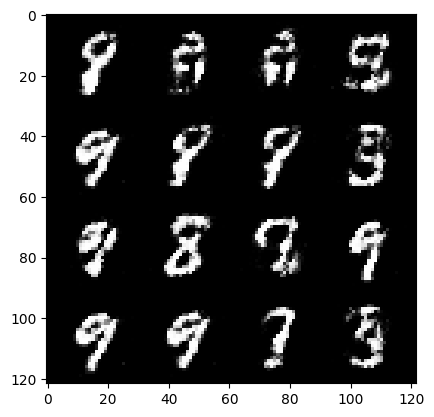

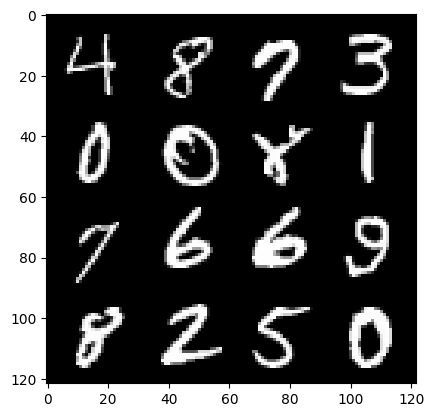

epoch : 76 , step :36000 , mean-disc-loss:  0.2988417682548361 , mean-gen-loss 2.082762902180353


  0%|          | 0/469 [00:00<?, ?it/s]

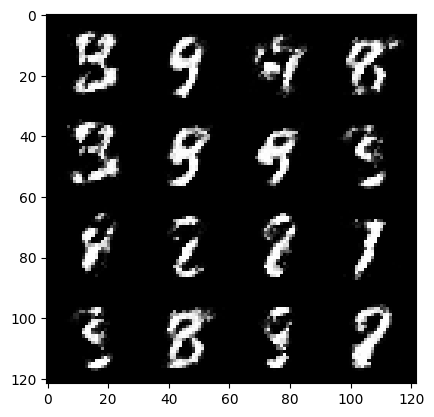

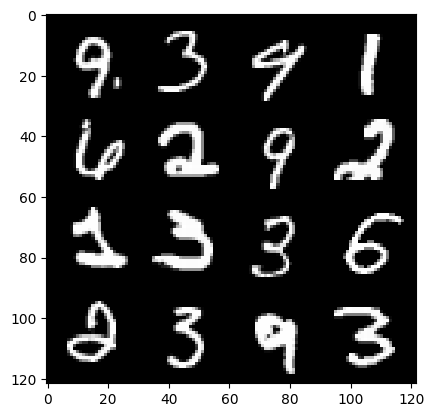

epoch : 77 , step :36300 , mean-disc-loss:  0.28875884647170685 , mean-gen-loss 2.078739409446715


  0%|          | 0/469 [00:00<?, ?it/s]

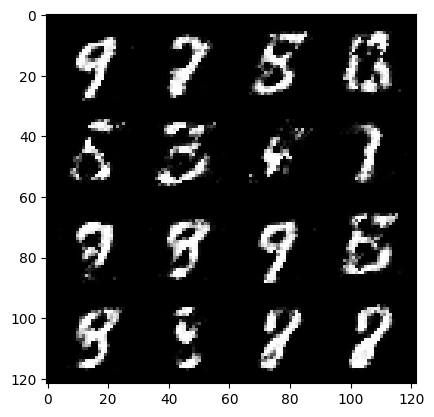

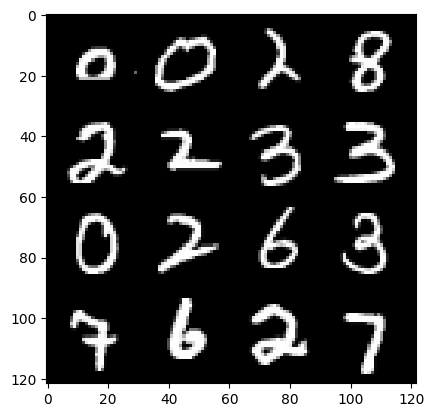

epoch : 78 , step :36600 , mean-disc-loss:  0.32348923499385507 , mean-gen-loss 2.025149432023367


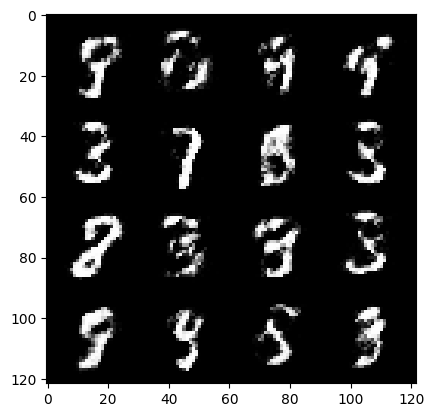

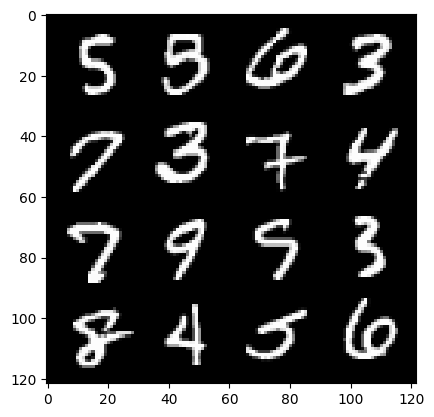

epoch : 78 , step :36900 , mean-disc-loss:  0.2997028047343093 , mean-gen-loss 2.0699269954363504


  0%|          | 0/469 [00:00<?, ?it/s]

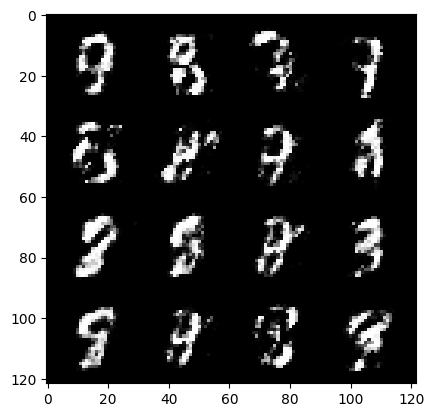

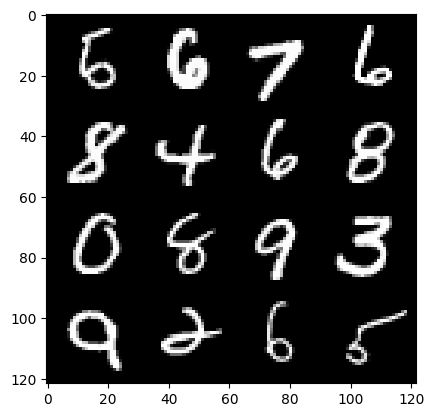

epoch : 79 , step :37200 , mean-disc-loss:  0.3166187380750976 , mean-gen-loss 2.073111116488773


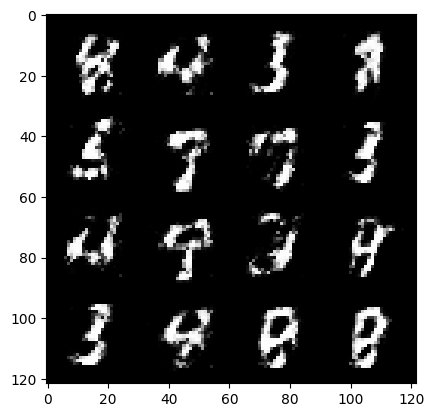

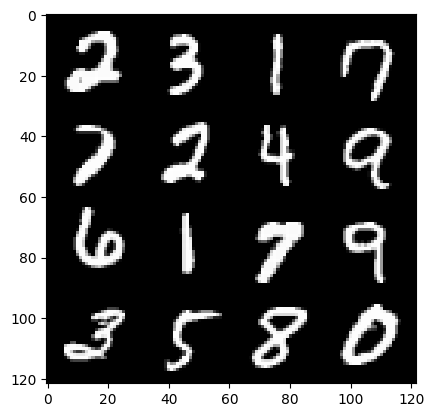

epoch : 79 , step :37500 , mean-disc-loss:  0.3221417425572871 , mean-gen-loss 2.023684888680776


  0%|          | 0/469 [00:00<?, ?it/s]

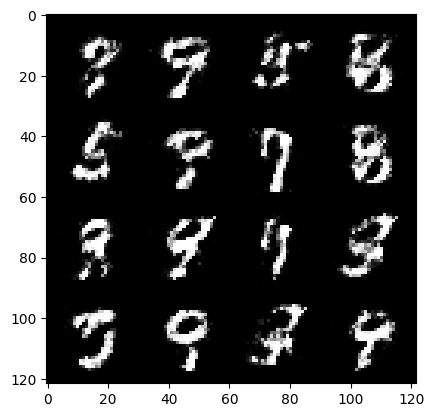

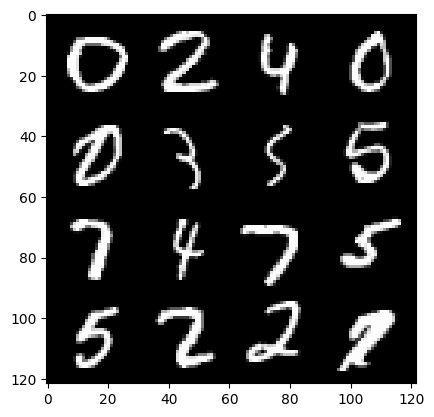

epoch : 80 , step :37800 , mean-disc-loss:  0.3357991448541479 , mean-gen-loss 1.9731724603970844


  0%|          | 0/469 [00:00<?, ?it/s]

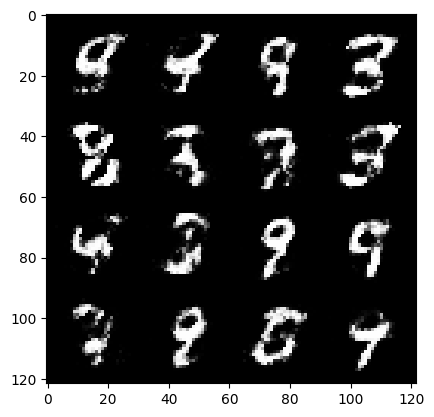

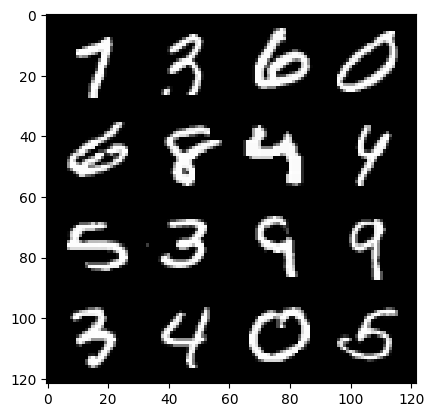

epoch : 81 , step :38100 , mean-disc-loss:  0.31375675618648563 , mean-gen-loss 2.0158487776915233


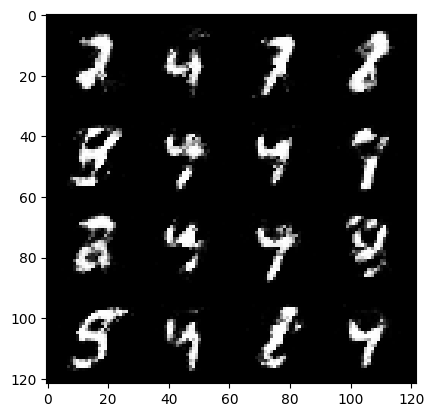

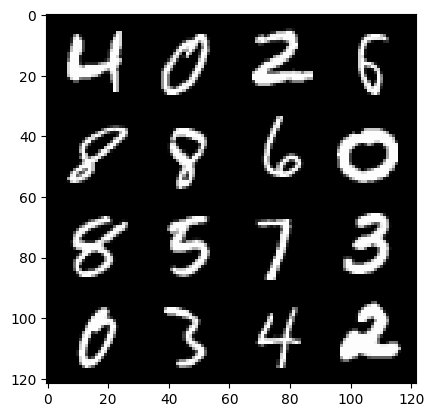

epoch : 81 , step :38400 , mean-disc-loss:  0.32772616629799206 , mean-gen-loss 1.9627565010388681


  0%|          | 0/469 [00:00<?, ?it/s]

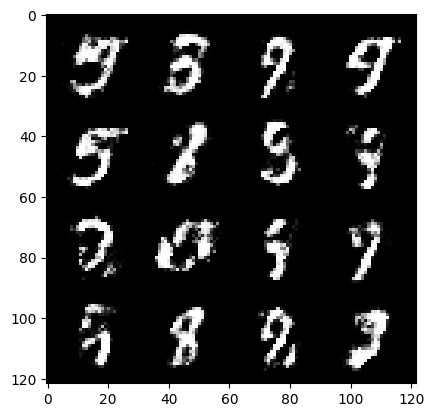

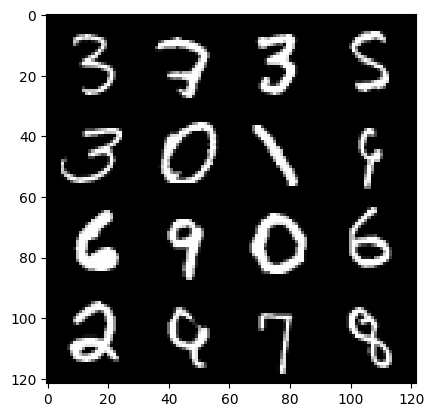

epoch : 82 , step :38700 , mean-disc-loss:  0.340119882076979 , mean-gen-loss 1.9602282698949187


  0%|          | 0/469 [00:00<?, ?it/s]

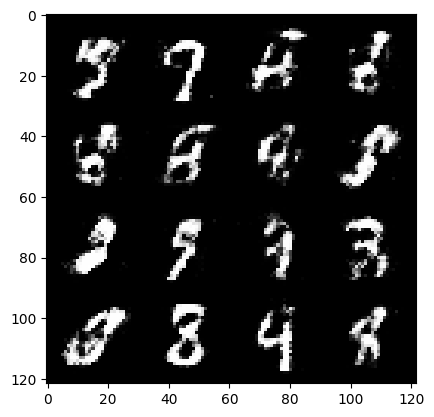

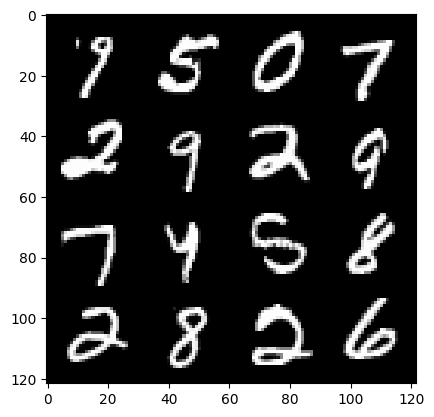

epoch : 83 , step :39000 , mean-disc-loss:  0.3415631506343684 , mean-gen-loss 1.89827869574229


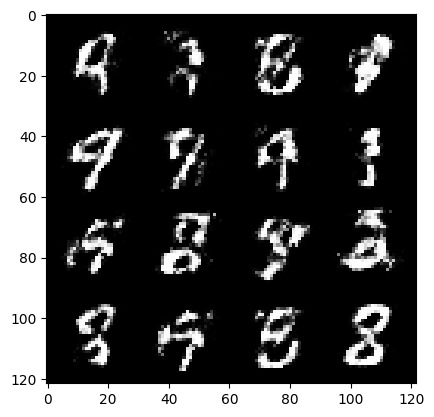

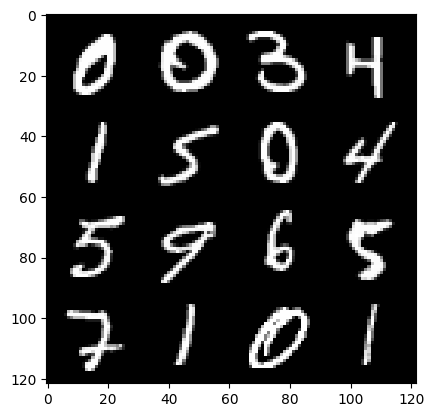

epoch : 83 , step :39300 , mean-disc-loss:  0.3309718846281369 , mean-gen-loss 1.9255365057786298


  0%|          | 0/469 [00:00<?, ?it/s]

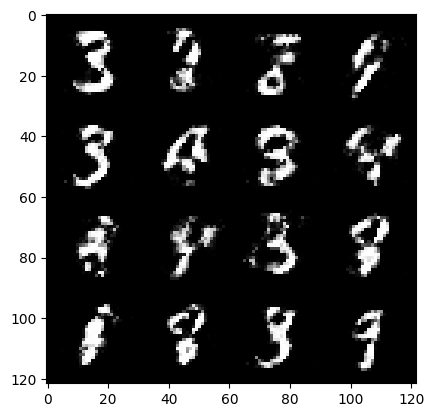

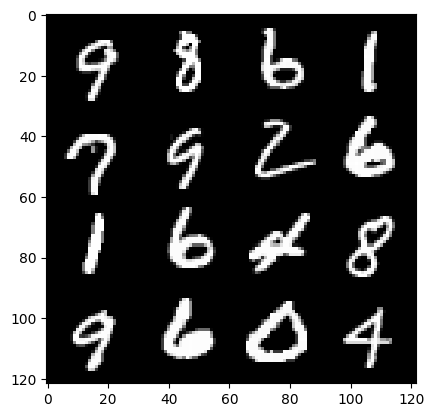

epoch : 84 , step :39600 , mean-disc-loss:  0.31866061240434673 , mean-gen-loss 2.045160028139751


  0%|          | 0/469 [00:00<?, ?it/s]

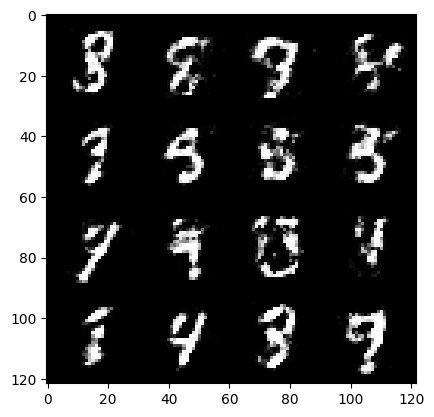

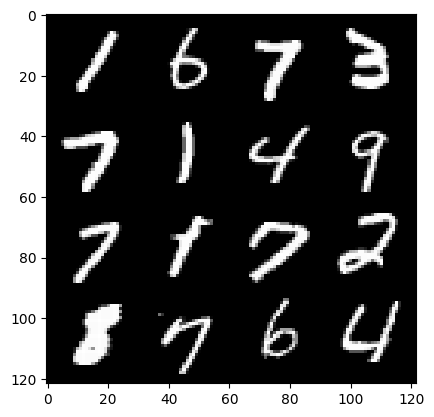

epoch : 85 , step :39900 , mean-disc-loss:  0.32677734921375906 , mean-gen-loss 1.9462737838427226


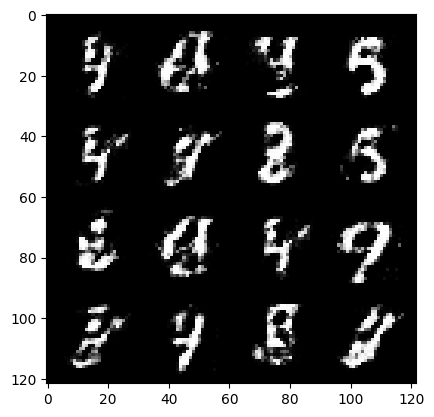

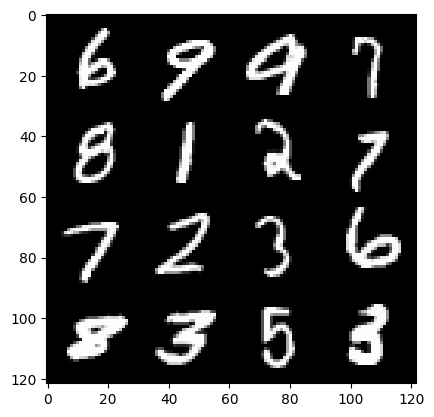

epoch : 85 , step :40200 , mean-disc-loss:  0.3254456370075544 , mean-gen-loss 1.9679768399397535


  0%|          | 0/469 [00:00<?, ?it/s]

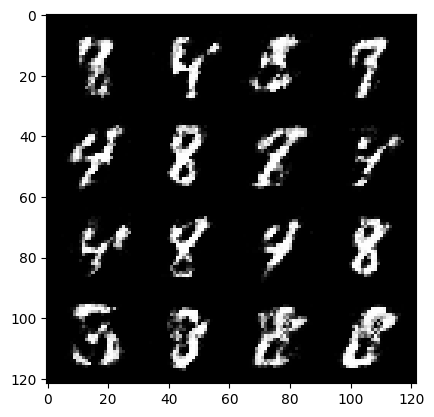

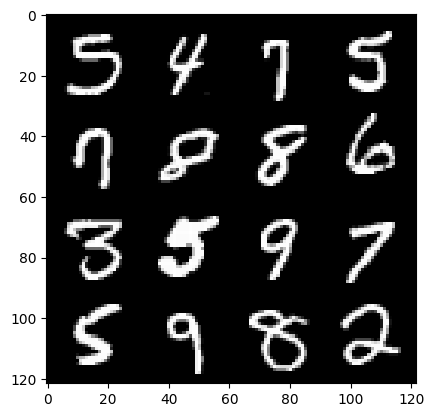

epoch : 86 , step :40500 , mean-disc-loss:  0.3324556712806225 , mean-gen-loss 1.928682773510614


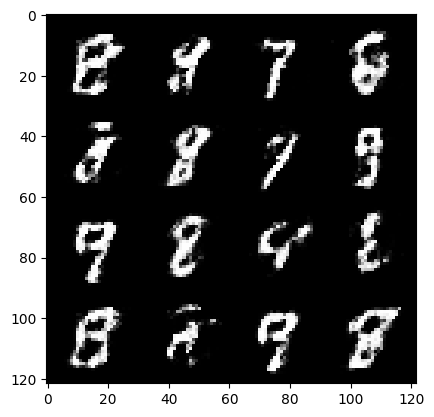

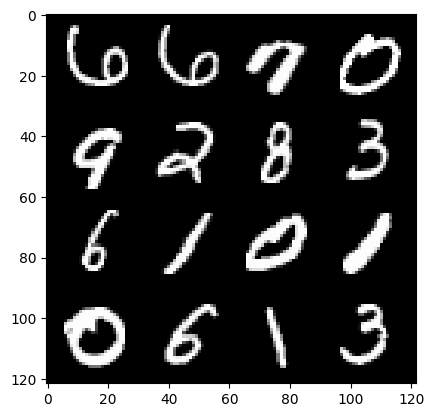

epoch : 86 , step :40800 , mean-disc-loss:  0.33663326551516853 , mean-gen-loss 1.9210271000862118


  0%|          | 0/469 [00:00<?, ?it/s]

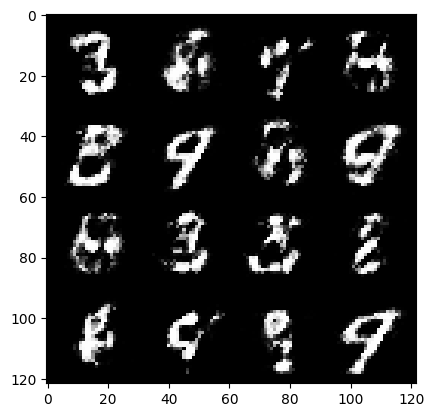

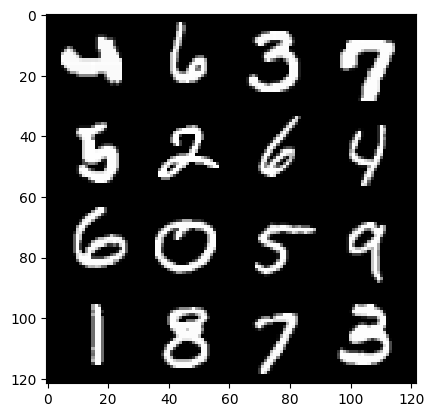

epoch : 87 , step :41100 , mean-disc-loss:  0.34718905707200354 , mean-gen-loss 1.8765781040986378


  0%|          | 0/469 [00:00<?, ?it/s]

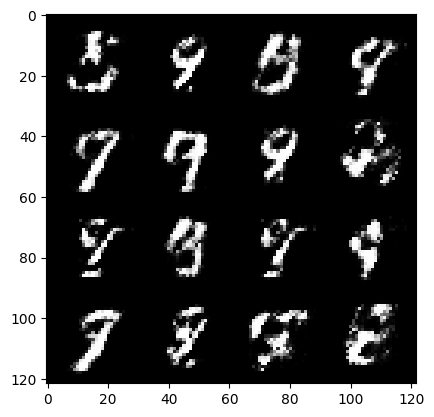

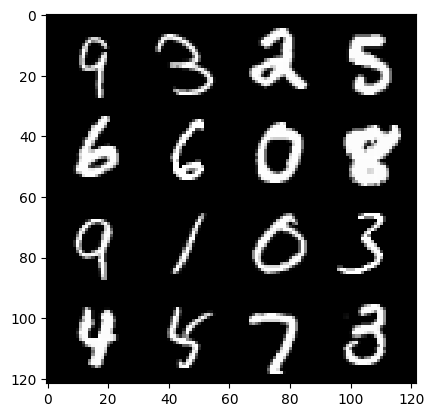

epoch : 88 , step :41400 , mean-disc-loss:  0.3563896034161252 , mean-gen-loss 1.8677365108331048


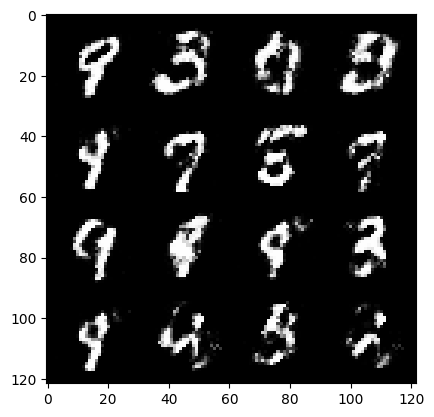

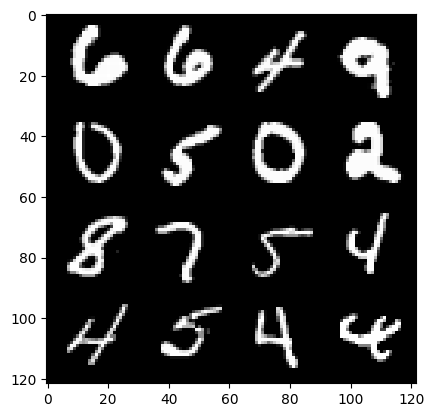

epoch : 88 , step :41700 , mean-disc-loss:  0.3449682076772055 , mean-gen-loss 1.861251604954401


  0%|          | 0/469 [00:00<?, ?it/s]

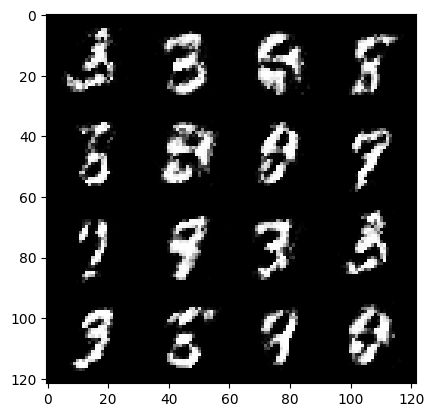

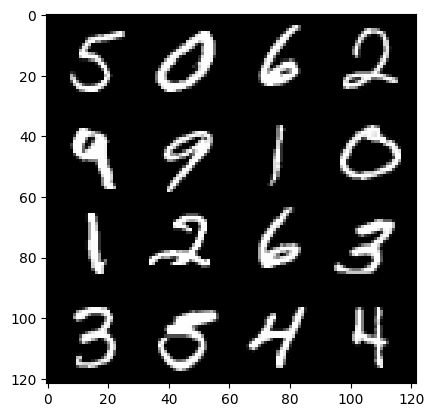

epoch : 89 , step :42000 , mean-disc-loss:  0.3283927079538504 , mean-gen-loss 1.9041843263308211


  0%|          | 0/469 [00:00<?, ?it/s]

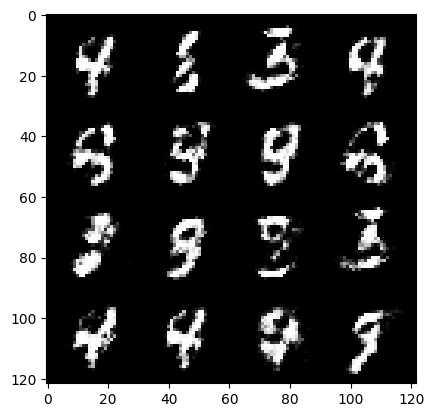

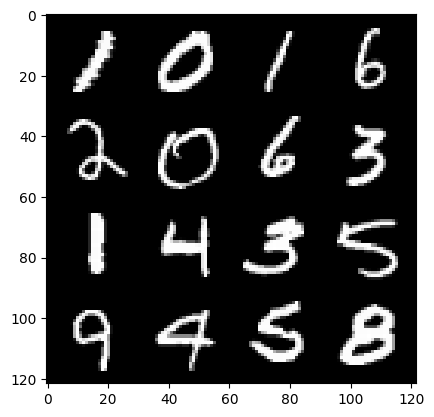

epoch : 90 , step :42300 , mean-disc-loss:  0.32542895118395476 , mean-gen-loss 1.955556726853054


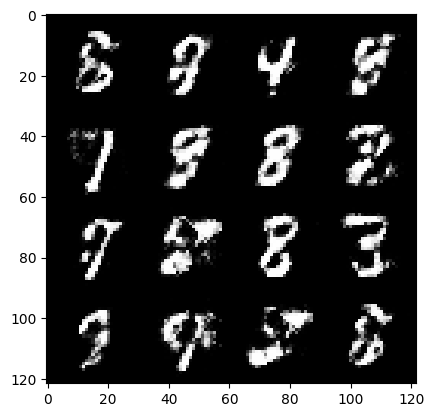

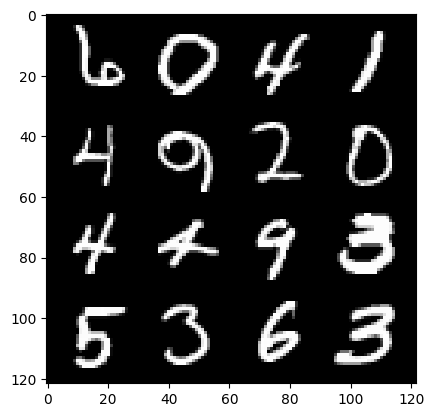

epoch : 90 , step :42600 , mean-disc-loss:  0.31882029051581984 , mean-gen-loss 2.003000369469325


  0%|          | 0/469 [00:00<?, ?it/s]

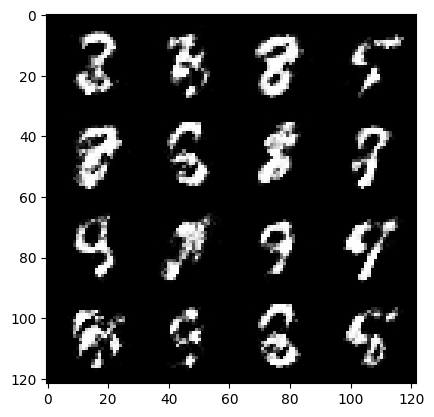

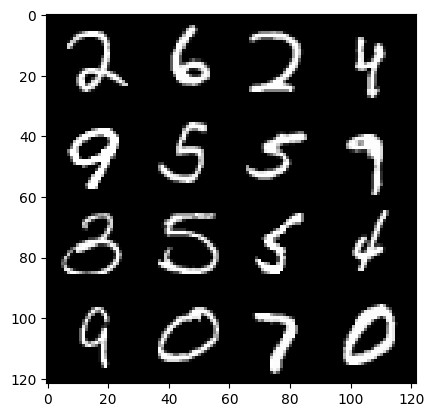

epoch : 91 , step :42900 , mean-disc-loss:  0.3308003219962122 , mean-gen-loss 1.9072193459669748


  0%|          | 0/469 [00:00<?, ?it/s]

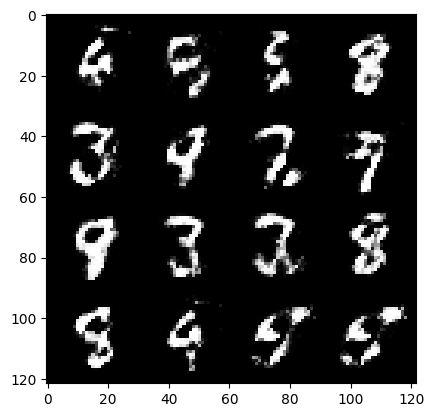

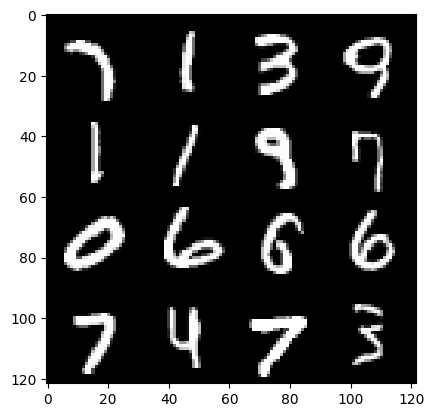

epoch : 92 , step :43200 , mean-disc-loss:  0.3367530323068299 , mean-gen-loss 1.872336070537568


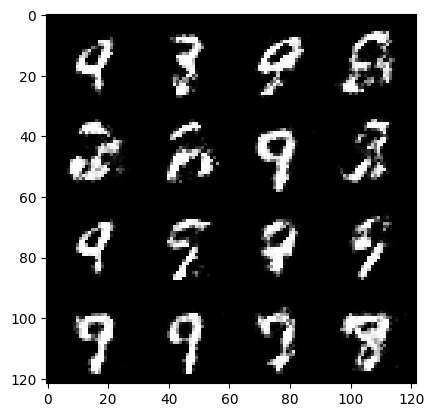

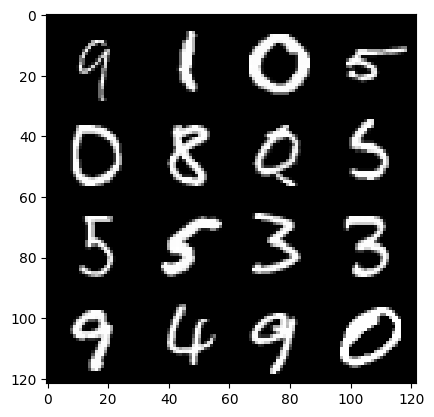

epoch : 92 , step :43500 , mean-disc-loss:  0.3581624564528466 , mean-gen-loss 1.8628377068042756


  0%|          | 0/469 [00:00<?, ?it/s]

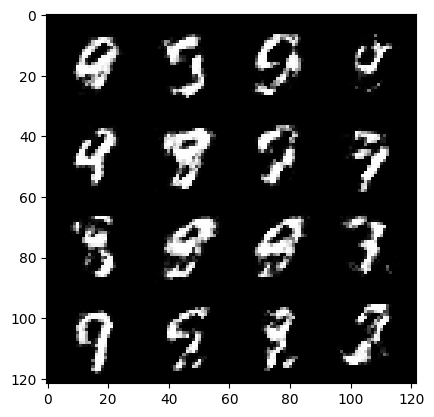

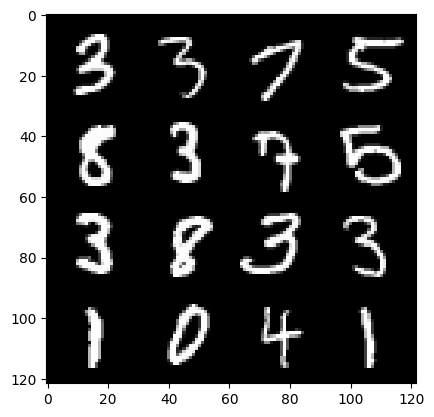

epoch : 93 , step :43800 , mean-disc-loss:  0.34198851635058725 , mean-gen-loss 1.8260619608561195


  0%|          | 0/469 [00:00<?, ?it/s]

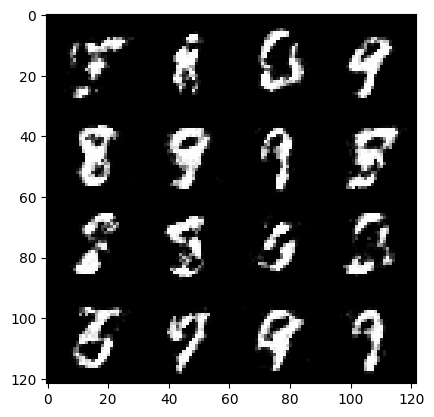

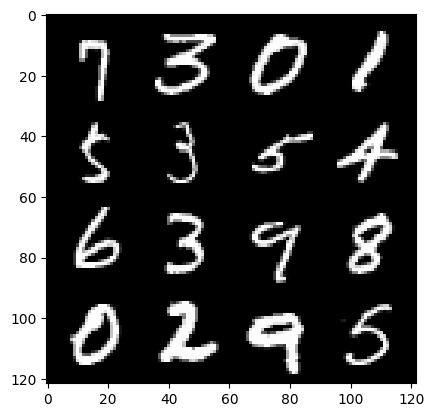

epoch : 94 , step :44100 , mean-disc-loss:  0.33756267036000875 , mean-gen-loss 1.869255067904791


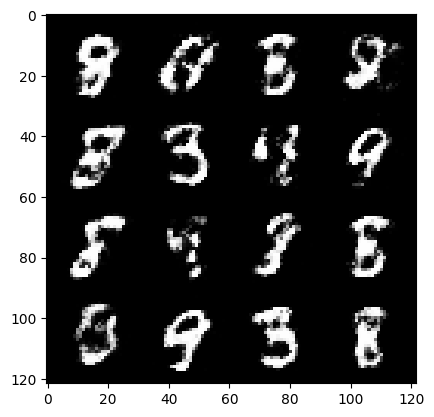

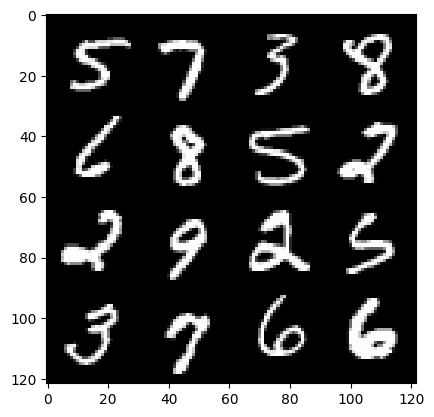

epoch : 94 , step :44400 , mean-disc-loss:  0.3515938684344289 , mean-gen-loss 1.8310711677869163


  0%|          | 0/469 [00:00<?, ?it/s]

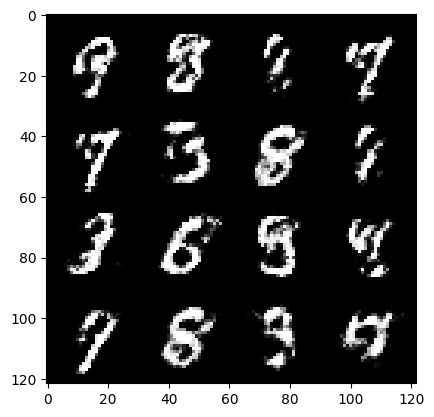

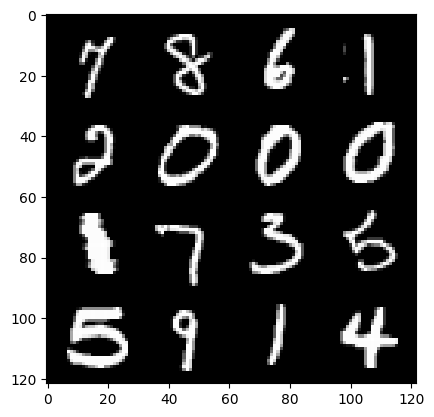

epoch : 95 , step :44700 , mean-disc-loss:  0.3515268063545226 , mean-gen-loss 1.827937537829083


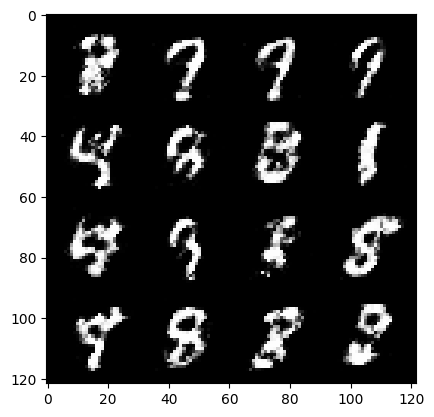

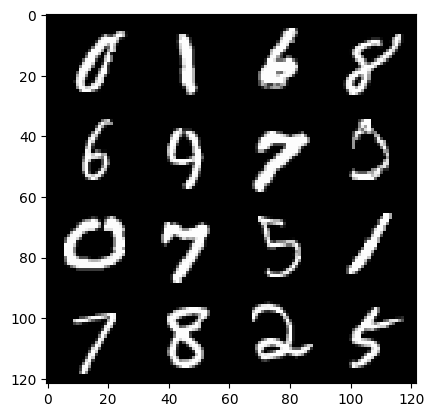

epoch : 95 , step :45000 , mean-disc-loss:  0.3505355328321457 , mean-gen-loss 1.852653284072877


  0%|          | 0/469 [00:00<?, ?it/s]

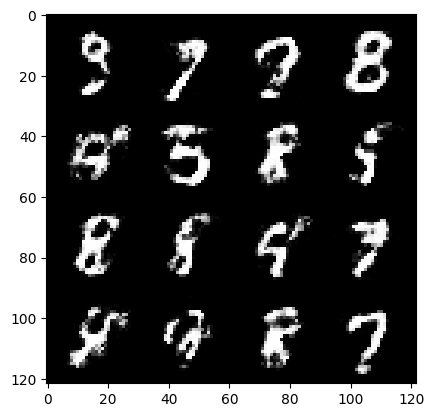

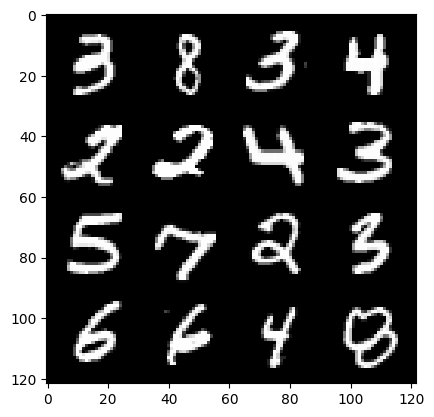

epoch : 96 , step :45300 , mean-disc-loss:  0.3673144008715945 , mean-gen-loss 1.8089579172929124


  0%|          | 0/469 [00:00<?, ?it/s]

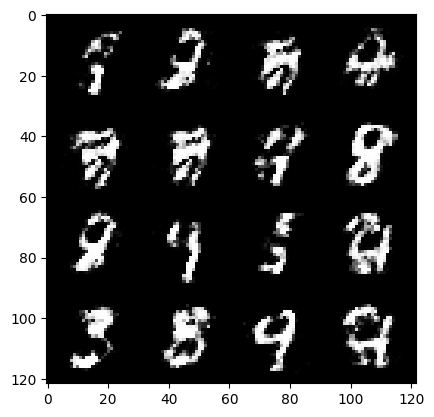

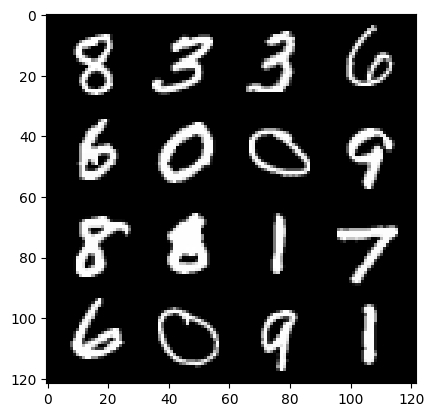

epoch : 97 , step :45600 , mean-disc-loss:  0.3778783236940702 , mean-gen-loss 1.7349255077044186


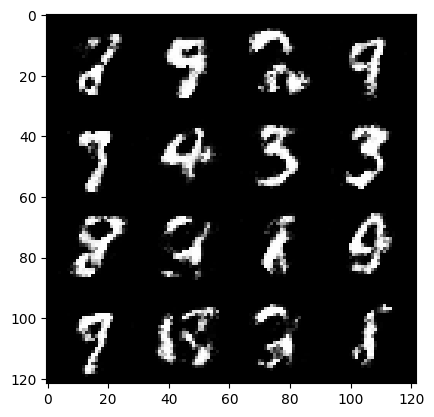

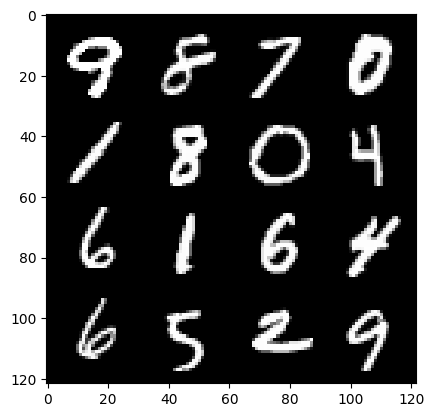

epoch : 97 , step :45900 , mean-disc-loss:  0.3687737616896628 , mean-gen-loss 1.7448382163047789


  0%|          | 0/469 [00:00<?, ?it/s]

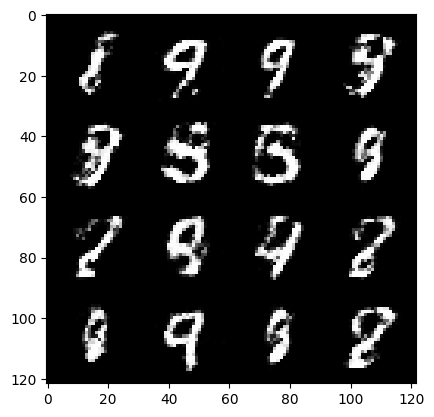

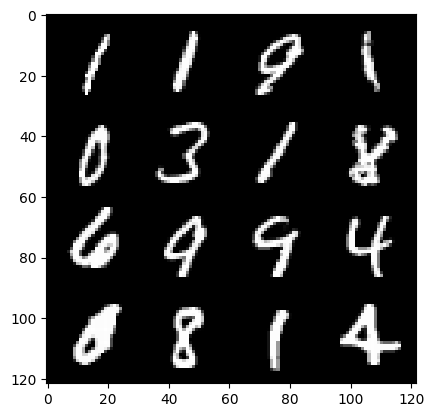

epoch : 98 , step :46200 , mean-disc-loss:  0.371333537697792 , mean-gen-loss 1.7561404291788747


  0%|          | 0/469 [00:00<?, ?it/s]

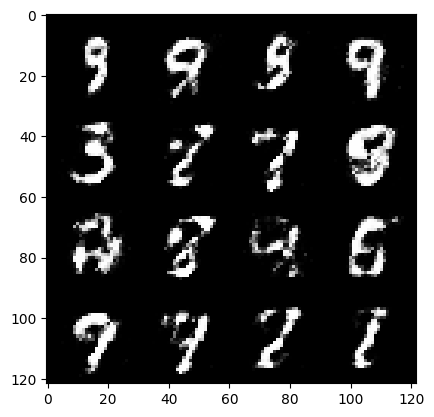

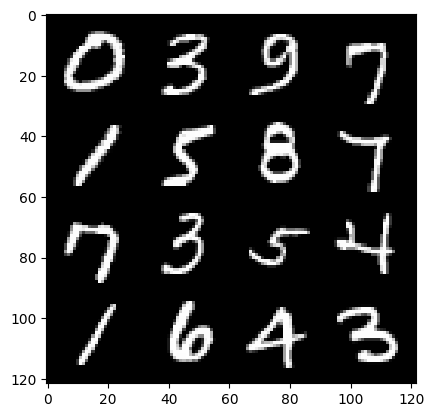

epoch : 99 , step :46500 , mean-disc-loss:  0.39694813569386794 , mean-gen-loss 1.7234759684403729


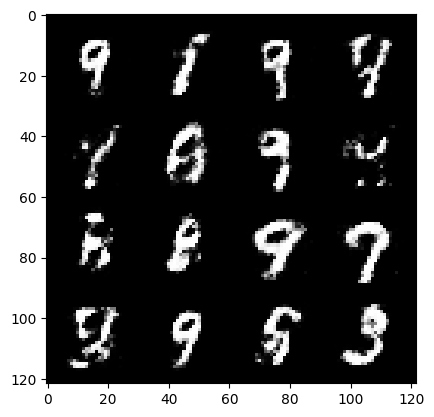

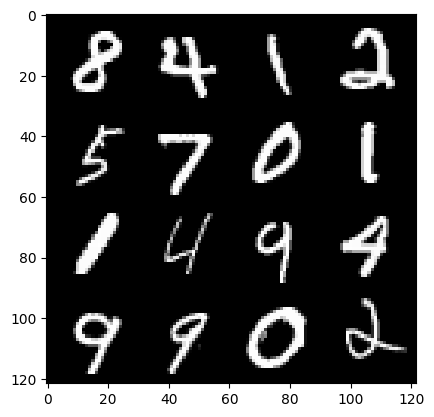

epoch : 99 , step :46800 , mean-disc-loss:  0.3740120536088944 , mean-gen-loss 1.7265537917613971


  0%|          | 0/469 [00:00<?, ?it/s]

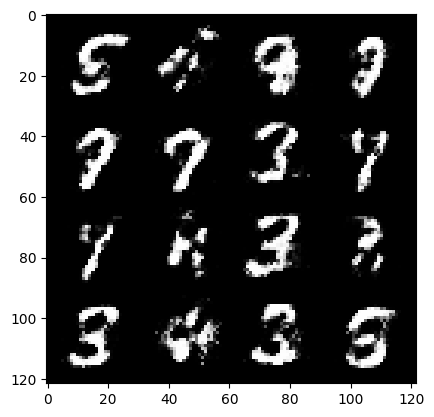

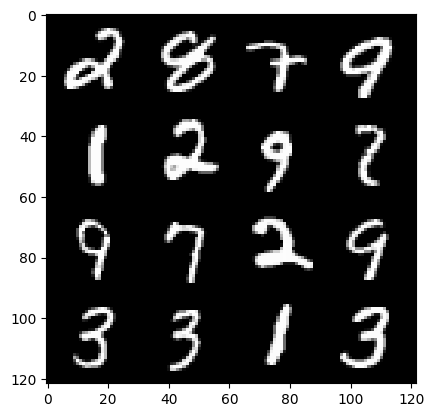

epoch : 100 , step :47100 , mean-disc-loss:  0.35223461518685034 , mean-gen-loss 1.7719471200307222


  0%|          | 0/469 [00:00<?, ?it/s]

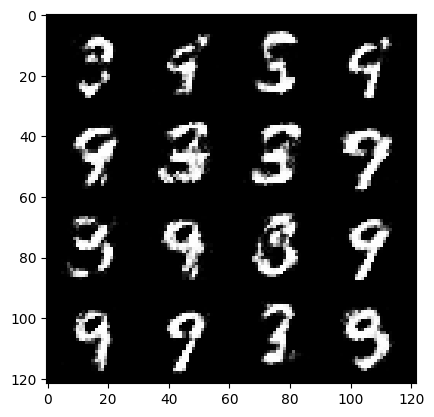

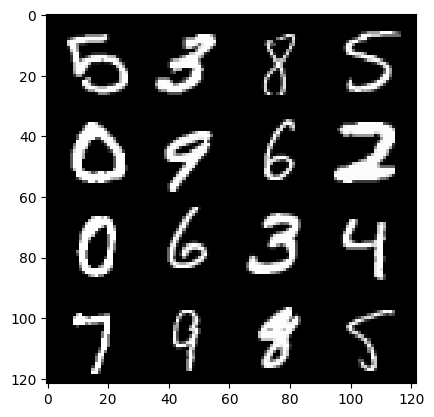

epoch : 101 , step :47400 , mean-disc-loss:  0.362753385206064 , mean-gen-loss 1.7732248040040341


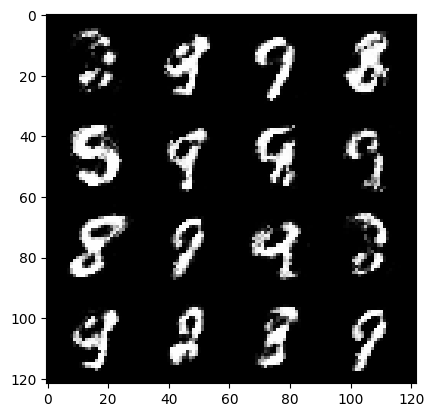

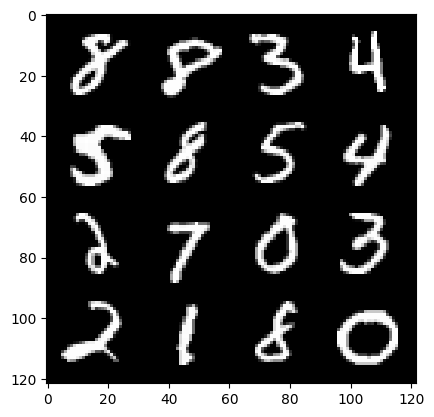

epoch : 101 , step :47700 , mean-disc-loss:  0.3677832937240601 , mean-gen-loss 1.771268465916315


  0%|          | 0/469 [00:00<?, ?it/s]

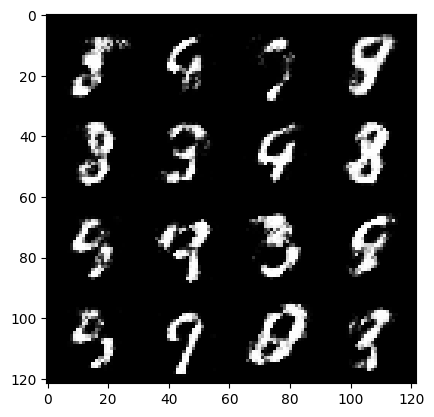

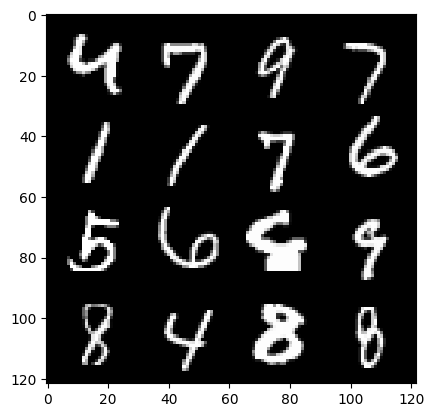

epoch : 102 , step :48000 , mean-disc-loss:  0.39878841171662005 , mean-gen-loss 1.6709355735778801


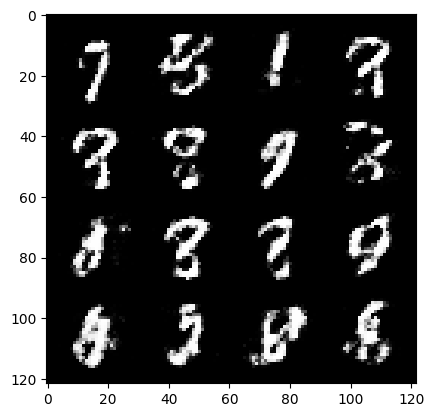

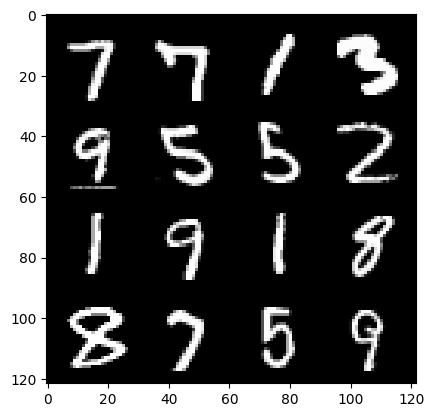

epoch : 102 , step :48300 , mean-disc-loss:  0.38250109185775116 , mean-gen-loss 1.6873415684700017


  0%|          | 0/469 [00:00<?, ?it/s]

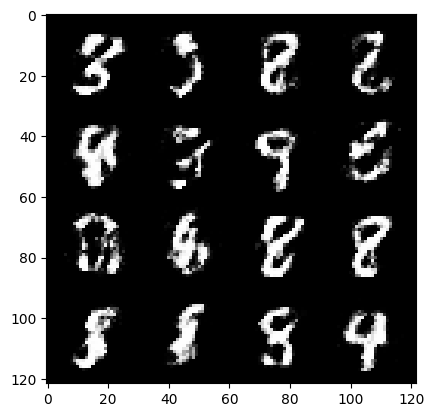

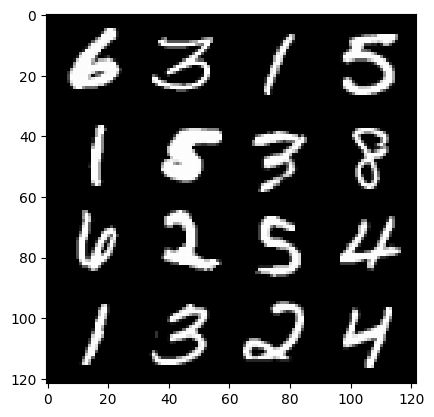

epoch : 103 , step :48600 , mean-disc-loss:  0.3751216266552607 , mean-gen-loss 1.7562133332093552


  0%|          | 0/469 [00:00<?, ?it/s]

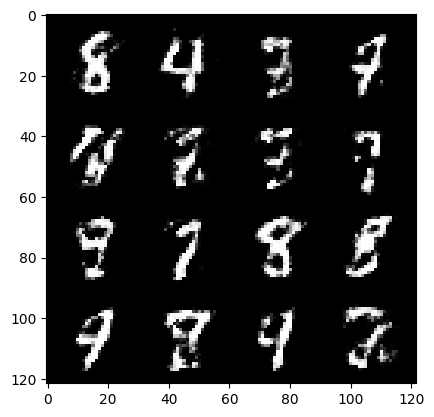

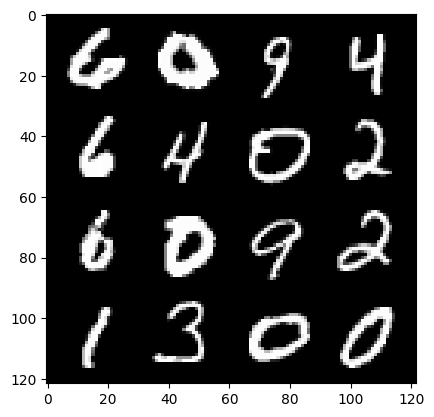

epoch : 104 , step :48900 , mean-disc-loss:  0.35928953975439076 , mean-gen-loss 1.8230763308207187


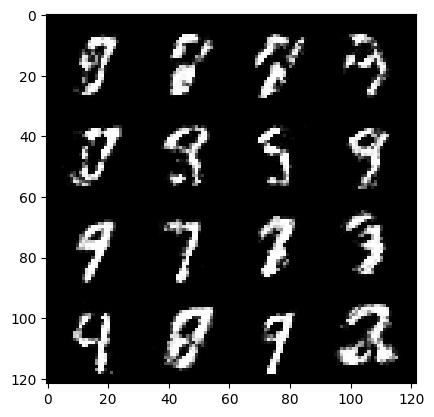

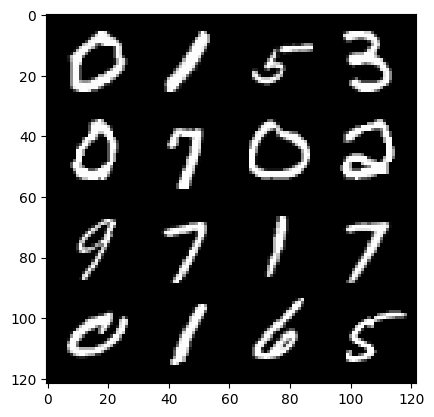

epoch : 104 , step :49200 , mean-disc-loss:  0.3827703447143237 , mean-gen-loss 1.7254448787371321


  0%|          | 0/469 [00:00<?, ?it/s]

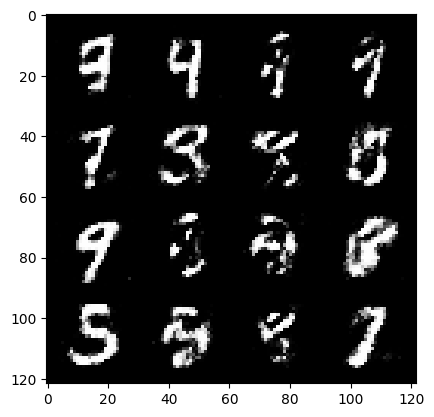

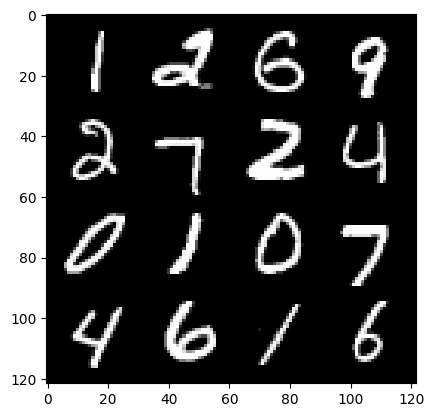

epoch : 105 , step :49500 , mean-disc-loss:  0.40386712402105335 , mean-gen-loss 1.618905795415242


  0%|          | 0/469 [00:00<?, ?it/s]

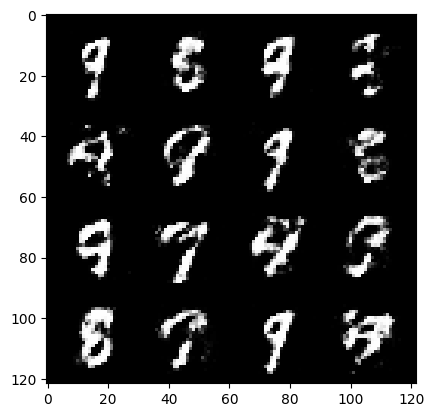

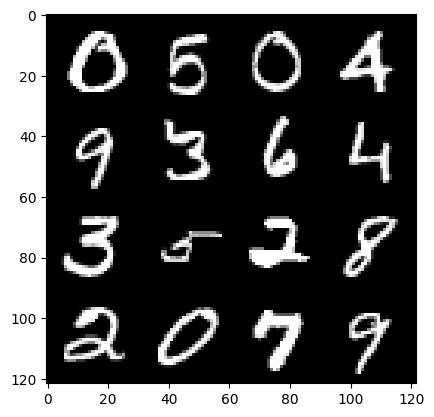

epoch : 106 , step :49800 , mean-disc-loss:  0.40011979083220167 , mean-gen-loss 1.6343695628643031


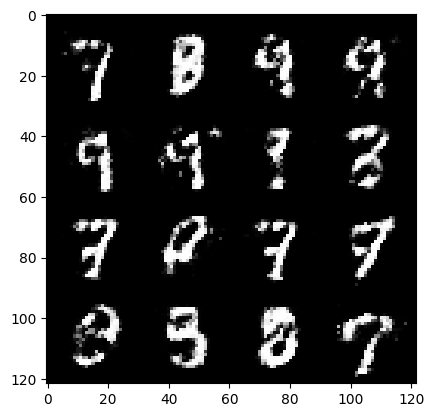

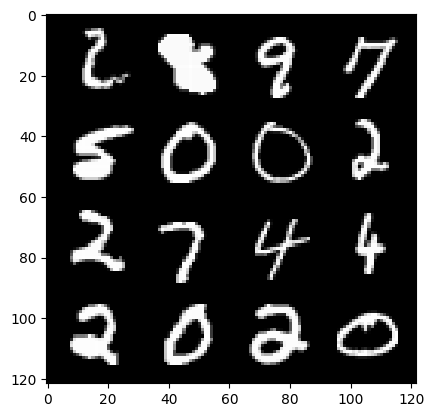

epoch : 106 , step :50100 , mean-disc-loss:  0.3996332480510076 , mean-gen-loss 1.6555796766281123


  0%|          | 0/469 [00:00<?, ?it/s]

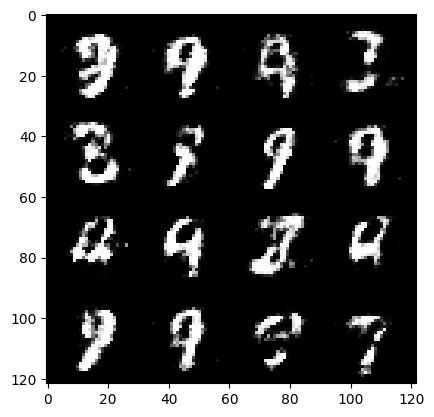

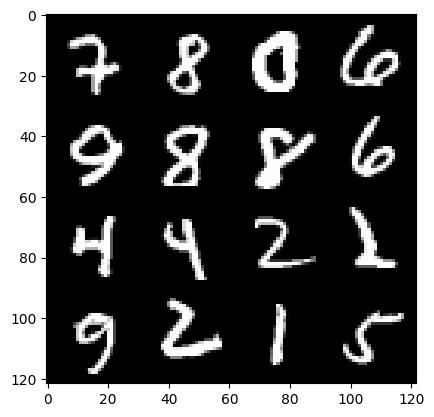

epoch : 107 , step :50400 , mean-disc-loss:  0.4265804188450181 , mean-gen-loss 1.5521923426787059


  0%|          | 0/469 [00:00<?, ?it/s]

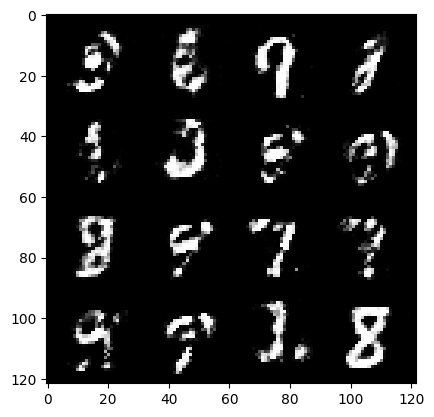

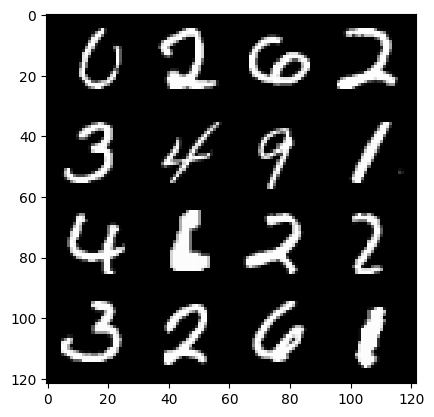

epoch : 108 , step :50700 , mean-disc-loss:  0.42989915251731864 , mean-gen-loss 1.5047152551015206


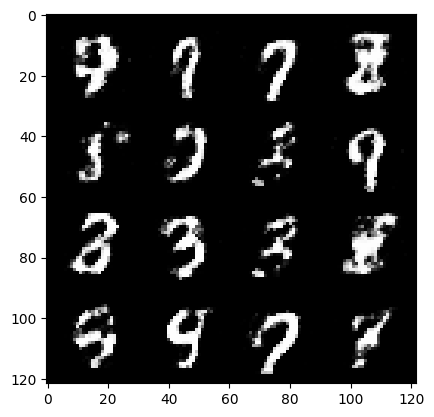

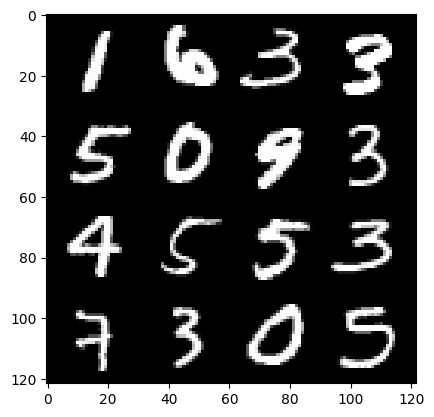

epoch : 108 , step :51000 , mean-disc-loss:  0.3936807157595952 , mean-gen-loss 1.6046632424990335


  0%|          | 0/469 [00:00<?, ?it/s]

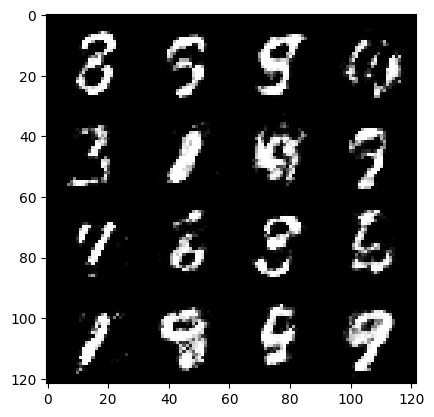

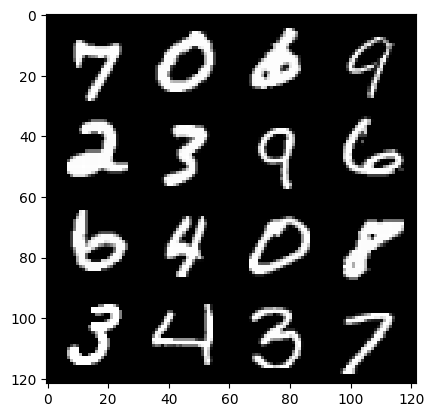

epoch : 109 , step :51300 , mean-disc-loss:  0.39994652499755246 , mean-gen-loss 1.637208089033763


  0%|          | 0/469 [00:00<?, ?it/s]

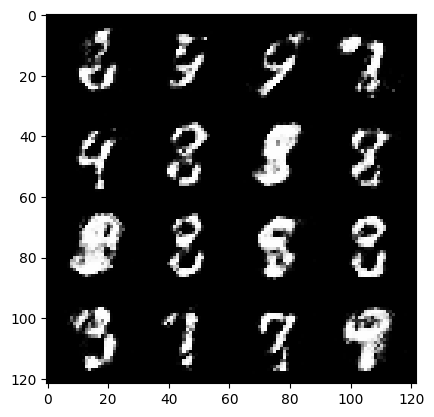

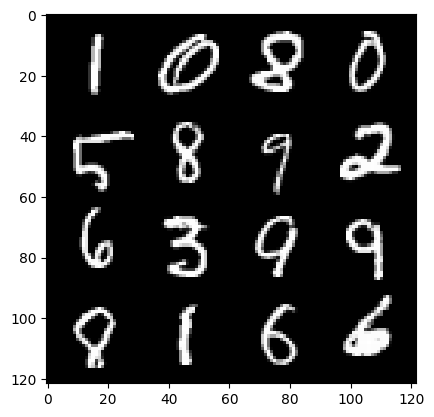

epoch : 110 , step :51600 , mean-disc-loss:  0.4027479701240859 , mean-gen-loss 1.6234023908774045


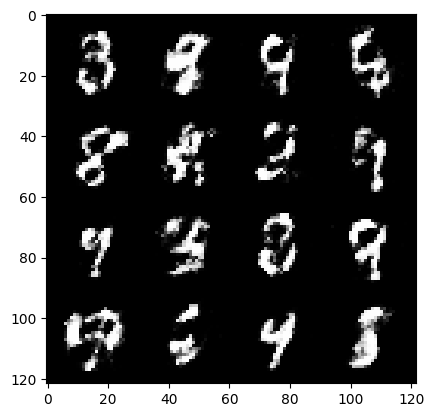

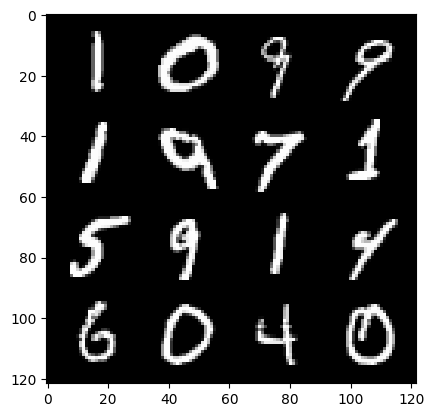

epoch : 110 , step :51900 , mean-disc-loss:  0.43035238424936945 , mean-gen-loss 1.5144453418254862


  0%|          | 0/469 [00:00<?, ?it/s]

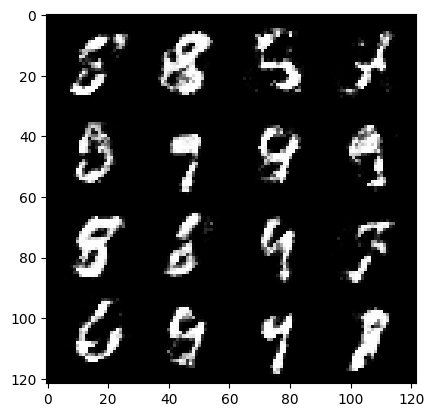

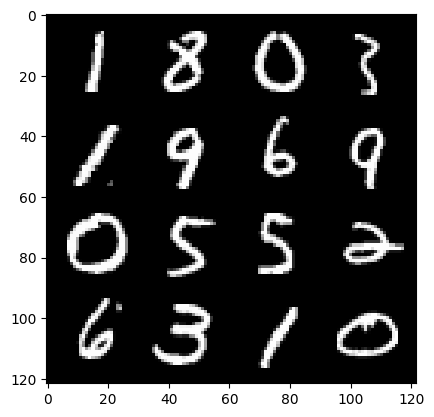

epoch : 111 , step :52200 , mean-disc-loss:  0.376797258257866 , mean-gen-loss 1.6526565814018246


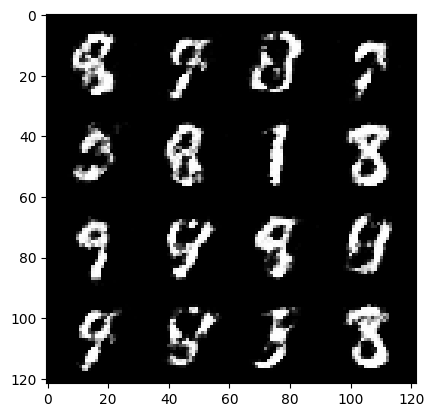

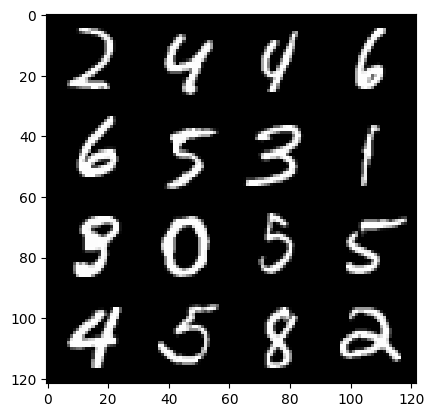

epoch : 111 , step :52500 , mean-disc-loss:  0.4028169294198353 , mean-gen-loss 1.6138622510433194


  0%|          | 0/469 [00:00<?, ?it/s]

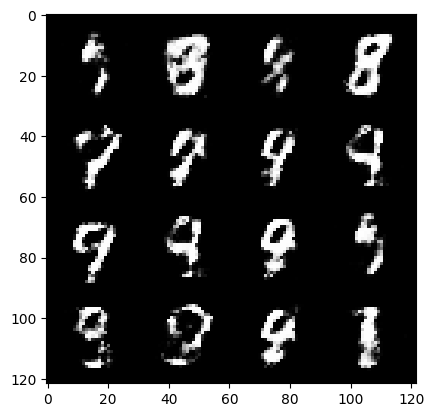

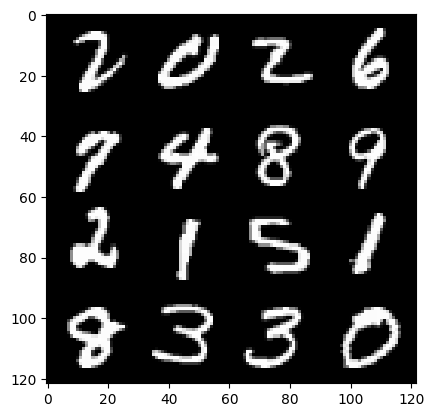

epoch : 112 , step :52800 , mean-disc-loss:  0.3888279231389366 , mean-gen-loss 1.639736000696817


  0%|          | 0/469 [00:00<?, ?it/s]

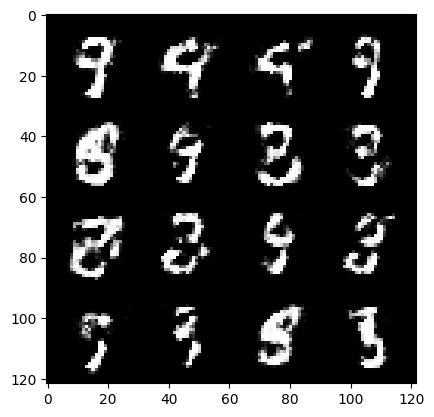

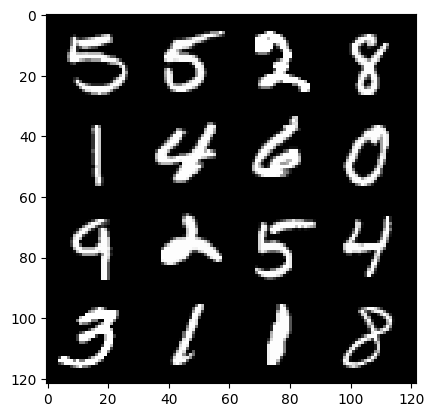

epoch : 113 , step :53100 , mean-disc-loss:  0.4255952894687655 , mean-gen-loss 1.5592177907625835


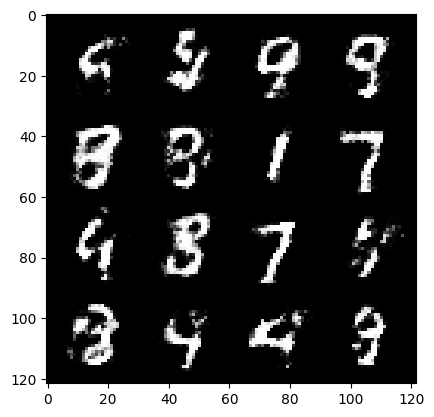

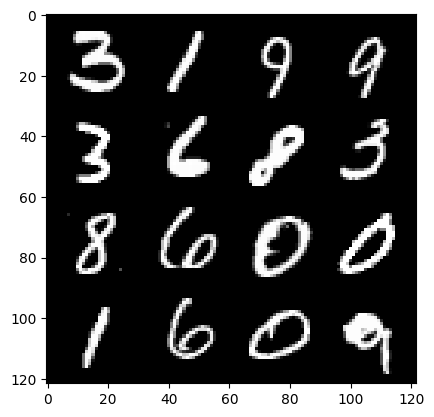

epoch : 113 , step :53400 , mean-disc-loss:  0.402912744084994 , mean-gen-loss 1.5607578456401816


  0%|          | 0/469 [00:00<?, ?it/s]

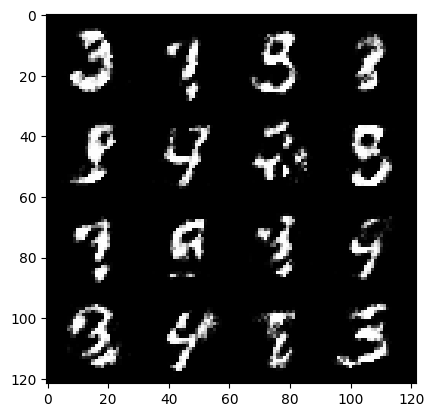

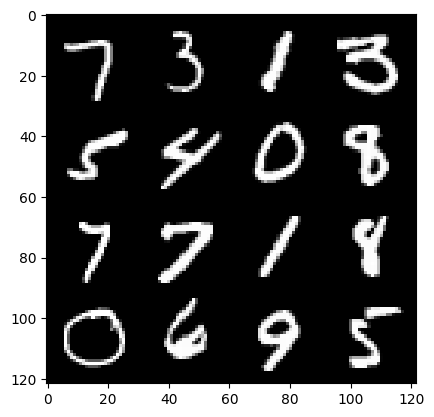

epoch : 114 , step :53700 , mean-disc-loss:  0.40563820580641446 , mean-gen-loss 1.6020292031764973


  0%|          | 0/469 [00:00<?, ?it/s]

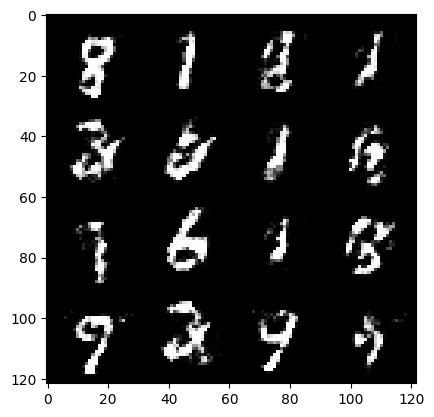

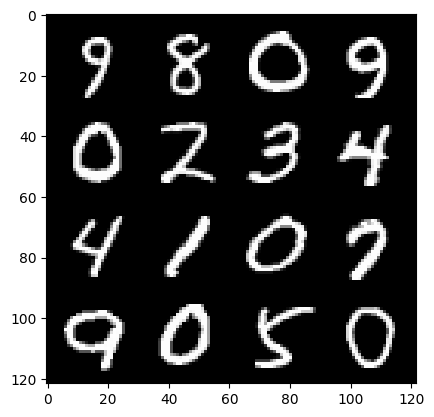

epoch : 115 , step :54000 , mean-disc-loss:  0.4187887252370516 , mean-gen-loss 1.5367326092720042


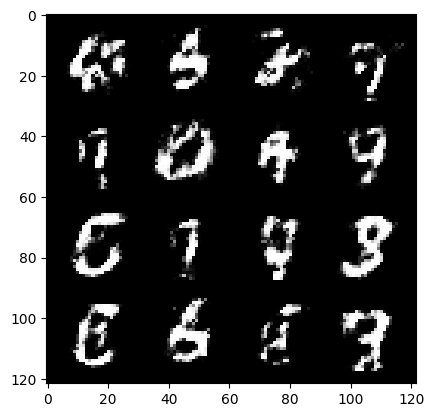

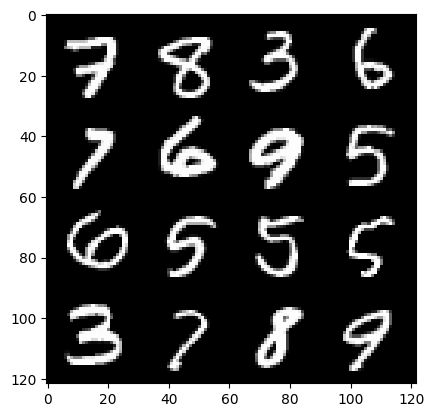

epoch : 115 , step :54300 , mean-disc-loss:  0.41864188830057797 , mean-gen-loss 1.556408134698869


  0%|          | 0/469 [00:00<?, ?it/s]

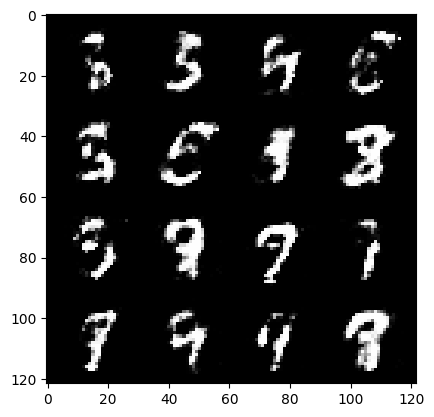

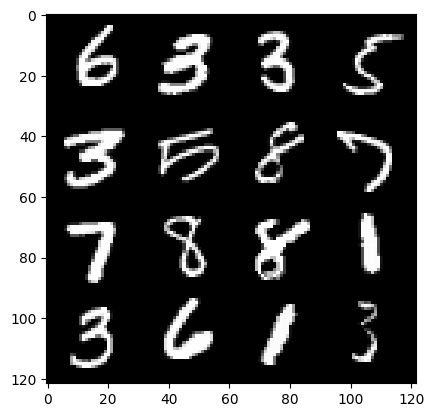

epoch : 116 , step :54600 , mean-disc-loss:  0.3983488879601161 , mean-gen-loss 1.614762099186578


  0%|          | 0/469 [00:00<?, ?it/s]

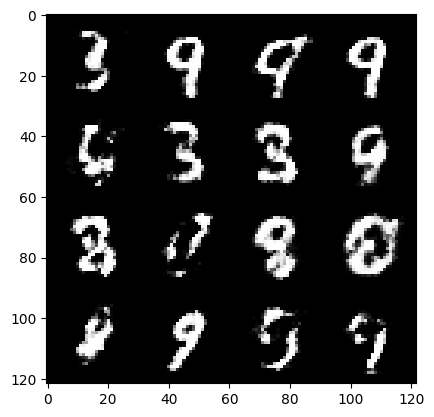

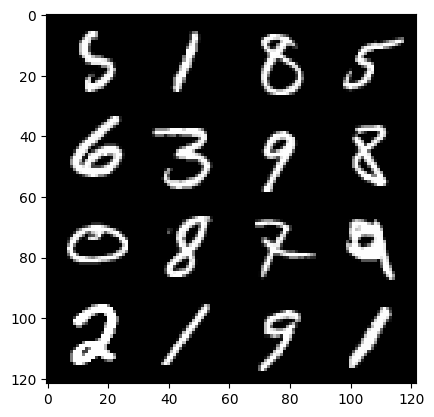

epoch : 117 , step :54900 , mean-disc-loss:  0.39316539237896597 , mean-gen-loss 1.6394195032119758


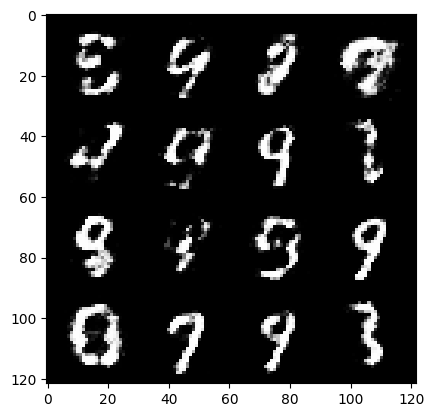

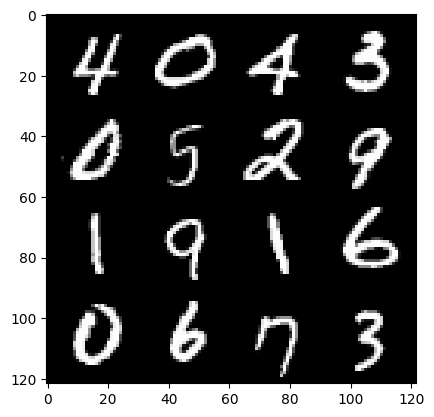

epoch : 117 , step :55200 , mean-disc-loss:  0.44000749627749125 , mean-gen-loss 1.4914061955610896


  0%|          | 0/469 [00:00<?, ?it/s]

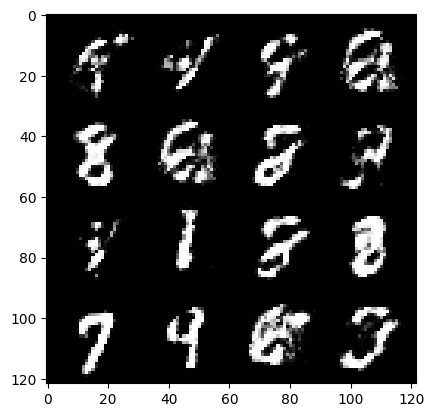

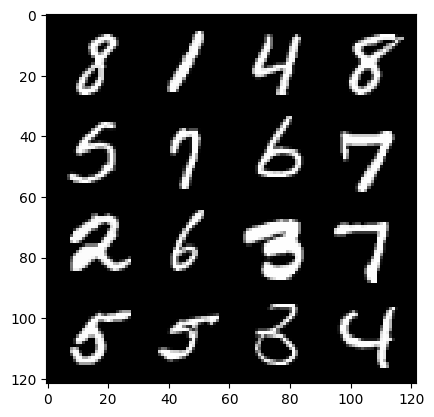

epoch : 118 , step :55500 , mean-disc-loss:  0.45690919200579305 , mean-gen-loss 1.433559434811275


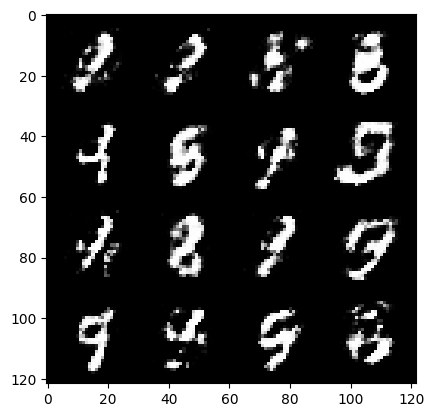

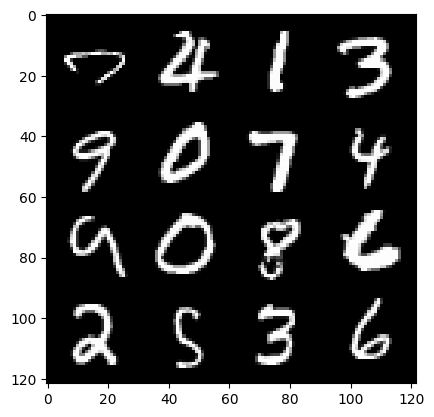

epoch : 118 , step :55800 , mean-disc-loss:  0.4400636149446167 , mean-gen-loss 1.433577926953633


  0%|          | 0/469 [00:00<?, ?it/s]

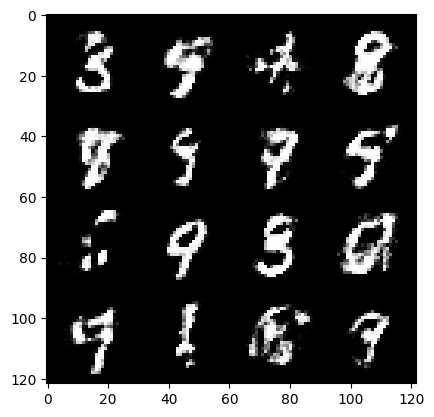

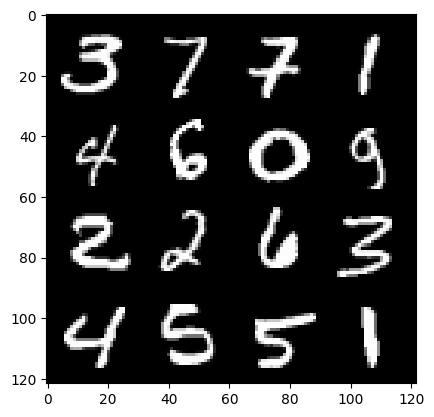

epoch : 119 , step :56100 , mean-disc-loss:  0.39604335894187276 , mean-gen-loss 1.5903307537237799


  0%|          | 0/469 [00:00<?, ?it/s]

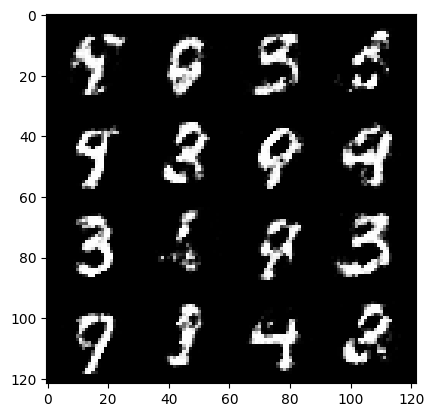

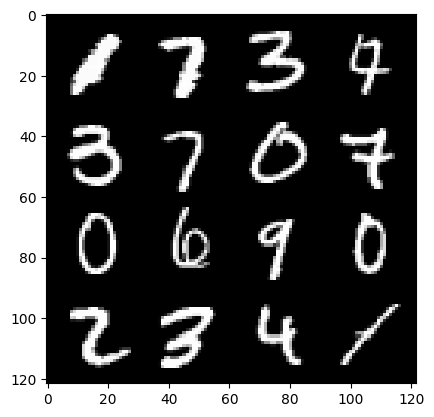

epoch : 120 , step :56400 , mean-disc-loss:  0.4058442450563112 , mean-gen-loss 1.6062356503804518


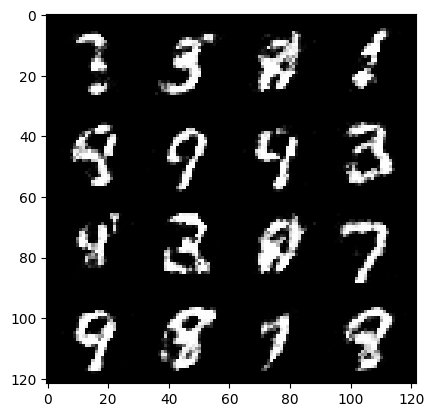

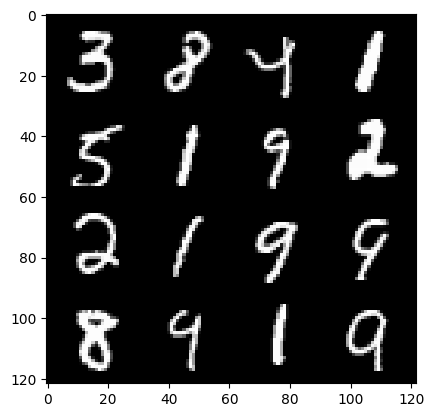

epoch : 120 , step :56700 , mean-disc-loss:  0.4375112713376679 , mean-gen-loss 1.5036239016056065


  0%|          | 0/469 [00:00<?, ?it/s]

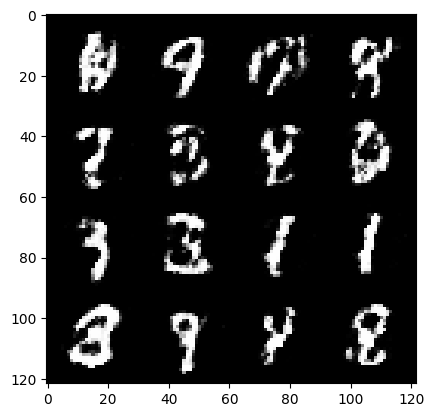

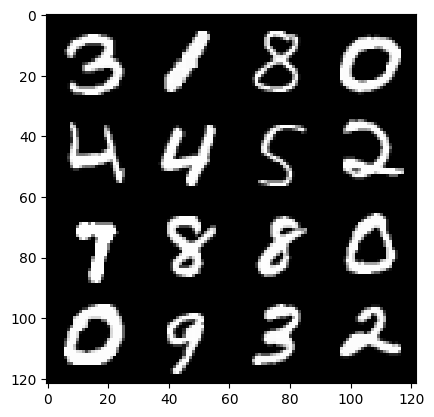

epoch : 121 , step :57000 , mean-disc-loss:  0.4447464673717815 , mean-gen-loss 1.4687527906894684


  0%|          | 0/469 [00:00<?, ?it/s]

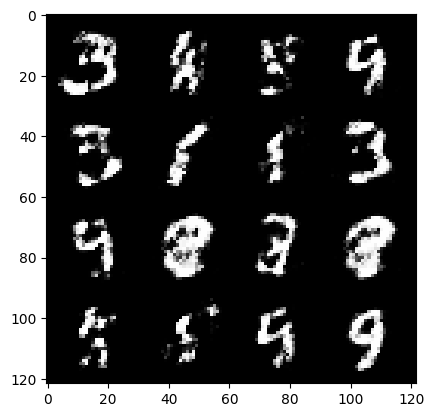

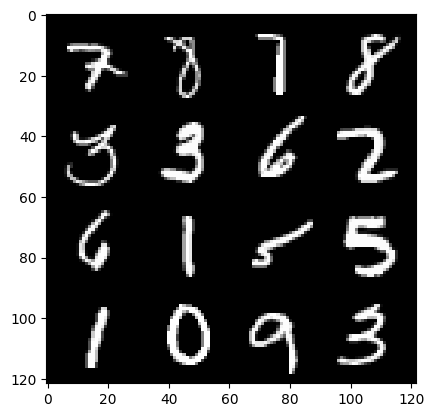

epoch : 122 , step :57300 , mean-disc-loss:  0.4321614182988803 , mean-gen-loss 1.4681884825229643


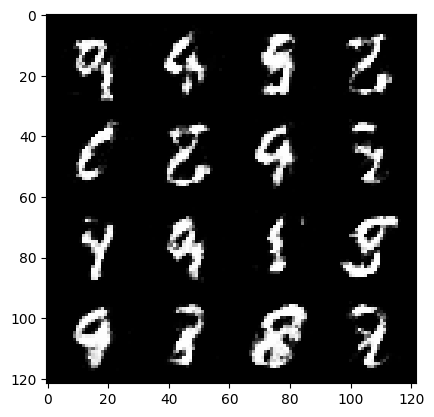

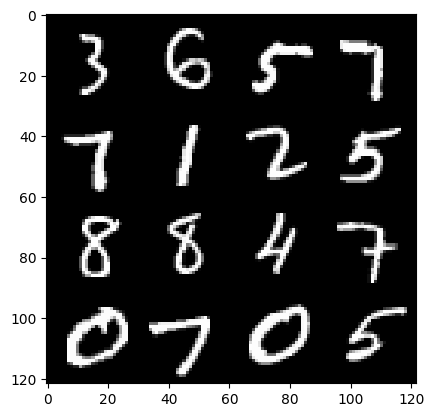

epoch : 122 , step :57600 , mean-disc-loss:  0.42722779909769704 , mean-gen-loss 1.4909038090705857


  0%|          | 0/469 [00:00<?, ?it/s]

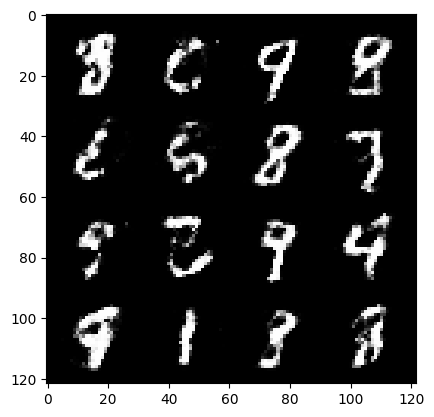

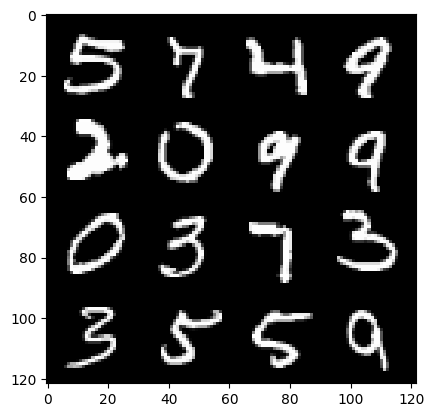

epoch : 123 , step :57900 , mean-disc-loss:  0.43842333346605294 , mean-gen-loss 1.4501586218674978


  0%|          | 0/469 [00:00<?, ?it/s]

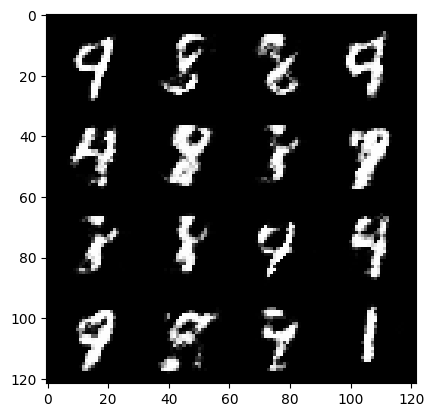

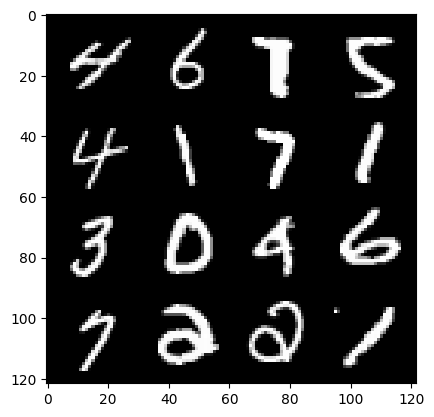

epoch : 124 , step :58200 , mean-disc-loss:  0.4356221180160839 , mean-gen-loss 1.4614619799455015


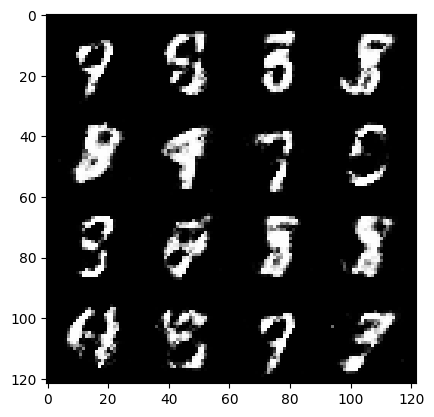

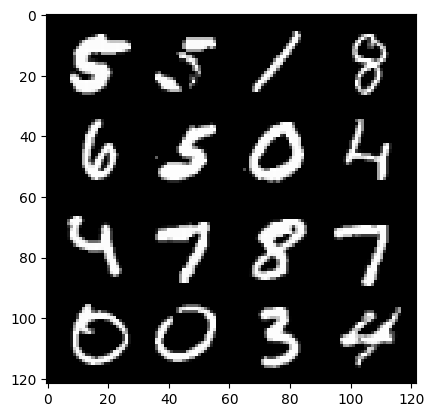

epoch : 124 , step :58500 , mean-disc-loss:  0.43205992857615194 , mean-gen-loss 1.4427751696109767


  0%|          | 0/469 [00:00<?, ?it/s]

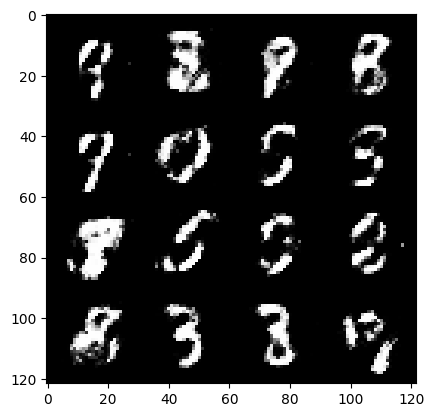

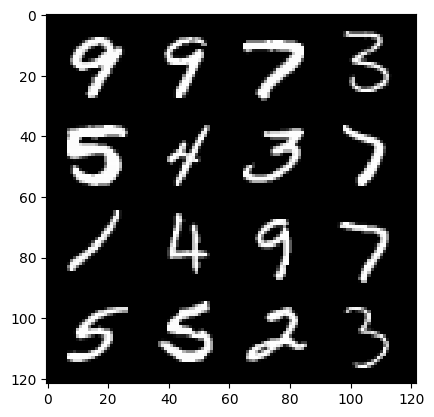

epoch : 125 , step :58800 , mean-disc-loss:  0.43171998133262024 , mean-gen-loss 1.468330738941828


  0%|          | 0/469 [00:00<?, ?it/s]

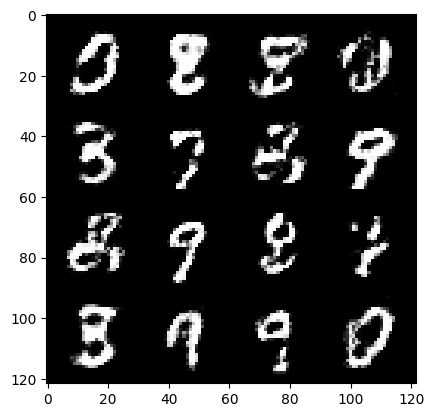

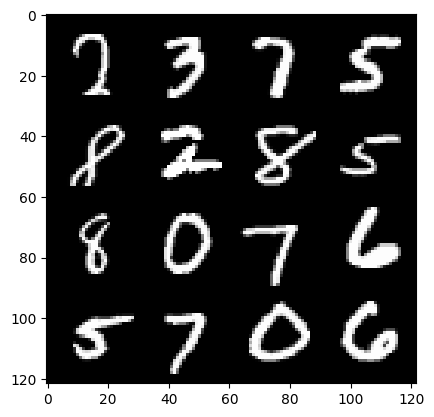

epoch : 126 , step :59100 , mean-disc-loss:  0.4294282703598342 , mean-gen-loss 1.457619734605154


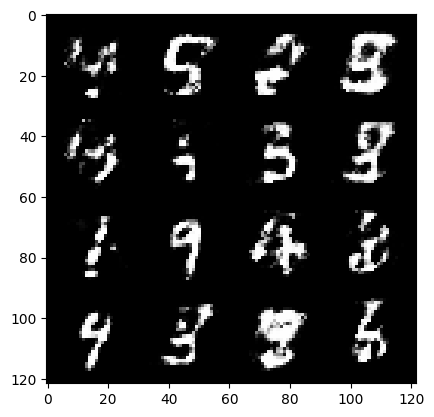

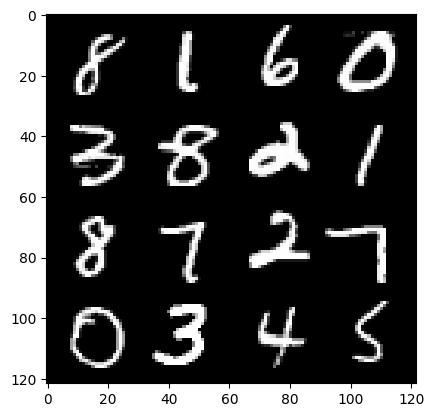

epoch : 126 , step :59400 , mean-disc-loss:  0.4463351099689801 , mean-gen-loss 1.41630467693011


  0%|          | 0/469 [00:00<?, ?it/s]

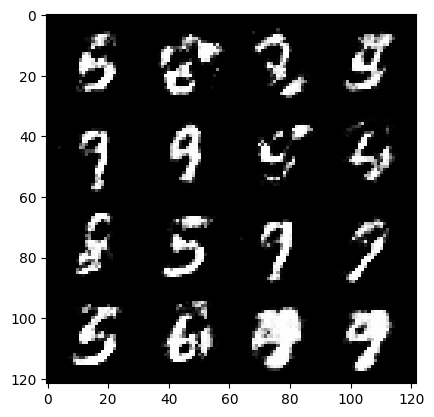

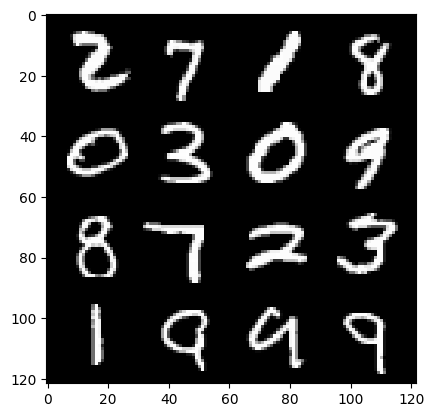

epoch : 127 , step :59700 , mean-disc-loss:  0.43742812395095854 , mean-gen-loss 1.4794925502936045


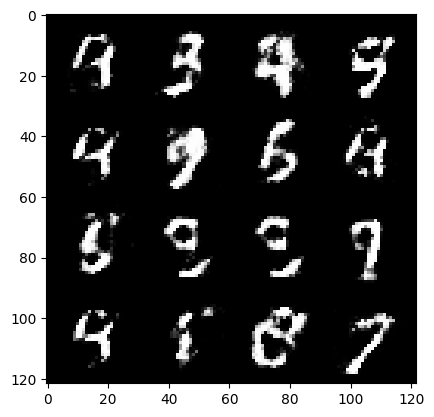

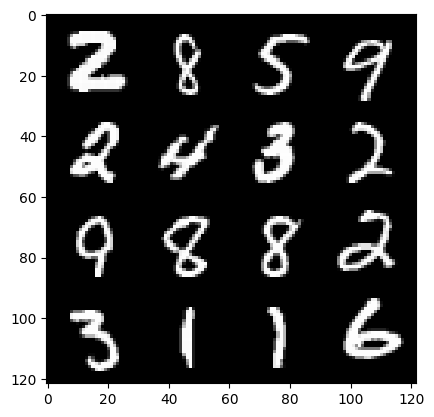

epoch : 127 , step :60000 , mean-disc-loss:  0.4676108971238138 , mean-gen-loss 1.3806330601374315


  0%|          | 0/469 [00:00<?, ?it/s]

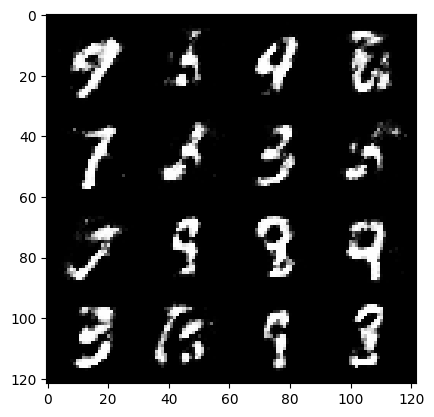

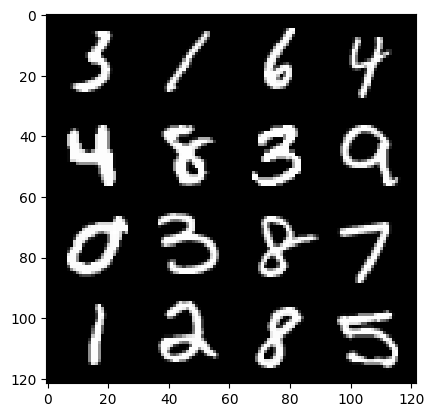

epoch : 128 , step :60300 , mean-disc-loss:  0.4636627177397411 , mean-gen-loss 1.3760354340076444


  0%|          | 0/469 [00:00<?, ?it/s]

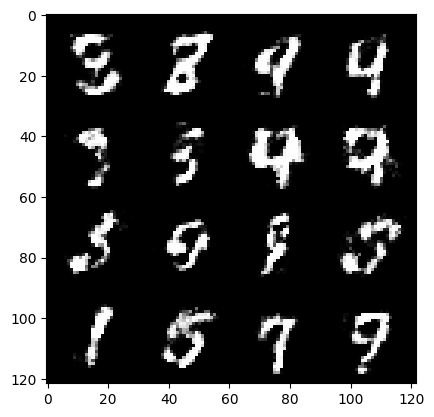

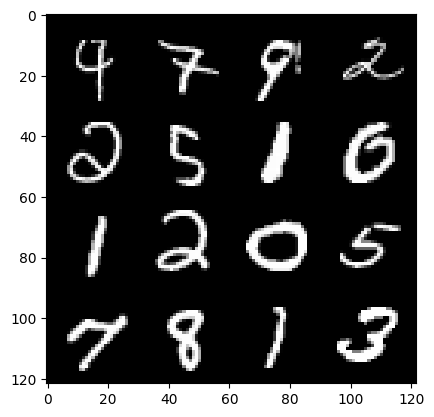

epoch : 129 , step :60600 , mean-disc-loss:  0.4712876067558928 , mean-gen-loss 1.346752490599952


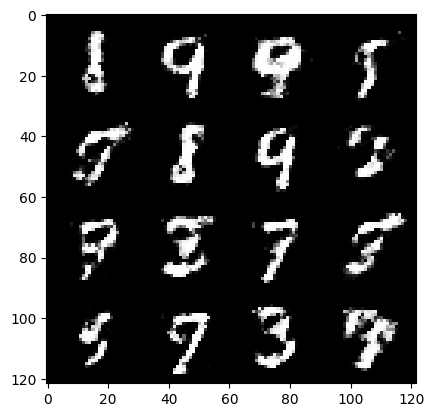

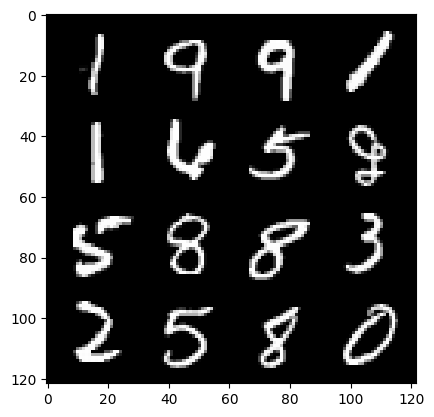

epoch : 129 , step :60900 , mean-disc-loss:  0.4473845412333804 , mean-gen-loss 1.396341602802277


  0%|          | 0/469 [00:00<?, ?it/s]

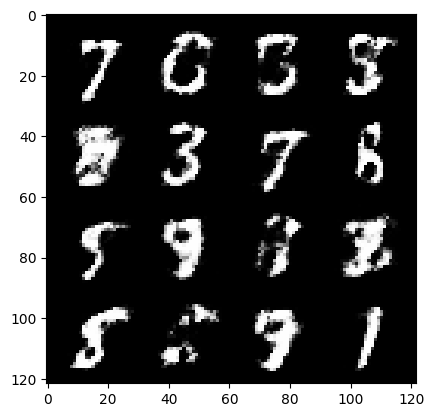

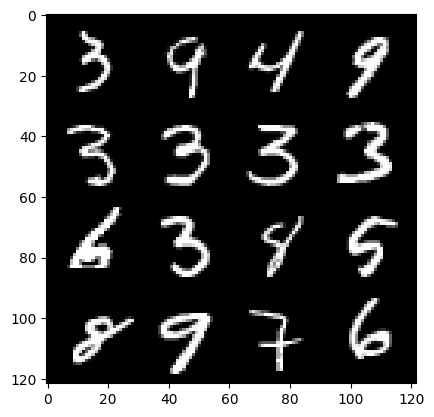

epoch : 130 , step :61200 , mean-disc-loss:  0.45033556511004796 , mean-gen-loss 1.3967332820097618


  0%|          | 0/469 [00:00<?, ?it/s]

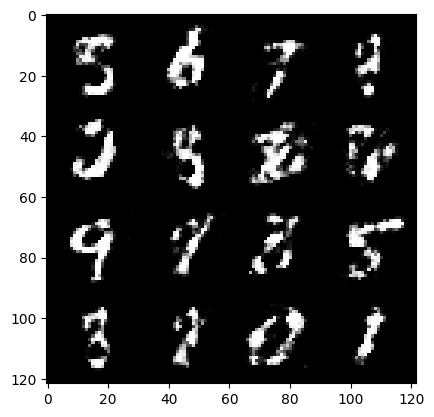

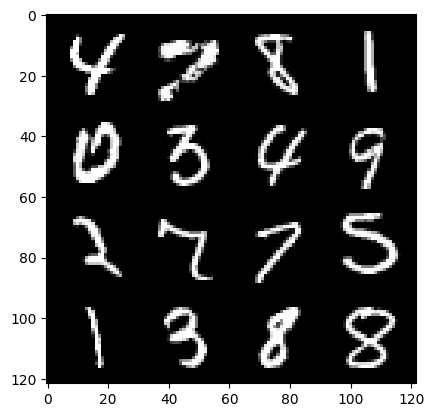

epoch : 131 , step :61500 , mean-disc-loss:  0.453872145315011 , mean-gen-loss 1.3732397015889493


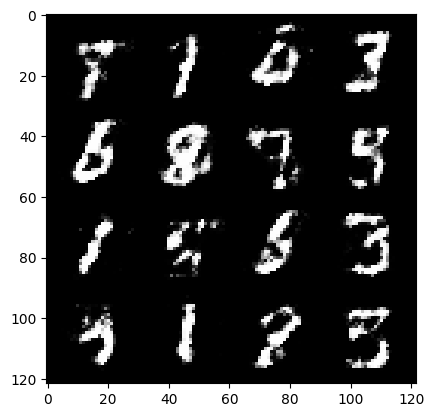

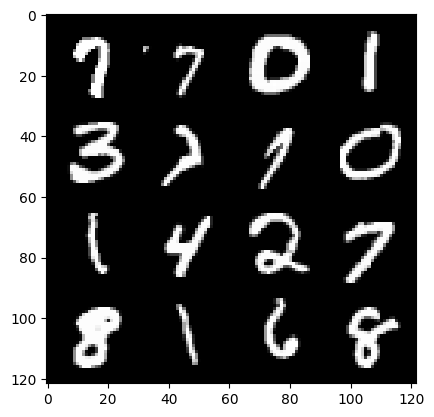

epoch : 131 , step :61800 , mean-disc-loss:  0.4580688424905142 , mean-gen-loss 1.3789208229382839


  0%|          | 0/469 [00:00<?, ?it/s]

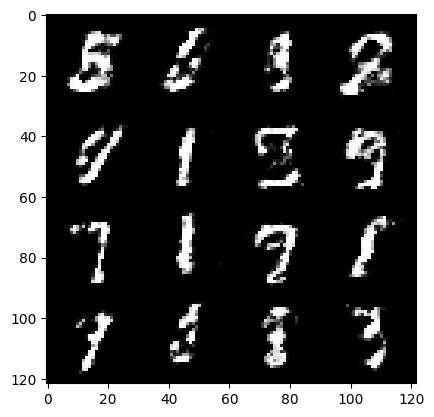

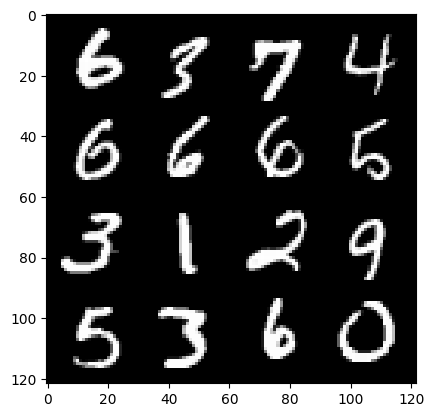

epoch : 132 , step :62100 , mean-disc-loss:  0.4555130207538606 , mean-gen-loss 1.3561978888511663


  0%|          | 0/469 [00:00<?, ?it/s]

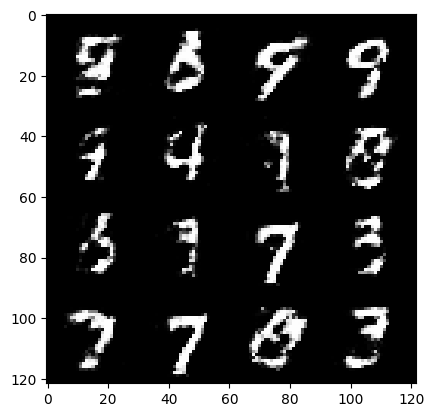

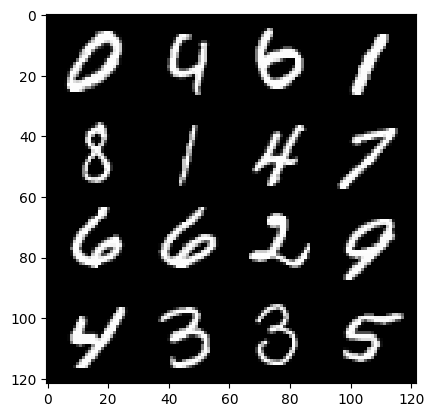

epoch : 133 , step :62400 , mean-disc-loss:  0.4427412567536035 , mean-gen-loss 1.4341805632909133


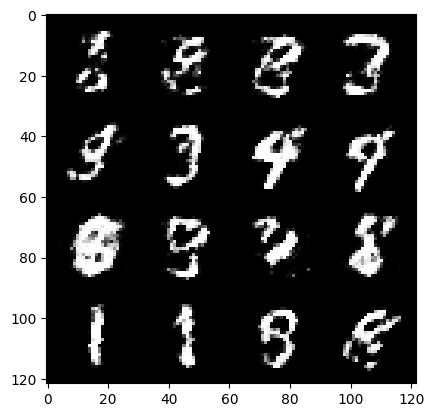

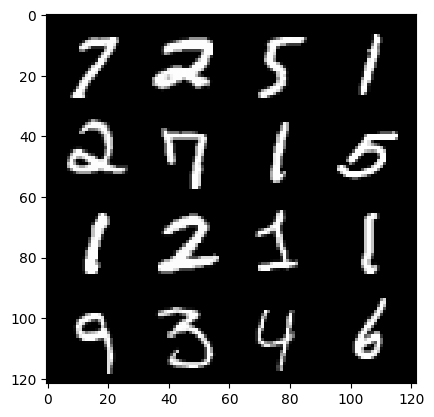

epoch : 133 , step :62700 , mean-disc-loss:  0.46063557187716203 , mean-gen-loss 1.367031273444494


  0%|          | 0/469 [00:00<?, ?it/s]

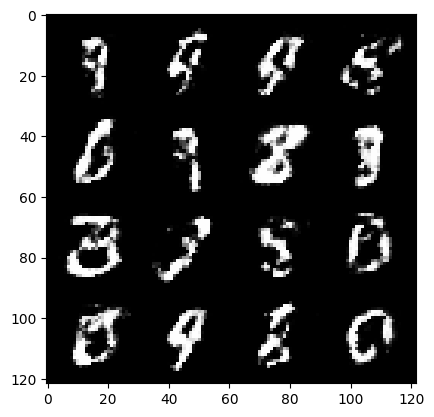

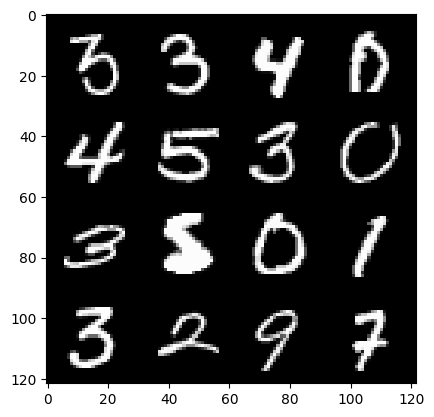

epoch : 134 , step :63000 , mean-disc-loss:  0.4726066061854363 , mean-gen-loss 1.3599564878145853


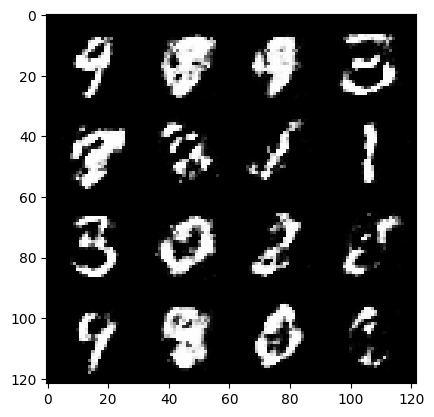

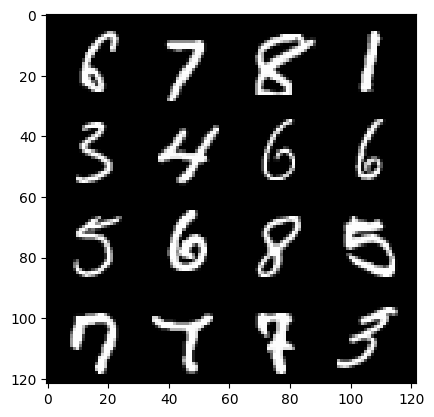

epoch : 134 , step :63300 , mean-disc-loss:  0.4765802104274432 , mean-gen-loss 1.326680509646734


  0%|          | 0/469 [00:00<?, ?it/s]

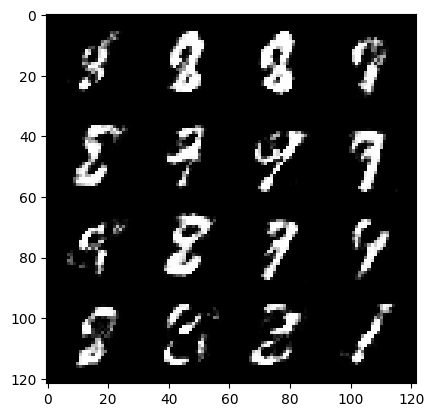

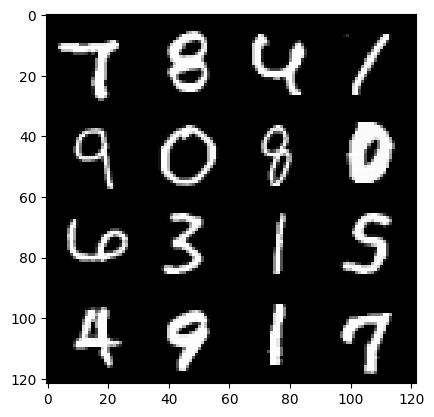

epoch : 135 , step :63600 , mean-disc-loss:  0.4788581111033759 , mean-gen-loss 1.3414339959621435


  0%|          | 0/469 [00:00<?, ?it/s]

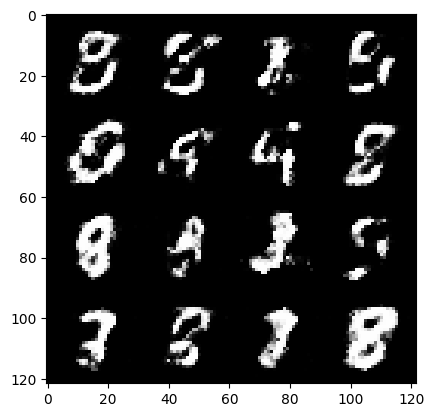

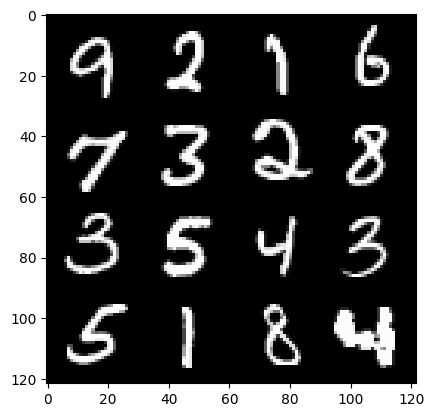

epoch : 136 , step :63900 , mean-disc-loss:  0.46732960452636074 , mean-gen-loss 1.3247070038318638


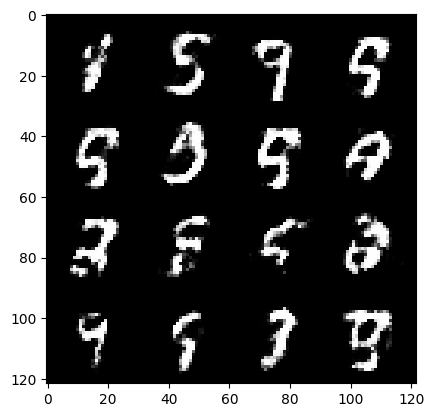

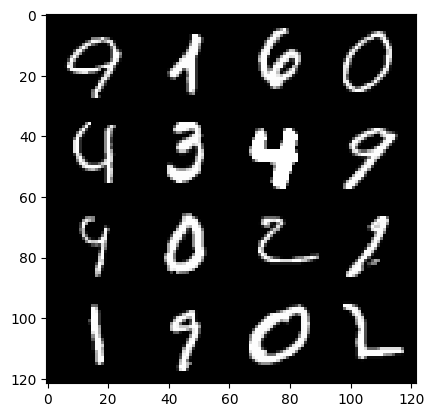

epoch : 136 , step :64200 , mean-disc-loss:  0.4516509111722312 , mean-gen-loss 1.3649320518970496


  0%|          | 0/469 [00:00<?, ?it/s]

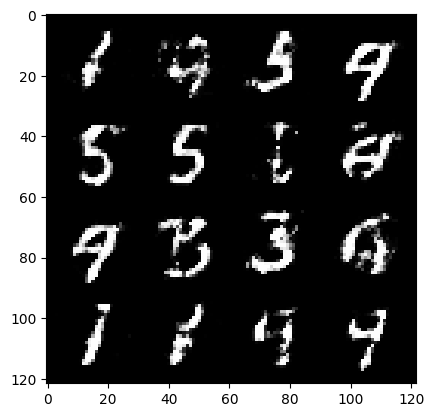

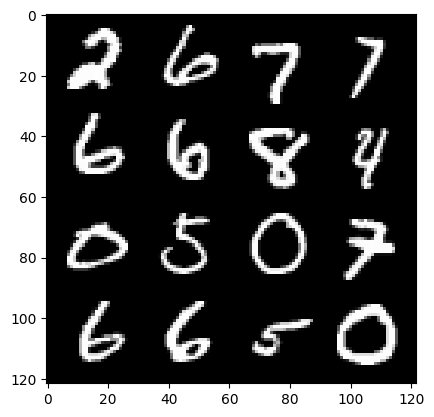

epoch : 137 , step :64500 , mean-disc-loss:  0.44446543643871944 , mean-gen-loss 1.3996018687884009


  0%|          | 0/469 [00:00<?, ?it/s]

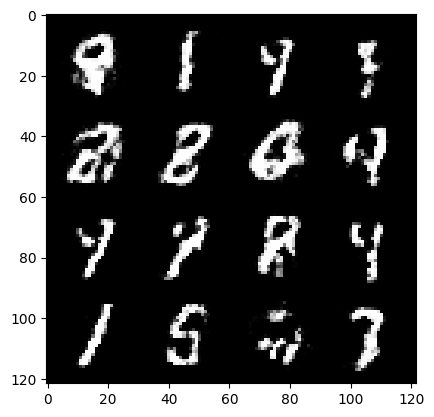

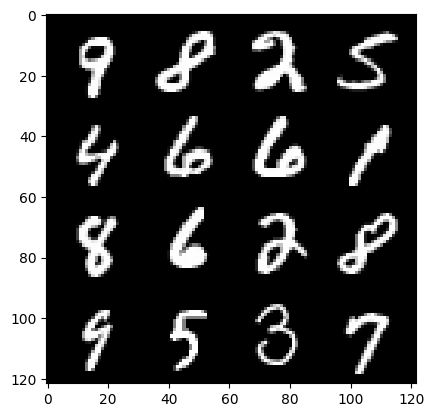

epoch : 138 , step :64800 , mean-disc-loss:  0.46214512666066476 , mean-gen-loss 1.3766099305947623


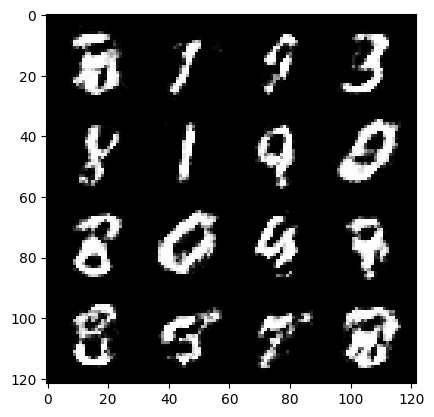

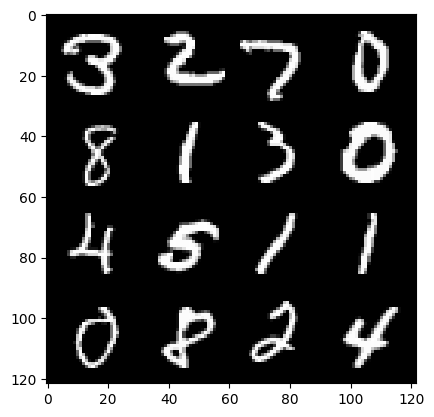

epoch : 138 , step :65100 , mean-disc-loss:  0.45209277292092653 , mean-gen-loss 1.354019196033477


  0%|          | 0/469 [00:00<?, ?it/s]

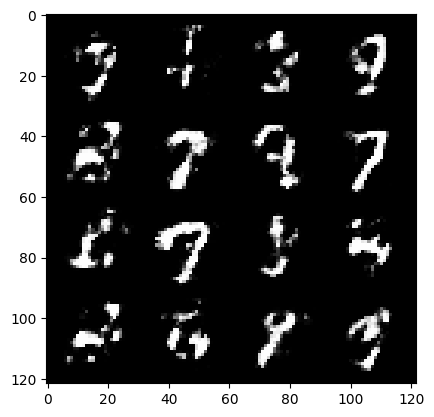

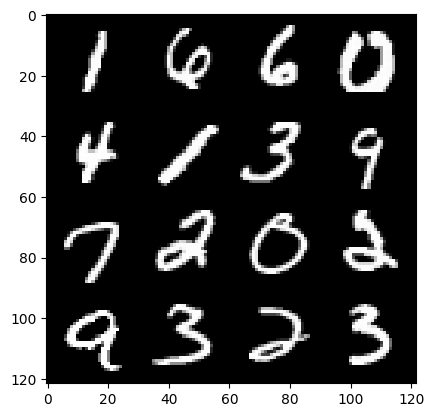

epoch : 139 , step :65400 , mean-disc-loss:  0.4632823340098064 , mean-gen-loss 1.3765209257602682


  0%|          | 0/469 [00:00<?, ?it/s]

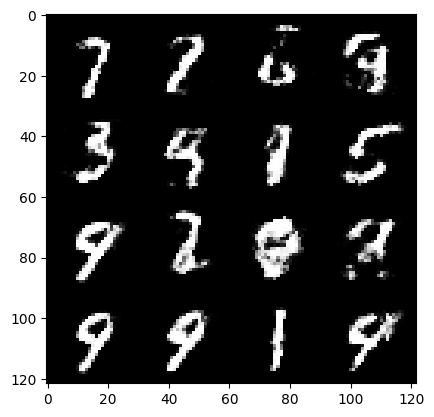

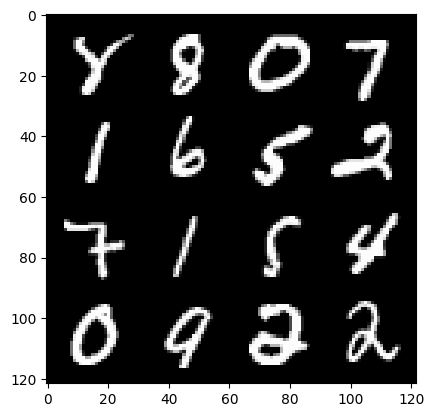

epoch : 140 , step :65700 , mean-disc-loss:  0.4775657635927203 , mean-gen-loss 1.315487258434296


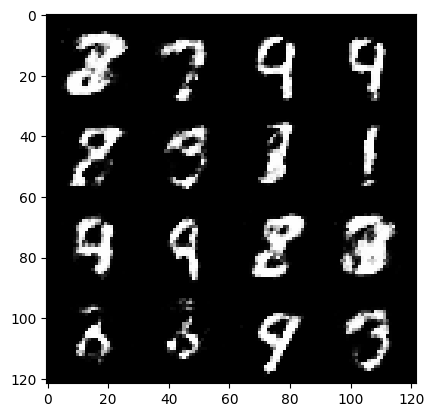

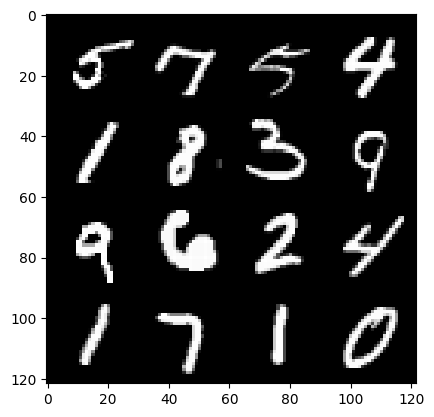

epoch : 140 , step :66000 , mean-disc-loss:  0.4996783721446989 , mean-gen-loss 1.2581201175848644


  0%|          | 0/469 [00:00<?, ?it/s]

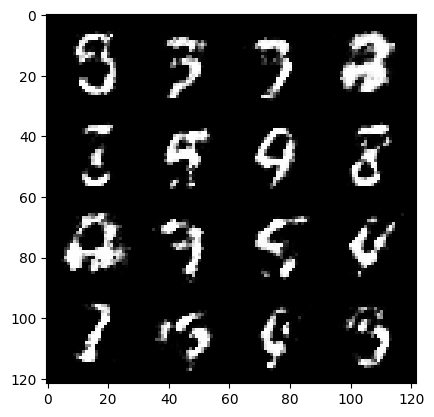

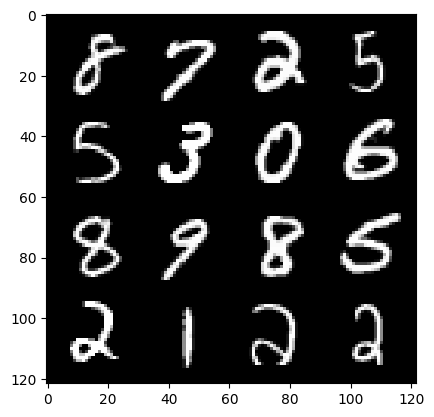

epoch : 141 , step :66300 , mean-disc-loss:  0.5053519620498019 , mean-gen-loss 1.22564999461174


  0%|          | 0/469 [00:00<?, ?it/s]

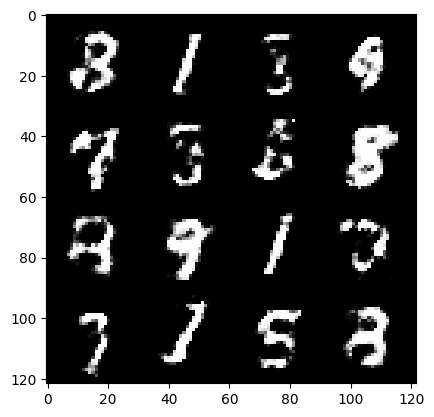

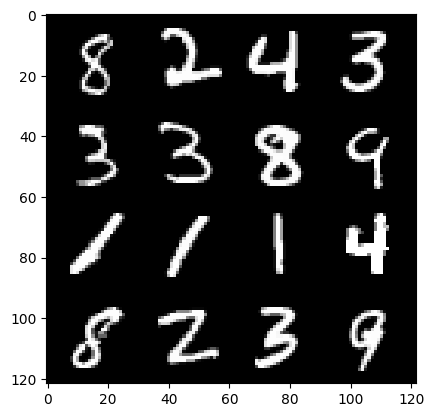

epoch : 142 , step :66600 , mean-disc-loss:  0.48928564200798697 , mean-gen-loss 1.26680707057317


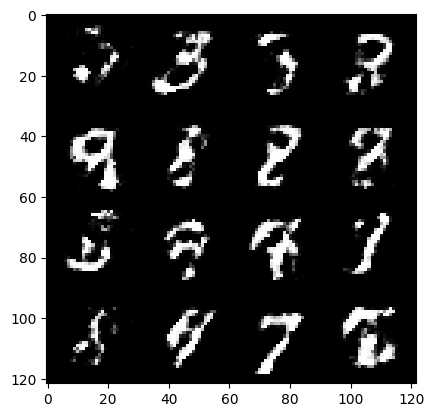

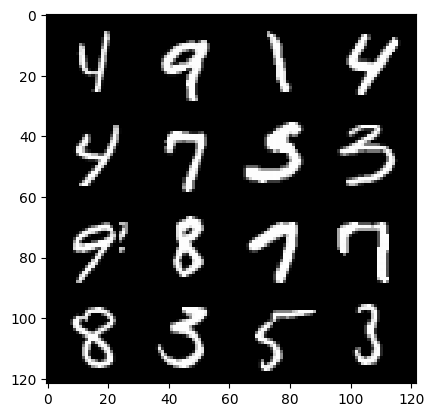

epoch : 142 , step :66900 , mean-disc-loss:  0.4788675419489545 , mean-gen-loss 1.2808998612562814


  0%|          | 0/469 [00:00<?, ?it/s]

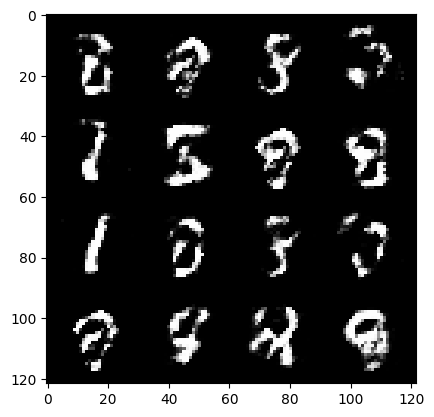

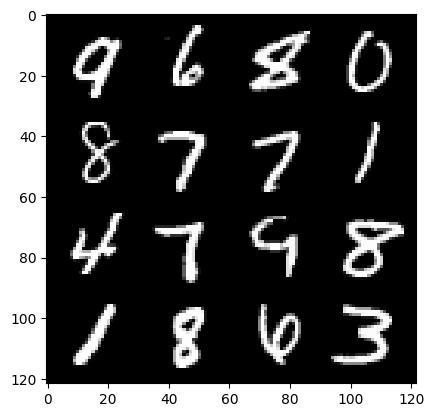

epoch : 143 , step :67200 , mean-disc-loss:  0.4886214134097099 , mean-gen-loss 1.2676965347925824


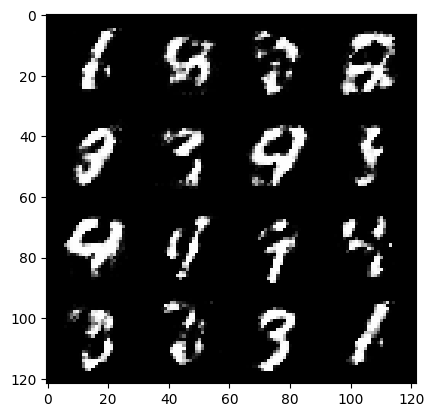

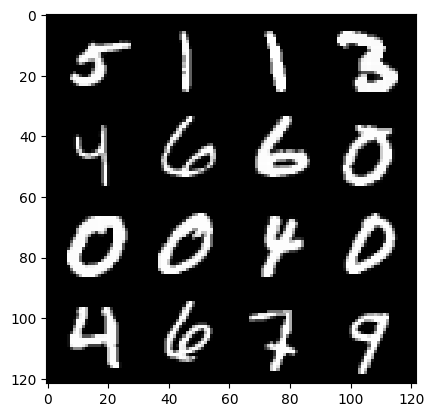

epoch : 143 , step :67500 , mean-disc-loss:  0.5250360334912934 , mean-gen-loss 1.2030899524688718


  0%|          | 0/469 [00:00<?, ?it/s]

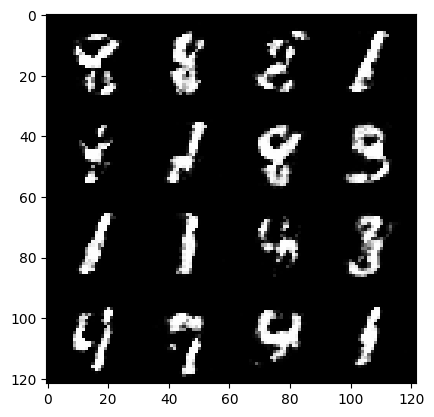

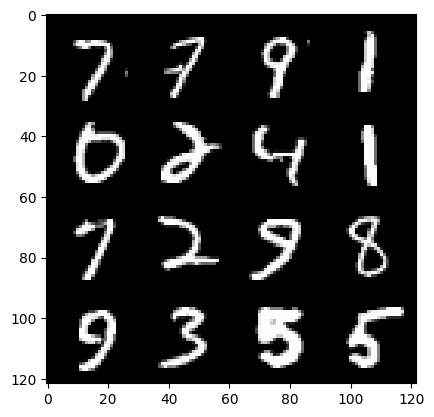

epoch : 144 , step :67800 , mean-disc-loss:  0.5098749845226606 , mean-gen-loss 1.1924143334229786


  0%|          | 0/469 [00:00<?, ?it/s]

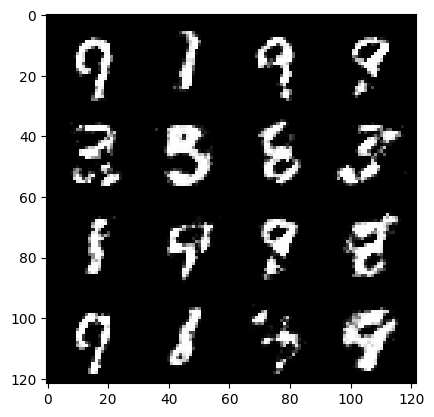

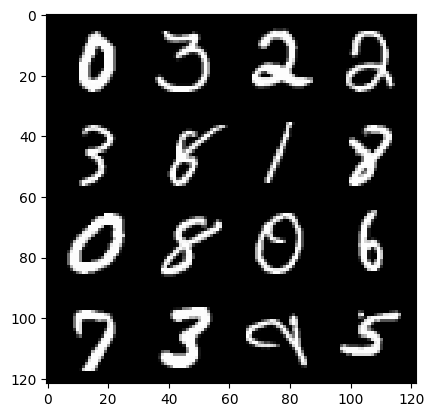

epoch : 145 , step :68100 , mean-disc-loss:  0.49927302539348606 , mean-gen-loss 1.2208347451686854


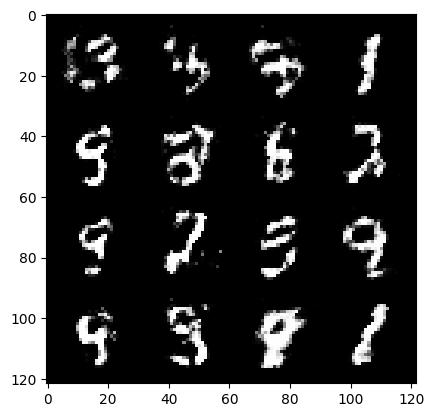

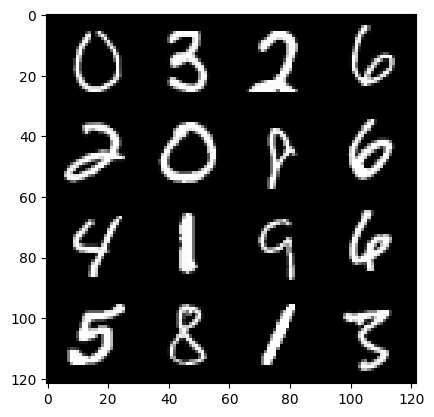

epoch : 145 , step :68400 , mean-disc-loss:  0.4786254674196243 , mean-gen-loss 1.272759657303492


  0%|          | 0/469 [00:00<?, ?it/s]

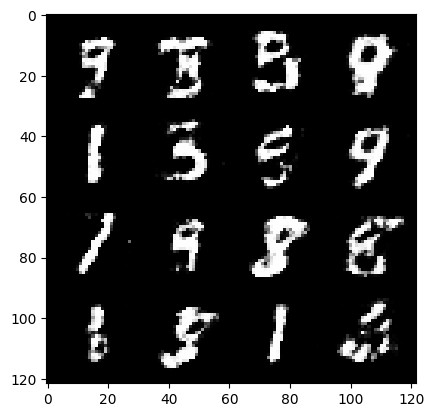

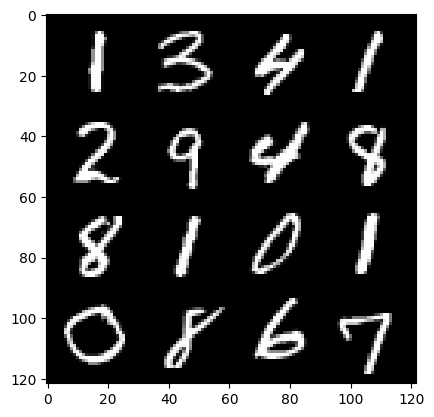

epoch : 146 , step :68700 , mean-disc-loss:  0.4905077587564787 , mean-gen-loss 1.269552263021469


  0%|          | 0/469 [00:00<?, ?it/s]

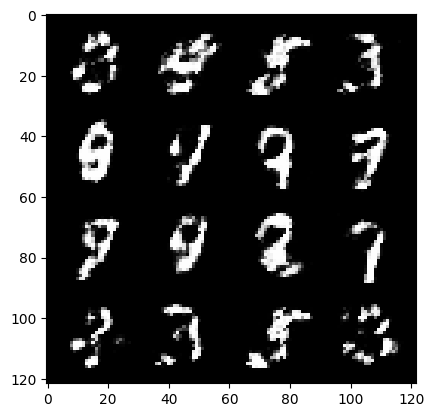

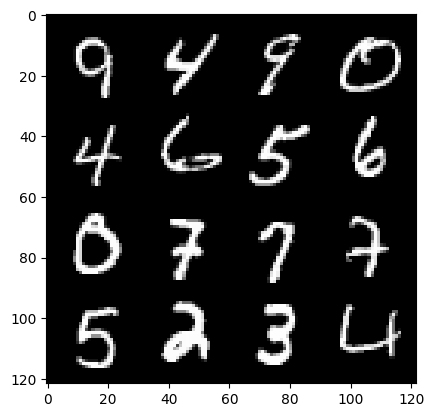

epoch : 147 , step :69000 , mean-disc-loss:  0.4659446480870247 , mean-gen-loss 1.2986333350340522


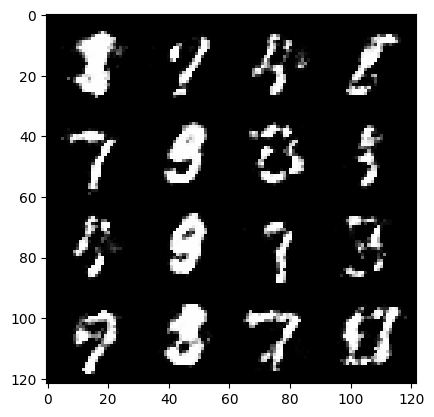

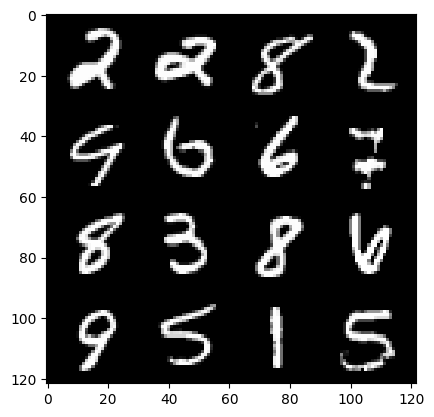

epoch : 147 , step :69300 , mean-disc-loss:  0.48008109182119396 , mean-gen-loss 1.2854063089688619


  0%|          | 0/469 [00:00<?, ?it/s]

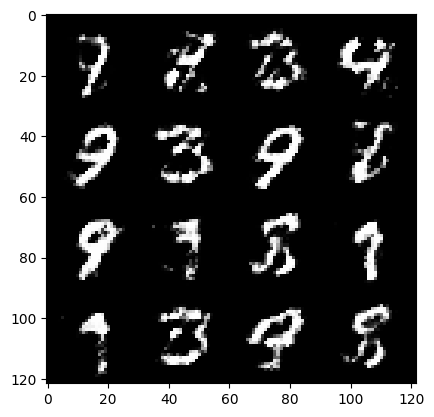

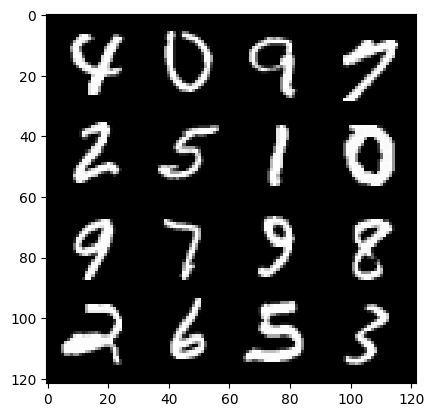

epoch : 148 , step :69600 , mean-disc-loss:  0.48026935189962366 , mean-gen-loss 1.29634029785792


  0%|          | 0/469 [00:00<?, ?it/s]

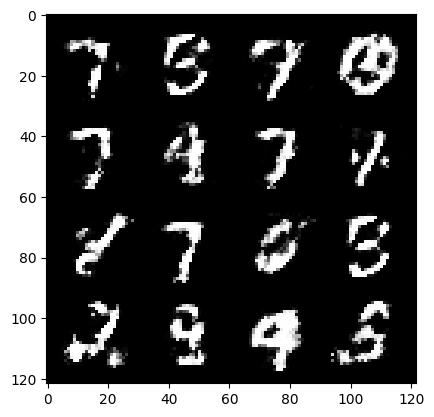

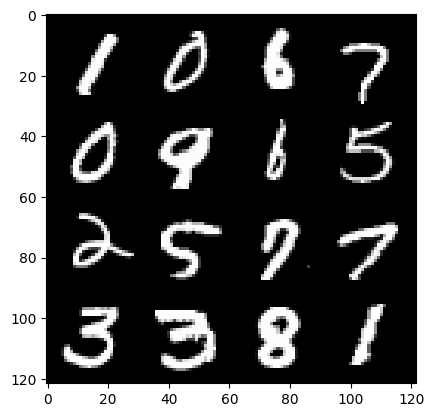

epoch : 149 , step :69900 , mean-disc-loss:  0.47675870388746266 , mean-gen-loss 1.293559553623199


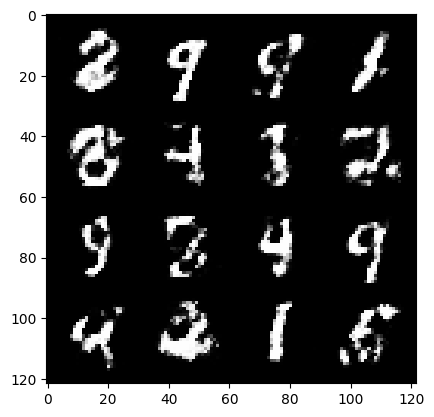

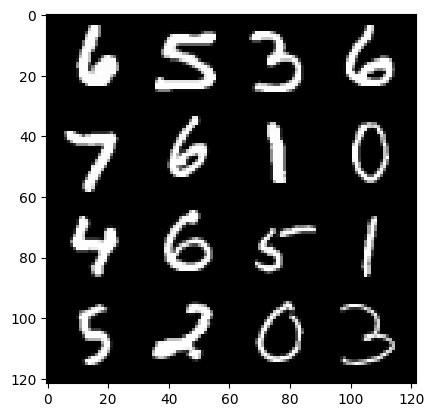

epoch : 149 , step :70200 , mean-disc-loss:  0.4699288450678188 , mean-gen-loss 1.3267293083667757


  0%|          | 0/469 [00:00<?, ?it/s]

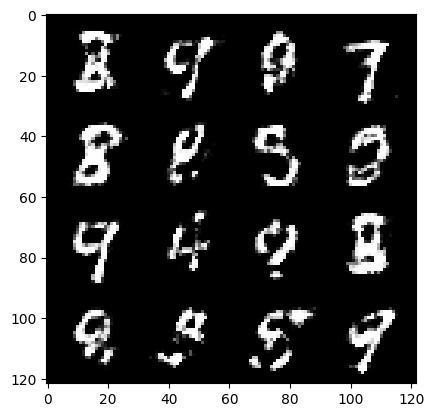

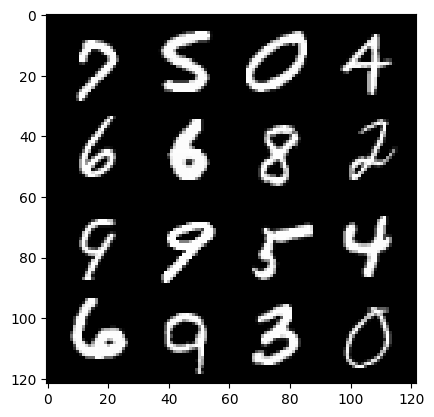

epoch : 150 , step :70500 , mean-disc-loss:  0.5026590728759764 , mean-gen-loss 1.2364108530680336


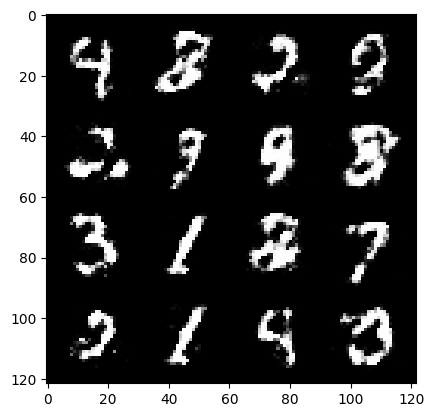

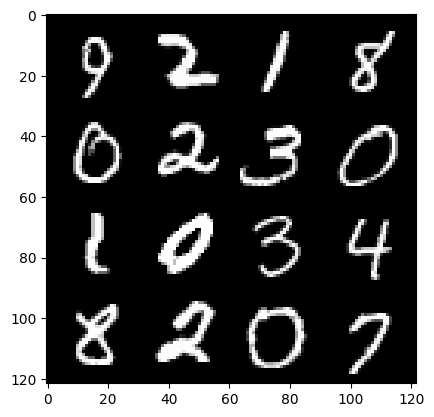

epoch : 150 , step :70800 , mean-disc-loss:  0.5143825613458952 , mean-gen-loss 1.184656817913056


  0%|          | 0/469 [00:00<?, ?it/s]

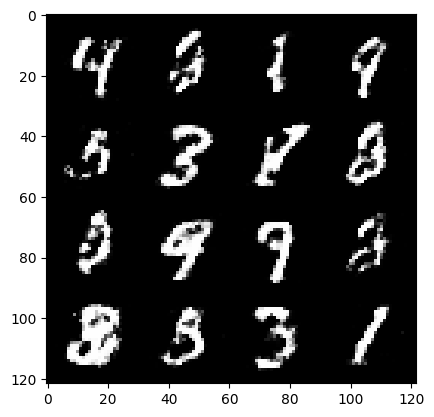

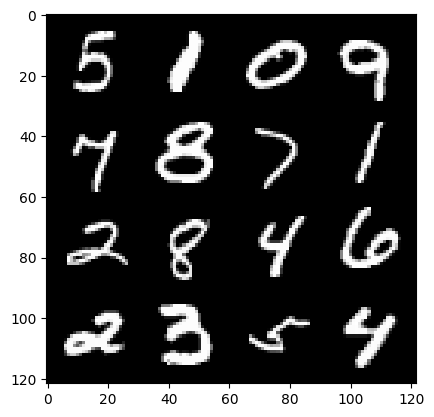

epoch : 151 , step :71100 , mean-disc-loss:  0.5019672345121703 , mean-gen-loss 1.2037464324633282


  0%|          | 0/469 [00:00<?, ?it/s]

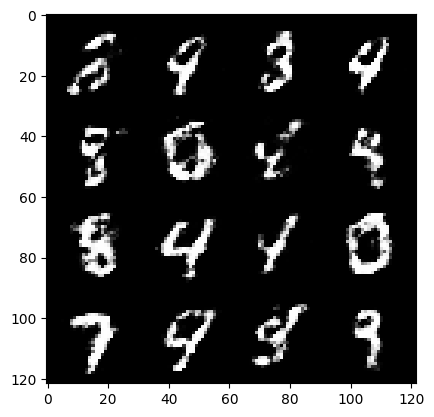

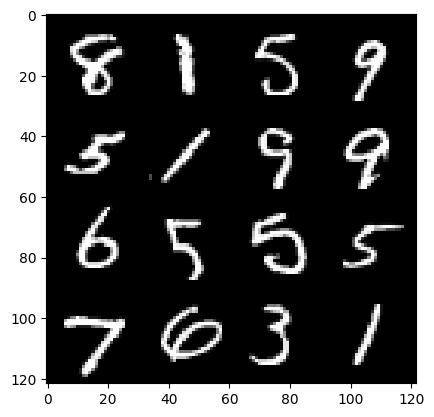

epoch : 152 , step :71400 , mean-disc-loss:  0.46568352192640294 , mean-gen-loss 1.3174526715278634


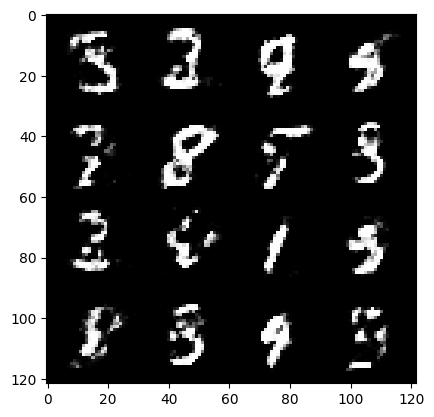

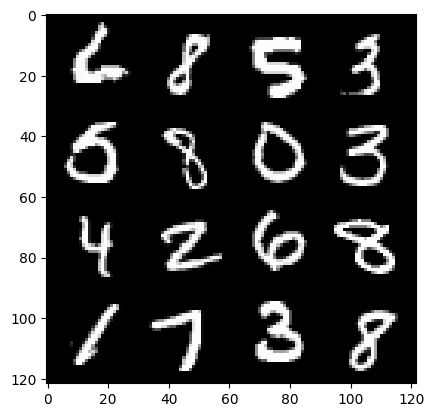

epoch : 152 , step :71700 , mean-disc-loss:  0.4912174343069396 , mean-gen-loss 1.256292684475582


  0%|          | 0/469 [00:00<?, ?it/s]

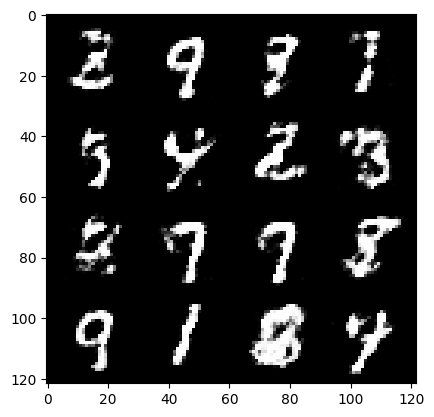

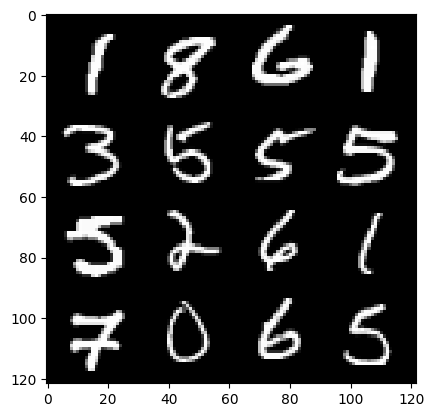

epoch : 153 , step :72000 , mean-disc-loss:  0.47862133820851654 , mean-gen-loss 1.27953064640363


  0%|          | 0/469 [00:00<?, ?it/s]

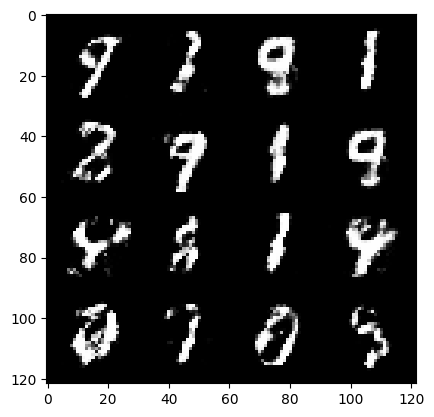

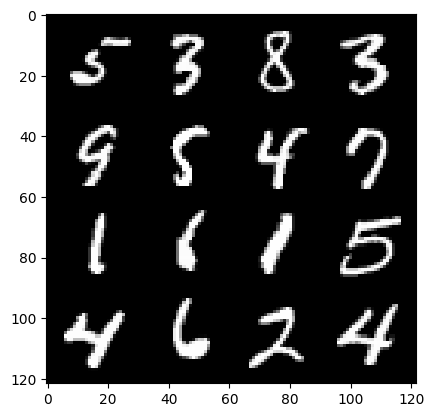

epoch : 154 , step :72300 , mean-disc-loss:  0.5098175766070686 , mean-gen-loss 1.2232437932491305


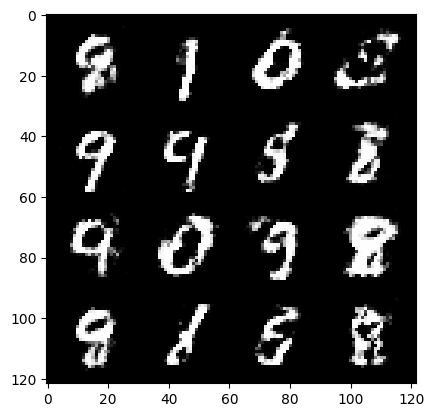

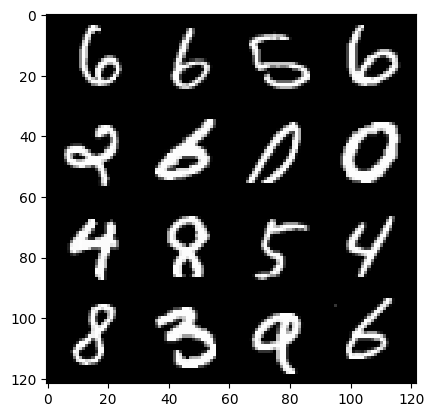

epoch : 154 , step :72600 , mean-disc-loss:  0.49874346236387895 , mean-gen-loss 1.2219480558236433


  0%|          | 0/469 [00:00<?, ?it/s]

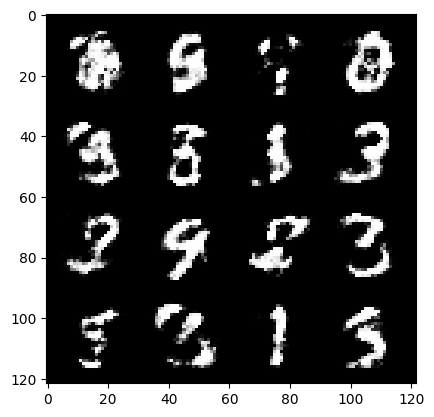

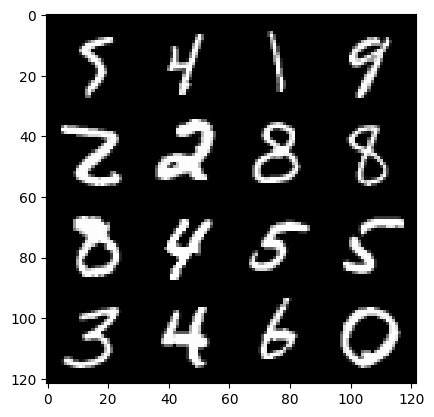

epoch : 155 , step :72900 , mean-disc-loss:  0.48237357378005963 , mean-gen-loss 1.279186245997747


  0%|          | 0/469 [00:00<?, ?it/s]

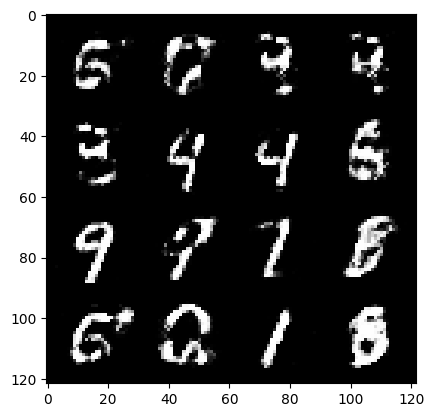

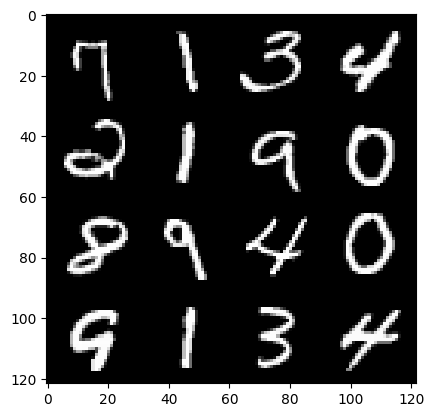

epoch : 156 , step :73200 , mean-disc-loss:  0.5216303592920303 , mean-gen-loss 1.1802059016625082


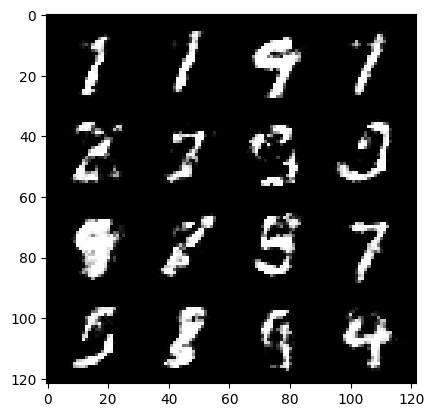

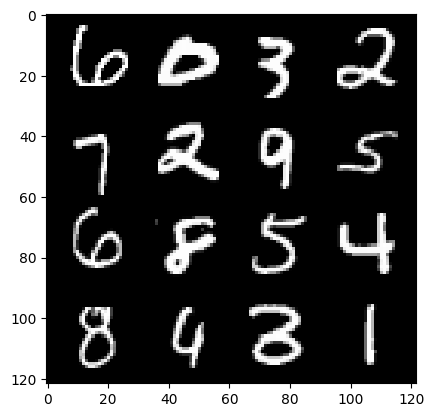

epoch : 156 , step :73500 , mean-disc-loss:  0.5148707553744315 , mean-gen-loss 1.1668638251225163


  0%|          | 0/469 [00:00<?, ?it/s]

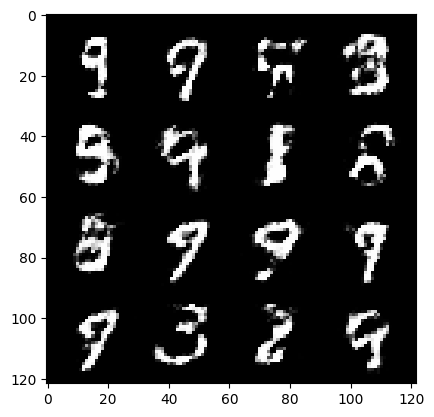

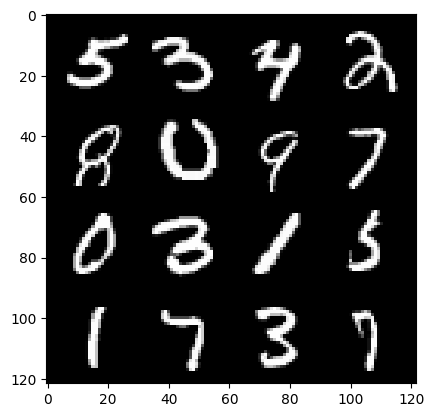

epoch : 157 , step :73800 , mean-disc-loss:  0.49875651518503805 , mean-gen-loss 1.2381055506070455


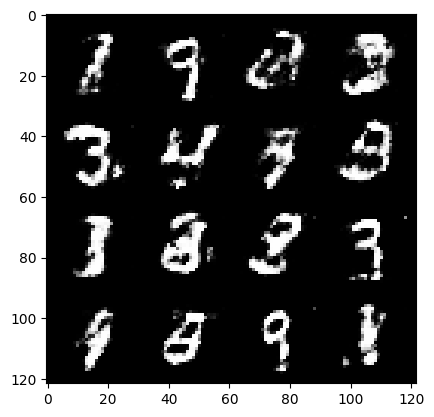

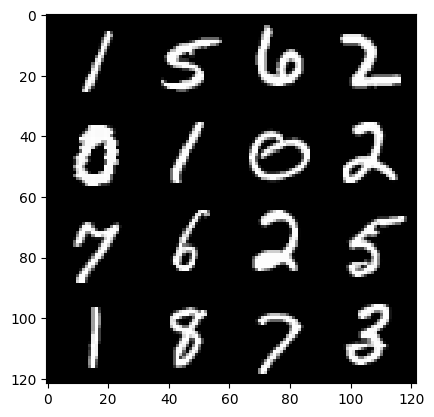

epoch : 157 , step :74100 , mean-disc-loss:  0.5175878614187239 , mean-gen-loss 1.2171287822723398


  0%|          | 0/469 [00:00<?, ?it/s]

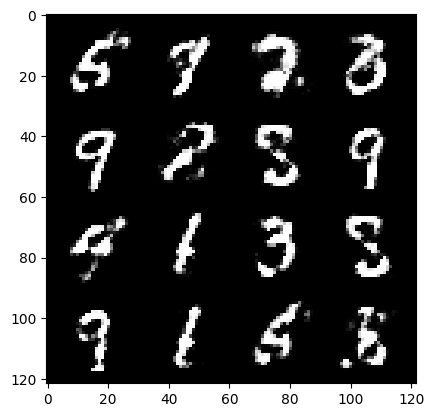

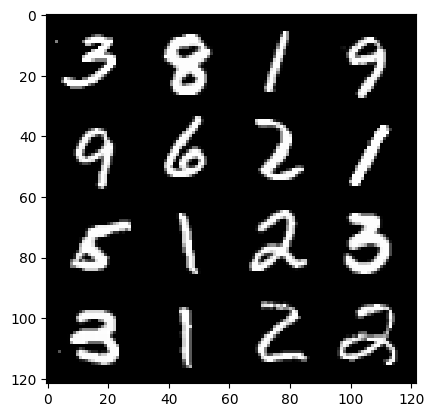

epoch : 158 , step :74400 , mean-disc-loss:  0.5237399269143739 , mean-gen-loss 1.1981639852126442


  0%|          | 0/469 [00:00<?, ?it/s]

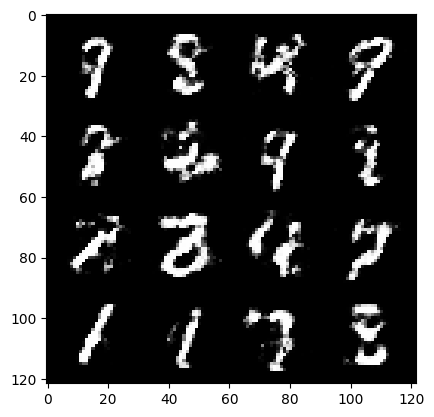

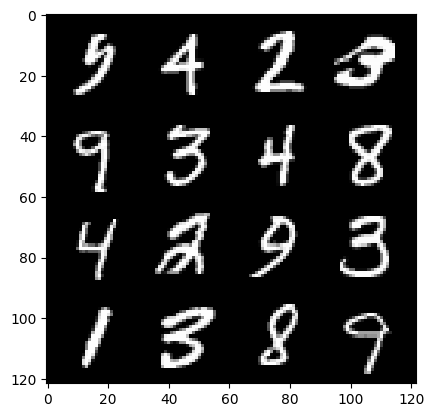

epoch : 159 , step :74700 , mean-disc-loss:  0.5304871057470641 , mean-gen-loss 1.1723446774482718


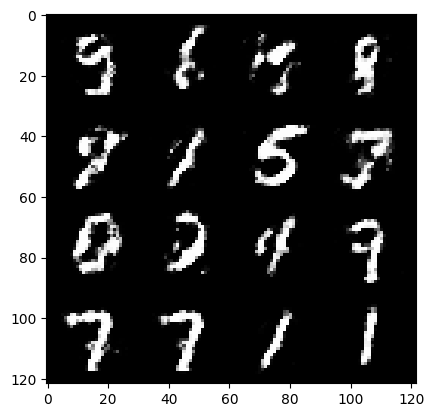

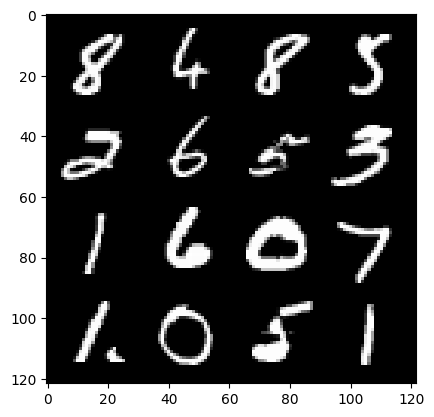

epoch : 159 , step :75000 , mean-disc-loss:  0.5103221185008681 , mean-gen-loss 1.1931825459003447


  0%|          | 0/469 [00:00<?, ?it/s]

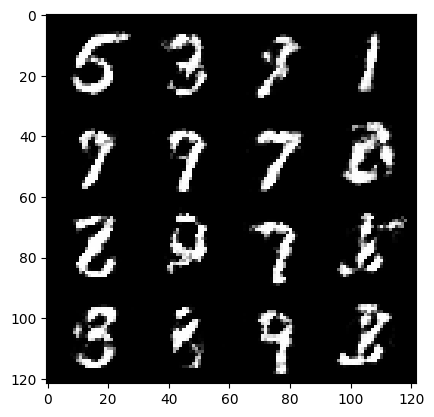

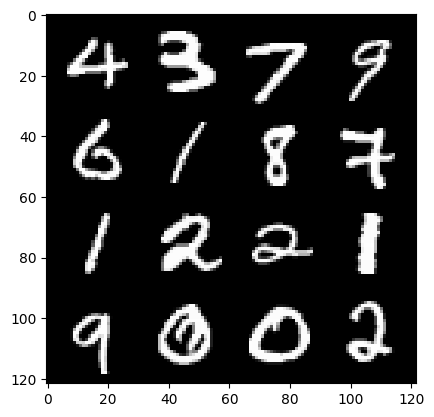

epoch : 160 , step :75300 , mean-disc-loss:  0.518557448486487 , mean-gen-loss 1.186811693906785


  0%|          | 0/469 [00:00<?, ?it/s]

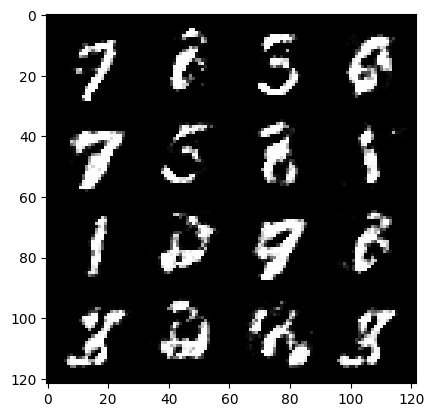

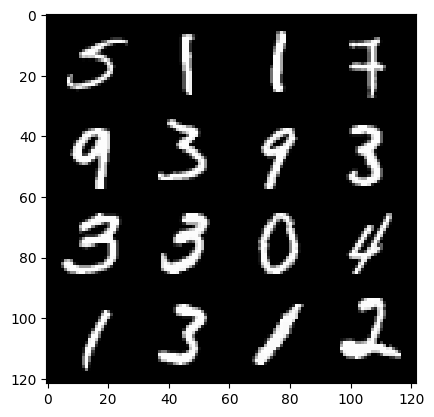

epoch : 161 , step :75600 , mean-disc-loss:  0.5168017045656839 , mean-gen-loss 1.1697715371847157


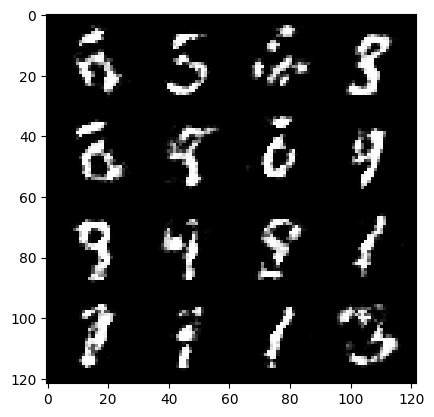

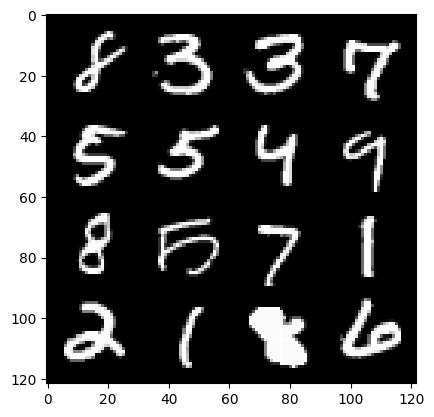

epoch : 161 , step :75900 , mean-disc-loss:  0.5156867776314419 , mean-gen-loss 1.167664610544841


  0%|          | 0/469 [00:00<?, ?it/s]

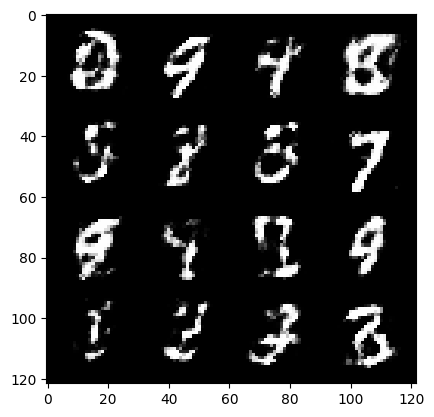

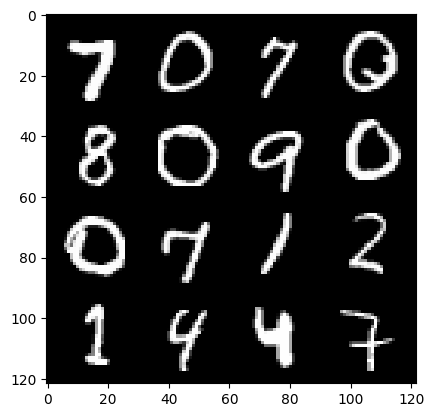

epoch : 162 , step :76200 , mean-disc-loss:  0.5201036872466405 , mean-gen-loss 1.1626265782117848


  0%|          | 0/469 [00:00<?, ?it/s]

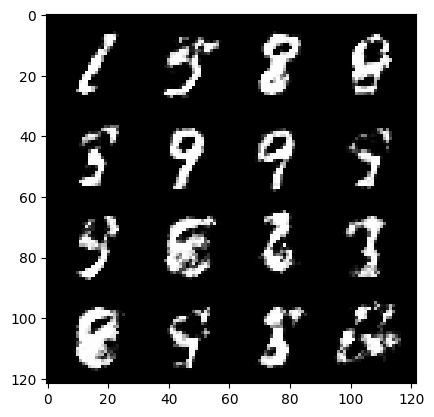

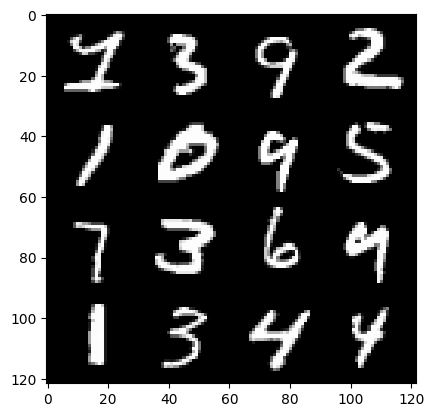

epoch : 163 , step :76500 , mean-disc-loss:  0.4846741255124412 , mean-gen-loss 1.2450027314821877


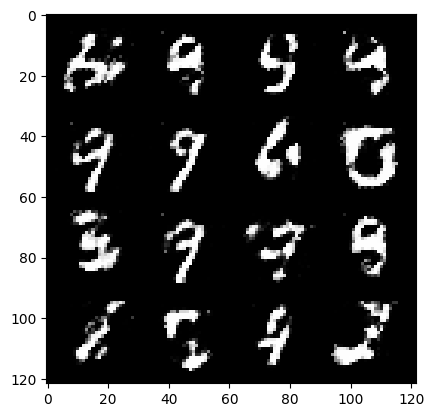

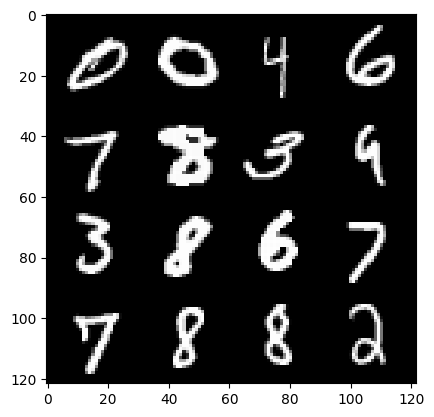

epoch : 163 , step :76800 , mean-disc-loss:  0.5231180869539575 , mean-gen-loss 1.1644715758164719


  0%|          | 0/469 [00:00<?, ?it/s]

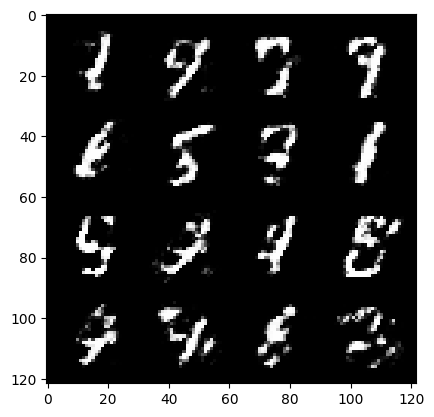

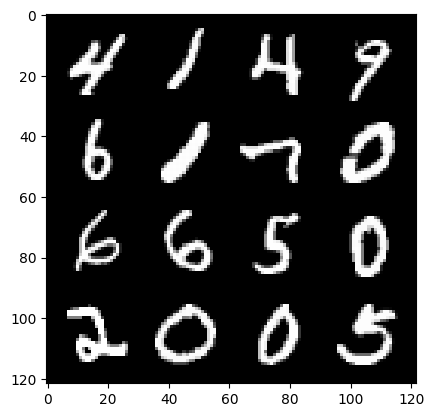

epoch : 164 , step :77100 , mean-disc-loss:  0.5250774064660073 , mean-gen-loss 1.1675808922449755


  0%|          | 0/469 [00:00<?, ?it/s]

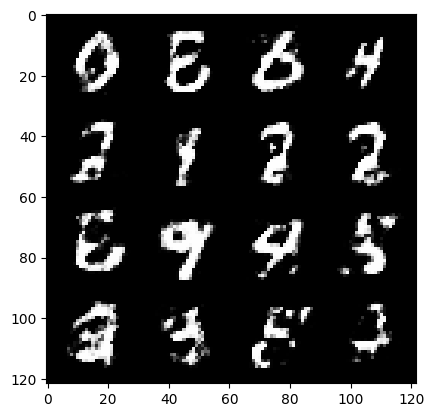

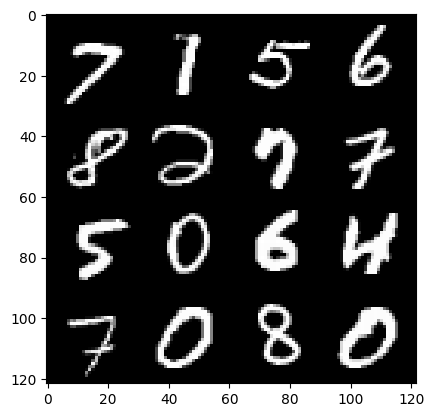

epoch : 165 , step :77400 , mean-disc-loss:  0.5202995568513868 , mean-gen-loss 1.1612127478917438


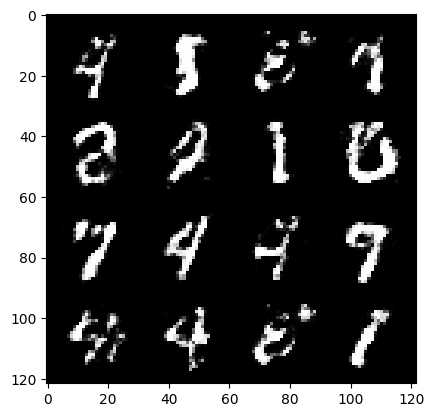

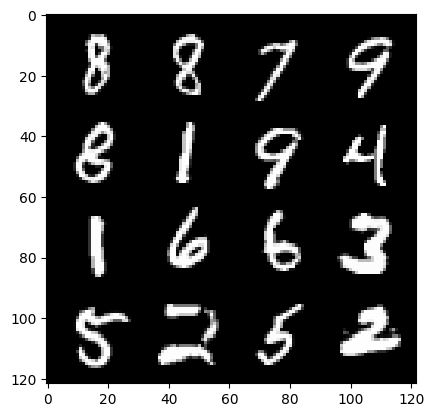

epoch : 165 , step :77700 , mean-disc-loss:  0.5154537728428843 , mean-gen-loss 1.1662924130757648


  0%|          | 0/469 [00:00<?, ?it/s]

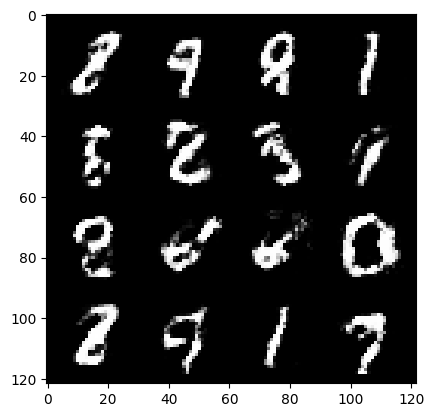

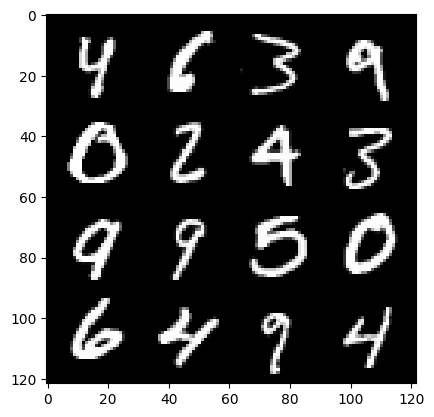

epoch : 166 , step :78000 , mean-disc-loss:  0.5199762975176175 , mean-gen-loss 1.1695253415902456


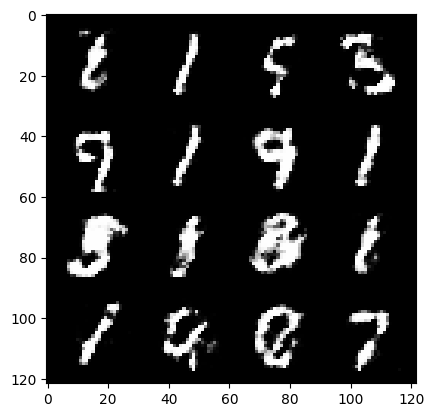

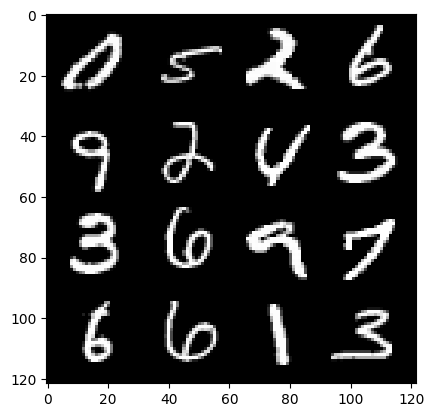

epoch : 166 , step :78300 , mean-disc-loss:  0.538124711612861 , mean-gen-loss 1.1095874114831288


  0%|          | 0/469 [00:00<?, ?it/s]

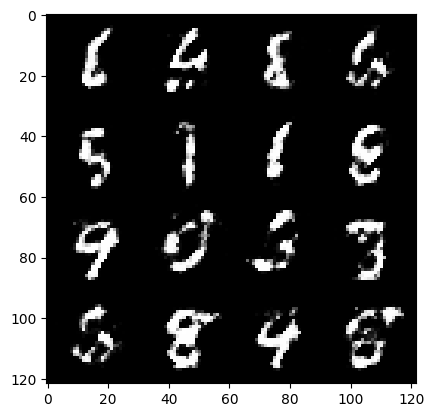

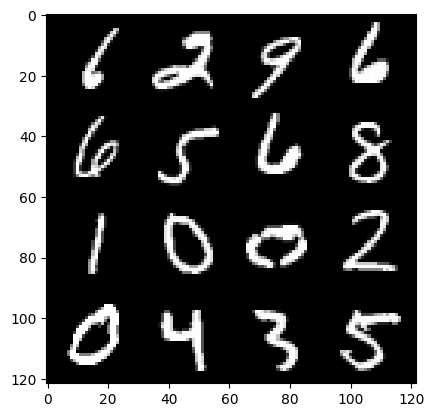

epoch : 167 , step :78600 , mean-disc-loss:  0.5282013885180156 , mean-gen-loss 1.148484703501066


  0%|          | 0/469 [00:00<?, ?it/s]

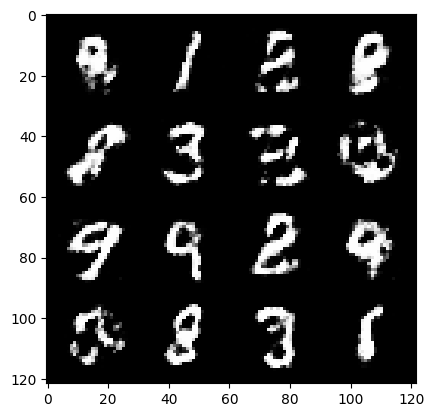

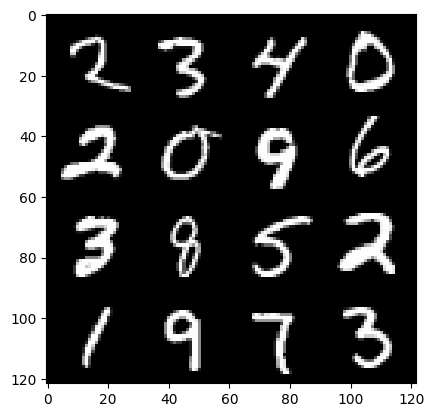

epoch : 168 , step :78900 , mean-disc-loss:  0.5480752082665759 , mean-gen-loss 1.1037383913993828


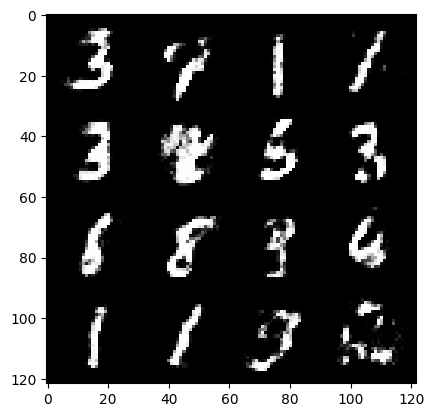

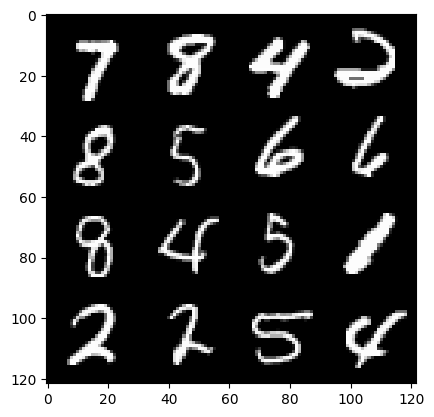

epoch : 168 , step :79200 , mean-disc-loss:  0.5441732890407244 , mean-gen-loss 1.0893094674746189


  0%|          | 0/469 [00:00<?, ?it/s]

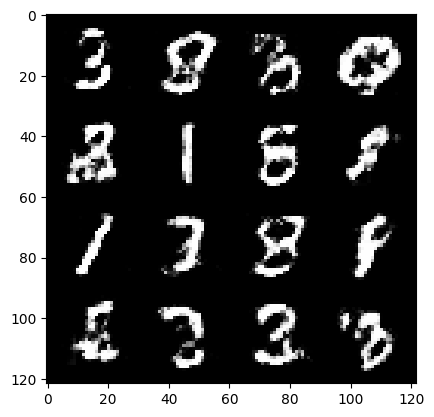

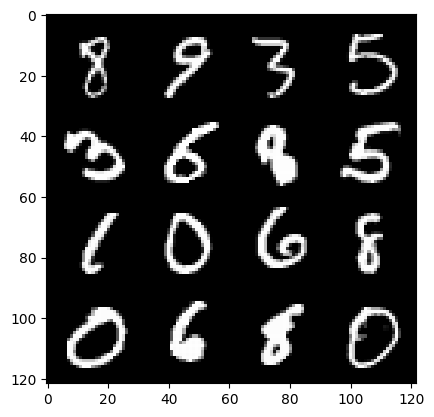

epoch : 169 , step :79500 , mean-disc-loss:  0.5337900949517891 , mean-gen-loss 1.1225689957539238


  0%|          | 0/469 [00:00<?, ?it/s]

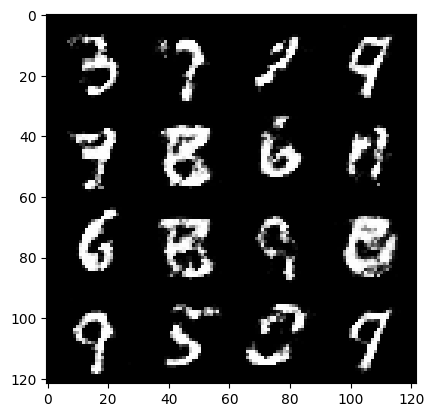

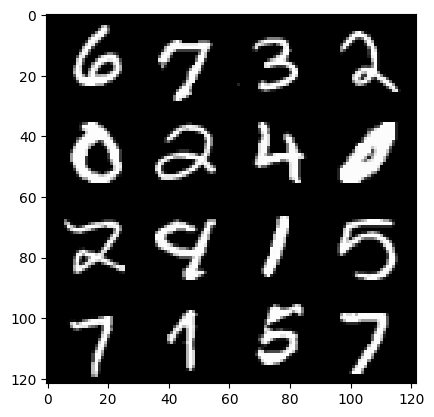

epoch : 170 , step :79800 , mean-disc-loss:  0.5326104936003687 , mean-gen-loss 1.1416971427202225


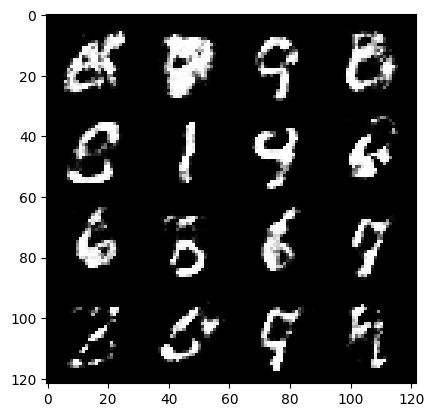

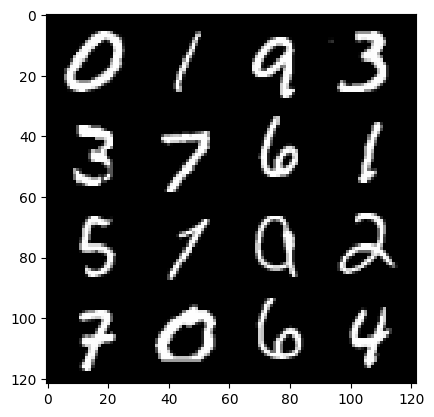

epoch : 170 , step :80100 , mean-disc-loss:  0.5316620716452598 , mean-gen-loss 1.1509720659255986


  0%|          | 0/469 [00:00<?, ?it/s]

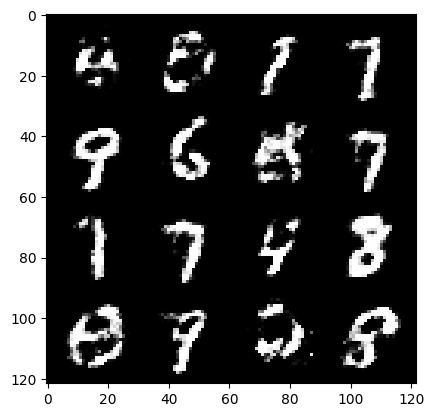

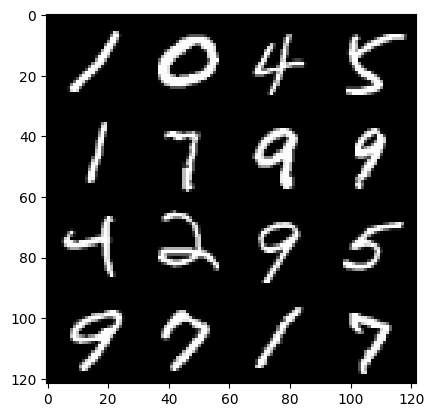

epoch : 171 , step :80400 , mean-disc-loss:  0.544606807132562 , mean-gen-loss 1.1226339507102965


  0%|          | 0/469 [00:00<?, ?it/s]

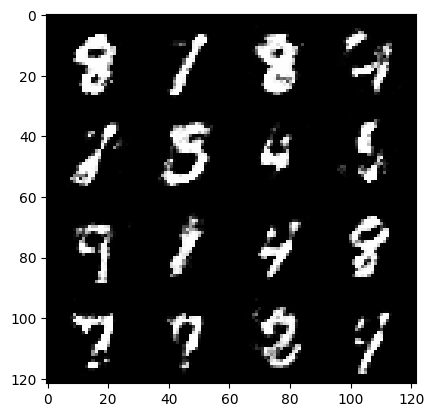

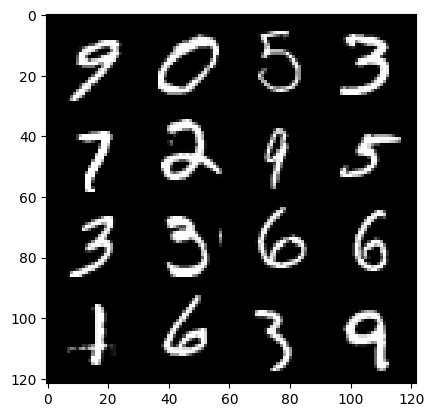

epoch : 172 , step :80700 , mean-disc-loss:  0.529326888223489 , mean-gen-loss 1.1285143379370366


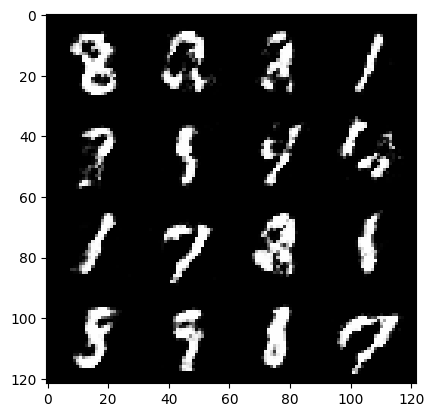

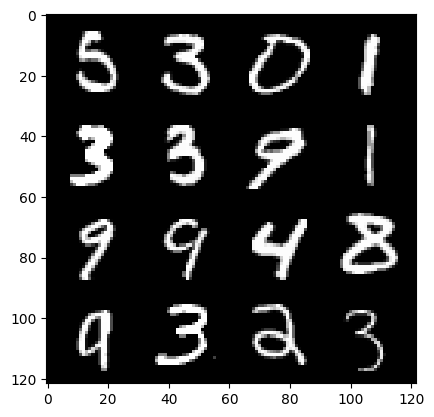

epoch : 172 , step :81000 , mean-disc-loss:  0.5224697318673136 , mean-gen-loss 1.1647042866547892


  0%|          | 0/469 [00:00<?, ?it/s]

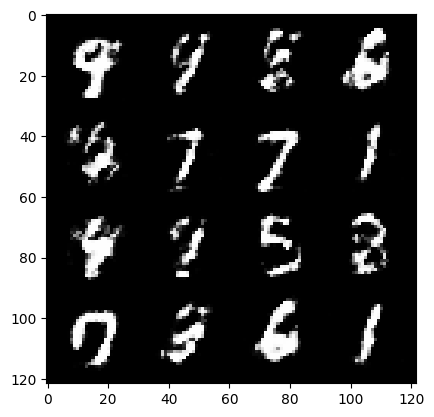

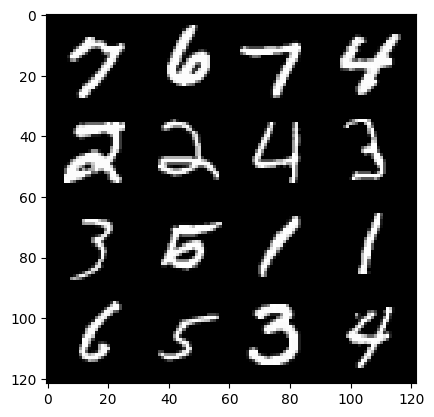

epoch : 173 , step :81300 , mean-disc-loss:  0.5509444338083263 , mean-gen-loss 1.0966656746466952


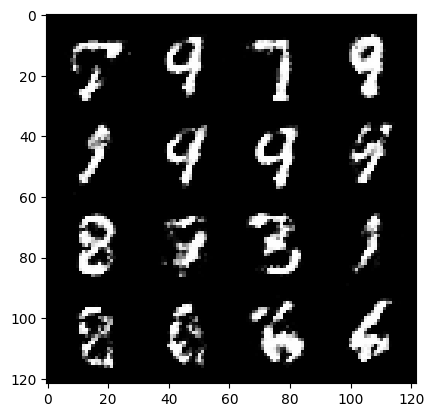

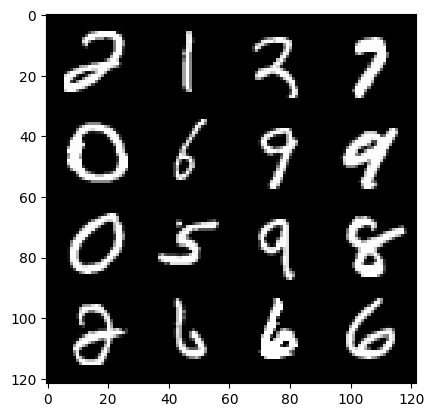

epoch : 173 , step :81600 , mean-disc-loss:  0.5308054147164027 , mean-gen-loss 1.1082048149903614


  0%|          | 0/469 [00:00<?, ?it/s]

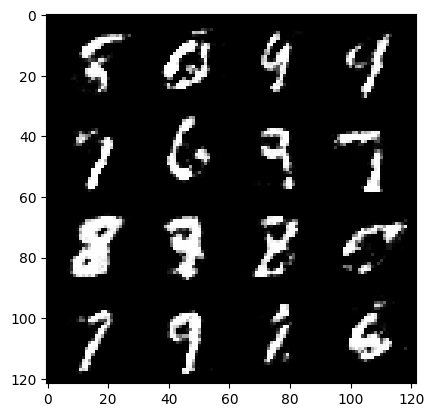

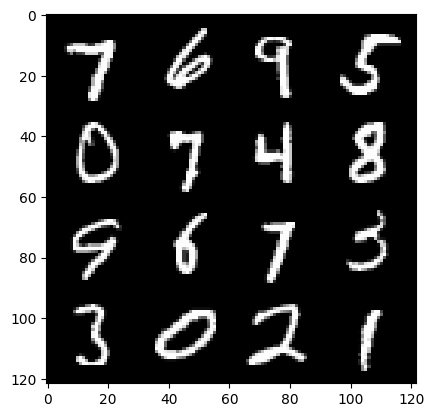

epoch : 174 , step :81900 , mean-disc-loss:  0.5157816751797996 , mean-gen-loss 1.1417179361979166


  0%|          | 0/469 [00:00<?, ?it/s]

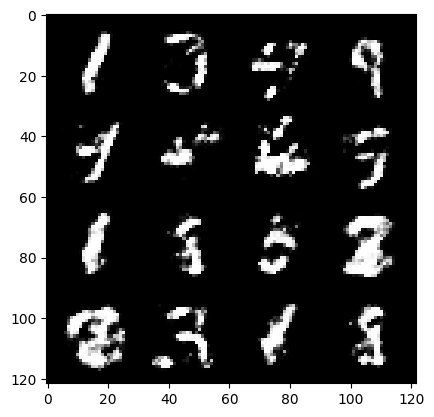

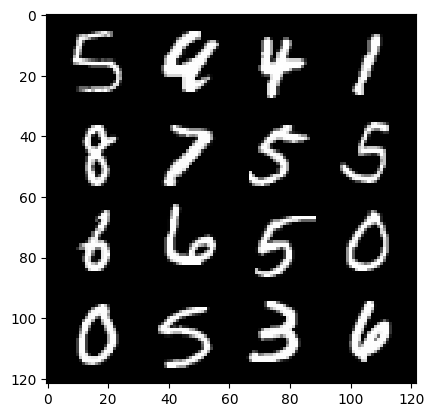

epoch : 175 , step :82200 , mean-disc-loss:  0.5221847230196001 , mean-gen-loss 1.1493820178508765


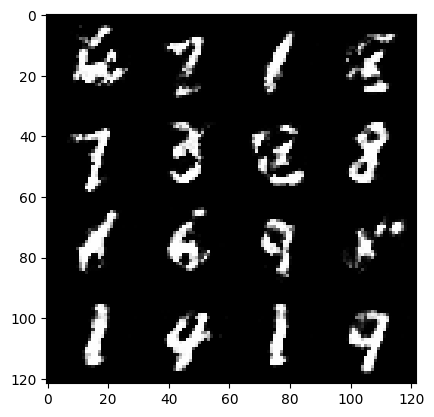

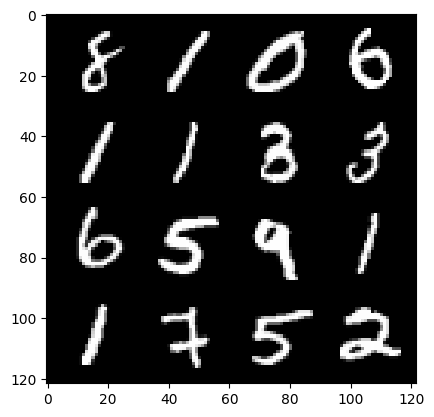

epoch : 175 , step :82500 , mean-disc-loss:  0.5257811041673023 , mean-gen-loss 1.1399563940366098


  0%|          | 0/469 [00:00<?, ?it/s]

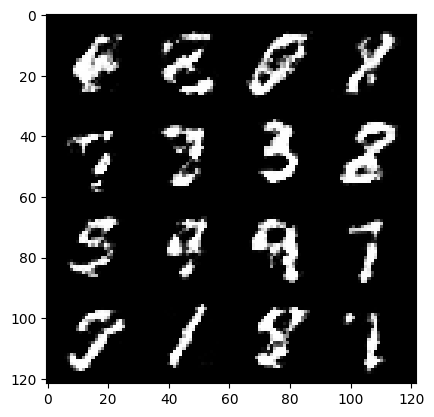

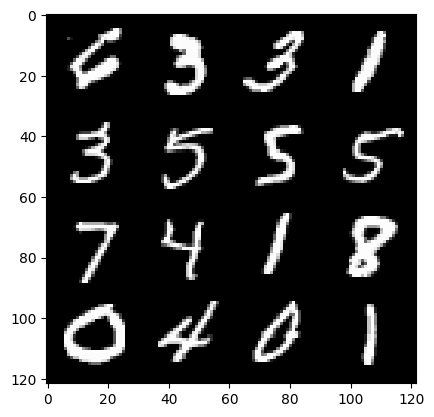

epoch : 176 , step :82800 , mean-disc-loss:  0.524216815630595 , mean-gen-loss 1.1629114701350525


  0%|          | 0/469 [00:00<?, ?it/s]

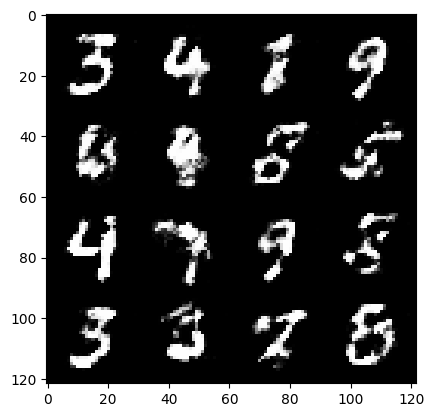

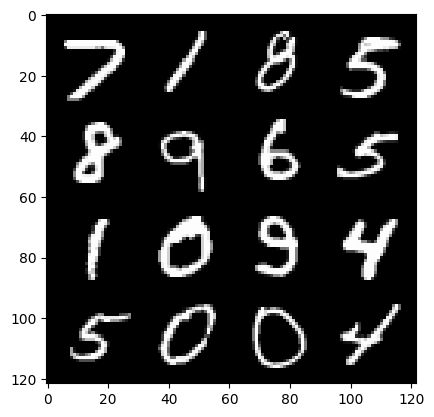

epoch : 177 , step :83100 , mean-disc-loss:  0.544471297164758 , mean-gen-loss 1.0914270895719522


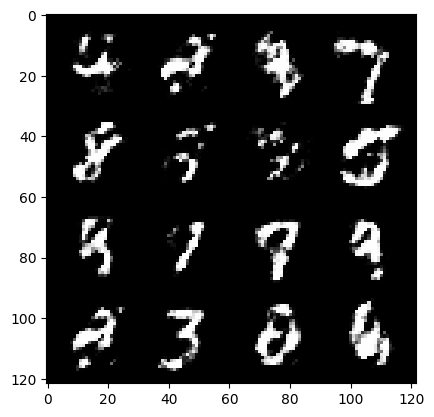

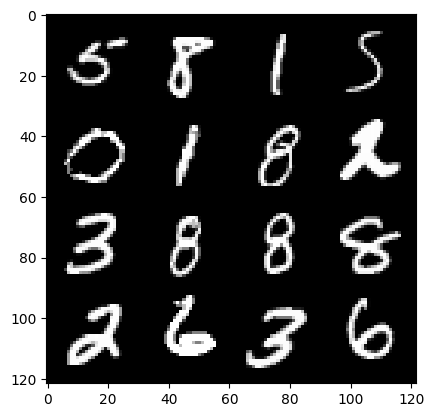

epoch : 177 , step :83400 , mean-disc-loss:  0.5331670415401462 , mean-gen-loss 1.1222546452283866


  0%|          | 0/469 [00:00<?, ?it/s]

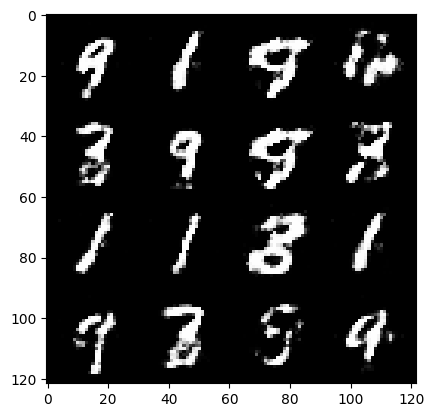

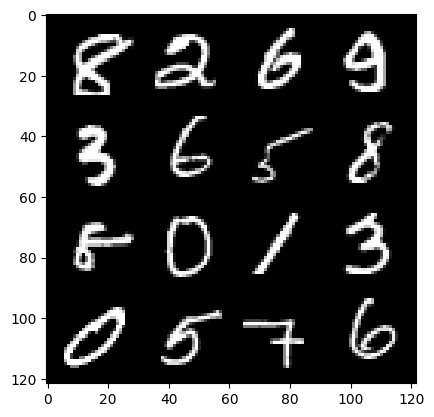

epoch : 178 , step :83700 , mean-disc-loss:  0.5284349114696183 , mean-gen-loss 1.131468724807104


  0%|          | 0/469 [00:00<?, ?it/s]

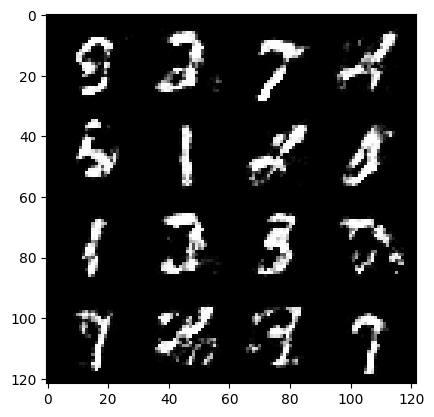

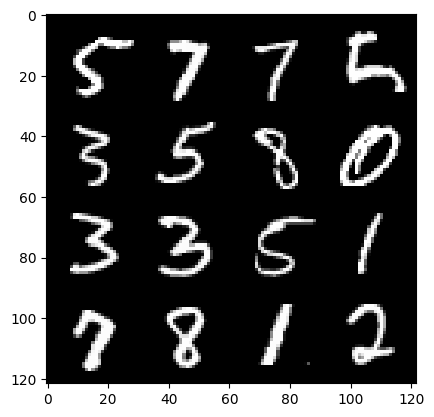

epoch : 179 , step :84000 , mean-disc-loss:  0.5392861600716908 , mean-gen-loss 1.0991548701127365


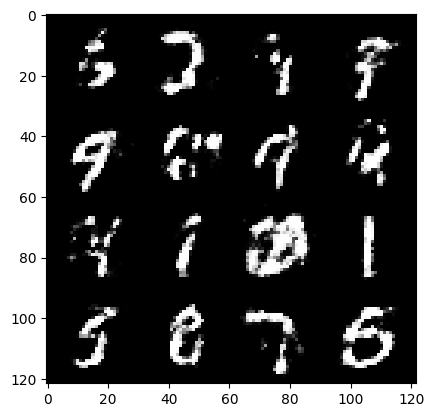

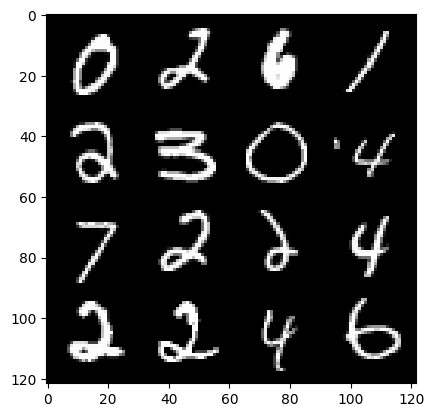

epoch : 179 , step :84300 , mean-disc-loss:  0.5102104682723678 , mean-gen-loss 1.1380783236026761


  0%|          | 0/469 [00:00<?, ?it/s]

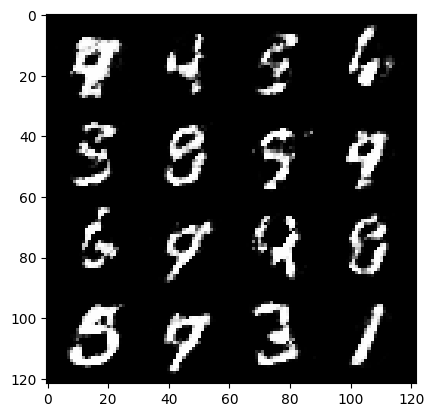

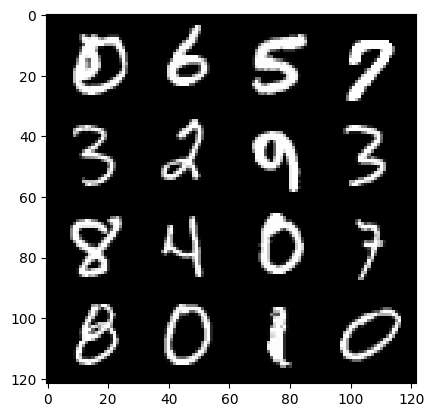

epoch : 180 , step :84600 , mean-disc-loss:  0.5183850424488387 , mean-gen-loss 1.1499605019887296


  0%|          | 0/469 [00:00<?, ?it/s]

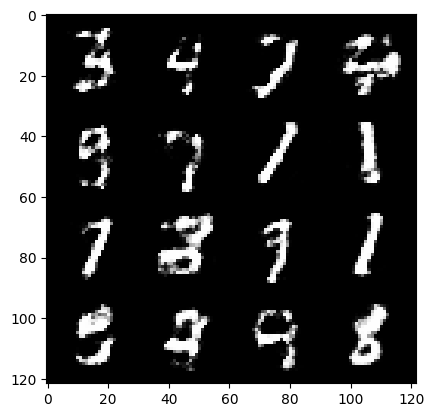

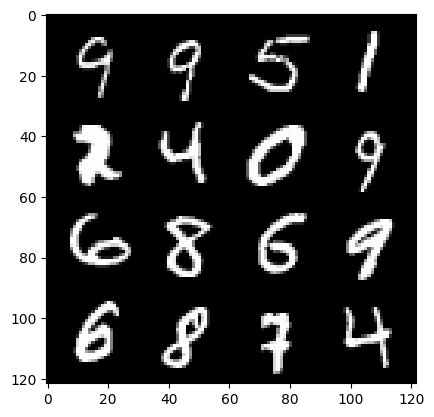

epoch : 181 , step :84900 , mean-disc-loss:  0.5238461919625601 , mean-gen-loss 1.133635088205337


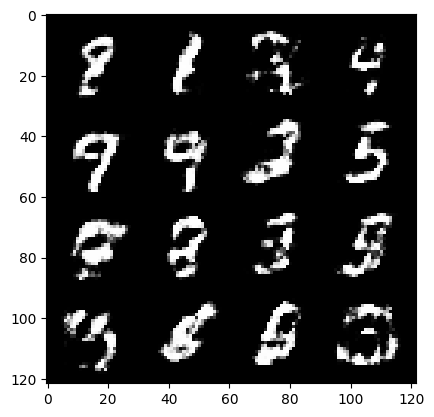

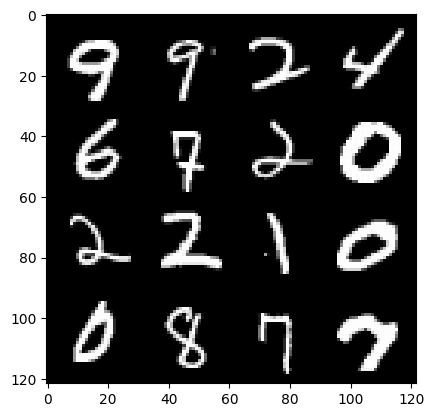

epoch : 181 , step :85200 , mean-disc-loss:  0.5553984607259433 , mean-gen-loss 1.0553052141269053


  0%|          | 0/469 [00:00<?, ?it/s]

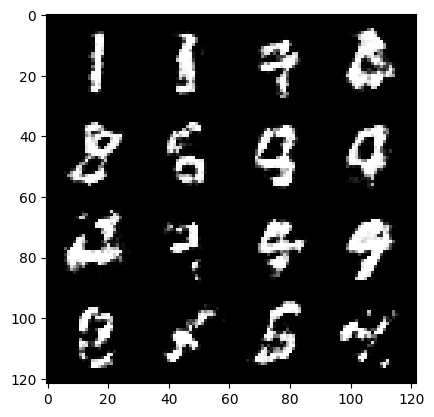

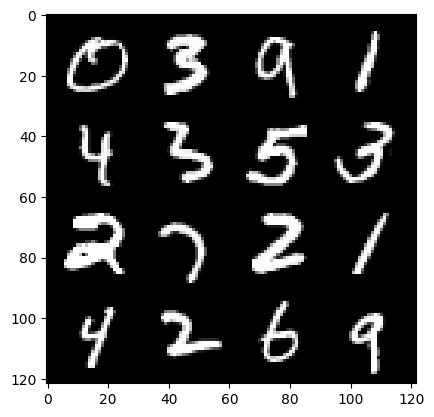

epoch : 182 , step :85500 , mean-disc-loss:  0.5466531906525296 , mean-gen-loss 1.0587854190667467


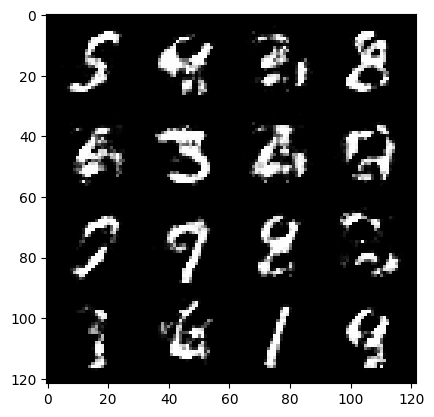

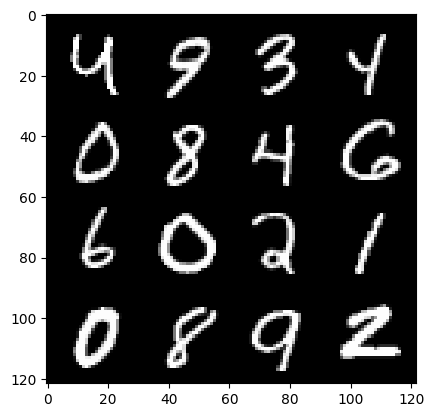

epoch : 182 , step :85800 , mean-disc-loss:  0.5228879005710286 , mean-gen-loss 1.1108578463395433


  0%|          | 0/469 [00:00<?, ?it/s]

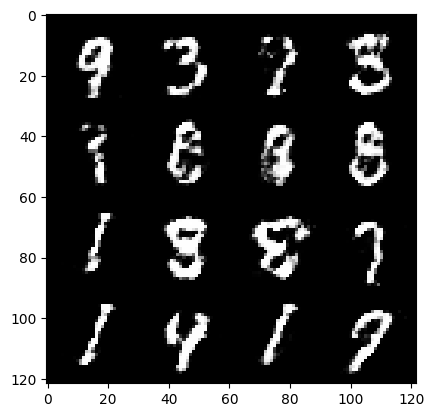

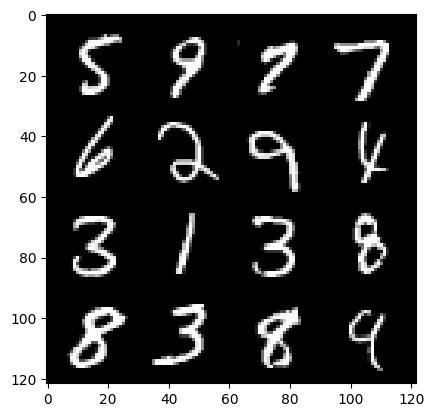

epoch : 183 , step :86100 , mean-disc-loss:  0.512066816786925 , mean-gen-loss 1.1641595292091373


  0%|          | 0/469 [00:00<?, ?it/s]

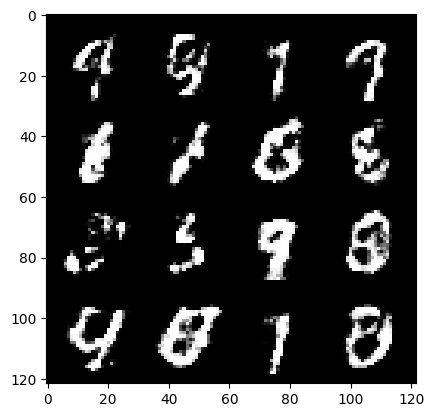

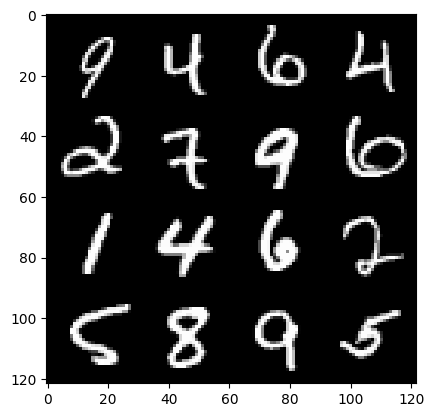

epoch : 184 , step :86400 , mean-disc-loss:  0.543270742793878 , mean-gen-loss 1.1002288067340855


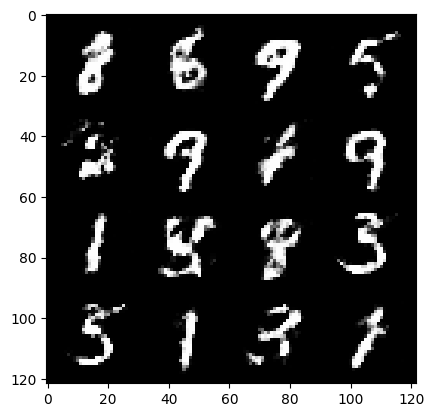

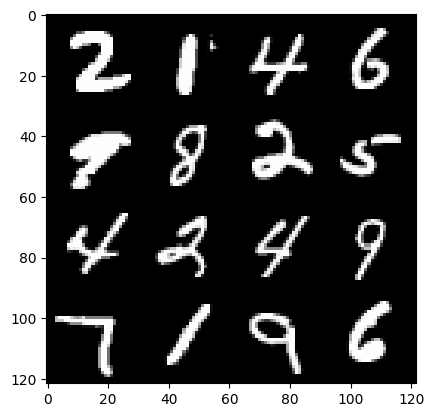

epoch : 184 , step :86700 , mean-disc-loss:  0.5315875446796422 , mean-gen-loss 1.0984699853261315


  0%|          | 0/469 [00:00<?, ?it/s]

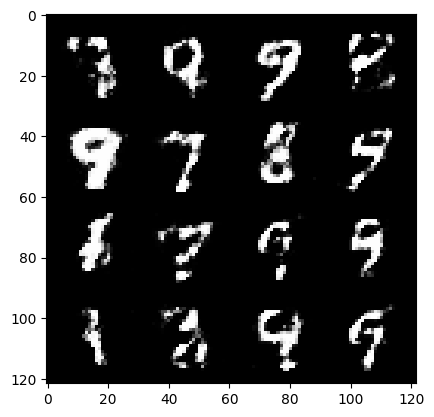

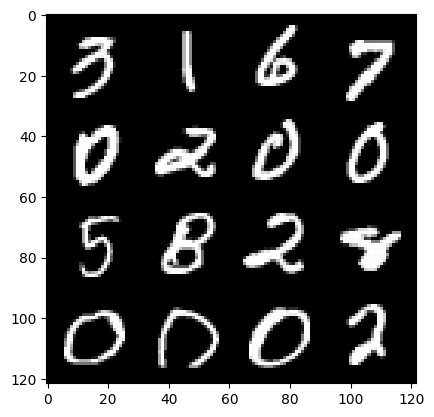

epoch : 185 , step :87000 , mean-disc-loss:  0.5343808008233706 , mean-gen-loss 1.1049034124612809


  0%|          | 0/469 [00:00<?, ?it/s]

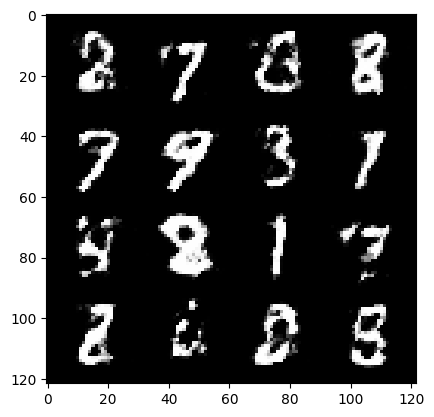

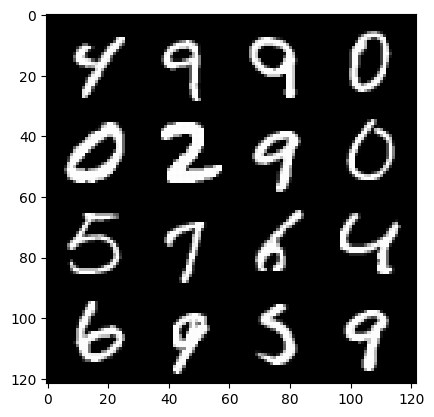

epoch : 186 , step :87300 , mean-disc-loss:  0.528937822083632 , mean-gen-loss 1.1061223910252245


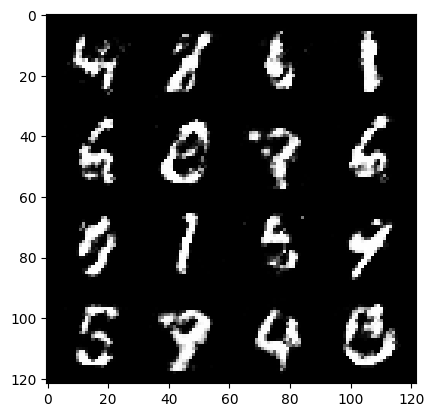

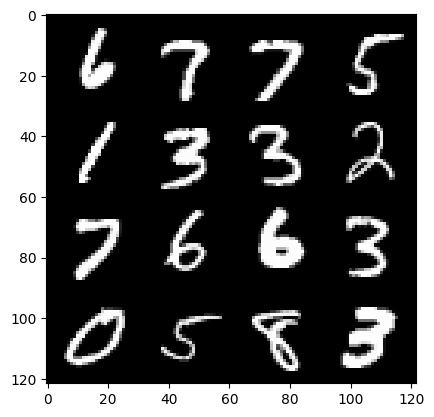

epoch : 186 , step :87600 , mean-disc-loss:  0.5383815668026601 , mean-gen-loss 1.0985011353095377


  0%|          | 0/469 [00:00<?, ?it/s]

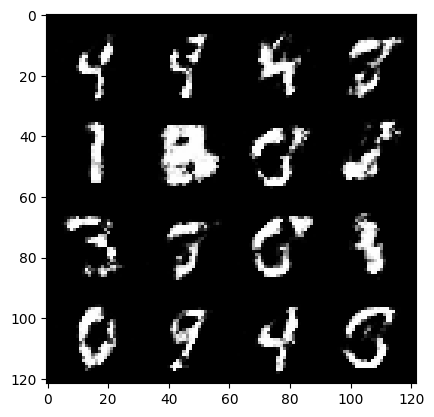

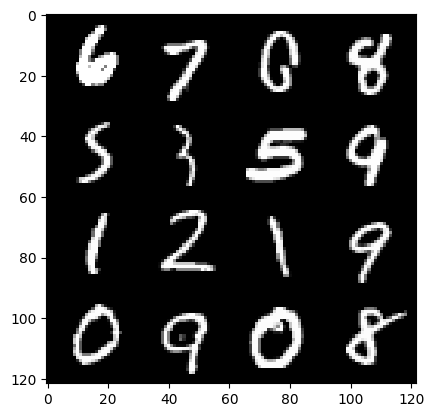

epoch : 187 , step :87900 , mean-disc-loss:  0.554174427688122 , mean-gen-loss 1.0641882836818695


  0%|          | 0/469 [00:00<?, ?it/s]

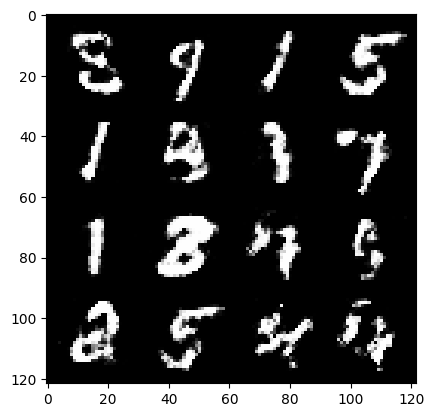

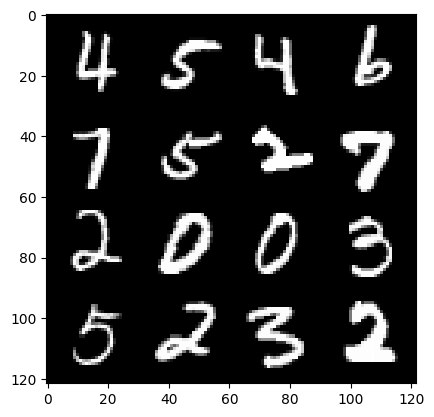

epoch : 188 , step :88200 , mean-disc-loss:  0.5415200173854828 , mean-gen-loss 1.0992387529214214


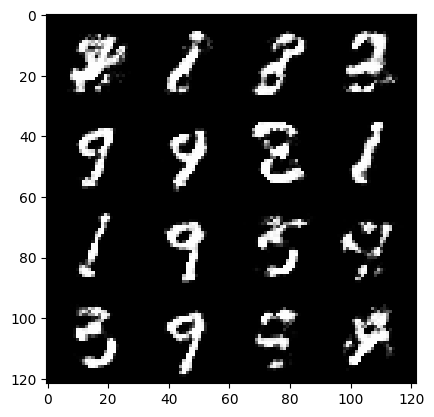

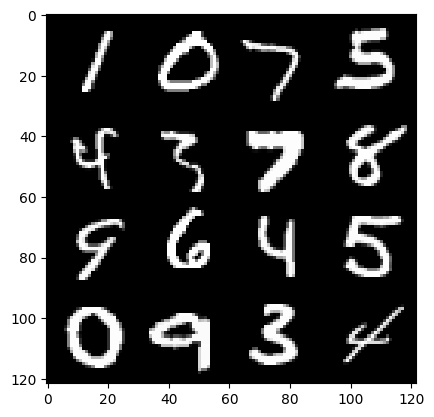

epoch : 188 , step :88500 , mean-disc-loss:  0.5682987831036248 , mean-gen-loss 1.0302979677915565


  0%|          | 0/469 [00:00<?, ?it/s]

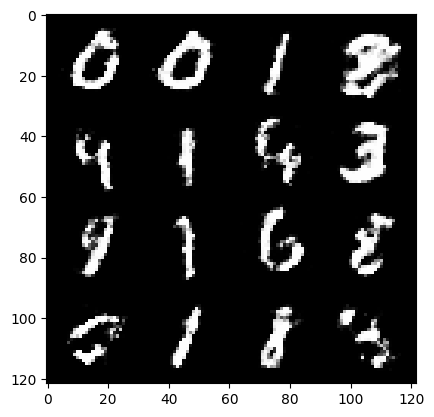

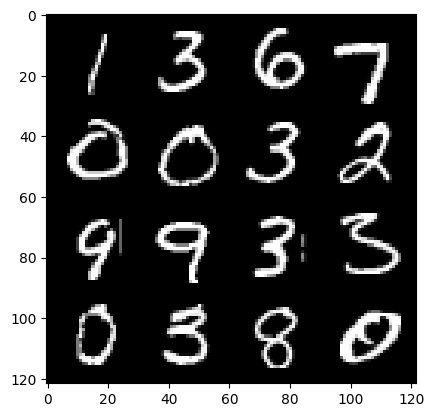

epoch : 189 , step :88800 , mean-disc-loss:  0.5452822232246399 , mean-gen-loss 1.0741061892112096


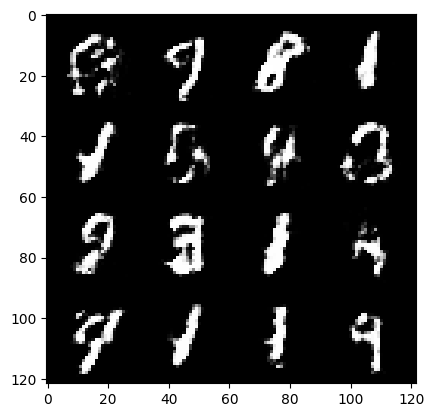

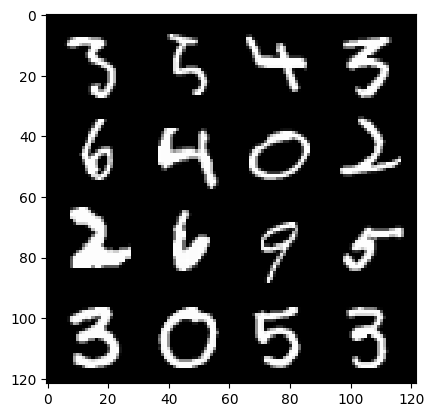

epoch : 189 , step :89100 , mean-disc-loss:  0.5502881286541621 , mean-gen-loss 1.0856745588779446


  0%|          | 0/469 [00:00<?, ?it/s]

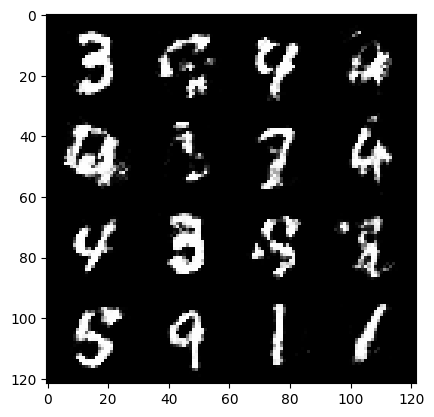

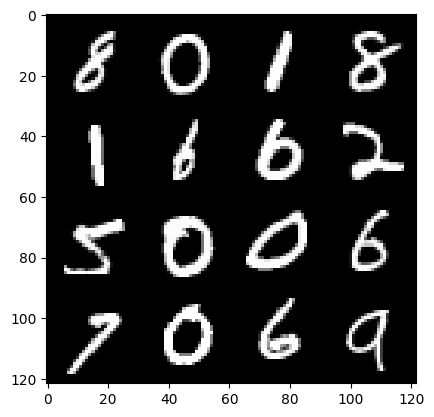

epoch : 190 , step :89400 , mean-disc-loss:  0.5363846627871195 , mean-gen-loss 1.1053140807151796


  0%|          | 0/469 [00:00<?, ?it/s]

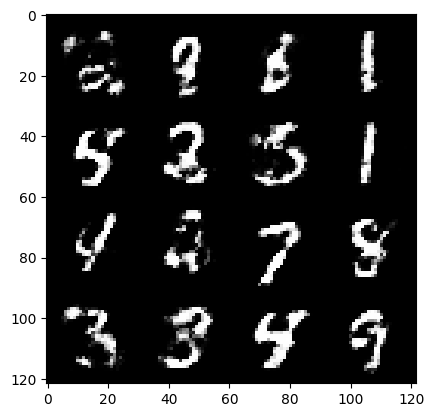

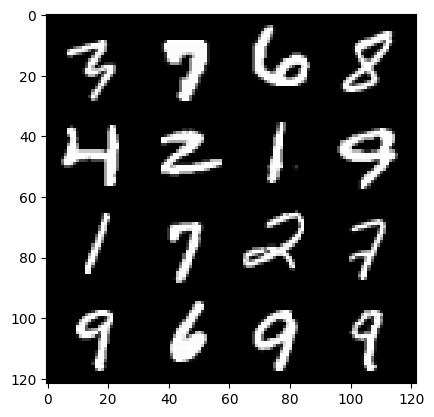

epoch : 191 , step :89700 , mean-disc-loss:  0.5484973299503331 , mean-gen-loss 1.0834316492080696


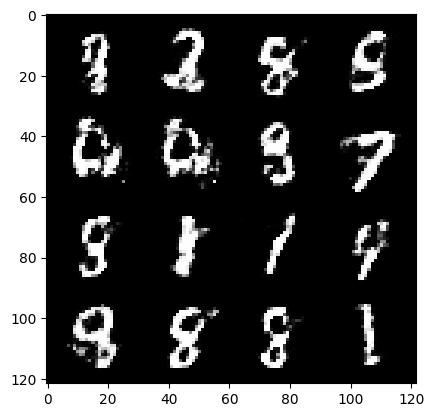

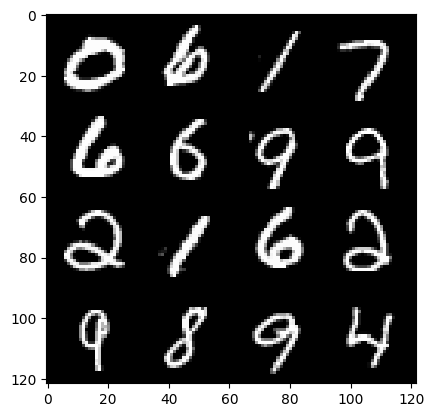

epoch : 191 , step :90000 , mean-disc-loss:  0.5262259391943617 , mean-gen-loss 1.117686563332875


  0%|          | 0/469 [00:00<?, ?it/s]

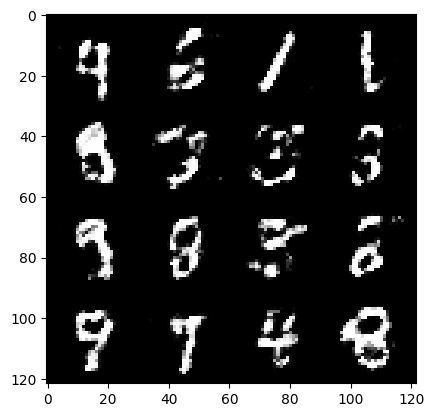

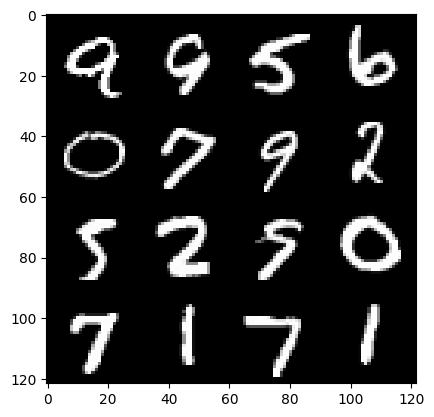

epoch : 192 , step :90300 , mean-disc-loss:  0.5239176782965663 , mean-gen-loss 1.1315436931451166


  0%|          | 0/469 [00:00<?, ?it/s]

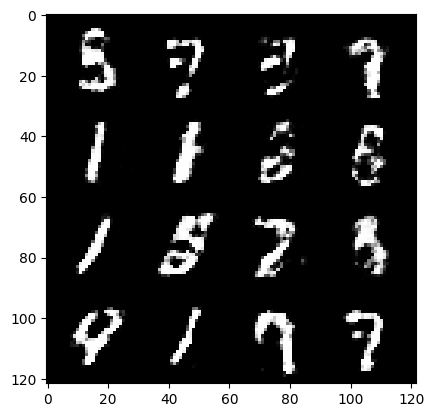

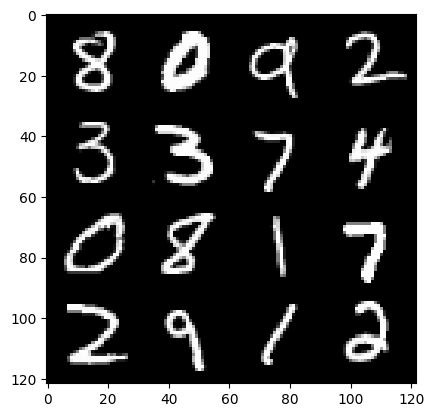

epoch : 193 , step :90600 , mean-disc-loss:  0.5248877411087355 , mean-gen-loss 1.1134216483434038


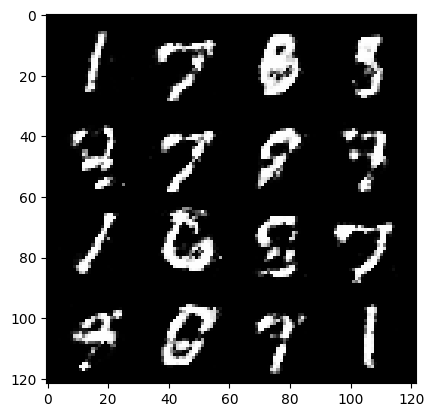

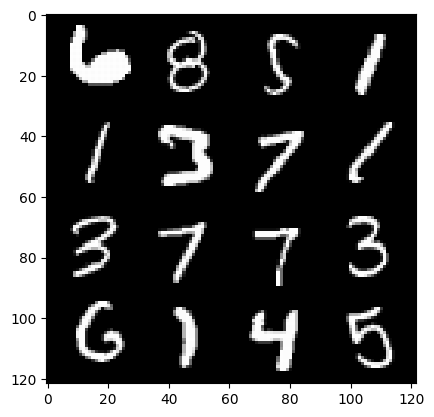

epoch : 193 , step :90900 , mean-disc-loss:  0.5478031919399902 , mean-gen-loss 1.0768736282984417


  0%|          | 0/469 [00:00<?, ?it/s]

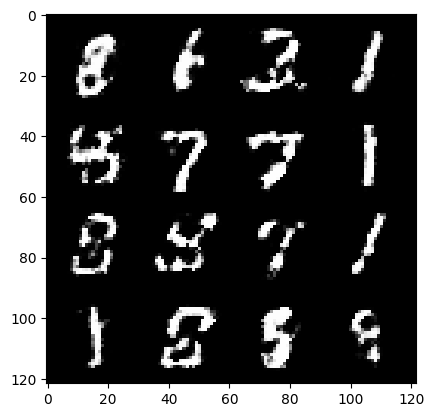

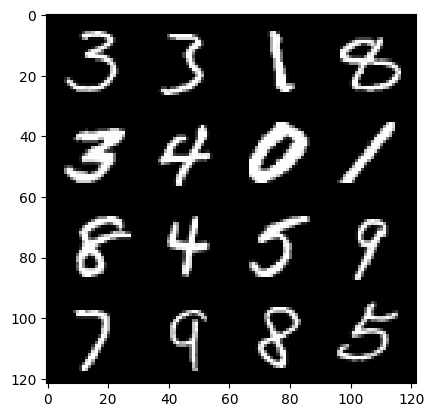

epoch : 194 , step :91200 , mean-disc-loss:  0.5475492950280507 , mean-gen-loss 1.047715622385342


  0%|          | 0/469 [00:00<?, ?it/s]

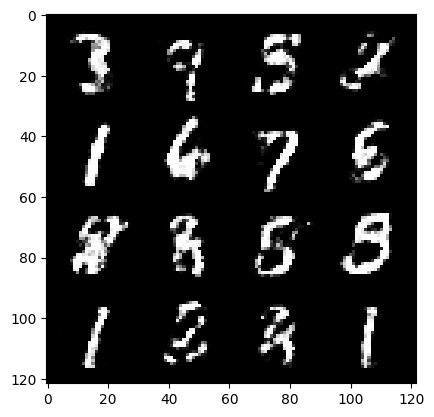

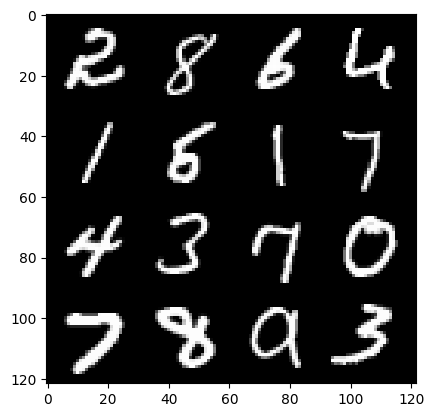

epoch : 195 , step :91500 , mean-disc-loss:  0.5275619813799857 , mean-gen-loss 1.1113987771670026


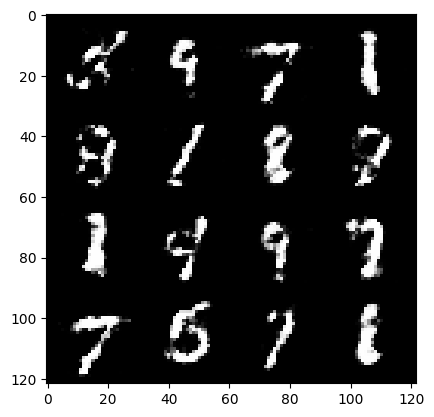

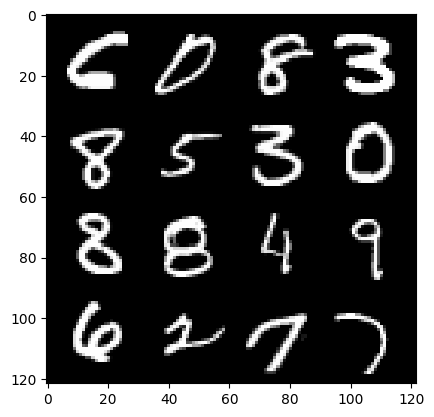

epoch : 195 , step :91800 , mean-disc-loss:  0.5498340198397637 , mean-gen-loss 1.0547811122735344


  0%|          | 0/469 [00:00<?, ?it/s]

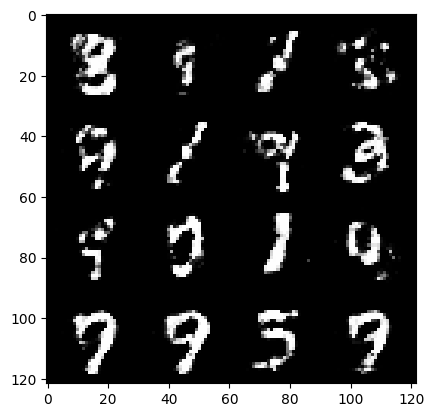

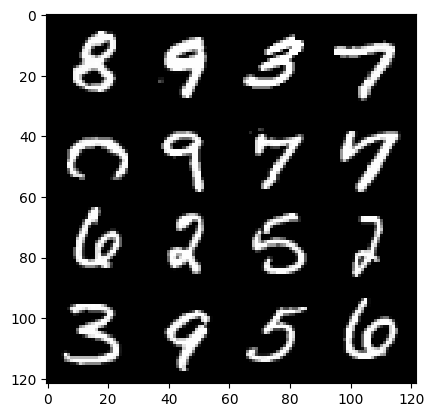

epoch : 196 , step :92100 , mean-disc-loss:  0.551387588381767 , mean-gen-loss 1.056442526976268


  0%|          | 0/469 [00:00<?, ?it/s]

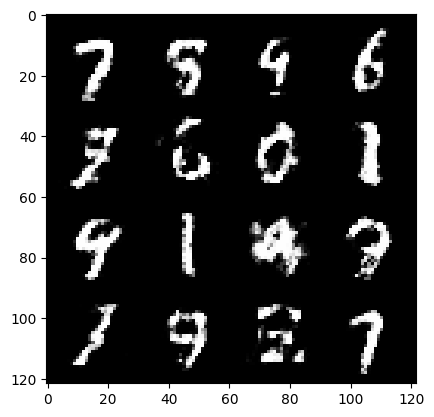

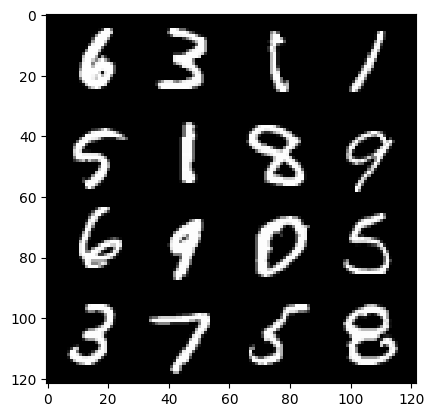

epoch : 197 , step :92400 , mean-disc-loss:  0.547780225872994 , mean-gen-loss 1.0685258539517717


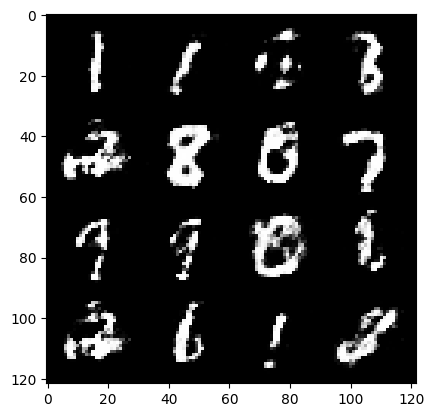

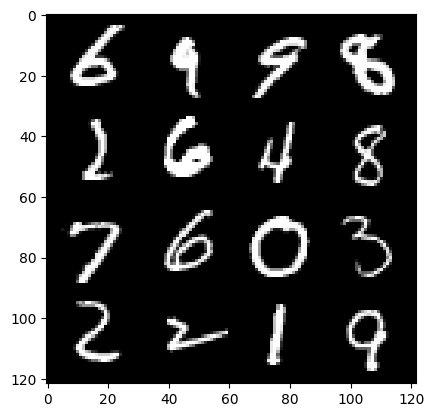

epoch : 197 , step :92700 , mean-disc-loss:  0.5419138835867247 , mean-gen-loss 1.0630519074201583


  0%|          | 0/469 [00:00<?, ?it/s]

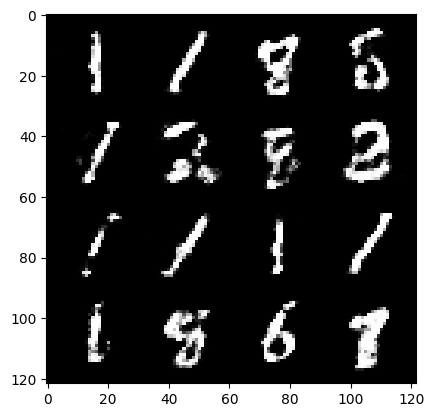

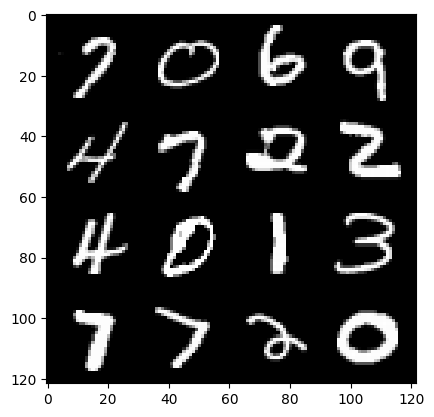

epoch : 198 , step :93000 , mean-disc-loss:  0.5348909202218055 , mean-gen-loss 1.084388759533565


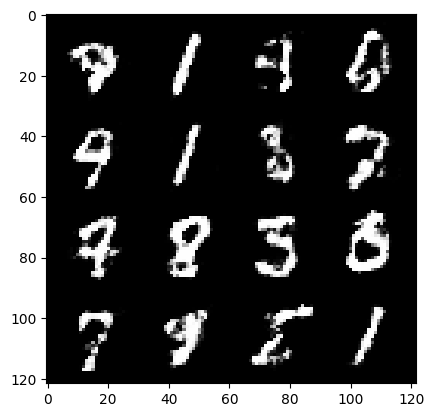

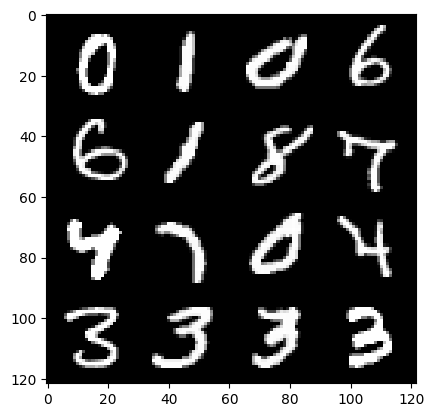

epoch : 198 , step :93300 , mean-disc-loss:  0.5269409523407621 , mean-gen-loss 1.1092614428202303


  0%|          | 0/469 [00:00<?, ?it/s]

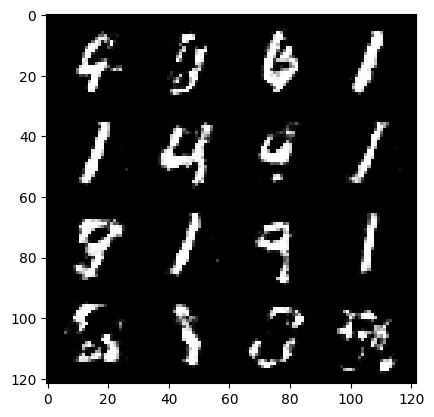

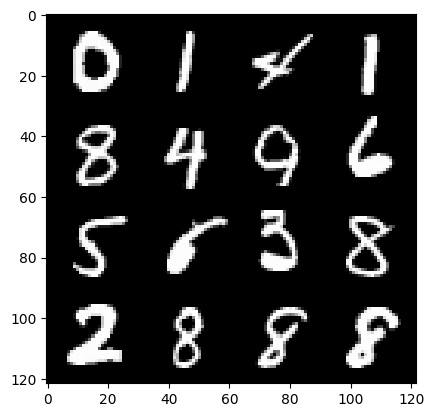

epoch : 199 , step :93600 , mean-disc-loss:  0.5385037556290625 , mean-gen-loss 1.1149441009759902


  0%|          | 0/469 [00:00<?, ?it/s]

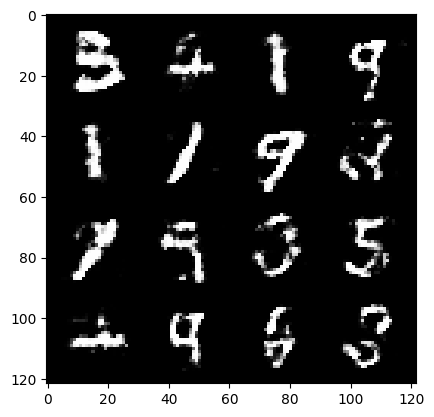

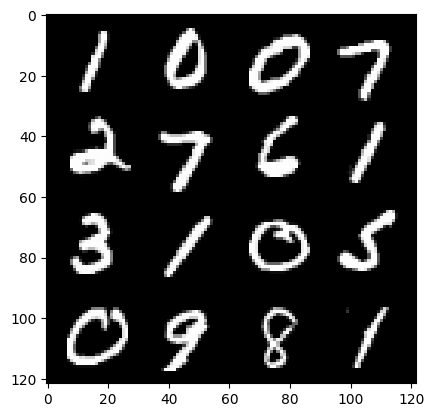

epoch : 200 , step :93900 , mean-disc-loss:  0.5661778058608374 , mean-gen-loss 1.042799451351167


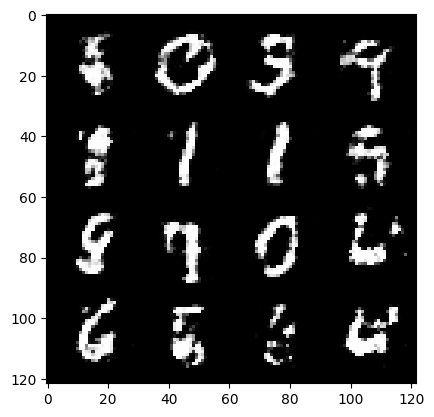

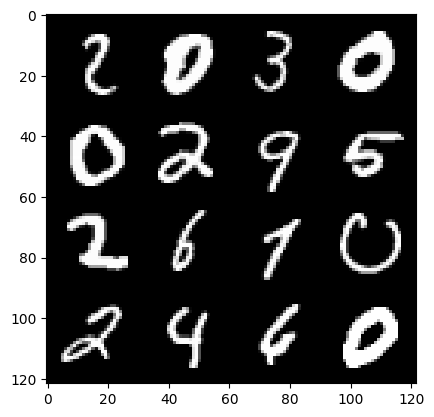

epoch : 200 , step :94200 , mean-disc-loss:  0.5475788417458531 , mean-gen-loss 1.0758323127031326


  0%|          | 0/469 [00:00<?, ?it/s]

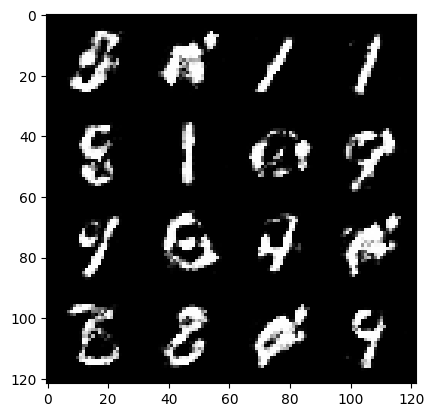

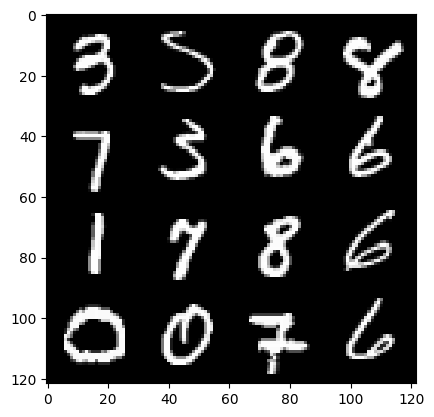

epoch : 201 , step :94500 , mean-disc-loss:  0.5632661753892898 , mean-gen-loss 1.045816612243652


  0%|          | 0/469 [00:00<?, ?it/s]

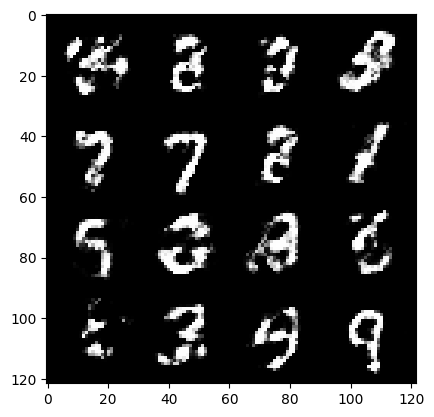

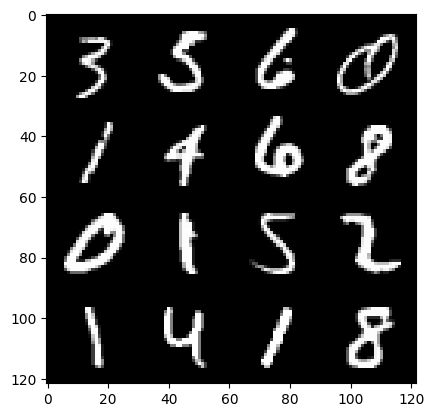

epoch : 202 , step :94800 , mean-disc-loss:  0.5818609545628225 , mean-gen-loss 0.9900379695494969


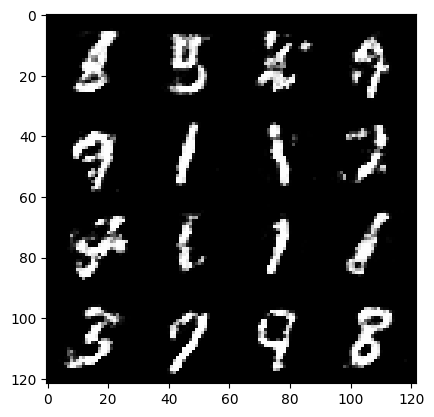

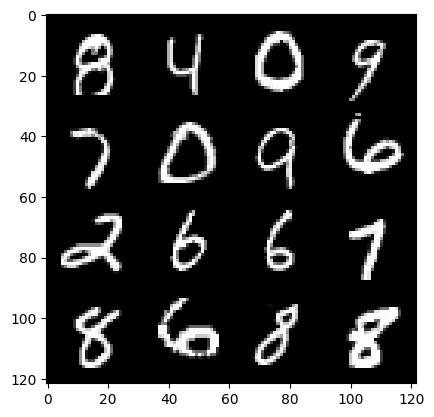

epoch : 202 , step :95100 , mean-disc-loss:  0.5532118541995686 , mean-gen-loss 1.0526329120000213


  0%|          | 0/469 [00:00<?, ?it/s]

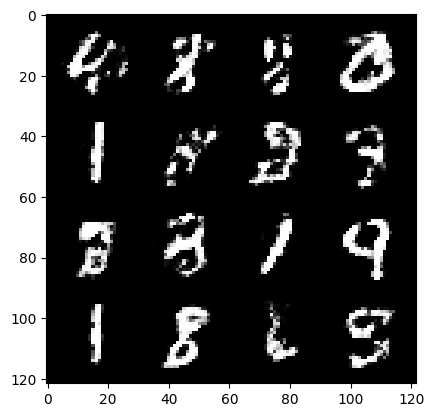

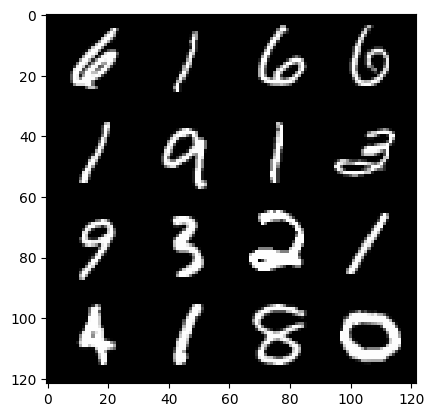

epoch : 203 , step :95400 , mean-disc-loss:  0.5604740687211355 , mean-gen-loss 1.0411130046844495


  0%|          | 0/469 [00:00<?, ?it/s]

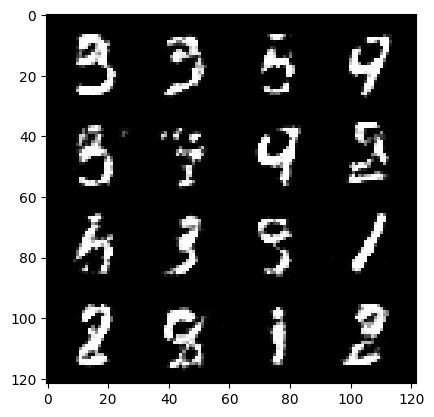

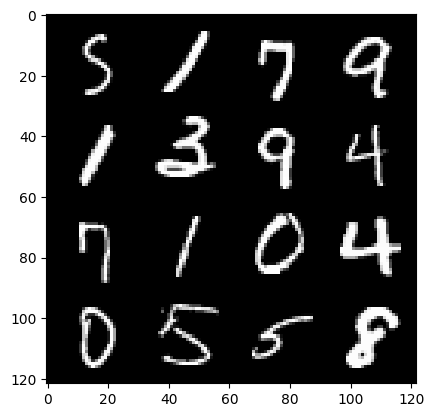

epoch : 204 , step :95700 , mean-disc-loss:  0.5499542319774628 , mean-gen-loss 1.0704842416445415


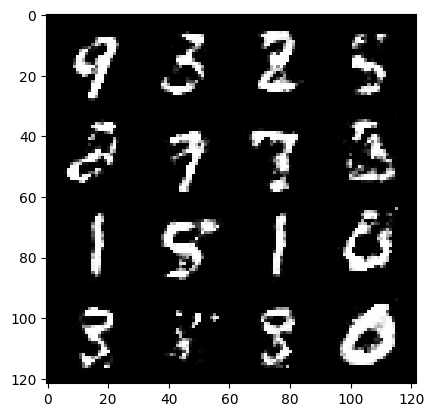

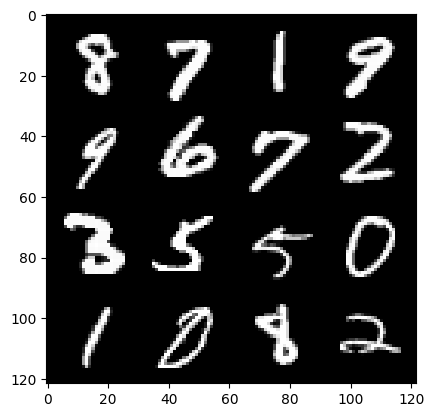

epoch : 204 , step :96000 , mean-disc-loss:  0.5528795879085859 , mean-gen-loss 1.0613571282227838


  0%|          | 0/469 [00:00<?, ?it/s]

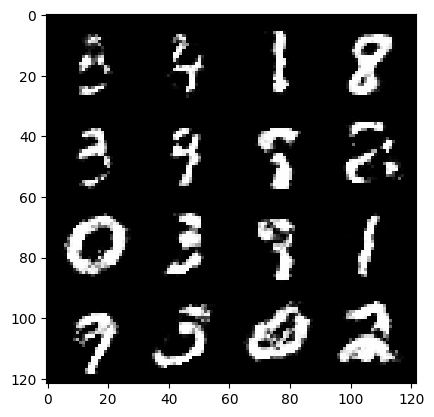

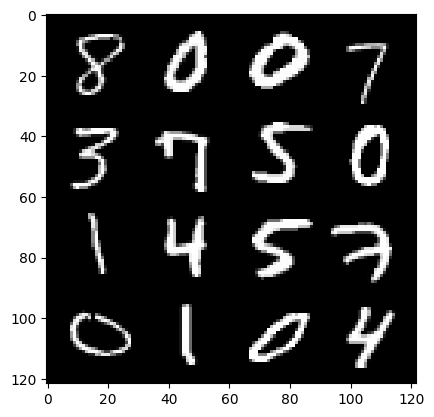

epoch : 205 , step :96300 , mean-disc-loss:  0.5634026389320697 , mean-gen-loss 1.0378819447755816


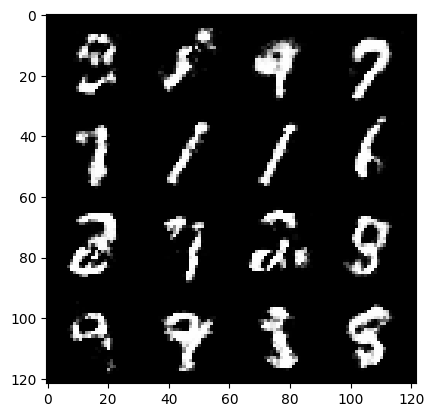

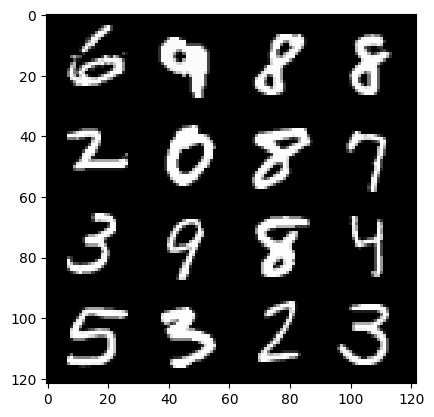

epoch : 205 , step :96600 , mean-disc-loss:  0.547942291299502 , mean-gen-loss 1.0523306725422539


  0%|          | 0/469 [00:00<?, ?it/s]

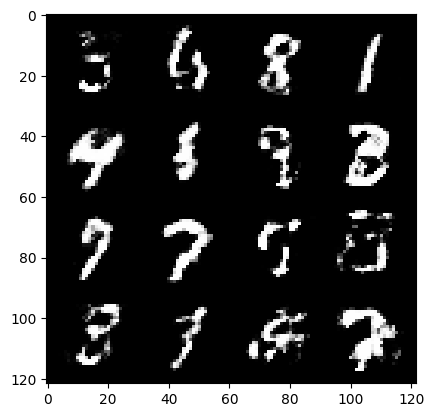

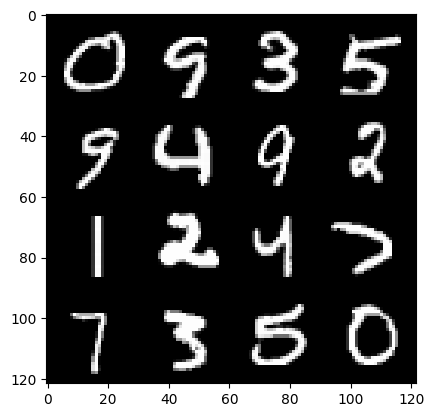

epoch : 206 , step :96900 , mean-disc-loss:  0.5533710521459574 , mean-gen-loss 1.0446863454580309


  0%|          | 0/469 [00:00<?, ?it/s]

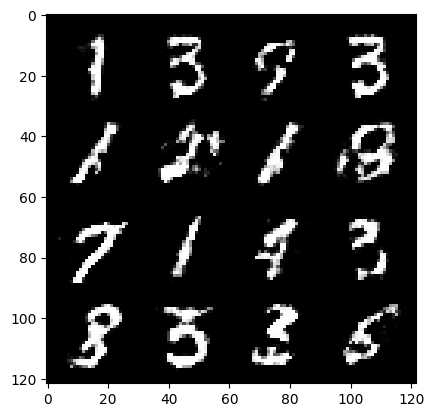

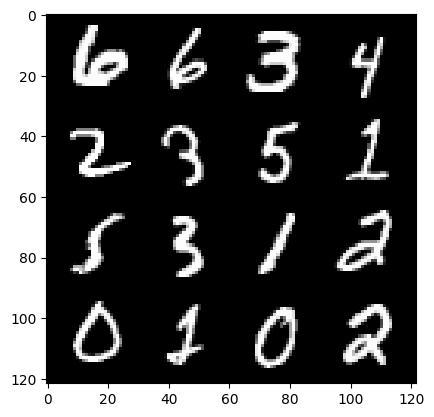

epoch : 207 , step :97200 , mean-disc-loss:  0.5523524059851967 , mean-gen-loss 1.058976891239484


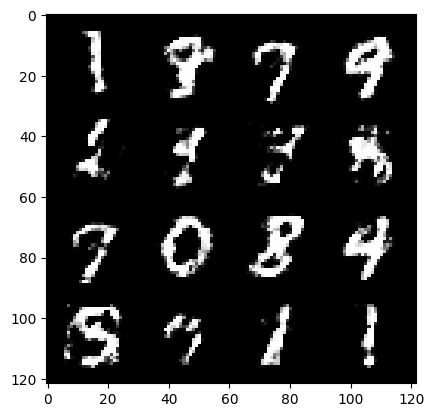

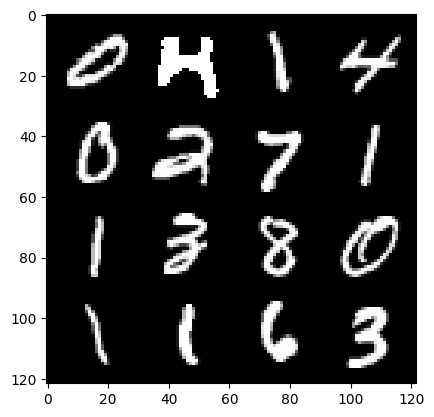

epoch : 207 , step :97500 , mean-disc-loss:  0.5526120280226073 , mean-gen-loss 1.0391317409276957


  0%|          | 0/469 [00:00<?, ?it/s]

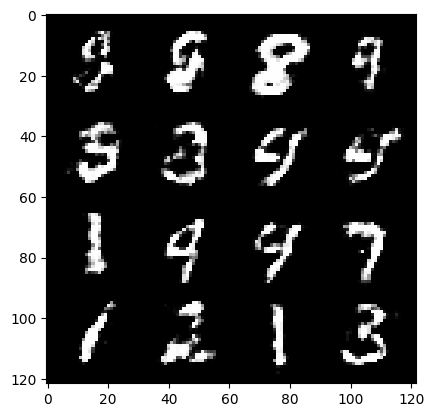

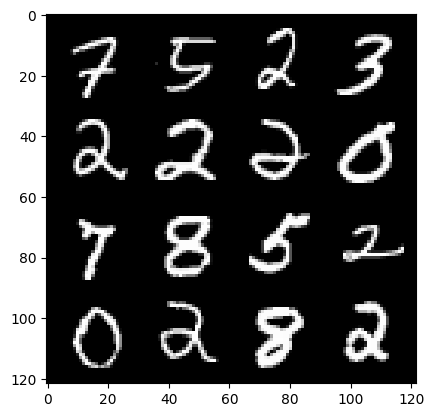

epoch : 208 , step :97800 , mean-disc-loss:  0.5701690729459122 , mean-gen-loss 0.9942775960763297


  0%|          | 0/469 [00:00<?, ?it/s]

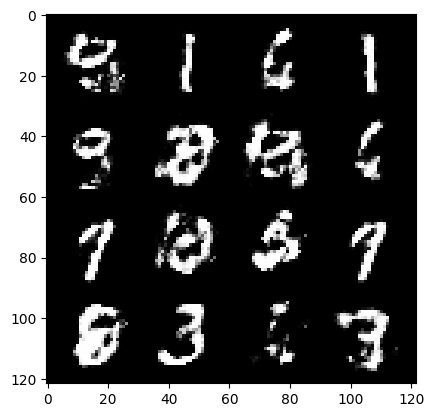

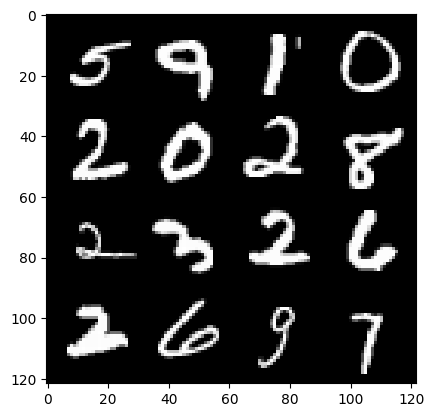

epoch : 209 , step :98100 , mean-disc-loss:  0.5776435808340716 , mean-gen-loss 0.9789240260918931


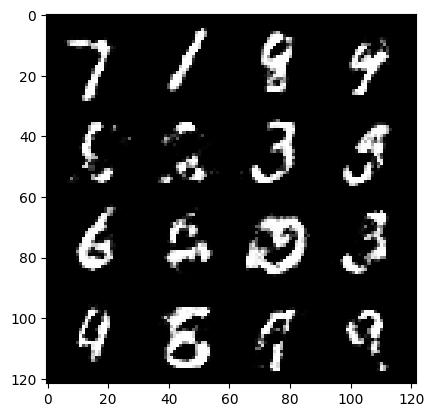

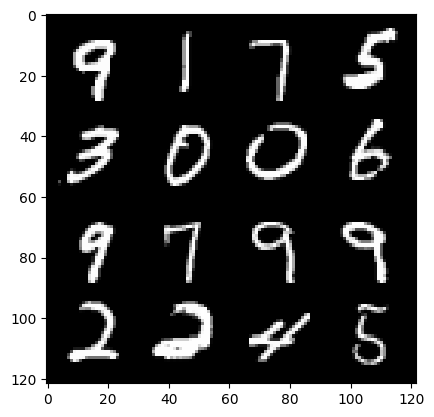

epoch : 209 , step :98400 , mean-disc-loss:  0.607873257001241 , mean-gen-loss 0.9454584223031997


  0%|          | 0/469 [00:00<?, ?it/s]

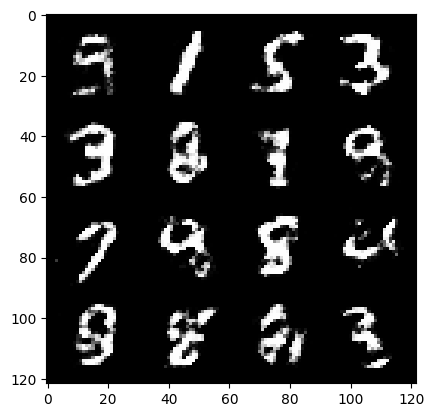

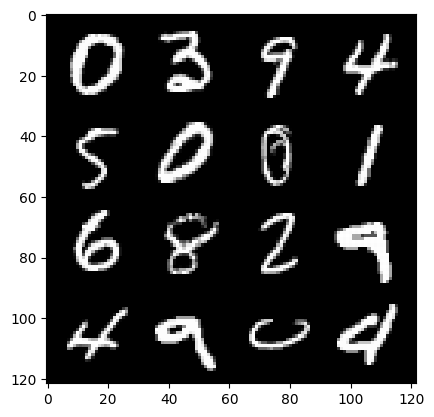

epoch : 210 , step :98700 , mean-disc-loss:  0.5779903024435041 , mean-gen-loss 0.9875787653525667


  0%|          | 0/469 [00:00<?, ?it/s]

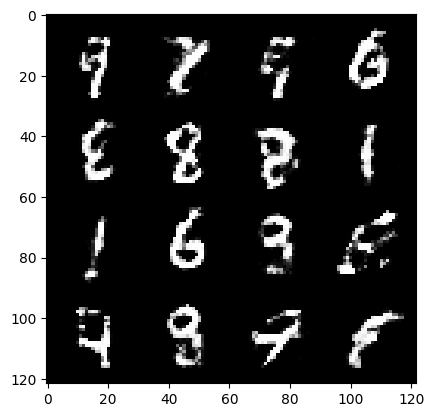

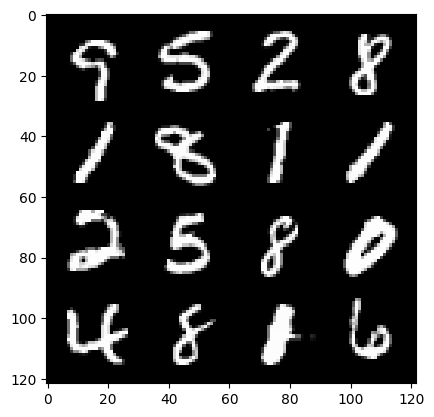

epoch : 211 , step :99000 , mean-disc-loss:  0.5633830808599787 , mean-gen-loss 1.036446170012155


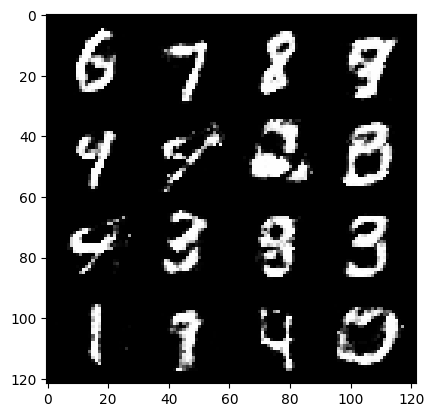

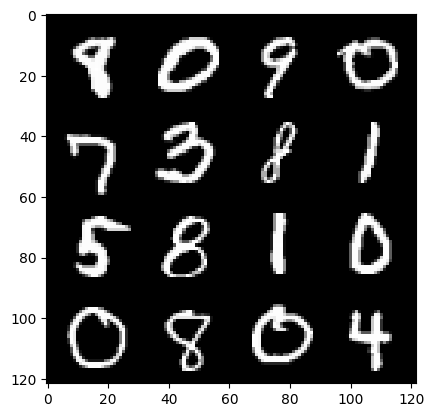

epoch : 211 , step :99300 , mean-disc-loss:  0.5858835937579475 , mean-gen-loss 0.9764144341150917


  0%|          | 0/469 [00:00<?, ?it/s]

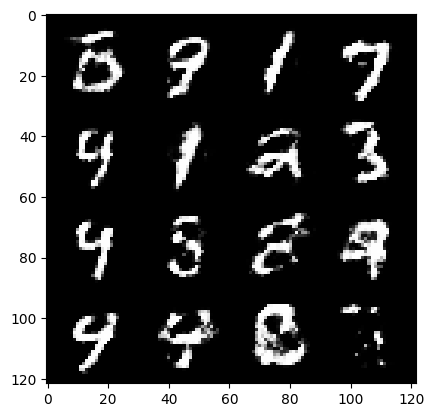

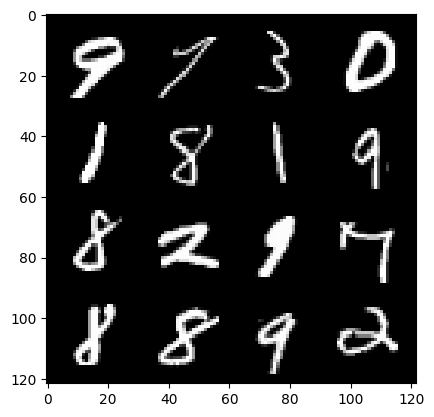

epoch : 212 , step :99600 , mean-disc-loss:  0.5896448594331747 , mean-gen-loss 0.9715467278162644


  0%|          | 0/469 [00:00<?, ?it/s]

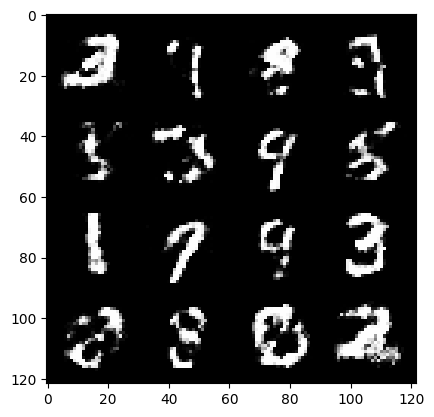

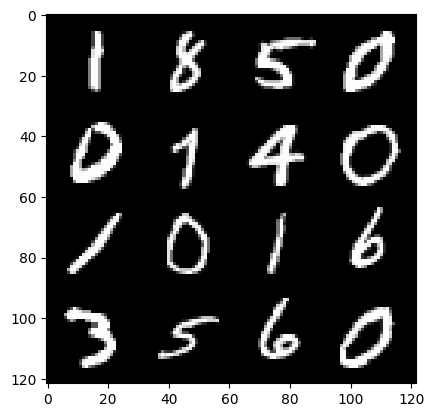

epoch : 213 , step :99900 , mean-disc-loss:  0.5816305544972419 , mean-gen-loss 0.9616450335582095


In [62]:


for epoch in range(epochs):

    for real,_ in tqdm(dataloader):

        #disc
        disc_opt.zero_grad()

        curr_bs=len(real) # most of  tiems 128

        real=real.view(curr_bs,-1) # 128*1*28*28 -> 128*784
        # print(real.shape)
        real=real.to(device)

        disc_loss=cal_dis_loss(loss_func,gen,disc,curr_bs,real,z_dim)

        disc_loss.backward(retain_graph=True)

        disc_opt.step()

        #gen

        gen_opt.zero_grad()

        gen_loss=cal_gen_loss(loss_func,gen,disc,curr_bs,z_dim)

        gen_loss.backward(retain_graph=True)

        gen_opt.step()


        mean_dis_loss+=disc_loss.item()/info_step
        mean_gen_loss+=gen_loss.item()/info_step

        if cur_step %  info_step==0 and cur_step>0:
            fake_noise=gen_noise(curr_bs,z_dim)
            fake=gen(fake_noise)
            show(fake)
            show(real)
            print(f'epoch : {epoch} , step :{cur_step} , mean-disc-loss:  {mean_dis_loss} , mean-gen-loss {mean_gen_loss}')
            mean_gen_loss=0
            mean_dis_loss=0
        cur_step+=1

